## Import Data

In [ ]:
# % pip install pandas

In [1]:
import os
from tqdm import tqdm
import numpy as np
import pandas as pd
from scipy.ndimage import gaussian_filter

def get_data(all_sessions_path, dt, gc_or_not=True):
    n_data_s = []
    f_data_s = []
    meta_data_s = []  # 🌟 新增：用于存储 Session 的元数据
    neuron_ids_s = []
    global_id = 0

    all_sessions_path = sorted(all_sessions_path)
    pending_original = None

    for file in tqdm(all_sessions_path):
        session_name = os.path.basename(file)
        print(f"\nReading: {session_name}")
        
        try:
            headstage_path = os.path.join(file, 'headstage_0')
            
            n_data = np.load(os.path.join(headstage_path, f'data_{dt}.npy'))
            f_data_raw = np.load(os.path.join(headstage_path, f'features_{dt}.npy'), allow_pickle=True)
            f_data = pd.DataFrame(list(f_data_raw))
            
            if gc_or_not:
                gc = np.load(os.path.join(headstage_path, 'good_clusters.npy'))
            else:
                gc = np.arange(len(n_data))
            n_data = n_data[gc, :].astype(float)

            # 🌟 新增：将真实的物理文件夹名称烙印在每一帧数据上
            if 'Recording_File' not in f_data.columns:
                f_data['Recording_File'] = session_name

            # 智能侦测
            is_inverse = False
            if 'Condition' in f_data.columns:
                unique_conds = set(f_data['Condition'].dropna().unique())
                if 1.0 in unique_conds or 1 in unique_conds:
                    is_inverse = True
            
            # ==============================================================
            # 场景 A：它是 Original
            # ==============================================================
            if not is_inverse:
                print(f"   >>> [指纹识别] 这是一个 Original Session。")
                
                # 防丢机制
                if pending_original is not None:
                    print(f"   ⚠️ 警告：发现连续的 Original！前一个 [{pending_original['name']}] 缺少对应的 Inverse。")
                    print(f"   💾 动作：将其作为独立的 Original 数据保存，不予丢弃！")
                    n_data_s.append(pending_original['n_data'])
                    f_data_s.append(pending_original['f_data'])
                    
                    # 🌟 记录元数据
                    meta_data_s.append({
                        'Session_Idx': len(n_data_s) - 1,
                        'Combined_Name': f"{pending_original['name']} (Orphan)",
                        'Original_File': pending_original['name'],
                        'Inverse_File': None
                    })
                    
                    N_neurons = len(pending_original['n_data'])
                    neuron_ids_s.append(list(range(global_id, global_id + N_neurons)))
                    global_id += N_neurons

                f_data['Mapping_Type'] = 0
                
                if 'Condition' in f_data.columns:
                    f_data['Condition'] = f_data['Condition'].replace({-1.0: 0.0, 0.0: -1.0})
                
                pending_original = {
                    'name': session_name,
                    'n_data': n_data,
                    'f_data': f_data
                }
                print(f"   >>> 已存入缓存等候室，等待下一个 Inverse 与之配对...")
                continue
                
            # ==============================================================
            # 场景 B：它是 Inverse
            # ==============================================================
            else:
                print(f"   >>> [指纹识别] 这是一个 Inverse Session。")
                f_data['Mapping_Type'] = 1
                
                if pending_original is not None:
                    orig_name = pending_original['name']
                    n_data1 = pending_original['n_data']
                    f_data1 = pending_original['f_data']
                    
                    print(f"\n   🔄 开始配对合并: [{orig_name}] + [{session_name}]")
                    n_data = np.concatenate((n_data1, n_data), axis=1)
                    f_data = pd.concat([f_data1, f_data], ignore_index=True)
                    
                    # 🌟 记录元数据 (正常配对)
                    current_meta = {
                        'Session_Idx': len(n_data_s),
                        'Combined_Name': f"{orig_name} & {session_name}",
                        'Original_File': orig_name,
                        'Inverse_File': session_name
                    }
                    pending_original = None
                else:
                    print(f"   ⚠️ 警告：发现了 Inverse ({session_name})，但前面没有 Original！将作为独立数据保存。")
                    # 🌟 记录元数据 (孤立 Inverse)
                    current_meta = {
                        'Session_Idx': len(n_data_s),
                        'Combined_Name': f"{session_name} (Only Inv)",
                        'Original_File': None,
                        'Inverse_File': session_name
                    }
            # ==============================================================

            # 缺列补齐
            if 'Mock_frequency' not in f_data.columns:
                f_data['Mock_frequency'] = np.nan
            if 'Played_frequency' not in f_data.columns:
                f_data['Played_frequency'] = np.nan

            N_neurons = len(n_data)
            neuron_ids = list(range(global_id, global_id + N_neurons))
            global_id += N_neurons
            neuron_ids_s.append(neuron_ids)

            unique_tones_path = r"C:\Users\PenPen\Desktop\Ferret\Data\Bohan\unique_tones\unique_tones.npy"
            unique_tones = np.load(unique_tones_path)
            unique_tones_sorted = np.sort(unique_tones)
            pixels_sorted = np.linspace(0, 28, len(unique_tones_sorted))

            positional_freq = np.where(
                f_data['Condition'].isin([0, -1]),
                f_data['Played_frequency'],
                f_data['Mock_frequency']
            )
            positional_freq = np.nan_to_num(positional_freq, nan=unique_tones_sorted[0])
            
            positions = np.interp(positional_freq, unique_tones_sorted, pixels_sorted)
            pos_smooth = gaussian_filter(positions, sigma=10)
            f_data['Position'] = pos_smooth

            speed_x = np.append(0, np.diff(pos_smooth))
            f_data['Speed_x'] = np.abs(speed_x) * 100
            
            freq_raw = np.nan_to_num(f_data['Played_frequency'], nan=unique_tones_sorted[0])
            freq_pos = np.interp(freq_raw, unique_tones_sorted, pixels_sorted)
            freq_pos_smooth = gaussian_filter(freq_pos, sigma=10)
            sound_speed = np.append(0, np.diff(freq_pos_smooth))
            f_data['Sound_speed'] = np.abs(sound_speed) * 100
            f_data['Freq_position'] = freq_pos_smooth

            speed_bins = [0, 0.01, 1, 2, 3, 4, 5, 6, np.inf]
            f_data['Speed_bin'] = pd.cut(f_data['Speed_x'], bins=speed_bins, labels=False, include_lowest=True)
            f_data["Acc_x"] = np.diff(f_data['Speed_x'], prepend=f_data['Speed_x'].iloc[0])

            n_data_o = n_data - n_data.mean(axis=1, keepdims=True)
            n_data_smooth = gaussian_filter(n_data_o, sigma=1, axes=1)
            
            n_data_s.append(n_data_smooth)
            f_data_s.append(f_data)
            meta_data_s.append(current_meta) # 🌟 追加元数据

        except Exception as e:
            print(f"❌ Error in {session_name}: {e}")
            
    # 收尾机制：处理末尾孤立的 Original
    if pending_original is not None:
        print(f"\n⚠️ 警告: 结尾处发现孤立的 Original Session [{pending_original['name']}]。")
        
        f_data_orphan = pending_original['f_data']
        n_data_orphan = pending_original['n_data']
        
        if 'Mock_frequency' not in f_data_orphan.columns:
            f_data_orphan['Mock_frequency'] = np.nan
        if 'Played_frequency' not in f_data_orphan.columns:
            f_data_orphan['Played_frequency'] = np.nan
            
        positional_freq = np.where(f_data_orphan['Condition'].isin([0, -1]), f_data_orphan['Played_frequency'], f_data_orphan['Mock_frequency'])
        positional_freq = np.nan_to_num(positional_freq, nan=unique_tones_sorted[0])
        positions = np.interp(positional_freq, unique_tones_sorted, pixels_sorted)
        f_data_orphan['Position'] = gaussian_filter(positions, sigma=10)
        
        speed_x = np.append(0, np.diff(f_data_orphan['Position']))
        f_data_orphan['Speed_x'] = np.abs(speed_x) * 100
        f_data_orphan["Acc_x"] = np.diff(f_data_orphan['Speed_x'], prepend=f_data_orphan['Speed_x'].iloc[0])
        
        freq_raw = np.nan_to_num(f_data_orphan['Played_frequency'], nan=unique_tones_sorted[0])
        freq_pos = np.interp(freq_raw, unique_tones_sorted, pixels_sorted)
        f_data_orphan['Freq_position'] = gaussian_filter(freq_pos, sigma=10)
        
        sound_speed = np.append(0, np.diff(f_data_orphan['Freq_position']))
        f_data_orphan['Sound_speed'] = np.abs(sound_speed) * 100
        
        f_data_orphan['Speed_bin'] = pd.cut(f_data_orphan['Speed_x'], bins=speed_bins, labels=False, include_lowest=True)
        
        n_data_o = n_data_orphan - n_data_orphan.mean(axis=1, keepdims=True)
        n_data_smooth = gaussian_filter(n_data_o, sigma=1, axes=1)
        
        n_data_s.append(n_data_smooth)
        f_data_s.append(f_data_orphan)
        
        # 🌟 记录收尾元数据
        meta_data_s.append({
            'Session_Idx': len(n_data_s) - 1,
            'Combined_Name': f"{pending_original['name']} (Orphan)",
            'Original_File': pending_original['name'],
            'Inverse_File': None
        })
        
        N_neurons = len(n_data_orphan)
        neuron_ids_s.append(list(range(global_id, global_id + N_neurons)))

    # 🌟 函数返回值增加了一个：meta_data_s
    return n_data_s, f_data_s, meta_data_s

In [1]:
import os
from tqdm import tqdm
import numpy as np
import pandas as pd
from scipy.ndimage import gaussian_filter

def get_data(all_sessions_path, dt, dataset_type="MP2", expect_pairs=True, gc_or_not=True):
    n_data_s = []
    f_data_s = []
    neuron_ids_s = []
    global_id = 0

    unique_tones_path = r"C:\Users\PenPen\Desktop\Ferret\Data\Bohan\unique_tones\unique_tones.npy"
    unique_tones = np.load(unique_tones_path)
    unique_tones_sorted = np.sort(unique_tones)
    pixels_sorted = np.linspace(0, 28, len(unique_tones_sorted))
    speed_bins = [0, 0.01, 1, 2, 3, 4, 5, 6, np.inf]

    # =================================================================
    # 核心引擎：统一负责物理特征计算与保存
    # =================================================================
    def process_and_store(n_mat, f_df, current_id):
        if 'Mock_frequency' not in f_df.columns:
            f_df['Mock_frequency'] = np.nan
        if 'Played_frequency' not in f_df.columns:
            f_df['Played_frequency'] = np.nan

        positional_freq = np.where(
            f_df['Condition'].isin([0, -1]),
            f_df['Played_frequency'],
            f_df['Mock_frequency']
        )
        positional_freq = np.nan_to_num(positional_freq, nan=unique_tones_sorted[0])
        positions = np.interp(positional_freq, unique_tones_sorted, pixels_sorted)
        f_df['Position'] = gaussian_filter(positions, sigma=10)

        speed_x = np.append(0, np.diff(f_df['Position']))
        f_df['Speed_x'] = np.abs(speed_x) * 100
        f_df["Acc_x"] = np.diff(f_df['Speed_x'], prepend=f_df['Speed_x'].iloc[0])

        freq_raw = np.nan_to_num(f_df['Played_frequency'], nan=unique_tones_sorted[0])
        freq_pos = np.interp(freq_raw, unique_tones_sorted, pixels_sorted)
        f_df['Freq_position'] = gaussian_filter(freq_pos, sigma=10)
        sound_speed = np.append(0, np.diff(f_df['Freq_position']))
        f_df['Sound_speed'] = np.abs(sound_speed) * 100

        f_df['Speed_bin'] = pd.cut(f_df['Speed_x'], bins=speed_bins, labels=False, include_lowest=True)
        n_mat_o = n_mat - n_mat.mean(axis=1, keepdims=True)
        n_mat_smooth = gaussian_filter(n_mat_o, sigma=1, axes=1)

        n_data_s.append(n_mat_smooth)
        f_data_s.append(f_df)
        
        N_neurons = len(n_mat_smooth)
        neuron_ids_s.append(list(range(current_id, current_id + N_neurons)))
        
        return current_id + N_neurons
    # =================================================================

    all_sessions_path = sorted(all_sessions_path)
    pending_original = None

    for file in tqdm(all_sessions_path):
        session_name = os.path.basename(file)
        print(f"\nReading [{dataset_type}]: {session_name}")
        
        try:
            headstage_path = os.path.join(file, 'headstage_0')
            n_data = np.load(os.path.join(headstage_path, f'data_{dt}.npy'))
            f_data_raw = np.load(os.path.join(headstage_path, f'features_{dt}.npy'), allow_pickle=True)
            f_data = pd.DataFrame(list(f_data_raw))
            f_data['Dataset_Type'] = dataset_type

            if gc_or_not:
                gc = np.load(os.path.join(headstage_path, 'good_clusters.npy'))
            else:
                gc = np.arange(len(n_data))
            n_data = n_data[gc, :].astype(float)

            # 🌟 回归真理：只看有没有 PB (Condition 1.0) 🌟
            has_pb = False
            if 'Condition' in f_data.columns:
                unique_conds = set(f_data['Condition'].dropna().unique())
                if any(c in unique_conds for c in [1, 1.0]):
                    has_pb = True

            # 【严格保留原版逻辑】：只要没有 PB，就需要翻转 Condition 标记
            if not has_pb:
                if 'Condition' in f_data.columns:
                    f_data['Condition'] = f_data['Condition'].replace({-1.0: 0.0, 0.0: -1.0})

            # -------------------------------------------------------------
            # 分支 1：独立模式 (不配对，拿到什么算什么)
            # -------------------------------------------------------------
            if not expect_pairs:
                f_data['Mapping_Type'] = 'Standalone'
                print(f"   >>> [独立模式] 侦测到 {dataset_type}，跳过配对直接保存。")
                global_id = process_and_store(n_data, f_data, global_id)

            # -------------------------------------------------------------
            # 分支 2：配对模式 (TR-only 等待 TR+PB 合并)
            # -------------------------------------------------------------
            else:
                if not has_pb:
                    f_data['Mapping_Type'] = 'MP1'
                    print(f"   >>> [指纹识别] {dataset_type} Original (无 PB)。")
                    
                    if pending_original is not None:
                        print(f"   ⚠️ 警告：发现连续的 Original！保存上一个: [{pending_original['name']}]。")
                        global_id = process_and_store(pending_original['n_data'], pending_original['f_data'], global_id)
                    
                    pending_original = {'name': session_name, 'n_data': n_data, 'f_data': f_data}
                    print("   >>> 已存入等候室，等待包含 PB 的 Inverse 数据...")

                else:
                    f_data['Mapping_Type'] = 'MP2'
                    print(f"   >>> [指纹识别] {dataset_type} Inverse (包含 PB)。")
                    
                    if pending_original is not None:
                        orig_name = pending_original['name']
                        print(f"\n   🔄 开始配对合并: [{orig_name}] + [{session_name}]")
                        n_data_merged = np.concatenate((pending_original['n_data'], n_data), axis=1)
                        f_data_merged = pd.concat([pending_original['f_data'], f_data], ignore_index=True)
                        
                        print("   ✅ 合并完成，送入计算流...")
                        global_id = process_and_store(n_data_merged, f_data_merged, global_id)
                        pending_original = None
                    else:
                        print("   ⚠️ 警告：孤立的 Inverse！前面没有 Original。作为独立数据保存。")
                        global_id = process_and_store(n_data, f_data, global_id)

            # 打印统计
            print("   --- Condition 统计 ---")
            if 'Condition' in f_data.columns:
                conditions = f_data['Condition'].dropna().values
                for c in np.unique(conditions):
                    print(f"     Condition {c}: 约 {np.sum(conditions == c) * dt:.2f} 秒")
            print("-" * 50)

        except Exception as e:
            print(f"❌ Error in {session_name}: {e}")
            
    # 【收尾机制】
    if pending_original is not None:
        print(f"\n⚠️ 警告: 结尾处发现孤立的 Original [{pending_original['name']}]。执行最终保存。")
        global_id = process_and_store(pending_original['n_data'], pending_original['f_data'], global_id)

    return n_data_s, f_data_s

In [2]:
dt = 0.005

base_path = r"\\129.199.81.18\data6\eTheremin\SKIEUR" 

# 📁 1. 只有 TR 的 MP1 数据 (不需要配对)
paths_mp1_tr_only = []
#     "SKIEUR_20260316_SESSION_01",
#     "SKIEUR_20260317_SESSION_00",
#     "SKIEUR_20260317_SESSION_02",
#     "SKIEUR_20260318_SESSION_00",
#     "SKIEUR_20260319_SESSION_00",
#     "SKIEUR_20260319_SESSION_02",
#     "SKIEUR_20260320_SESSION_00",
#     "SKIEUR_20260323_SESSION_00",
#     "SKIEUR_20260323_SESSION_02",
#     "SKIEUR_20260325_SESSION_00",
#     "SKIEUR_20260325_SESSION_02",
#     "SKIEUR_20260327_SESSION_00",
#     "SKIEUR_20260327_SESSION_03"
# ]

# 📁 2. 包含 TR 和 PB 的 MP1 数据 (需要配对合并)
paths_mp1_paired = [
    "SKIEUR_20260309_SESSION_00",
    "SKIEUR_20260309_SESSION_01",
    "SKIEUR_20260310_SESSION_00",
    "SKIEUR_20260310_SESSION_01",
    "SKIEUR_20260311_SESSION_00",
    "SKIEUR_20260311_SESSION_01"
    "SKIEUR_20260312_SESSION_00",
    "SKIEUR_20260312_SESSION_01",
    "SKIEUR_20260313_SESSION_00",
    "SKIEUR_20260313_SESSION_01",
    "SKIEUR_20260314_SESSION_00",
    "SKIEUR_20260314_SESSION_01"
    "SKIEUR_20260315_SESSION_00",
    "SKIEUR_20260316_SESSION_00",
    "SKIEUR_20260316_SESSION_01"
]

# # 📁 3. 包含 TR 和 PB 的 MP2 数据 (需要配对合并)
# paths_mp2 = [
#     "SKIEUR_20260316_SESSION_02",
#     "SKIEUR_20260317_SESSION_01",
#     "SKIEUR_20260317_SESSION_03",
#     "SKIEUR_20260318_SESSION_01",
#     "SKIEUR_20260319_SESSION_01",
#     "SKIEUR_20260319_SESSION_03"
#     "SKIEUR_20260320_SESSION_01",
#     "SKIEUR_20260323_SESSION_01",
#     "SKIEUR_20260323_SESSION_03",
#     "SKIEUR_20260325_SESSION_01",
#     "SKIEUR_20260325_SESSION_03",
#     "SKIEUR_20260327_SESSION_01",
#     "SKIEUR_20260327_SESSION_04"
# ]

paths_mp2 = [
    "SKIEUR_20260316_SESSION_01",
    "SKIEUR_20260316_SESSION_02",
    "SKIEUR_20260317_SESSION_02",
    "SKIEUR_20260317_SESSION_03",
    "SKIEUR_20260318_SESSION_00",
    "SKIEUR_20260318_SESSION_01",
    "SKIEUR_20260319_SESSION_00",
    "SKIEUR_20260319_SESSION_01",
    "SKIEUR_20260319_SESSION_02",
    "SKIEUR_20260319_SESSION_03",
    "SKIEUR_20260320_SESSION_00",
    "SKIEUR_20260320_SESSION_01",
    "SKIEUR_20260323_SESSION_00",
    "SKIEUR_20260323_SESSION_01",
    "SKIEUR_20260323_SESSION_02",
    "SKIEUR_20260323_SESSION_03",
    "SKIEUR_20260325_SESSION_00",
    "SKIEUR_20260325_SESSION_01",
    "SKIEUR_20260325_SESSION_02",
    "SKIEUR_20260325_SESSION_03",
    "SKIEUR_20260326_SESSION_00",
    "SKIEUR_20260326_SESSION_02",
    "SKIEUR_20260327_SESSION_00",
    "SKIEUR_20260327_SESSION_01",
    "SKIEUR_20260327_SESSION_03",
    "SKIEUR_20260327_SESSION_04"
]
paths_mp1_tr_only = [os.path.join(base_path, name) for name in paths_mp1_tr_only]
paths_mp1_paired = [os.path.join(base_path, name) for name in paths_mp1_paired]
paths_mp2 = [os.path.join(base_path, name) for name in paths_mp2]

# ============================================================
# 执行数据提取
# ============================================================

# 1. MP1 TR Only (不配对，独立跑)
n_1, f_1 = get_data(paths_mp1_tr_only, dt, dataset_type="MP1_TR", expect_pairs=False)

# 2. MP1 TR+PB (不配对，独立跑，比如你之前那个报孤立警告的 SKIEUR 数据)
n_2, f_2 = get_data(paths_mp1_paired, dt, dataset_type="MP1_Paired", expect_pairs=False)

# 3. MP1 + MP2 经典配对 (打开开关，等候室启动)
n_3, f_3 = get_data(paths_mp2, dt, dataset_type="MP1_MP2_Merged", expect_pairs=True)

# 最后全部拼在一起
n_data_s = n_1 + n_2 + n_3
f_data_s = f_1 + f_2 + f_3

0it [00:00, ?it/s]


  0%|          | 0/13 [00:00<?, ?it/s]


Reading [MP1_Paired]: SKIEUR_20260309_SESSION_00


  8%|▊         | 1/13 [00:05<01:00,  5.06s/it]

   >>> [独立模式] 侦测到 MP1_Paired，跳过配对直接保存。
   --- Condition 统计 ---
     Condition 0.0: 约 1522.79 秒
     Condition 1.0: 约 1528.11 秒
--------------------------------------------------

Reading [MP1_Paired]: SKIEUR_20260309_SESSION_01


 15%|█▌        | 2/13 [00:09<00:54,  4.94s/it]

   >>> [独立模式] 侦测到 MP1_Paired，跳过配对直接保存。
   --- Condition 统计 ---
     Condition 0.0: 约 1508.87 秒
     Condition 1.0: 约 1510.50 秒
--------------------------------------------------

Reading [MP1_Paired]: SKIEUR_20260310_SESSION_00


 23%|██▎       | 3/13 [00:14<00:48,  4.82s/it]

   >>> [独立模式] 侦测到 MP1_Paired，跳过配对直接保存。
   --- Condition 统计 ---
     Condition 0.0: 约 1506.66 秒
     Condition 1.0: 约 1513.01 秒
--------------------------------------------------

Reading [MP1_Paired]: SKIEUR_20260310_SESSION_01


 31%|███       | 4/13 [00:19<00:43,  4.86s/it]

   >>> [独立模式] 侦测到 MP1_Paired，跳过配对直接保存。
   --- Condition 统计 ---
     Condition 0.0: 约 1514.36 秒
     Condition 1.0: 约 1498.96 秒
--------------------------------------------------

Reading [MP1_Paired]: SKIEUR_20260311_SESSION_00


 38%|███▊      | 5/13 [00:24<00:40,  5.00s/it]

   >>> [独立模式] 侦测到 MP1_Paired，跳过配对直接保存。
   --- Condition 统计 ---
     Condition 0.0: 约 1515.73 秒
     Condition 1.0: 约 1492.00 秒
--------------------------------------------------

Reading [MP1_Paired]: SKIEUR_20260311_SESSION_01SKIEUR_20260312_SESSION_00
❌ Error in SKIEUR_20260311_SESSION_01SKIEUR_20260312_SESSION_00: [Errno 2] No such file or directory: '\\\\129.199.81.18\\data6\\eTheremin\\SKIEUR\\SKIEUR_20260311_SESSION_01SKIEUR_20260312_SESSION_00\\headstage_0\\data_0.005.npy'

Reading [MP1_Paired]: SKIEUR_20260312_SESSION_01


 54%|█████▍    | 7/13 [00:29<00:21,  3.62s/it]

   >>> [独立模式] 侦测到 MP1_Paired，跳过配对直接保存。
   --- Condition 统计 ---
     Condition 0.0: 约 1508.38 秒
     Condition 1.0: 约 1527.74 秒
--------------------------------------------------

Reading [MP1_Paired]: SKIEUR_20260313_SESSION_00


 62%|██████▏   | 8/13 [00:33<00:18,  3.64s/it]

   >>> [独立模式] 侦测到 MP1_Paired，跳过配对直接保存。
   --- Condition 统计 ---
     Condition 0.0: 约 1328.32 秒
     Condition 1.0: 约 1324.41 秒
--------------------------------------------------

Reading [MP1_Paired]: SKIEUR_20260313_SESSION_01


 69%|██████▉   | 9/13 [00:37<00:15,  3.80s/it]

   >>> [独立模式] 侦测到 MP1_Paired，跳过配对直接保存。
   --- Condition 统计 ---
     Condition 0.0: 约 1517.22 秒
     Condition 1.0: 约 1509.24 秒
--------------------------------------------------

Reading [MP1_Paired]: SKIEUR_20260314_SESSION_00


 77%|███████▋  | 10/13 [00:41<00:11,  3.96s/it]

   >>> [独立模式] 侦测到 MP1_Paired，跳过配对直接保存。
   --- Condition 统计 ---
     Condition 0.0: 约 1510.04 秒
     Condition 1.0: 约 1506.56 秒
--------------------------------------------------

Reading [MP1_Paired]: SKIEUR_20260314_SESSION_01SKIEUR_20260315_SESSION_00
❌ Error in SKIEUR_20260314_SESSION_01SKIEUR_20260315_SESSION_00: [Errno 2] No such file or directory: '\\\\129.199.81.18\\data6\\eTheremin\\SKIEUR\\SKIEUR_20260314_SESSION_01SKIEUR_20260315_SESSION_00\\headstage_0\\data_0.005.npy'

Reading [MP1_Paired]: SKIEUR_20260316_SESSION_00


 92%|█████████▏| 12/13 [00:45<00:02,  2.99s/it]

   >>> [独立模式] 侦测到 MP1_Paired，跳过配对直接保存。
   --- Condition 统计 ---
     Condition 0.0: 约 1204.96 秒
     Condition 1.0: 约 1205.26 秒
--------------------------------------------------

Reading [MP1_Paired]: SKIEUR_20260316_SESSION_01


100%|██████████| 13/13 [00:46<00:00,  3.58s/it]


   >>> [独立模式] 侦测到 MP1_Paired，跳过配对直接保存。
   --- Condition 统计 ---
     Condition -1.0: 约 3.31 秒
     Condition 0.0: 约 933.68 秒
--------------------------------------------------


  0%|          | 0/26 [00:00<?, ?it/s]


Reading [MP1_MP2_Merged]: SKIEUR_20260316_SESSION_01


  4%|▍         | 1/26 [00:00<00:07,  3.29it/s]

   >>> [指纹识别] MP1_MP2_Merged Original (无 PB)。
   >>> 已存入等候室，等待包含 PB 的 Inverse 数据...
   --- Condition 统计 ---
     Condition -1.0: 约 3.31 秒
     Condition 0.0: 约 933.68 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260316_SESSION_02


  8%|▊         | 2/26 [00:04<00:56,  2.37s/it]

   >>> [指纹识别] MP1_MP2_Merged Inverse (包含 PB)。

   🔄 开始配对合并: [SKIEUR_20260316_SESSION_01] + [SKIEUR_20260316_SESSION_02]
   ✅ 合并完成，送入计算流...
   --- Condition 统计 ---
     Condition 0.0: 约 1208.90 秒
     Condition 1.0: 约 1198.21 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260317_SESSION_02


 12%|█▏        | 3/26 [00:05<00:43,  1.88s/it]

   >>> [指纹识别] MP1_MP2_Merged Original (无 PB)。
   >>> 已存入等候室，等待包含 PB 的 Inverse 数据...
   --- Condition 统计 ---
     Condition -1.0: 约 3.49 秒
     Condition 0.0: 约 910.28 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260317_SESSION_03
   >>> [指纹识别] MP1_MP2_Merged Inverse (包含 PB)。

   🔄 开始配对合并: [SKIEUR_20260317_SESSION_02] + [SKIEUR_20260317_SESSION_03]
   ✅ 合并完成，送入计算流...


 15%|█▌        | 4/26 [00:09<01:02,  2.83s/it]

   --- Condition 统计 ---
     Condition 0.0: 约 1207.46 秒
     Condition 1.0: 约 1202.82 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260318_SESSION_00


 19%|█▉        | 5/26 [00:11<00:52,  2.48s/it]

   >>> [指纹识别] MP1_MP2_Merged Original (无 PB)。
   >>> 已存入等候室，等待包含 PB 的 Inverse 数据...
   --- Condition 统计 ---
     Condition -1.0: 约 3.73 秒
     Condition 0.0: 约 907.87 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260318_SESSION_01
   >>> [指纹识别] MP1_MP2_Merged Inverse (包含 PB)。

   🔄 开始配对合并: [SKIEUR_20260318_SESSION_00] + [SKIEUR_20260318_SESSION_01]
   ✅ 合并完成，送入计算流...
   --- Condition 统计 ---


 23%|██▎       | 6/26 [00:16<01:03,  3.18s/it]

     Condition 0.0: 约 1204.68 秒
     Condition 1.0: 约 1210.32 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260319_SESSION_00


 27%|██▋       | 7/26 [00:17<00:51,  2.73s/it]

   >>> [指纹识别] MP1_MP2_Merged Original (无 PB)。
   >>> 已存入等候室，等待包含 PB 的 Inverse 数据...
   --- Condition 统计 ---
     Condition -1.0: 约 4.92 秒
     Condition 0.0: 约 912.72 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260319_SESSION_01
   >>> [指纹识别] MP1_MP2_Merged Inverse (包含 PB)。

   🔄 开始配对合并: [SKIEUR_20260319_SESSION_00] + [SKIEUR_20260319_SESSION_01]
   ✅ 合并完成，送入计算流...
   --- Condition 统计 ---


 31%|███       | 8/26 [00:22<00:57,  3.17s/it]

     Condition 0.0: 约 1209.31 秒
     Condition 1.0: 约 1204.60 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260319_SESSION_02


 35%|███▍      | 9/26 [00:23<00:45,  2.70s/it]

   >>> [指纹识别] MP1_MP2_Merged Original (无 PB)。
   >>> 已存入等候室，等待包含 PB 的 Inverse 数据...
   --- Condition 统计 ---
     Condition -1.0: 约 3.20 秒
     Condition 0.0: 约 912.69 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260319_SESSION_03


 38%|███▊      | 10/26 [00:27<00:49,  3.09s/it]

   >>> [指纹识别] MP1_MP2_Merged Inverse (包含 PB)。

   🔄 开始配对合并: [SKIEUR_20260319_SESSION_02] + [SKIEUR_20260319_SESSION_03]
   ✅ 合并完成，送入计算流...
   --- Condition 统计 ---
     Condition 0.0: 约 1173.83 秒
     Condition 1.0: 约 1079.82 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260320_SESSION_00


 42%|████▏     | 11/26 [00:29<00:39,  2.60s/it]

   >>> [指纹识别] MP1_MP2_Merged Original (无 PB)。
   >>> 已存入等候室，等待包含 PB 的 Inverse 数据...
   --- Condition 统计 ---
     Condition -1.0: 约 3.79 秒
     Condition 0.0: 约 918.52 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260320_SESSION_01


 46%|████▌     | 12/26 [00:33<00:42,  3.04s/it]

   >>> [指纹识别] MP1_MP2_Merged Inverse (包含 PB)。

   🔄 开始配对合并: [SKIEUR_20260320_SESSION_00] + [SKIEUR_20260320_SESSION_01]
   ✅ 合并完成，送入计算流...
   --- Condition 统计 ---
     Condition 0.0: 约 1214.39 秒
     Condition 1.0: 约 1196.47 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260323_SESSION_00


 50%|█████     | 13/26 [00:34<00:33,  2.58s/it]

   >>> [指纹识别] MP1_MP2_Merged Original (无 PB)。
   >>> 已存入等候室，等待包含 PB 的 Inverse 数据...
   --- Condition 统计 ---
     Condition -1.0: 约 4.19 秒
     Condition 0.0: 约 909.86 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260323_SESSION_01
   >>> [指纹识别] MP1_MP2_Merged Inverse (包含 PB)。

   🔄 开始配对合并: [SKIEUR_20260323_SESSION_00] + [SKIEUR_20260323_SESSION_01]
   ✅ 合并完成，送入计算流...


 54%|█████▍    | 14/26 [00:39<00:38,  3.20s/it]

   --- Condition 统计 ---
     Condition 0.0: 约 1212.60 秒
     Condition 1.0: 约 1189.22 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260323_SESSION_02


 58%|█████▊    | 15/26 [00:41<00:30,  2.80s/it]

   >>> [指纹识别] MP1_MP2_Merged Original (无 PB)。
   >>> 已存入等候室，等待包含 PB 的 Inverse 数据...
   --- Condition 统计 ---
     Condition -1.0: 约 5.24 秒
     Condition 0.0: 约 912.91 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260323_SESSION_03
   >>> [指纹识别] MP1_MP2_Merged Inverse (包含 PB)。

   🔄 开始配对合并: [SKIEUR_20260323_SESSION_02] + [SKIEUR_20260323_SESSION_03]
   ✅ 合并完成，送入计算流...


 62%|██████▏   | 16/26 [00:46<00:35,  3.53s/it]

   --- Condition 统计 ---
     Condition 0.0: 约 1211.32 秒
     Condition 1.0: 约 1233.17 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260325_SESSION_00


 65%|██████▌   | 17/26 [00:47<00:26,  2.94s/it]

   >>> [指纹识别] MP1_MP2_Merged Original (无 PB)。
   >>> 已存入等候室，等待包含 PB 的 Inverse 数据...
   --- Condition 统计 ---
     Condition -1.0: 约 4.82 秒
     Condition 0.0: 约 915.69 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260325_SESSION_01


 69%|██████▉   | 18/26 [00:53<00:28,  3.59s/it]

   >>> [指纹识别] MP1_MP2_Merged Inverse (包含 PB)。

   🔄 开始配对合并: [SKIEUR_20260325_SESSION_00] + [SKIEUR_20260325_SESSION_01]
   ✅ 合并完成，送入计算流...
   --- Condition 统计 ---
     Condition 0.0: 约 1207.78 秒
     Condition 1.0: 约 1206.03 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260325_SESSION_02


 73%|███████▎  | 19/26 [00:54<00:21,  3.05s/it]

   >>> [指纹识别] MP1_MP2_Merged Original (无 PB)。
   >>> 已存入等候室，等待包含 PB 的 Inverse 数据...
   --- Condition 统计 ---
     Condition -1.0: 约 3.67 秒
     Condition 0.0: 约 911.91 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260325_SESSION_03


 77%|███████▋  | 20/26 [00:58<00:20,  3.36s/it]

   >>> [指纹识别] MP1_MP2_Merged Inverse (包含 PB)。

   🔄 开始配对合并: [SKIEUR_20260325_SESSION_02] + [SKIEUR_20260325_SESSION_03]
   ✅ 合并完成，送入计算流...
   --- Condition 统计 ---
     Condition 0.0: 约 1219.88 秒
     Condition 1.0: 约 1199.13 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260326_SESSION_00


 81%|████████  | 21/26 [01:00<00:13,  2.75s/it]

   >>> [指纹识别] MP1_MP2_Merged Original (无 PB)。
   >>> 已存入等候室，等待包含 PB 的 Inverse 数据...
   --- Condition 统计 ---
     Condition -1.0: 约 5.38 秒
     Condition 0.0: 约 915.60 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260326_SESSION_02


 85%|████████▍ | 22/26 [01:04<00:12,  3.12s/it]

   >>> [指纹识别] MP1_MP2_Merged Inverse (包含 PB)。

   🔄 开始配对合并: [SKIEUR_20260326_SESSION_00] + [SKIEUR_20260326_SESSION_02]
   ✅ 合并完成，送入计算流...
   --- Condition 统计 ---
     Condition 0.0: 约 1216.38 秒
     Condition 1.0: 约 1200.70 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260327_SESSION_00


 88%|████████▊ | 23/26 [01:05<00:07,  2.66s/it]

   >>> [指纹识别] MP1_MP2_Merged Original (无 PB)。
   >>> 已存入等候室，等待包含 PB 的 Inverse 数据...
   --- Condition 统计 ---
     Condition -1.0: 约 9.25 秒
     Condition 0.0: 约 910.84 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260327_SESSION_01
   >>> [指纹识别] MP1_MP2_Merged Inverse (包含 PB)。

   🔄 开始配对合并: [SKIEUR_20260327_SESSION_00] + [SKIEUR_20260327_SESSION_01]
   ✅ 合并完成，送入计算流...
   --- Condition 统计 ---


 92%|█████████▏| 24/26 [01:10<00:06,  3.15s/it]

     Condition 0.0: 约 1209.12 秒
     Condition 1.0: 约 1211.27 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260327_SESSION_03


 96%|█████████▌| 25/26 [01:11<00:02,  2.61s/it]

   >>> [指纹识别] MP1_MP2_Merged Original (无 PB)。
   >>> 已存入等候室，等待包含 PB 的 Inverse 数据...
   --- Condition 统计 ---
     Condition -1.0: 约 5.86 秒
     Condition 0.0: 约 913.42 秒
--------------------------------------------------

Reading [MP1_MP2_Merged]: SKIEUR_20260327_SESSION_04


100%|██████████| 26/26 [01:16<00:00,  2.94s/it]

   >>> [指纹识别] MP1_MP2_Merged Inverse (包含 PB)。

   🔄 开始配对合并: [SKIEUR_20260327_SESSION_03] + [SKIEUR_20260327_SESSION_04]
   ✅ 合并完成，送入计算流...
   --- Condition 统计 ---
     Condition 0.0: 约 2320.07 秒
     Condition 1.0: 约 100.25 秒
--------------------------------------------------


In [2]:
import os

# 请将这里的 base_path 修改为实际存放这些 SKIEUR 文件夹的父目录路径
base_path = r"\\129.199.81.18\data6\eTheremin\SKIEUR" 

# 你指定的 session 列表
session_MP2 = [
    "SKIEUR_20260316_SESSION_01",
    "SKIEUR_20260316_SESSION_02",
    "SKIEUR_20260317_SESSION_00",
    "SKIEUR_20260317_SESSION_02",
    "SKIEUR_20260317_SESSION_03",
    "SKIEUR_20260318_SESSION_00",
    "SKIEUR_20260318_SESSION_01",
    "SKIEUR_20260319_SESSION_00",
    "SKIEUR_20260319_SESSION_01",
    "SKIEUR_20260319_SESSION_02",
    "SKIEUR_20260319_SESSION_03",
    "SKIEUR_20260320_SESSION_00",
    "SKIEUR_20260320_SESSION_01",
    "SKIEUR_20260323_SESSION_00",
    "SKIEUR_20260323_SESSION_01",
    "SKIEUR_20260323_SESSION_02",
    "SKIEUR_20260323_SESSION_03",
    "SKIEUR_20260325_SESSION_00",
    "SKIEUR_20260325_SESSION_01",
    "SKIEUR_20260325_SESSION_02",
    "SKIEUR_20260325_SESSION_03",
    "SKIEUR_20260326_SESSION_00",
    "SKIEUR_20260326_SESSION_02",
    "SKIEUR_20260327_SESSION_00",
    "SKIEUR_20260327_SESSION_01",
    "SKIEUR_20260327_SESSION_03",
    "SKIEUR_20260327_SESSION_04"
]

session_MP1 = [
    "SKIEUR_20260309_SESSION_00",
    "SKIEUR_20260309_SESSION_01",
    "SKIEUR_20260310_SESSION_00",
    "SKIEUR_20260310_SESSION_01",
    "SKIEUR_20260311_SESSION_00",
    "SKIEUR_20260311_SESSION_01"
    "SKIEUR_20260312_SESSION_00",
    "SKIEUR_20260312_SESSION_01",
    "SKIEUR_20260313_SESSION_00",
    "SKIEUR_20260313_SESSION_01",
    "SKIEUR_20260314_SESSION_00",
    "SKIEUR_20260314_SESSION_01"
    "SKIEUR_20260315_SESSION_00",
    "SKIEUR_20260316_SESSION_00",
    "SKIEUR_20260316_SESSION_01"
]

# 拼接成完整路径
all_sessions_path = [os.path.join(base_path, name) for name in session_names]

# 打印前两个确认路径是否正确
print(all_sessions_path[:2])


['\\\\129.199.81.18\\data6\\eTheremin\\SKIEUR\\SKIEUR_20260316_SESSION_01', '\\\\129.199.81.18\\data6\\eTheremin\\SKIEUR\\SKIEUR_20260316_SESSION_02']


## Set Up Essential Variables & Examining


In [1]:

import numpy as np
import matplotlib as mpl
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
import os
import pickle
from tqdm.auto import tqdm
from scipy.ndimage import gaussian_filter
import seaborn as sns
import matplotlib.patches as mpatches
from scipy.stats import wilcoxon

from utils_load_data import *
from utils_trajectories import *


## parameters : 


dt = 0.005
t_pre, t_post = 0.8,0.3 #s
time = np.arange(-t_pre, t_post + dt, dt)
save_directory = r"D:/Ferret"

session_type = 'playback'
spike_sorted = False
#plot parameters
mpl.rcdefaults()


plt.rcParams.update({
    'font.size':        7,
    'axes.linewidth':   0.5,
    'axes.spines.top':  False,
    'axes.spines.right':False,
    'xtick.major.width':0.5,
    'ytick.major.width':0.5,
    'xtick.major.size': 2,
    'ytick.major.size': 2,
    'xtick.direction':  'out',
    'ytick.direction':  'out',
    'pdf.fonttype':     42,   # editable text in Illustrator
    'ps.fonttype':      42,
})
C_TRACK = 'red'
C_PB = 'black'
C_MOCK = 'purple'

# for mapping change : same colors, add linestyle ='-.
## Data import
"ss_hs_{headstage_oftqdm_interest}_a1"

#files = [ 'NAPOLEON_hs_0','NAPOLEON_hs_1', 'HERCULE_hs_0', 'MMELOIK_hs_1','FETA_hs_0', 'SKIEUR_hs_0', 'SKIEUR_hs_1']
files = ['SKIEUR_hs_0']

n_data_all = []
f_data_all = []

for file in files:
    # Load neural data
    if spike_sorted:
        path = f"E:/eTheremin/{file}_{session_type}_{dt}_data_ss"
    else:
        path = f"E:/eTheremin/{file}_{session_type}_{dt}_data"

    with open(path, "rb") as fp:
        n_data_s = pickle.load(fp)
        n_data_all.append(n_data_s)
    
    # Load features
    if spike_sorted:
        path_feat = f"E:/eTheremin/{file}_{session_type}_{dt}_feature_ss"
    else:
        path_feat = f"E:/eTheremin/{file}_{session_type}_{dt}_feature"

    with open(path_feat, "rb") as fp:
        f_data_s = pickle.load(fp)
        f_data_all.append(f_data_s)
for n_data_s in n_data_all :
    n_data_s = smooth_data(n_data_s, sigma =1)  # smooth neural data 
    n_data_s = remove_average(n_data_s) # remove mean for each unit

n_data_reorganised, f_data_reorganised = re_organise_data(n_data_all, f_data_all) # organise data from first sessions to last sessions (all animals mixed)


100%|██████████| 12/12 [00:00<00:00, 73.12it/s]


In [14]:
print(os.path.exists(r'\\129.199.81.18\data6\eTheremin\SKIEUR'))

True


In [6]:

dt = 0.005
#gc_or_not = True (if you only want the good clusters... keep it True)
n_data_s, f_data_s, meta_data_s = get_data(all_sessions_path, dt=0.005, gc_or_not=True)

# 将元数据转成 DataFrame 备用
df_meta = pd.DataFrame(meta_data_s)

NameError: name 'all_sessions_path' is not defined

In [3]:
# 1. Setup Parameters
t_window_pre = 0.32
t_window_post = 0.22

n_bins_pre = int(t_window_pre / dt)
n_bins_post = int(t_window_post / dt)
expected_length = n_bins_pre + n_bins_post


In [ ]:
for n_data, f_data in zip(n_data_s, f_data_s):
    print(f_data.groupby(['Sess', 'Condition', 'Frequency_changes']).size())

Block  Condition  Frequency_changes
0.0    0.0        False                300018
                  True                   4540
       1.0        False                301151
                  True                   4470
dtype: int64
Block  Condition  Frequency_changes
0.0    0.0        False                296970
                  True                   4803
       1.0        False                297337
                  True                   4762
dtype: int64
Block  Condition  Frequency_changes
0.0    0.0        False                297584
                  True                   3748
       1.0        False                298886
                  True                   3715
dtype: int64
Block  Condition  Frequency_changes
0.0    0.0        False                299429
                  True                   3443
       1.0        False                296380
                  True                   3412
dtype: int64
Block  Condition  Frequency_changes
0.0    0.0        False         

In [18]:
for n_data, f_data in zip(n_data_s, f_data_s):
    print(f_data[(f_data['Block'] == 5) & (f_data['Condition'] == 1) & (f_data['Frequency_changes'] == 1)].shape[0])

0
0
0
0
0
0
0
0
0
0
0
0
0
0


## Overall Average

In [19]:

# List to collect individual NEURON means (PSTHs) from all sessions
all_neuron_means = []

# 2. Loop through all sessions 
for n_data, f_data in zip(n_data_s, f_data_s):
    
    event_playback = np.flatnonzero((f_data['Frequency_changes'] == 1) & (f_data['Condition'] == 1))
    
    # Store events specifically for THIS session
    session_events = [] 
    
    for i in event_playback:
        start = int(i - n_bins_pre)
        stop = int(i + n_bins_post)
        
        if start >= 0 and stop <= n_data.shape[-1]:
            # segment shape: (n_channels, expected_length)
            segment = n_data[:, start:stop]
            if segment.shape[1] == expected_length:
                session_events.append(segment)
    
    # If we found valid events in this session
    if len(session_events) > 0:
        # Stack to shape: (n_events, n_channels, expected_length)
        session_stack = np.stack(session_events, axis=0)
        
        # STEP 1: Average across multiple events (axis=0)
        # Resulting shape: (n_channels, expected_length)
        # This represents the average trace for each individual channel in this session
        session_channel_means = np.mean(session_stack, axis=0)
        
        # Append these channel means to our global list
        all_neuron_means.append(session_channel_means)

# 3. Combine all 16 sessions * ~32 channels and Calculate Grand Average
if len(all_neuron_means) > 0:
    # Concatenate along axis=0 (the channel dimension)
    # Using concatenate because one session might have 32 channels, another 31, etc.
    # Resulting shape: (Total_Channels_Across_All_Sessions, expected_length)
    final_pool = np.concatenate(all_neuron_means, axis=0)
    
    # STEP 2: Calculate the population mean across all 16*32 channels
    # Resulting shape: (expected_length,)
    mean_playback = np.mean(final_pool, axis=0)
    
    # Calculate Standard Error (SEM) based on the number of CHANNELS, not events
    sem_playback = np.std(final_pool, axis=0) / np.sqrt(final_pool.shape[0])
    
    print(f"Successfully collected averaged traces from {final_pool.shape[0]} individual channels/neurons.")
    print(f"Mean trajectory calculated with shape: {mean_playback.shape}")
else:
    print("No valid events found.")

Successfully collected averaged traces from 132 individual channels/neurons.
Mean trajectory calculated with shape: (108,)


In [20]:
mean_playback

array([0.01082921, 0.01117495, 0.01102545, 0.01067586, 0.0106787 ,
       0.01082726, 0.0109492 , 0.01088094, 0.01087439, 0.01139624,
       0.01210255, 0.01215741, 0.01168483, 0.01138052, 0.01126038,
       0.01125151, 0.01176908, 0.01231201, 0.01228637, 0.01206795,
       0.01215883, 0.01251175, 0.01261386, 0.0125101 , 0.0125051 ,
       0.01276716, 0.01286007, 0.012677  , 0.0125394 , 0.01242783,
       0.0122463 , 0.01221846, 0.01257482, 0.01292372, 0.01319093,
       0.01369465, 0.01404498, 0.01427087, 0.01454653, 0.01477787,
       0.01491737, 0.01497218, 0.01511946, 0.01536319, 0.01557419,
       0.01580526, 0.01642496, 0.01721072, 0.01766711, 0.01762333,
       0.01754698, 0.01817385, 0.01872683, 0.01861492, 0.01895753,
       0.01989537, 0.02031144, 0.02022921, 0.02019176, 0.02030492,
       0.02072177, 0.02110261, 0.02120986, 0.02151169, 0.02342985,
       0.03003559, 0.04321946, 0.06065115, 0.07580613, 0.08077568,
       0.0737275 , 0.05890079, 0.04291188, 0.03144342, 0.02631

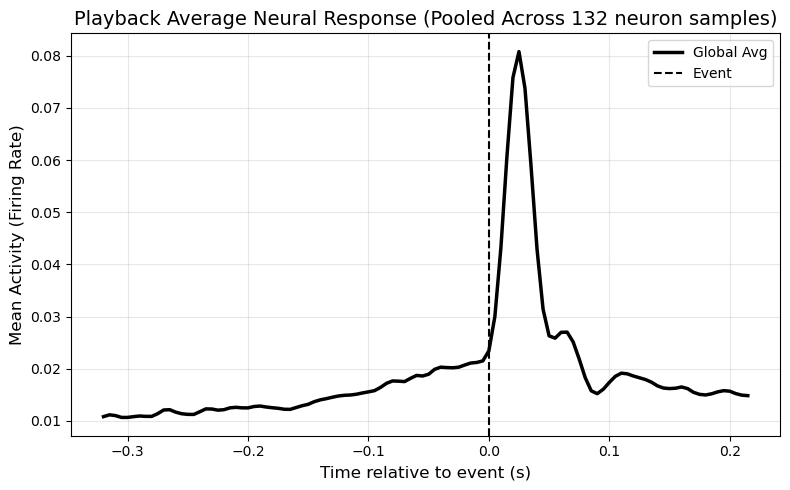

In [21]:
from matplotlib import pyplot as plt

# 1. Create the time axis
# Ensure the length matches mean_playback (n_bins_pre + n_bins_post)
time = np.arange(-n_bins_pre, n_bins_post) * dt

# 2. Compatibility check: 
# Option 1 output 'mean_playback' is already a 1D array (the Global Average).
# We can wrap it in a Series or DataFrame for easy handling.
df_plot = pd.DataFrame({'Global_Avg': mean_playback}, index=time)

# 3. Plotting
plt.figure(figsize=(8, 5))

# Plot the 1D mean directly
plt.plot(df_plot.index, df_plot['Global_Avg'], 
         color='black', linewidth=2.5, label='Global Avg')

# 4. Formatting
plt.axvline(0, color='black', linestyle='--', label='Event')
plt.title(f'Playback Average Neural Response (Pooled Across {final_pool.shape[0]} neuron samples)', fontsize=14)
plt.xlabel('Time relative to event (s)', fontsize=12)
plt.ylabel('Mean Activity (Firing Rate)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()

# Save or display
# plt.savefig('global_average_response.png')
plt.show()

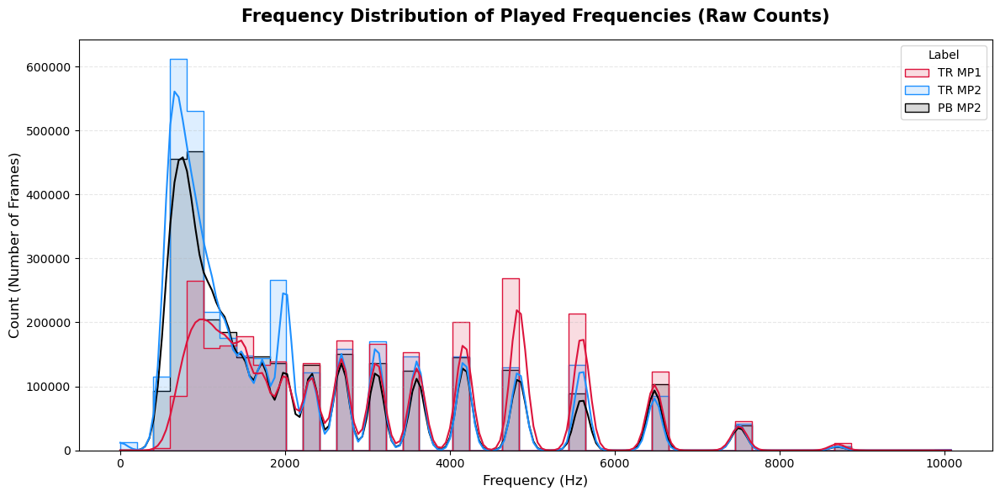

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# =========================================================
# 统计与可视化: Played_frequency (去掉归一化，显示原始计数)
# =========================================================

try:
    # 1. 将所有 Session 的特征数据合并为一个大表
    all_f_data = pd.concat(f_data_s, ignore_index=True)

    # 2. 为数据打上精细的分类标签
    all_f_data['Label'] = pd.Series([None] * len(all_f_data), dtype='object')
    
    if 'Mapping_Type' in all_f_data.columns and 'Condition' in all_f_data.columns:
        mask_tr_mp1 = (all_f_data['Condition'] == 0) & (all_f_data['Mapping_Type'] == 0)
        mask_tr_mp2 = (all_f_data['Condition'] == 0) & (all_f_data['Mapping_Type'] == 1)
        mask_pb_mp2 = (all_f_data['Condition'] == 1) & (all_f_data['Mapping_Type'] == 1)

        all_f_data.loc[mask_tr_mp1, 'Label'] = 'TR MP1'
        all_f_data.loc[mask_tr_mp2, 'Label'] = 'TR MP2'
        all_f_data.loc[mask_pb_mp2, 'Label'] = 'PB MP2'
    else:
        raise ValueError("数据中缺少 'Mapping_Type' 或 'Condition' 列！")

    # 3. 提取有效数据
    df_plot = all_f_data.dropna(subset=['Played_frequency', 'Label']).copy()

    # 4. 画图：频率分布直方图 (原始计数版)
    plt.figure(figsize=(12, 6))
    
    palette = {'TR MP1': 'crimson', 'TR MP2': 'dodgerblue', 'PB MP2': 'black'}
    
    # --- 修改点 ---
    sns.histplot(
        data=df_plot, 
        x='Played_frequency', 
        hue='Label', 
        palette=palette, 
        bins=50, 
        kde=True,            # 依然保留核密度曲线，它会自动缩放到计数尺度
        element="step", 
        alpha=0.15, 
        stat="count",        # 【修改】将 "density" 改为 "count"，显示原始帧数
        common_norm=False    # 在 stat="count" 时此参数不再起归一化作用
    )
    
    plt.title('Frequency Distribution of Played Frequencies (Raw Counts)', fontsize=15, fontweight='bold', pad=15)
    plt.xlabel('Frequency (Hz)', fontsize=12)
    plt.ylabel('Count (Number of Frames)', fontsize=12) # 【修改】更新 Y 轴标签
    # --------------
    
    plt.grid(axis='y', alpha=0.3, linestyle='--')
    plt.tight_layout()
    plt.show()

except NameError:
    print("❌ 错误: 找不到 `f_data_s` 变量。")
except Exception as e:
    print(f"❌ 运行出错: {e}")

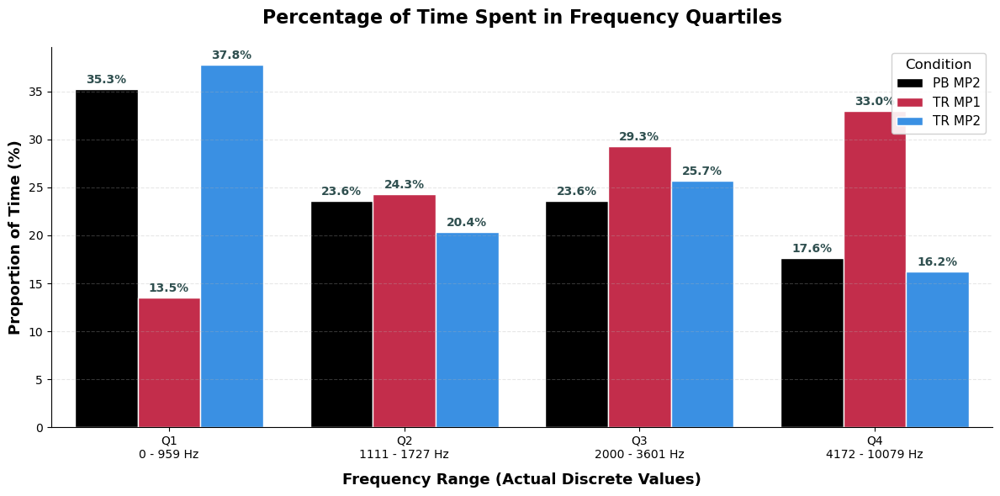

In [23]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# =========================================================
# 频率四分位并排对比直方图: 提取真实的离散频率边界
# =========================================================

try:
    # 1. 数据准备与打标签
    all_f_data = pd.concat(f_data_s, ignore_index=True)
    all_f_data['Label'] = pd.Series([None] * len(all_f_data), dtype='object')
    
    mask_tr_mp1 = (all_f_data['Condition'] == 0) & (all_f_data['Mapping_Type'] == 0)
    mask_tr_mp2 = (all_f_data['Condition'] == 0) & (all_f_data['Mapping_Type'] == 1)
    mask_pb_mp2 = (all_f_data['Condition'] == 1) & (all_f_data['Mapping_Type'] == 1)

    all_f_data.loc[mask_tr_mp1, 'Label'] = 'TR MP1'
    all_f_data.loc[mask_tr_mp2, 'Label'] = 'TR MP2'
    all_f_data.loc[mask_pb_mp2, 'Label'] = 'PB MP2'

    df_plot = all_f_data.dropna(subset=['Played_frequency', 'Label']).copy()

    # 2. 计算四分位基础切分 (保留底层的区间对象)
    df_plot['Quartile_Raw'] = pd.qcut(df_plot['Played_frequency'], q=4, duplicates='drop')

    # 3. 动态提取每个区间内【真实的离散频率上下限】
    mapping_dict = {}
    ordered_labels = []
    
    # 确保区间按从小到大排序
    sorted_intervals = sorted(df_plot['Quartile_Raw'].dropna().unique())
    
    for i, interval in enumerate(sorted_intervals):
        # 提取落在这个区间里的所有实际频率值
        freqs_in_bin = df_plot[df_plot['Quartile_Raw'] == interval]['Played_frequency']
        
        # 找出该桶里的实际最小值和最大值
        real_min = freqs_in_bin.min()
        real_max = freqs_in_bin.max()
        
        # 生成极其清爽的标签 (例如: 0 - 959 Hz)
        label = f"Q{i+1}\n{real_min:.0f} - {real_max:.0f} Hz"
        
        mapping_dict[interval] = label
        ordered_labels.append(label)

    # 将生成的漂亮标签映射回数据，并设为有序分类变量，保证画图不乱序
    df_plot['Freq_Quartile'] = df_plot['Quartile_Raw'].map(mapping_dict)
    df_plot['Freq_Quartile'] = pd.Categorical(df_plot['Freq_Quartile'], categories=ordered_labels, ordered=True)

    # 4. 计算每种 Condition 在各个区间的百分比
    # 分组统计频数
    summary = df_plot.groupby(['Label', 'Freq_Quartile'], observed=False).size().reset_index(name='Count')
    
    # 计算各自 Label 下的总数，用来算百分比
    totals = summary.groupby('Label')['Count'].transform('sum')
    summary['Percentage'] = (summary['Count'] / totals) * 100

    # 5. 画图：单图并排柱状图
    plt.figure(figsize=(12, 6))
    palette = {'TR MP1': 'crimson', 'TR MP2': 'dodgerblue', 'PB MP2': 'black'}

    ax = sns.barplot(
        data=summary, 
        x='Freq_Quartile', 
        y='Percentage', 
        hue='Label', 
        palette=palette, 
        edgecolor='white',
        linewidth=1
    )

    # 6. 在每一根柱子的头顶标上具体的百分比数值
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(
                f'{height:.1f}%', 
                (p.get_x() + p.get_width() / 2., height),
                ha='center', va='bottom', 
                fontsize=10, fontweight='bold', 
                color='darkslategrey',
                xytext=(0, 3), 
                textcoords='offset points'
            )

    # 7. 图表装饰
    plt.title('Percentage of Time Spent in Frequency Quartiles', fontsize=16, fontweight='bold', pad=20)
    plt.xlabel('Frequency Range (Actual Discrete Values)', fontsize=13, fontweight='bold', labelpad=10)
    plt.ylabel('Proportion of Time (%)', fontsize=13, fontweight='bold')
    
    plt.legend(title='Condition', fontsize=11, title_fontsize=12, framealpha=0.9, loc='upper right')
    plt.grid(axis='y', linestyle='--', alpha=0.3)
    
    sns.despine()
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"❌ 运行出错: {e}")

In [24]:
# 查看两个条件的总记录行数是否一致
pb_count = len(df_plot[df_plot['Label'] == 'PB MP2'])
tr_count = len(df_plot[df_plot['Label'] == 'TR MP2'])

print(f"PB MP2 总帧数: {pb_count}")
print(f"TR MP2 总帧数: {tr_count}")
print(f"帧数差值: {pb_count - tr_count}")

PB MP2 总帧数: 2886401
TR MP2 总帧数: 3363141
帧数差值: -476740


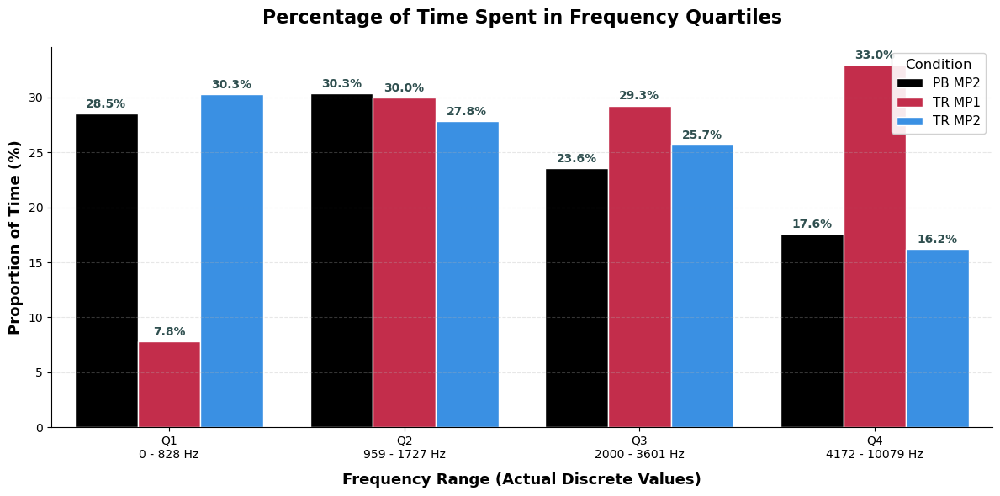

In [25]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# =========================================================
# 频率四分位并排对比直方图: 提取真实的离散频率边界 (含自定义边界修正)
# =========================================================

try:
    # 1. 数据准备与打标签
    all_f_data = pd.concat(f_data_s, ignore_index=True)
    all_f_data['Label'] = pd.Series([None] * len(all_f_data), dtype='object')
    
    mask_tr_mp1 = (all_f_data['Condition'] == 0) & (all_f_data['Mapping_Type'] == 0)
    mask_tr_mp2 = (all_f_data['Condition'] == 0) & (all_f_data['Mapping_Type'] == 1)
    mask_pb_mp2 = (all_f_data['Condition'] == 1) & (all_f_data['Mapping_Type'] == 1)

    all_f_data.loc[mask_tr_mp1, 'Label'] = 'TR MP1'
    all_f_data.loc[mask_tr_mp2, 'Label'] = 'TR MP2'
    all_f_data.loc[mask_pb_mp2, 'Label'] = 'PB MP2'

    df_plot = all_f_data.dropna(subset=['Played_frequency', 'Label']).copy()

    # 2. 计算四分位基础切分 (强制调整边界把959Hz划入Q2)
    bin_edges = df_plot['Played_frequency'].quantile([0, 0.25, 0.5, 0.75, 1.0]).tolist()
    
    # 强制修改 Q1 和 Q2 的分界线为 958.9，使得 959 落在第二个区间内
    bin_edges[1] = 958.9 
    
    # 使用 pd.cut 根据修改后的边界进行切分，include_lowest=True确保包含最小值0Hz
    df_plot['Quartile_Raw'] = pd.cut(df_plot['Played_frequency'], bins=bin_edges, include_lowest=True)

    # 3. 动态提取每个区间内【真实的离散频率上下限】
    mapping_dict = {}
    ordered_labels = []
    
    # 确保区间按从小到大排序
    sorted_intervals = sorted(df_plot['Quartile_Raw'].dropna().unique())
    
    for i, interval in enumerate(sorted_intervals):
        # 提取落在这个区间里的所有实际频率值
        freqs_in_bin = df_plot[df_plot['Quartile_Raw'] == interval]['Played_frequency']
        
        # 找出该桶里的实际最小值和最大值
        real_min = freqs_in_bin.min()
        real_max = freqs_in_bin.max()
        
        # 生成极其清爽的标签 (例如: Q1\n0 - 958 Hz)
        label = f"Q{i+1}\n{real_min:.0f} - {real_max:.0f} Hz"
        
        mapping_dict[interval] = label
        ordered_labels.append(label)

    # 将生成的漂亮标签映射回数据，并设为有序分类变量，保证画图不乱序
    df_plot['Freq_Quartile'] = df_plot['Quartile_Raw'].map(mapping_dict)
    df_plot['Freq_Quartile'] = pd.Categorical(df_plot['Freq_Quartile'], categories=ordered_labels, ordered=True)

    # 4. 计算每种 Condition 在各个区间的百分比
    # 分组统计频数
    summary = df_plot.groupby(['Label', 'Freq_Quartile'], observed=False).size().reset_index(name='Count')
    
    # 计算各自 Label 下的总数，用来算百分比
    totals = summary.groupby('Label')['Count'].transform('sum')
    summary['Percentage'] = (summary['Count'] / totals) * 100

    # 5. 画图：单图并排柱状图
    plt.figure(figsize=(12, 6))
    palette = {'TR MP1': 'crimson', 'TR MP2': 'dodgerblue', 'PB MP2': 'black'}

    ax = sns.barplot(
        data=summary, 
        x='Freq_Quartile', 
        y='Percentage', 
        hue='Label', 
        palette=palette, 
        edgecolor='white',
        linewidth=1
    )

    # 6. 在每一根柱子的头顶标上具体的百分比数值
    for p in ax.patches:
        height = p.get_height()
        if height > 0:
            ax.annotate(
                f'{height:.1f}%', 
                (p.get_x() + p.get_width() / 2., height),
                ha='center', va='bottom', 
                fontsize=10, fontweight='bold', 
                color='darkslategrey',
                xytext=(0, 3), 
                textcoords='offset points'
            )

    # 7. 图表装饰
    plt.title('Percentage of Time Spent in Frequency Quartiles', fontsize=16, fontweight='bold', pad=20)
    plt.xlabel('Frequency Range (Actual Discrete Values)', fontsize=13, fontweight='bold', labelpad=10)
    plt.ylabel('Proportion of Time (%)', fontsize=13, fontweight='bold')
    
    plt.legend(title='Condition', fontsize=11, title_fontsize=12, framealpha=0.9, loc='upper right')
    plt.grid(axis='y', linestyle='--', alpha=0.3)
    
    sns.despine()
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"❌ 运行出错: {e}")

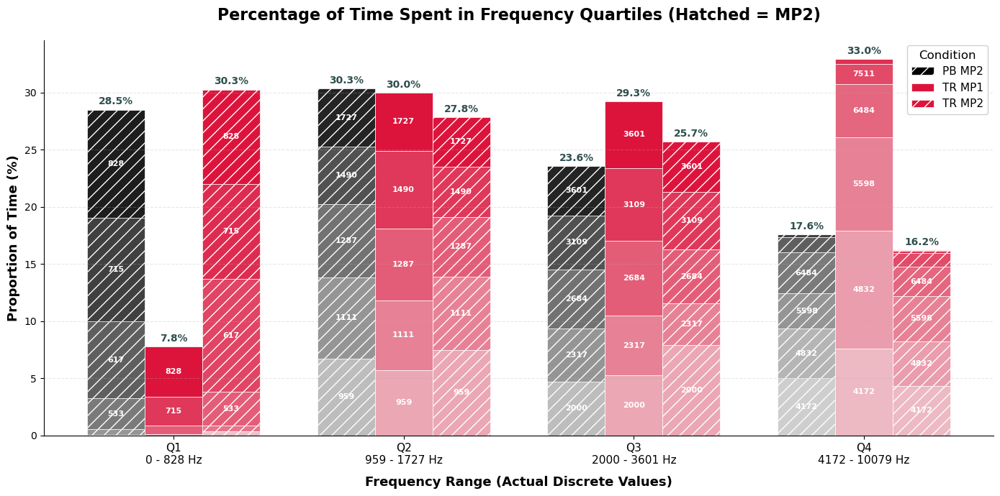

In [26]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patches as mpatches

# =========================================================
# 频率四分位分组堆叠图: PB MP2(黑) 与 TR MP2(蓝) 均添加斜线
# =========================================================

try:
    # 1. 数据准备与打标签 (确保 n_data_s, f_data_s 在外部已定义)
    all_f_data = pd.concat(f_data_s, ignore_index=True)
    all_f_data['Label'] = pd.Series([None] * len(all_f_data), dtype='object')
    
    mask_tr_mp1 = (all_f_data['Condition'] == 0) & (all_f_data['Mapping_Type'] == 0)
    mask_tr_mp2 = (all_f_data['Condition'] == 0) & (all_f_data['Mapping_Type'] == 1)
    mask_pb_mp2 = (all_f_data['Condition'] == 1) & (all_f_data['Mapping_Type'] == 1)

    all_f_data.loc[mask_tr_mp1, 'Label'] = 'TR MP1'
    all_f_data.loc[mask_tr_mp2, 'Label'] = 'TR MP2'
    all_f_data.loc[mask_pb_mp2, 'Label'] = 'PB MP2'

    df_plot = all_f_data.dropna(subset=['Played_frequency', 'Label']).copy()

    # 2. 计算四分位基础切分 (强制调整边界)
    bin_edges = df_plot['Played_frequency'].quantile([0, 0.25, 0.5, 0.75, 1.0]).tolist()
    bin_edges[1] = 958
    bin_edges[2] = 1999 
    bin_edges[3] = 4171
    df_plot['Quartile_Raw'] = pd.cut(df_plot['Played_frequency'], bins=bin_edges, include_lowest=True)

    # 3. 动态提取每个区间内真实的频率范围标签
    mapping_dict = {}
    ordered_labels = []
    sorted_intervals = sorted(df_plot['Quartile_Raw'].dropna().unique())
    
    for i, interval in enumerate(sorted_intervals):
        freqs_in_bin = df_plot[df_plot['Quartile_Raw'] == interval]['Played_frequency']
        real_min = freqs_in_bin.min()
        real_max = freqs_in_bin.max()
        label = f"Q{i+1}\n{real_min:.0f} - {real_max:.0f} Hz"
        mapping_dict[interval] = label
        ordered_labels.append(label)

    df_plot['Freq_Quartile'] = df_plot['Quartile_Raw'].map(mapping_dict)
    df_plot['Freq_Quartile'] = pd.Categorical(df_plot['Freq_Quartile'], categories=ordered_labels, ordered=True)

    totals = df_plot['Label'].value_counts()

    # 4. 画图核心配置
    fig, ax = plt.subplots(figsize=(14, 7))
    
    labels_order = ['PB MP2', 'TR MP1', 'TR MP2']
    base_colors = {'PB MP2': 'black', 'TR MP1': 'crimson', 'TR MP2': 'crimson'}
    
    # 设定斜线样式：MP2 类型的都加斜线
    hatch_mapping = {'PB MP2': '//', 'TR MP1': None, 'TR MP2': '//'}
    
    width = 0.25  
    offsets = [-width, 0, width]  
    x_positions = np.arange(len(ordered_labels)) 
    text_threshold = 1.5 

    for i, quartile in enumerate(ordered_labels):
        for label_name, offset in zip(labels_order, offsets):
            subset = df_plot[(df_plot['Freq_Quartile'] == quartile) & (df_plot['Label'] == label_name)]
            if subset.empty: continue
            
            freq_counts = subset['Played_frequency'].value_counts().sort_index()
            freq_pcts = (freq_counts / totals[label_name]) * 100
            n_freqs = len(freq_pcts)
            base_col = base_colors[label_name]
            
            # 根据基础色生成深浅渐变
            if base_col == 'black':
                colors = sns.color_palette("Greys", n_colors=n_freqs + 2)[2:] 
            else:
                colors = sns.light_palette(base_col, n_colors=n_freqs + 2)[2:]
            
            current_hatch = hatch_mapping[label_name]
            bottom = 0 
            
            for (freq, pct), color in zip(freq_pcts.items(), colors):
                # 使用 facecolor 绘图，edgecolor='white' 确保斜线可见
                ax.bar(x_positions[i] + offset, pct, width, bottom=bottom, 
                       facecolor=color, edgecolor='white', linewidth=0.5, 
                       hatch=current_hatch)
                
                # 在色块中心标注频率数字
                if pct > text_threshold:
                    ax.text(x_positions[i] + offset, bottom + pct / 2, 
                            f"{freq:.0f}", ha='center', va='center', 
                            fontsize=8, color='white', fontweight='bold')
                bottom += pct 
            
            # 顶部标注总百分比
            if bottom > 0:
                ax.annotate(f'{bottom:.1f}%', (x_positions[i] + offset, bottom),
                            ha='center', va='bottom', fontsize=10, fontweight='bold', 
                            color='darkslategrey', xytext=(0, 3), textcoords='offset points')

    # 5. 图表装饰
    ax.set_xticks(x_positions)
    ax.set_xticklabels(ordered_labels, fontsize=11)
    plt.title('Percentage of Time Spent in Frequency Quartiles (Hatched = MP2)', 
              fontsize=16, fontweight='bold', pad=20)
    plt.ylabel('Proportion of Time (%)', fontsize=13, fontweight='bold')
    plt.xlabel('Frequency Range (Actual Discrete Values)', fontsize=13, fontweight='bold', labelpad=10)
    
    # 6. 自定义图例 (修复纹理显示问题)
    legend_handles = []
    for lbl in labels_order:
        patch = mpatches.Patch(
            facecolor=base_colors[lbl], 
            label=lbl, 
            hatch=hatch_mapping[lbl], 
            edgecolor='white',  # 斜线颜色设为白色
            linewidth=0.5
        )
        legend_handles.append(patch)

    plt.legend(handles=legend_handles, title='Condition', fontsize=11, 
               title_fontsize=12, framealpha=0.9, loc='upper right')
    
    plt.grid(axis='y', linestyle='--', alpha=0.3)
    sns.despine()
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"❌ 运行出错: {e}")

✅ 经过严格过滤，找到 85 种【同时包含三组数据】的频率跳变路径。
✅ 共有 128360 个有效 Trigger 进入绘图阶段。


c:\Users\PenPen\anaconda3\envs\Latest\Lib\site-packages\numpy\_core\fromnumeric.py:3824: RuntimeWarning: Mean of empty slice
  return _methods._mean(a, axis=axis, dtype=dtype,
c:\Users\PenPen\anaconda3\envs\Latest\Lib\site-packages\numpy\_core\_methods.py:134: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
c:\Users\PenPen\anaconda3\envs\Latest\Lib\site-packages\numpy\_core\_methods.py:219: RuntimeWarning: Degrees of freedom <= 0 for slice
  ret = _var(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
c:\Users\PenPen\anaconda3\envs\Latest\Lib\site-packages\numpy\_core\_methods.py:178: RuntimeWarning: invalid value encountered in divide
  arrmean = um.true_divide(arrmean, div, out=arrmean,
c:\Users\PenPen\anaconda3\envs\Latest\Lib\site-packages\numpy\_core\_methods.py:208: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
c:\Users\PenPen\anaconda3\envs\Latest\Lib\site-packages\numpy\_core\fromnumeric.py:3824: RuntimeWarning: Mean of emp

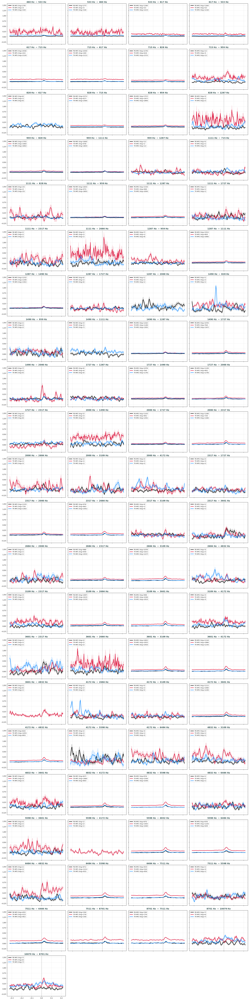

In [27]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

# =========================================================
# 严格匹配跳变路径 (Pre -> Post) 的 PSTH 对比
# 💡 严格限制：只有同时包含 TR_Orig, TR_Inv 和 PB_Inv 三组数据的路径才会被绘制
# =========================================================

events_data = []

# 1. 提取所有 Trigger 并打标签
for sess_idx, (n_data, f_data) in enumerate(zip(n_data_s, f_data_s)):
    if 'Mapping_Type' not in f_data.columns:
        continue
        
    freqs = f_data['Played_frequency'].values
    changes = f_data['Frequency_changes'].values
    conditions = f_data['Condition'].values
    mapping_types = f_data['Mapping_Type'].values
    
    trigger_indices = np.flatnonzero(changes == 1)
    
    for i in trigger_indices:
        if i == 0: continue
        
        f_pre = freqs[i-1]
        f_post = freqs[i]
        cond = conditions[i]
        m_type = mapping_types[i]
        
        if cond == 0 and m_type == 0:
            label = 'TR_Orig'
        elif cond == 0 and m_type == 1:
            label = 'TR_Inv'
        elif cond == 1 and m_type == 1:
            label = 'PB_Inv'
        else:
            continue
            
        start = int(i - n_bins_pre)
        stop = int(i + n_bins_post)
        
        if start >= 0 and stop <= n_data.shape[-1]:
            segment = n_data[:, start:stop]
            if segment.shape[1] == expected_length:
                events_data.append({
                    'freq_pre': f_pre,
                    'freq_post': f_post,
                    'transition': f"{f_pre:.0f}_{f_post:.0f}",
                    'label': label,
                    'segment': segment
                })

df_events = pd.DataFrame(events_data)

# 2. 核心修改：三方严格求交集 (Intersection)
transitions_tr_orig = set(df_events[df_events['label'] == 'TR_Orig']['transition'])
transitions_tr_inv = set(df_events[df_events['label'] == 'TR_Inv']['transition'])
transitions_pb = set(df_events[df_events['label'] == 'PB_Inv']['transition'])

# 必须同时存在于这三个集合中
common_transitions = transitions_tr_orig.intersection(transitions_tr_inv).intersection(transitions_pb)

df_matched = df_events[df_events['transition'].isin(common_transitions)].copy()

unique_transitions = df_matched[['freq_pre', 'freq_post']].drop_duplicates().sort_values(['freq_pre', 'freq_post'])
n_transitions = len(unique_transitions)

print("=" * 70)
print(f"✅ 经过严格过滤，找到 {n_transitions} 种【同时包含三组数据】的频率跳变路径。")
print(f"✅ 共有 {len(df_matched)} 个有效 Trigger 进入绘图阶段。")
print("=" * 70)

# 3. 画图
if n_transitions > 0:
    cols = 4
    rows = math.ceil(n_transitions / cols)
    fig, axes = plt.subplots(rows, cols, figsize=(5.5 * cols, 4 * rows), sharex=True, sharey=True)
    
    if n_transitions == 1: axes = [axes]
    else: axes = axes.flatten()
    
    time_axis = np.arange(-n_bins_pre, n_bins_post) * dt
    
    for idx, row in enumerate(unique_transitions.itertuples()):
        ax = axes[idx]
        f_pre = row.freq_pre
        f_post = row.freq_post
        
        df_trans = df_matched[(df_matched['freq_pre'] == f_pre) & (df_matched['freq_post'] == f_post)]
        
        segs_pb_inv = df_trans[df_trans['label'] == 'PB_Inv']['segment'].values
        segs_tr_orig = df_trans[df_trans['label'] == 'TR_Orig']['segment'].values
        segs_tr_inv = df_trans[df_trans['label'] == 'TR_Inv']['segment'].values
        
        def plot_category(segs, color, label_name):
            n_triggers = len(segs)
            if n_triggers > 0:
                pool = np.concatenate(segs, axis=0)
                mean = np.mean(pool, axis=0)
                sem = np.std(pool, axis=0) / np.sqrt(pool.shape[0])
                ax.plot(time_axis, mean, color=color, linewidth=2.5, label=f'{label_name} (trig={n_triggers})')
                ax.fill_between(time_axis, mean-sem, mean+sem, color=color, alpha=0.15)
        
        # 绘制三线
        plot_category(segs_pb_inv, 'black', 'PB MP2')
        plot_category(segs_tr_orig, 'crimson', 'TR MP1')
        plot_category(segs_tr_inv, 'dodgerblue', 'TR MP2')
        
        ax.axvline(0, color='gray', linestyle='--', alpha=0.7)
        ax.set_title(f"{f_pre:.0f} Hz $\\rightarrow$ {f_post:.0f} Hz", fontsize=13, fontweight='bold', color='darkslategrey')
        ax.legend(fontsize=9, loc='upper left', framealpha=0.9)
        ax.grid(True, alpha=0.3)
            
    # 隐藏多余空白图
    for i in range(n_transitions, len(axes)):
        fig.delaxes(axes[i])
        
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ 没有找到满足严格匹配条件（三组均有数据）的事件。")

✅ 总共提取到 128670 个有效 Trigger。


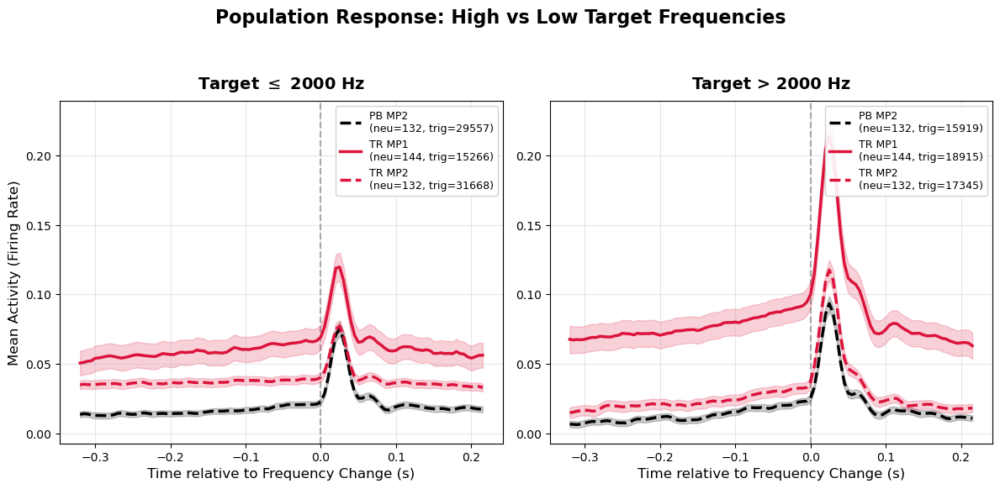

In [28]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 二分高低频: 放宽匹配条件的 PSTH 对比 (利用所有有效 Trigger)
# 修正了 SEM 的计算逻辑: 先按 Trigger 平均，再跨神经元计算 SEM
# 阈值: Target Frequency <= 2000 Hz (Low), > 2000 Hz (High)
# =========================================================

events_data = []

# 1. 提取所有 Trigger 并打标签 (加入了 sess_idx 以便后续正确聚合)
# 注意：此段代码依赖外部变量 n_data_s, f_data_s, n_bins_pre, n_bins_post, expected_length, dt。
# 请确保这些变量在运行此脚本前已定义。
for sess_idx, (n_data, f_data) in enumerate(zip(n_data_s, f_data_s)):
    if 'Mapping_Type' not in f_data.columns:
        continue
        
    freqs = f_data['Played_frequency'].values
    changes = f_data['Frequency_changes'].values
    conditions = f_data['Condition'].values
    mapping_types = f_data['Mapping_Type'].values
    
    trigger_indices = np.flatnonzero(changes == 1)
    
    for i in trigger_indices:
        if i == 0: continue
        
        f_post = freqs[i]
        cond = conditions[i]
        m_type = mapping_types[i]
        
        if cond == 0 and m_type == 0:
            label = 'TR_Orig'
        elif cond == 0 and m_type == 1:
            label = 'TR_Inv'
        elif cond == 1 and m_type == 1:
            label = 'PB_Inv'
        else:
            continue
            
        start = int(i - n_bins_pre)
        stop = int(i + n_bins_post)
        
        if start >= 0 and stop <= n_data.shape[-1]:
            segment = n_data[:, start:stop]
            if segment.shape[1] == expected_length:
                events_data.append({
                    'sess_idx': sess_idx,  # 记录所属 session
                    'freq_post': f_post,
                    'label': label,
                    'segment': segment     # 形状: (N_neurons, timebins)
                })

df_events = pd.DataFrame(events_data)

print("=" * 60)
print(f"✅ 总共提取到 {len(df_events)} 个有效 Trigger。")

# 2. 按阈值 (2000 Hz) 分为高低频两组
threshold = 2000
df_events['Freq_Group'] = np.where(df_events['freq_post'] <= threshold, 'Low Frequency', 'High Frequency')

groups = [
    ('Low Frequency', f'Target $\\leq$ {threshold} Hz'),
    ('High Frequency', f'Target > {threshold} Hz')
]

print("=" * 60)

# 3. 画图：1行2列
fig, axes = plt.subplots(1, 2, figsize=(12, 5.5), sharey=True)
time_axis = np.arange(-n_bins_pre, n_bins_post) * dt

for idx, (group_val, title_text) in enumerate(groups):
    ax = axes[idx]
    
    # 获取该分组的数据
    df_group = df_events[df_events['Freq_Group'] == group_val]
    
    # 辅助绘图函数 (包含正确的 SEM 计算逻辑)
    # 修改：增加了 linestyle 参数，默认为 '-'
    def plot_category(df_cat, color, label_name, linestyle='-'):
        if len(df_cat) == 0: return
        n_triggers = len(df_cat)
        
        # 按照 session 分组，确保 SEM 是跨神经元 (Across Neurons) 计算的
        session_neuron_means = []
        for s_idx, grp in df_cat.groupby('sess_idx'):
            # 将该 session 内同一条件的多个 trigger 叠起来: (n_triggers_in_sess, N_neurons, timebins)
            segs = np.stack(grp['segment'].values, axis=0)
            # 在 trigger 维度上求均值 -> 得到每个神经元的平均反应: (N_neurons, timebins)
            sess_mean = np.mean(segs, axis=0)
            session_neuron_means.append(sess_mean)
            
        if len(session_neuron_means) > 0:
            # 将所有 session 的神经元汇聚在一起: (Total_Neurons, timebins)
            pool = np.concatenate(session_neuron_means, axis=0)
            
            # 跨神经元计算 Mean 和 SEM
            mean = np.mean(pool, axis=0)
            sem = np.std(pool, axis=0) / np.sqrt(pool.shape[0])
            n_neurons = pool.shape[0]
            
            # 画图 (显式声明 neu=神经元数, trig=触发数)
            legend_lbl = f'{label_name}\n(neu={n_neurons}, trig={n_triggers})'
            # 应用传入的 linestyle
            ax.plot(time_axis, mean, color=color, linewidth=2.5, label=legend_lbl, linestyle=linestyle)
            ax.fill_between(time_axis, mean-sem, mean+sem, color=color, alpha=0.2)

    # 分别绘制三组数据
    # 修改：将 TR_Inv 的颜色从 'dodgerblue' 改为 'crimson'，并将线型设为虚线 '--'
    plot_category(df_group[df_group['label'] == 'PB_Inv'], 'black', 'PB MP2', linestyle='--')
    plot_category(df_group[df_group['label'] == 'TR_Orig'], 'crimson', 'TR MP1')
    plot_category(df_group[df_group['label'] == 'TR_Inv'], 'crimson', 'TR MP2', linestyle='--')
    
    # 图表装饰
    ax.axvline(0, color='gray', linestyle='--', alpha=0.7, zorder=0)
    ax.set_title(f"{title_text}", fontsize=14, fontweight='bold', pad=10)
    ax.set_xlabel('Time relative to Frequency Change (s)', fontsize=12)
    
    # 强制在第二张图的左侧也标出刻度数字
    ax.tick_params(labelleft=True)
    if idx == 0:
        ax.set_ylabel('Mean Activity (Firing Rate)', fontsize=12)
        
    ax.legend(fontsize=9, loc='upper right', framealpha=0.9)
    ax.grid(True, alpha=0.3)

plt.suptitle("Population Response: High vs Low Target Frequencies", fontsize=16, fontweight='bold', y=1.05)
plt.tight_layout()
plt.show()

✅ 总共提取到 128670 个有效 Trigger。


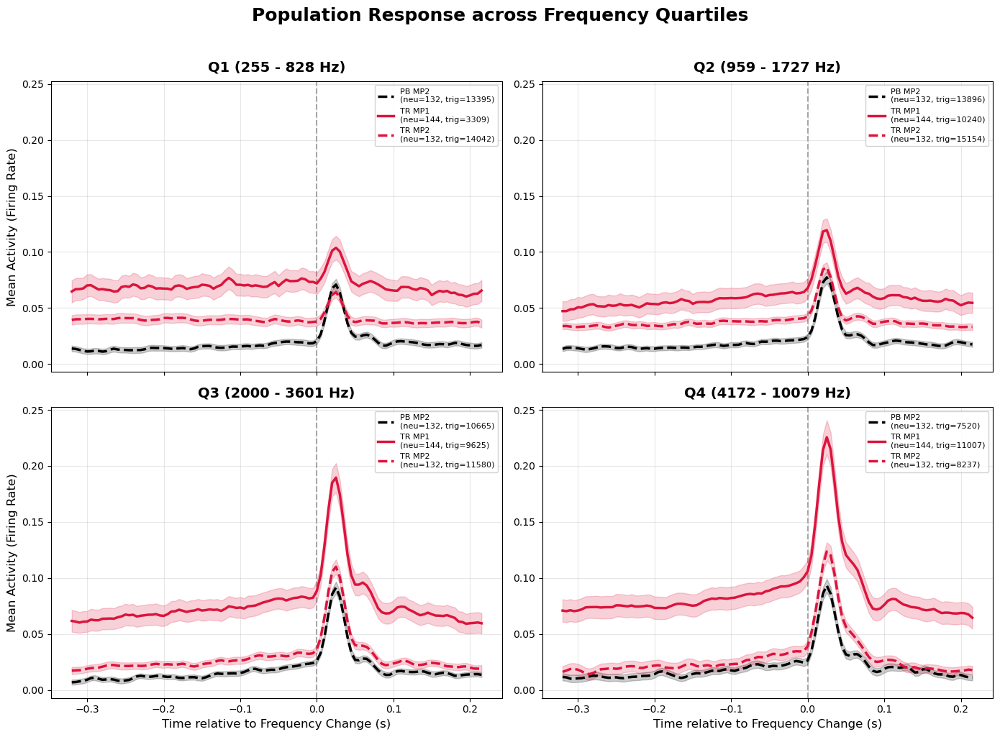

In [29]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 四分位频率: 按照 Q1-Q4 (含959Hz修正) 划分的 PSTH 对比 
# =========================================================

events_data = []

# 1. 提取所有 Trigger 并打标签
for sess_idx, (n_data, f_data) in enumerate(zip(n_data_s, f_data_s)):
    if 'Mapping_Type' not in f_data.columns:
        continue
        
    freqs = f_data['Played_frequency'].values
    changes = f_data['Frequency_changes'].values
    conditions = f_data['Condition'].values
    mapping_types = f_data['Mapping_Type'].values
    
    trigger_indices = np.flatnonzero(changes == 1)
    
    for i in trigger_indices:
        if i == 0: continue
        
        f_post = freqs[i]
        cond = conditions[i]
        m_type = mapping_types[i]
        
        if cond == 0 and m_type == 0:
            label = 'TR_Orig'
        elif cond == 0 and m_type == 1:
            label = 'TR_Inv'
        elif cond == 1 and m_type == 1:
            label = 'PB_Inv'
        else:
            continue
            
        start = int(i - n_bins_pre)
        stop = int(i + n_bins_post)
        
        if start >= 0 and stop <= n_data.shape[-1]:
            segment = n_data[:, start:stop]
            if segment.shape[1] == expected_length:
                events_data.append({
                    'sess_idx': sess_idx,  
                    'freq_post': f_post,
                    'label': label,
                    'segment': segment     
                })

df_events = pd.DataFrame(events_data)

print("=" * 60)
print(f"✅ 总共提取到 {len(df_events)} 个有效 Trigger。")

# ---------------------------------------------------------
# 2. 按四分位数 (Q1, Q2, Q3, Q4) 将频率分为四组
# ---------------------------------------------------------
bin_edges = df_events['freq_post'].quantile([0, 0.25, 0.5, 0.75, 1.0]).tolist()

# 强制修改边界，确保 959 Hz 落在 Q2 中
bin_edges[1] = 958
bin_edges[2] = 1999
bin_edges[3] = 4171 

df_events['Quartile_Raw'] = pd.cut(df_events['freq_post'], bins=bin_edges, include_lowest=True)

mapping_dict = {}
ordered_labels = []
sorted_intervals = sorted(df_events['Quartile_Raw'].dropna().unique())

for i, interval in enumerate(sorted_intervals):
    freqs_in_bin = df_events[df_events['Quartile_Raw'] == interval]['freq_post']
    real_min = freqs_in_bin.min()
    real_max = freqs_in_bin.max()
    
    label_name = f"Q{i+1} ({real_min:.0f} - {real_max:.0f} Hz)"
    mapping_dict[interval] = label_name
    ordered_labels.append(label_name)

df_events['Freq_Group'] = df_events['Quartile_Raw'].map(mapping_dict)

print("=" * 60)

# ---------------------------------------------------------
# 3. 画图：2行2列
# ---------------------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharey=True, sharex=True)
axes = axes.flatten() 
time_axis = np.arange(-n_bins_pre, n_bins_post) * dt

for idx, group_val in enumerate(ordered_labels):
    ax = axes[idx]
    
    # 获取该分组的数据
    df_group = df_events[df_events['Freq_Group'] == group_val]
    
    # 辅助绘图函数 (新增 linestyle 参数)
    def plot_category(df_cat, color, label_name, linestyle='-'):
        if len(df_cat) == 0: return
        n_triggers = len(df_cat)
        
        session_neuron_means = []
        for s_idx, grp in df_cat.groupby('sess_idx'):
            segs = np.stack(grp['segment'].values, axis=0)
            sess_mean = np.mean(segs, axis=0)
            session_neuron_means.append(sess_mean)
            
        if len(session_neuron_means) > 0:
            pool = np.concatenate(session_neuron_means, axis=0)
            
            mean = np.mean(pool, axis=0)
            sem = np.std(pool, axis=0) / np.sqrt(pool.shape[0])
            n_neurons = pool.shape[0]
            
            legend_lbl = f'{label_name}\n(neu={n_neurons}, trig={n_triggers})'
            # 应用 linestyle
            ax.plot(time_axis, mean, color=color, linewidth=2.5, label=legend_lbl, linestyle=linestyle)
            ax.fill_between(time_axis, mean-sem, mean+sem, color=color, alpha=0.2)

    # --- 绘制三组数据 ---
    # PB MP2: 黑色 实线
    plot_category(df_group[df_group['label'] == 'PB_Inv'], 'black', 'PB MP2', linestyle='--')
    # TR MP1: 深红 实线
    plot_category(df_group[df_group['label'] == 'TR_Orig'], 'crimson', 'TR MP1')
    # TR MP2: 改为 深红 虚线
    plot_category(df_group[df_group['label'] == 'TR_Inv'], 'crimson', 'TR MP2', linestyle='--')
    
    # 图表装饰
    ax.axvline(0, color='gray', linestyle='--', alpha=0.7, zorder=0)
    ax.set_title(f"{group_val}", fontsize=14, fontweight='bold', pad=10)
    
    if idx >= 2:
        ax.set_xlabel('Time relative to Frequency Change (s)', fontsize=12)
    
    ax.tick_params(labelleft=True)
    if idx % 2 == 0:
        ax.set_ylabel('Mean Activity (Firing Rate)', fontsize=12)
        
    ax.legend(fontsize=8, loc='upper right', framealpha=0.9)
    ax.grid(True, alpha=0.3)

plt.suptitle("Population Response across Frequency Quartiles", fontsize=18, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

✅ 总共提取到 24776 个有效 Trigger (已过滤 0.3s 内的密集 Trigger)。


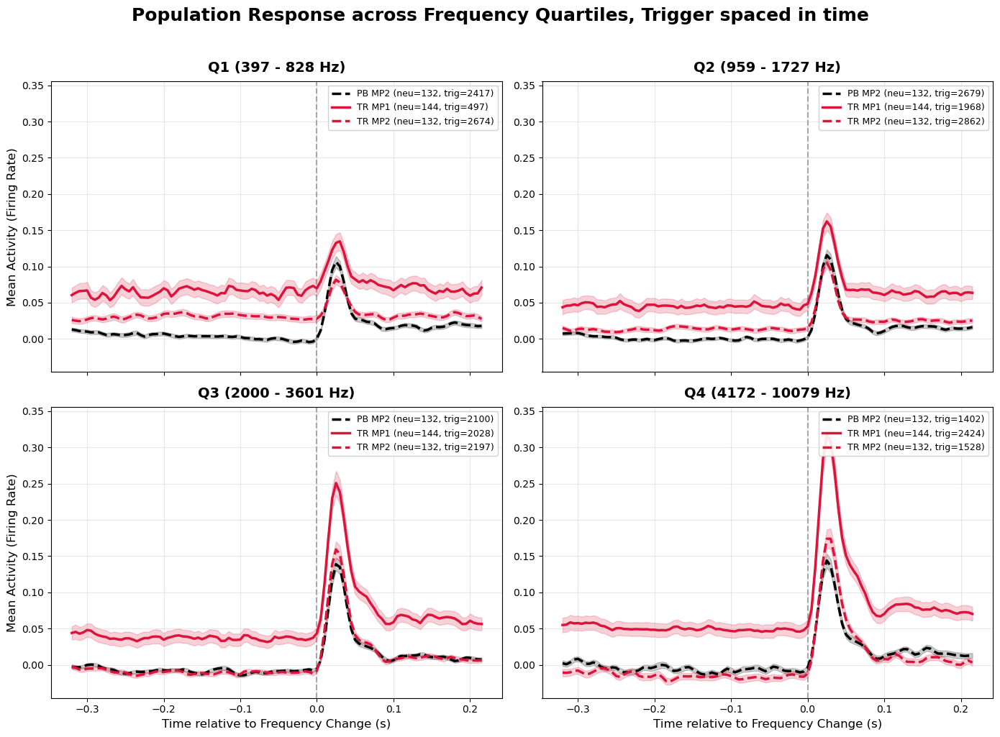

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# =========================================================
# 四分位频率: 按照 Q1-Q4 (含959Hz修正) 划分的 PSTH 对比 
# =========================================================

events_data = []

# 新增：计算 0.3 秒对应的 bin 数量 (假设 dt 在你的全局变量中已定义)
bins_03s = int(0.3 / dt) 

# 1. 提取所有 Trigger 并打标签
for sess_idx, (n_data, f_data) in enumerate(zip(n_data_s, f_data_s)):
    if 'Mapping_Type' not in f_data.columns:
        continue
        
    freqs = f_data['Played_frequency'].values
    changes = f_data['Frequency_changes'].values
    conditions = f_data['Condition'].values
    mapping_types = f_data['Mapping_Type'].values
    
    trigger_indices = np.flatnonzero(changes == 1)
    
    # 修改点：使用 enumerate 以便获取前一个 trigger 的索引
    for k, i in enumerate(trigger_indices):
        if i == 0: continue
        
        # ==========================================
        # 核心过滤逻辑：检查 pre-trigger 0.3s 内是否有其他 trigger
        # 如果当前 trigger 与上一个 trigger 的间隔小于等于 bins_03s，则跳过
        # ==========================================
        if k > 0:
            prev_i = trigger_indices[k-1]
            if (i - prev_i) <= bins_03s:
                continue
        
        f_post = freqs[i]
        cond = conditions[i]
        m_type = mapping_types[i]
        
        if cond == 0 and m_type == 0:
            label = 'TR_Orig'
        elif cond == 0 and m_type == 1:
            label = 'TR_Inv'
        elif cond == 1 and m_type == 1:
            label = 'PB_Inv'
        else:
            continue
            
        start = int(i - n_bins_pre)
        stop = int(i + n_bins_post)
        
        if start >= 0 and stop <= n_data.shape[-1]:
            segment = n_data[:, start:stop]
            if segment.shape[1] == expected_length:
                events_data.append({
                    'sess_idx': sess_idx,  
                    'freq_post': f_post,
                    'label': label,
                    'segment': segment     
                })

df_events = pd.DataFrame(events_data)

print("=" * 60)
print(f"✅ 总共提取到 {len(df_events)} 个有效 Trigger (已过滤 0.3s 内的密集 Trigger)。")

# ---------------------------------------------------------
# 2. 按四分位数 (Q1, Q2, Q3, Q4) 将频率分为四组 (沿用之前的逻辑)
# ---------------------------------------------------------
bin_edges = df_events['freq_post'].quantile([0, 0.25, 0.5, 0.75, 1.0]).tolist()

# 强制修改边界，确保 959 Hz 落在 Q2 中
bin_edges[1] = 958
bin_edges[2] = 1999 
bin_edges[3] = 4171 

df_events['Quartile_Raw'] = pd.cut(df_events['freq_post'], bins=bin_edges, include_lowest=True)

mapping_dict = {}
ordered_labels = []
sorted_intervals = sorted(df_events['Quartile_Raw'].dropna().unique())

for i, interval in enumerate(sorted_intervals):
    freqs_in_bin = df_events[df_events['Quartile_Raw'] == interval]['freq_post']
    real_min = freqs_in_bin.min()
    real_max = freqs_in_bin.max()
    
    # 标签格式: Q1 (0 - 958 Hz)
    label_name = f"Q{i+1} ({real_min:.0f} - {real_max:.0f} Hz)"
    mapping_dict[interval] = label_name
    ordered_labels.append(label_name)

df_events['Freq_Group'] = df_events['Quartile_Raw'].map(mapping_dict)

print("=" * 60)

# ---------------------------------------------------------
# 3. 画图：2行2列 (适合展示4个区间的PSTH曲线)
# ---------------------------------------------------------
fig, axes = plt.subplots(2, 2, figsize=(14, 10), sharey=True, sharex=True)
axes = axes.flatten() # 展平为1维数组，方便循环遍历
time_axis = np.arange(-n_bins_pre, n_bins_post) * dt

for idx, group_val in enumerate(ordered_labels):
    ax = axes[idx]
    
    # 获取该分组的数据
    df_group = df_events[df_events['Freq_Group'] == group_val]
    
    # 辅助绘图函数
    def plot_category(df_cat, color, label_name, linestyle='-'):
        if len(df_cat) == 0: return
        n_triggers = len(df_cat)
        
        session_neuron_means = []
        for s_idx, grp in df_cat.groupby('sess_idx'):
            segs = np.stack(grp['segment'].values, axis=0)
            sess_mean = np.mean(segs, axis=0)
            session_neuron_means.append(sess_mean)
            
        if len(session_neuron_means) > 0:
            pool = np.concatenate(session_neuron_means, axis=0)
            
            mean = np.mean(pool, axis=0)
            sem = np.std(pool, axis=0) / np.sqrt(pool.shape[0])
            n_neurons = pool.shape[0]
            
            legend_lbl = f'{label_name} (neu={n_neurons}, trig={n_triggers})'
            ax.plot(time_axis, mean, color=color, linewidth=2.5, label=legend_lbl, linestyle=linestyle)
            ax.fill_between(time_axis, mean-sem, mean+sem, color=color, alpha=0.2)

    # 分别绘制三组数据
    plot_category(df_group[df_group['label'] == 'PB_Inv'], 'black', 'PB MP2', linestyle='--')
    plot_category(df_group[df_group['label'] == 'TR_Orig'], 'crimson', 'TR MP1')
    plot_category(df_group[df_group['label'] == 'TR_Inv'], 'crimson', 'TR MP2', linestyle='--')
    
    # 图表装饰
    ax.axvline(0, color='gray', linestyle='--', alpha=0.7, zorder=0)
    ax.set_title(f"{group_val}", fontsize=14, fontweight='bold', pad=10)
    
    # 只在底部的子图显示 x 轴标签
    if idx >= 2:
        ax.set_xlabel('Time relative to Frequency Change (s)', fontsize=12)
    
    # 强制所有子图显示 y 轴刻度，但只在左侧子图显示 ylabel
    ax.tick_params(labelleft=True)
    if idx % 2 == 0:
        ax.set_ylabel('Mean Activity (Firing Rate)', fontsize=12)
        
    ax.legend(fontsize=9, loc='upper right', framealpha=0.9)
    ax.grid(True, alpha=0.3)

plt.suptitle("Population Response across Frequency Quartiles, Trigger spaced in time", fontsize=18, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

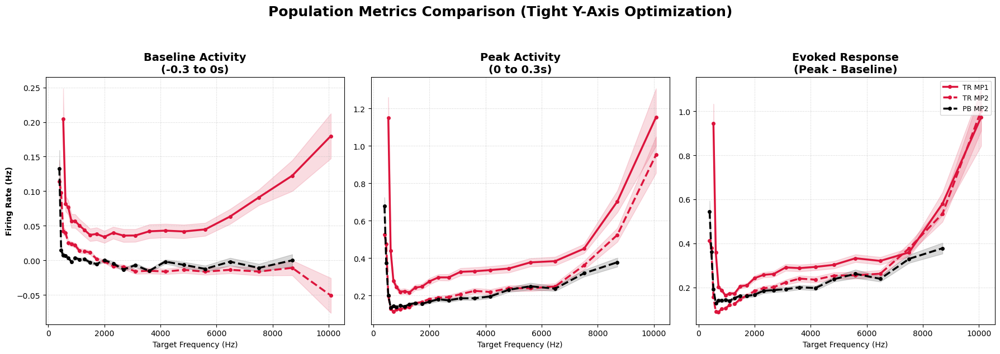

In [31]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# =========================================================
# 1. 核心指标提取 (Peak 窗口: 0 - 0.3s)
# =========================================================
baseline_win = [-0.3, 0]
peak_win = [0, 0.3]

idx_trigger = n_bins_pre
idx_bl_start = idx_trigger - int(abs(baseline_win[0]) / dt)
idx_peak_start = idx_trigger
idx_peak_end = idx_trigger + int(peak_win[1] / dt)

metrics_list = []

for (label, freq), df_sub in df_events.groupby(['label', 'freq_post']):
    session_neuron_means = []
    for s_idx, grp in df_sub.groupby('sess_idx'):
        segs = np.stack(grp['segment'].values, axis=0) 
        sess_mean = np.mean(segs, axis=0) 
        session_neuron_means.append(sess_mean)
    
    if len(session_neuron_means) > 0:
        pool = np.concatenate(session_neuron_means, axis=0)
        for n in range(pool.shape[0]):
            psth_neuron = pool[n, :]
            bl_val = np.mean(psth_neuron[idx_bl_start:idx_trigger])
            pk_val = np.max(psth_neuron[idx_peak_start:idx_peak_end])
            metrics_list.append({
                'Label': label,
                'Frequency': freq,
                'Baseline': bl_val,
                'Peak': pk_val,
                'Evoked_Response': pk_val - bl_val
            })

df_metrics = pd.DataFrame(metrics_list)

# =========================================================
# 2. 动态计算合理的 Y 轴上限 (基于 Mean + SEM)
# =========================================================
plot_max = 0
cols = ['Baseline', 'Peak', 'Evoked_Response']
for col in cols:
    # 计算每个频率点的均值+标准误
    temp_stats = df_metrics.groupby(['Label', 'Frequency'])[col].agg(['mean', 'sem'])
    current_max = (temp_stats['mean'] + temp_stats['sem']).max()
    if current_max > plot_max:
        plot_max = current_max

# 给顶部留 10% 的余量
y_limit_top = plot_max * 1.1

# =========================================================
# 3. 绘图 (Y 轴已优化)
# =========================================================
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=0)

style_map = {
    'TR_Orig': {'color': 'crimson', 'label': 'TR MP1', 'ls': '-'},
    'TR_Inv':  {'color': 'crimson', 'label': 'TR MP2', 'ls': '--'},
    'PB_Inv':  {'color': 'black',   'label': 'PB MP2', 'ls': '--'}
}

titles = ['Baseline Activity\n(-0.3 to 0s)', 'Peak Activity\n(0 to 0.3s)', 'Evoked Response\n(Peak - Baseline)']

for i, col_name in enumerate(cols):
    ax = axes[i]
    for label_key, config in style_map.items():
        data_sub = df_metrics[df_metrics['Label'] == label_key]
        if data_sub.empty: continue
        
        # 聚合每个频率点的统计值
        stats = data_sub.groupby('Frequency')[col_name].agg(['mean', 'sem']).reset_index()
        
        ax.plot(stats['Frequency'], stats['mean'], 
                color=config['color'], linestyle=config['ls'], 
                linewidth=2.5, label=config['label'], marker='o', markersize=4)
        
        ax.fill_between(stats['Frequency'], 
                        stats['mean'] - stats['sem'], 
                        stats['mean'] + stats['sem'], 
                        color=config['color'], alpha=0.15)

    ax.set_title(titles[i], fontsize=14, fontweight='bold')
    ax.set_xlabel('Target Frequency (Hz)')
    ax.grid(True, linestyle=':', alpha=0.6)
    
    # 应用优化后的 Y 轴范围
    #ax.set_ylim(0, y_limit_top)
    
    if i == 0:
        ax.set_ylabel('Firing Rate (Hz)', fontweight='bold')
    if i == 2:
        ax.legend(fontsize=9, loc='upper right')

plt.suptitle("Population Metrics Comparison (Tight Y-Axis Optimization)", 
             fontsize=18, fontweight='bold', y=1.05)
plt.tight_layout()
plt.show()

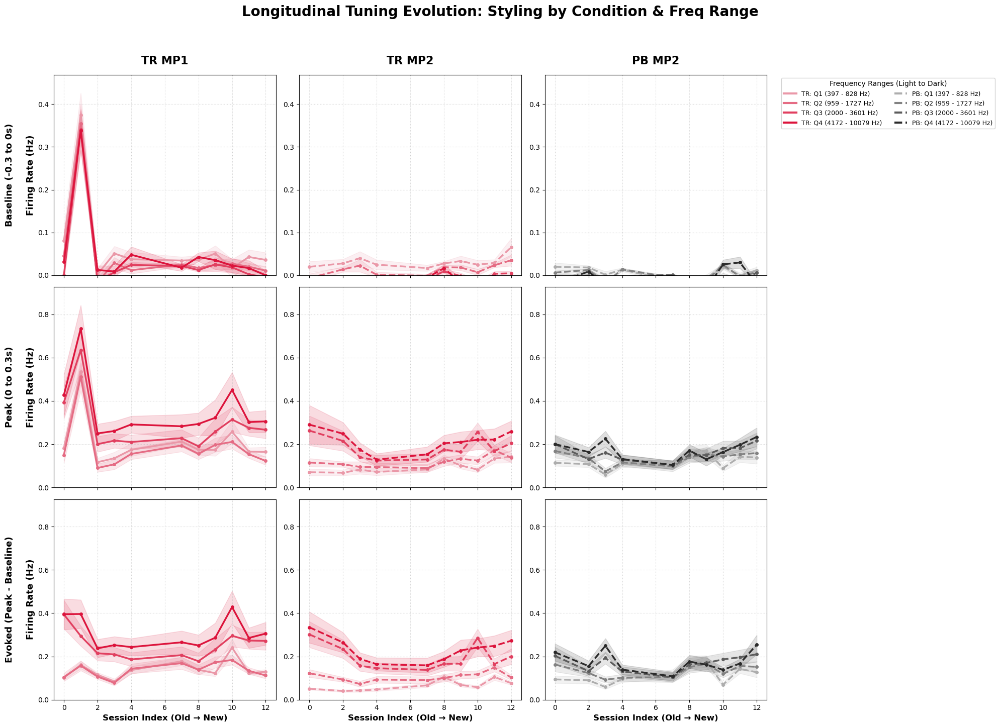


📊 统计信息: 每个数据点包含的有效 Trigger 数量


NameError: name 'df_counts' is not defined

In [32]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.lines import Line2D

# =========================================================
# 1. 提取包含 Session、Condition 和 Trigger 数量的指标
# =========================================================
metrics_session_list = []

idx_trigger = n_bins_pre
idx_bl_start = idx_trigger - int(0.3 / dt)
idx_peak_end = idx_trigger + int(0.3 / dt)

for (s_idx, f_group, label), df_sub in df_events.groupby(['sess_idx', 'Freq_Group', 'label']):
    segs = np.stack(df_sub['segment'].values, axis=0)
    
    # 获取当前组合下的有效 Trigger 数量
    n_triggers = segs.shape[0] 
    
    # 跨 Trigger 求平均，得到每个神经元的 PSTH
    neuron_means = np.mean(segs, axis=0) 
    
    for n in range(neuron_means.shape[0]):
        psth = neuron_means[n, :]
        bl = np.mean(psth[idx_bl_start:idx_trigger])
        pk = np.max(psth[idx_trigger:idx_peak_end])
        
        metrics_session_list.append({
            'Session': s_idx,
            'Freq_Group': f_group,
            'Label': label,
            'Baseline': bl,
            'Peak': pk,
            'Evoked': pk - bl,
            'n_Triggers': n_triggers  # 新增：记录 Trigger 数量
        })

df_sess_metrics = pd.DataFrame(metrics_session_list)

# =========================================================
# 2. 颜色与线型配置
# =========================================================

colors_red = sns.light_palette("crimson", n_colors=6)[2:]  
colors_blk = sns.color_palette("Greys", n_colors=6)[2:]    

conditions_config = [
    ('TR_Orig', 'TR MP1', colors_red, '-'),   
    ('TR_Inv',  'TR MP2', colors_red, '--'),  
    ('PB_Inv',  'PB MP2', colors_blk, '--')   
]

metrics_rows = [
    ('Baseline', 'Baseline (-0.3 to 0s)'), 
    ('Peak', 'Peak (0 to 0.3s)'), 
    ('Evoked', 'Evoked (Peak - Baseline)')
]

# =========================================================
# 3. 动态计算 Y 轴上限
# =========================================================
bl_stats = df_sess_metrics.groupby(['Label', 'Session', 'Freq_Group'])['Baseline'].agg(['mean', 'sem'])
y_max_bl = (bl_stats['mean'] + bl_stats['sem']).max() * 1.1

pe_stats = df_sess_metrics.melt(id_vars=['Label', 'Session', 'Freq_Group'], value_vars=['Peak', 'Evoked'])
pe_grouped = pe_stats.groupby(['Label', 'Session', 'Freq_Group', 'variable'])['value'].agg(['mean', 'sem'])
y_max_pe = (pe_grouped['mean'] + pe_grouped['sem']).max() * 1.1

# =========================================================
# 4. 绘制矩阵图
# =========================================================
fig, axes = plt.subplots(3, 3, figsize=(20, 14), sharex=True)

for row, (metric_key, metric_title) in enumerate(metrics_rows):
    for col, (label_key, cond_name, palette, ls) in enumerate(conditions_config):
        ax = axes[row, col]
        
        plot_df = df_sess_metrics[df_sess_metrics['Label'] == label_key]
        if plot_df.empty: continue
            
        stats = plot_df.groupby(['Freq_Group', 'Session'])[metric_key].agg(['mean', 'sem']).reset_index()
        
        for i, freq_grp in enumerate(ordered_labels):
            grp_data = stats[stats['Freq_Group'] == freq_grp]
            if grp_data.empty: continue
                
            ax.plot(grp_data['Session'], grp_data['mean'], 
                    color=palette[i], linestyle=ls, linewidth=2.5, 
                    marker='o', markersize=4)
            
            ax.fill_between(grp_data['Session'], 
                            grp_data['mean'] - grp_data['sem'], 
                            grp_data['mean'] + grp_data['sem'], 
                            color=palette[i], alpha=0.15)

        if row == 0:
            ax.set_ylim(0, y_max_bl)
            ax.set_title(cond_name, fontsize=16, fontweight='bold', pad=15)
        else:
            ax.set_ylim(0, y_max_pe)
            
        ax.grid(True, linestyle=':', alpha=0.6)
        
        if col == 0:
            ax.set_ylabel(f'{metric_title}\n\nFiring Rate (Hz)', fontsize=13, fontweight='bold')
        if row == 2:
            ax.set_xlabel('Session Index (Old → New)', fontsize=12, fontweight='bold')

# =========================================================
# 5. 自定义全局图例 
# =========================================================

tr_lines = [Line2D([0], [0], color=colors_red[i], lw=3) for i in range(4)]
tr_labels = [f"TR: {lbl}" for lbl in ordered_labels]

pb_lines = [Line2D([0], [0], color=colors_blk[i], lw=3, linestyle='--') for i in range(4)]
pb_labels = [f"PB: {lbl}" for lbl in ordered_labels]

legend_handles = tr_lines + pb_lines
legend_labels = tr_labels + pb_labels

axes[0, 2].legend(legend_handles, legend_labels, 
                  title='Frequency Ranges (Light to Dark)', 
                  fontsize=9, title_fontsize=10, 
                  loc='upper left', bbox_to_anchor=(1.05, 1), 
                  framealpha=0.9, ncol=2)

plt.suptitle("Longitudinal Tuning Evolution: Styling by Condition & Freq Range", 
             fontsize=20, fontweight='bold', y=1.03)
plt.tight_layout()
plt.show()

# =========================================================
# 6. 输出每个数据点的 Trigger 数量统计表
# =========================================================
print("\n" + "=" * 70)
print("📊 统计信息: 每个数据点包含的有效 Trigger 数量")
print("=" * 70)

# 与提取出的元数据合并
df_counts = df_counts.merge(df_meta, left_on='Session', right_on='Session_Idx', how='left')

# 生成透视表，这次把 index 改成 Combined_Name (真实的文件夹名)
count_pivot = df_counts.pivot_table(
    index=['Label', 'Combined_Name'],  # <--- 这里换成了真实的名称
    columns='Freq_Group', 
    values='n_Triggers', 
    aggfunc='first'
).fillna(0).astype(int)

if all(col in count_pivot.columns for col in ordered_labels):
    count_pivot = count_pivot[ordered_labels]

print("\n" + "=" * 90)
print("📊 统计信息: 每个数据点包含的有效 Trigger 数量 (带真实 Session 名称)")
print("=" * 90)
print(count_pivot.to_string())
print("=" * 90 + "\n")

✅ 成功提取了 17859 个有效 MP2 Trigger。
🎯 选取的绘图目标频率 (Played Frequency): [  397.   617.   959.  1490.  2317.  3601.  5598. 10079.]


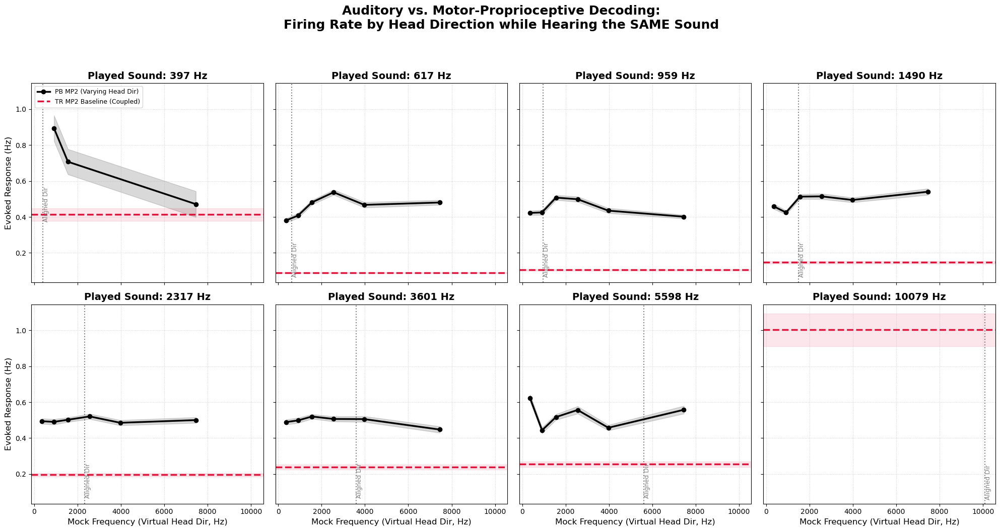

In [33]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# =========================================================
# 1. 重新提取 Trigger 数据 (安全过滤纯 MP1 Session)
# =========================================================
events_mock = []

# 定义时间窗和 bin 数量
idx_trigger = n_bins_pre
idx_bl_start = idx_trigger - int(0.3 / dt)
idx_peak_end = idx_trigger + int(0.3 / dt)
bins_03s = int(0.3 / dt)

for sess_idx, (n_data, f_data) in enumerate(zip(n_data_s, f_data_s)):
    # --- 过滤机制 1：缺少基础结构，跳过 ---
    if 'Mapping_Type' not in f_data.columns:
        continue
        
    # --- 过滤机制 2：如果压根没有 Mock_frequency 这列，说明是纯 TR 或者是旧数据，直接跳过 ---
    if 'Mock_frequency' not in f_data.columns:
        # print(f"⚠️ Session {sess_idx} 没有 Mock_frequency 列，已跳过。")
        continue

    # --- 过滤机制 3：如果这个 Session 里面完全没有 MP2 (Mapping_Type == 1) 的试次，也跳过 ---
    if 1 not in f_data['Mapping_Type'].values:
        # print(f"⚠️ Session {sess_idx} 只有 MP1，已跳过。")
        continue

    # 现在提取就绝对安全了
    freqs = f_data['Played_frequency'].values
    mock_freqs = f_data['Mock_frequency'].values  
    changes = f_data['Frequency_changes'].values
    conditions = f_data['Condition'].values
    mapping_types = f_data['Mapping_Type'].values
    
    trigger_indices = np.flatnonzero(changes == 1)
    
    for k, i in enumerate(trigger_indices):
        if i == 0: continue
        
        # 过滤 0.3s 内的密集 Trigger
        if k > 0 and (i - trigger_indices[k-1]) <= bins_03s:
            continue
            
        f_post = freqs[i]
        m_post = mock_freqs[i]
        cond = conditions[i]
        m_type = mapping_types[i]
        
        # 我们只提取 MP2 的情况
        if cond == 0 and m_type == 1:
            label = 'TR_Inv'  # TR MP2
            # TR 条件下，运动和声音耦合，用 Played_frequency 作为基准头方向
            m_post = f_post 
        elif cond == 1 and m_type == 1:
            label = 'PB_Inv'  # PB MP2
        else:
            continue
            
        start = int(i - n_bins_pre)
        stop = int(i + n_bins_post)
        
        if start >= 0 and stop <= n_data.shape[-1] and n_data[:, start:stop].shape[1] == expected_length:
            segment = n_data[:, start:stop]
            events_mock.append({
                'sess_idx': sess_idx,
                'label': label,
                'Played_Freq': f_post,
                'Mock_Freq': m_post,  # 代表头部方向
                'segment': segment
            })

df_mock_events = pd.DataFrame(events_mock)

print(f"✅ 成功提取了 {len(df_mock_events)} 个有效 MP2 Trigger。")

# =========================================================
# 2. 计算 Evoked Response
# =========================================================
metrics_mock = []

for (s_idx, label, p_freq, m_freq), df_sub in df_mock_events.groupby(['sess_idx', 'label', 'Played_Freq', 'Mock_Freq']):
    segs = np.stack(df_sub['segment'].values, axis=0)
    neuron_means = np.mean(segs, axis=0) 
    
    for n in range(neuron_means.shape[0]):
        psth = neuron_means[n, :]
        bl = np.mean(psth[idx_bl_start:idx_trigger])
        pk = np.max(psth[idx_trigger:idx_peak_end])
        
        metrics_mock.append({
            'Label': label,
            'Played_Freq': p_freq,
            'Mock_Freq': m_freq,
            'Evoked': pk - bl
        })

df_metrics_mock = pd.DataFrame(metrics_mock)

# =========================================================
# 3. 选取 8 个频率并进行可视化
# =========================================================

# 找出所有在 PB 和 TR 中都出现过的有效 Played_frequency
valid_freqs = df_metrics_mock['Played_Freq'].dropna().unique()
valid_freqs = np.sort(valid_freqs)

if len(valid_freqs) < 8:
    print(f"⚠️ 警告：总共只有 {len(valid_freqs)} 个不同频率，不足 8 个，将全部显示。")
    selected_freqs = valid_freqs
else:
    # 均匀选取 8 个频率 (从低到高)
    indices = np.linspace(0, len(valid_freqs) - 1, 8).astype(int)
    selected_freqs = valid_freqs[indices]

print(f"🎯 选取的绘图目标频率 (Played Frequency): {selected_freqs}")

# 创建 2x4 画布
fig, axes = plt.subplots(2, 4, figsize=(20, 10), sharey=True, sharex=True)
axes = axes.flatten()

# 将 Mock_frequency 进行分箱 (Binning)，以便画出平滑的曲线
# 这里把头部方向分为 6 个空间区间
mock_bins = np.percentile(df_metrics_mock['Mock_Freq'].dropna(), np.linspace(0, 100, 7))

for i, target_freq in enumerate(selected_freqs):
    if i >= len(axes): break
    ax = axes[i]
    
    # --- 1. 处理 PB MP2 (绘制随头部方向变化的曲线) ---
    pb_data = df_metrics_mock[(df_metrics_mock['Label'] == 'PB_Inv') & (df_metrics_mock['Played_Freq'] == target_freq)].copy()
    
    if not pb_data.empty:
        # 给 Mock_Freq 打上 bin 标签，取每个 bin 的中值作为 X 坐标
        pb_data['Mock_Bin'] = pd.cut(pb_data['Mock_Freq'], bins=mock_bins, labels=False, include_lowest=True)
        bin_centers = [np.mean(mock_bins[b:b+2]) for b in range(len(mock_bins)-1)]
        pb_data['Mock_X'] = pb_data['Mock_Bin'].map(lambda x: bin_centers[x] if pd.notnull(x) else np.nan)
        
        pb_stats = pb_data.groupby('Mock_X')['Evoked'].agg(['mean', 'sem']).dropna().reset_index()
        
        # 黑线：PB MP2
        ax.plot(pb_stats['Mock_X'], pb_stats['mean'], color='black', linewidth=2.5, marker='o', label='PB MP2 (Varying Head Dir)')
        ax.fill_between(pb_stats['Mock_X'], pb_stats['mean'] - pb_stats['sem'], pb_stats['mean'] + pb_stats['sem'], color='black', alpha=0.15)

    # --- 2. 处理 TR MP2 (绘制基准线) ---
    tr_data = df_metrics_mock[(df_metrics_mock['Label'] == 'TR_Inv') & (df_metrics_mock['Played_Freq'] == target_freq)]
    
    if not tr_data.empty:
        tr_mean = tr_data['Evoked'].mean()
        tr_sem = tr_data['Evoked'].sem()
        
        # 红虚线：TR MP2
        ax.axhline(tr_mean, color='crimson', linestyle='--', linewidth=2.5, label='TR MP2 Baseline (Coupled)')
        ax.axhspan(tr_mean - tr_sem, tr_mean + tr_sem, color='crimson', alpha=0.1)

    # --- 3. 图表装饰 ---
    ax.axvline(target_freq, color='gray', linestyle=':', linewidth=1.5, zorder=0)
    ax.text(target_freq, ax.get_ylim()[0], '  Aligned Dir', color='gray', fontsize=9, va='bottom', rotation=90)

    ax.set_title(f"Played Sound: {target_freq:.0f} Hz", fontsize=14, fontweight='bold')
    ax.grid(True, linestyle=':', alpha=0.6)
    
    if i >= 4:
        ax.set_xlabel('Mock Frequency (Virtual Head Dir, Hz)', fontsize=12)
    if i % 4 == 0:
        ax.set_ylabel('Evoked Response (Hz)', fontsize=12)
        
    if i == 0:
        ax.legend(fontsize=9, loc='upper left')

plt.suptitle("Auditory vs. Motor-Proprioceptive Decoding:\nFiring Rate by Head Direction while Hearing the SAME Sound", 
             fontsize=18, fontweight='bold', y=1.05)
plt.tight_layout()
plt.show()

✅ 成功提取了 17859 个有效 MP2 Trigger。
🎯 总共有 23 个有效目标频率 (Played Frequency) 需要绘制。


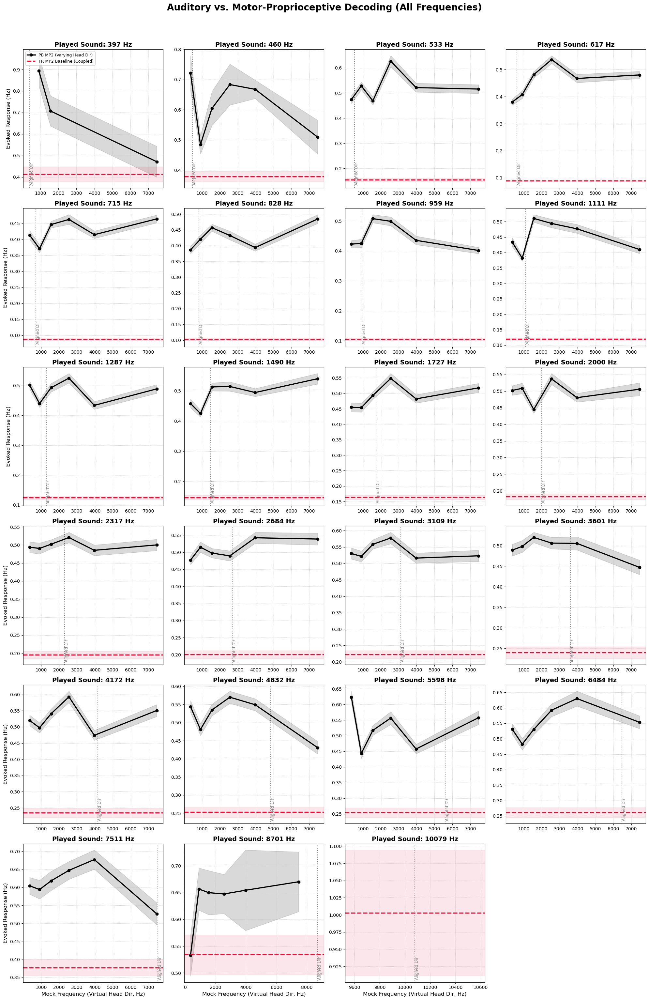


📊 样本数全统计: 每个声音 (Played Freq) 在不同虚拟头部方向 (Mock Freq) 的 Trigger 数量
         Dir_1 (~358Hz)  Dir_2 (~913Hz)  Dir_3 (~1556Hz)  Dir_4 (~2554Hz)  Dir_5 (~3970Hz)  Dir_6 (~7456Hz)  TR_Coupled_Total
397.0                 0               2                1                0                0                1                 5
460.0                 8              13                9                1                8                7                49
533.0                74              56               45               23               36               35               303
617.0               147             116              100               51               81               92               684
715.0               171             150              119               79              118              131               845
828.0               155             149              120               94              106              119               788
959.0               132             137              

In [34]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import math

# =========================================================
# 1. 重新提取 Trigger 数据 (安全过滤纯 MP1 Session)
# =========================================================
events_mock = []

idx_trigger = n_bins_pre
idx_bl_start = idx_trigger - int(0.3 / dt)
idx_peak_end = idx_trigger + int(0.3 / dt)
bins_03s = int(0.3 / dt)

for sess_idx, (n_data, f_data) in enumerate(zip(n_data_s, f_data_s)):
    if 'Mapping_Type' not in f_data.columns or 'Mock_frequency' not in f_data.columns:
        continue
    if 1 not in f_data['Mapping_Type'].values:
        continue

    freqs = f_data['Played_frequency'].values
    mock_freqs = f_data['Mock_frequency'].values  
    changes = f_data['Frequency_changes'].values
    conditions = f_data['Condition'].values
    mapping_types = f_data['Mapping_Type'].values
    
    trigger_indices = np.flatnonzero(changes == 1)
    
    for k, i in enumerate(trigger_indices):
        if i == 0: continue
        
        if k > 0 and (i - trigger_indices[k-1]) <= bins_03s:
            continue
            
        f_post = freqs[i]
        m_post = mock_freqs[i]
        cond = conditions[i]
        m_type = mapping_types[i]
        
        if cond == 0 and m_type == 1:
            label = 'TR_Inv'  
            m_post = f_post 
        elif cond == 1 and m_type == 1:
            label = 'PB_Inv'  
        else:
            continue
            
        start = int(i - n_bins_pre)
        stop = int(i + n_bins_post)
        
        if start >= 0 and stop <= n_data.shape[-1] and n_data[:, start:stop].shape[1] == expected_length:
            segment = n_data[:, start:stop]
            events_mock.append({
                'sess_idx': sess_idx,
                'label': label,
                'Played_Freq': f_post,
                'Mock_Freq': m_post,  
                'segment': segment
            })

df_mock_events = pd.DataFrame(events_mock)
print(f"✅ 成功提取了 {len(df_mock_events)} 个有效 MP2 Trigger。")

# =========================================================
# 2. 计算 Evoked Response
# =========================================================
metrics_mock = []

for (s_idx, label, p_freq, m_freq), df_sub in df_mock_events.groupby(['sess_idx', 'label', 'Played_Freq', 'Mock_Freq']):
    segs = np.stack(df_sub['segment'].values, axis=0)
    neuron_means = np.mean(segs, axis=0) 
    
    for n in range(neuron_means.shape[0]):
        psth = neuron_means[n, :]
        bl = np.mean(psth[idx_bl_start:idx_trigger])
        pk = np.max(psth[idx_trigger:idx_peak_end])
        
        metrics_mock.append({
            'Label': label,
            'Played_Freq': p_freq,
            'Mock_Freq': m_freq,
            'Evoked': pk - bl
        })

df_metrics_mock = pd.DataFrame(metrics_mock)

# =========================================================
# 3. 动态画布绘制：所有有效频率
# =========================================================

valid_freqs = df_metrics_mock['Played_Freq'].dropna().unique()
selected_freqs = np.sort(valid_freqs)
n_freqs = len(selected_freqs)

print(f"🎯 总共有 {n_freqs} 个有效目标频率 (Played Frequency) 需要绘制。")

n_cols = 4  
n_rows = math.ceil(n_freqs / n_cols) 

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows), sharey=0, sharex=0)

if n_rows * n_cols > 1:
    axes = axes.flatten()
else:
    axes = [axes]

# 统一分箱
mock_bins = np.percentile(df_metrics_mock['Mock_Freq'].dropna(), np.linspace(0, 100, 7))

for i, target_freq in enumerate(selected_freqs):
    ax = axes[i]
    
    # --- PB MP2 ---
    pb_data = df_metrics_mock[(df_metrics_mock['Label'] == 'PB_Inv') & (df_metrics_mock['Played_Freq'] == target_freq)].copy()
    if not pb_data.empty:
        pb_data['Mock_Bin'] = pd.cut(pb_data['Mock_Freq'], bins=mock_bins, labels=False, include_lowest=True)
        bin_centers = [np.mean(mock_bins[b:b+2]) for b in range(len(mock_bins)-1)]
        pb_data['Mock_X'] = pb_data['Mock_Bin'].map(lambda x: bin_centers[x] if pd.notnull(x) else np.nan)
        
        pb_stats = pb_data.groupby('Mock_X')['Evoked'].agg(['mean', 'sem']).dropna().reset_index()
        
        ax.plot(pb_stats['Mock_X'], pb_stats['mean'], color='black', linewidth=2.5, marker='o', label='PB MP2 (Varying Head Dir)')
        ax.fill_between(pb_stats['Mock_X'], pb_stats['mean'] - pb_stats['sem'], pb_stats['mean'] + pb_stats['sem'], color='black', alpha=0.15)

    # --- TR MP2 ---
    tr_data = df_metrics_mock[(df_metrics_mock['Label'] == 'TR_Inv') & (df_metrics_mock['Played_Freq'] == target_freq)]
    if not tr_data.empty:
        tr_mean = tr_data['Evoked'].mean()
        tr_sem = tr_data['Evoked'].sem()
        
        ax.axhline(tr_mean, color='crimson', linestyle='--', linewidth=2.5, label='TR MP2 Baseline (Coupled)')
        ax.axhspan(tr_mean - tr_sem, tr_mean + tr_sem, color='crimson', alpha=0.1)

    # --- 装饰 ---
    ax.axvline(target_freq, color='gray', linestyle=':', linewidth=1.5, zorder=0)
    y_min, y_max = ax.get_ylim()
    ax.text(target_freq, y_min, '  Aligned Dir', color='gray', fontsize=9, va='bottom', rotation=90)

    ax.set_title(f"Played Sound: {target_freq:.0f} Hz", fontsize=14, fontweight='bold')
    ax.grid(True, linestyle=':', alpha=0.6)
    
    if i >= n_cols * (n_rows - 1):
        ax.set_xlabel('Mock Frequency (Virtual Head Dir, Hz)', fontsize=12)
    if i % n_cols == 0:
        ax.set_ylabel('Evoked Response (Hz)', fontsize=12)
        
    if i == 0:
        ax.legend(fontsize=9, loc='upper left')

for j in range(n_freqs, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Auditory vs. Motor-Proprioceptive Decoding (All Frequencies)", 
             fontsize=20, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# =========================================================
# 5. 输出完整 Trigger (样本数) 统计表
# =========================================================
print("\n" + "=" * 100)
print("📊 样本数全统计: 每个声音 (Played Freq) 在不同虚拟头部方向 (Mock Freq) 的 Trigger 数量")
print("=" * 100)

# 1. 确定所有的频率基准 (包含 TR 和 PB)
all_unique_freqs = np.sort(df_mock_events['Played_Freq'].unique())

# 2. 处理 PB 数据统计
df_pb_trigs = df_mock_events[df_mock_events['label'] == 'PB_Inv'].copy()
if not df_pb_trigs.empty:
    # 按照画图的逻辑对 Mock_Freq 进行相同的分箱
    df_pb_trigs['Mock_Bin'] = pd.cut(df_pb_trigs['Mock_Freq'], bins=mock_bins, labels=False, include_lowest=True)
    
    # 格式化表头
    bin_labels = [f"Dir_{i+1} (~{np.mean(mock_bins[i:i+2]):.0f}Hz)" for i in range(len(mock_bins)-1)]
    df_pb_trigs['Mock_Dir_Label'] = df_pb_trigs['Mock_Bin'].map(lambda x: bin_labels[int(x)] if pd.notnull(x) else "Unknown")
    
    # 透视表：PB 的分布
    pivot_pb = pd.pivot_table(
        df_pb_trigs,
        index='Played_Freq',
        columns='Mock_Dir_Label',
        values='segment', # 任意一列进行计数
        aggfunc='count',
        fill_value=0
    )
    # 补全可能缺失的列 (Dir_1 到 Dir_6)
    for lbl in bin_labels:
        if lbl not in pivot_pb.columns:
            pivot_pb[lbl] = 0
    pivot_pb = pivot_pb[bin_labels] # 排序
else:
    # 如果完全没有 PB 数据，创建一个空的 DataFrame
    bin_labels = [f"Dir_{i+1} (~{np.mean(mock_bins[i:i+2]):.0f}Hz)" for i in range(len(mock_bins)-1)]
    pivot_pb = pd.DataFrame(0, index=all_unique_freqs, columns=bin_labels)

# 3. 处理 TR 数据统计
df_tr_counts = df_mock_events[df_mock_events['label'] == 'TR_Inv'].groupby('Played_Freq').size()

# 4. 合并所有结果到统一的频率基准索引上
final_stats = pd.DataFrame(index=all_unique_freqs)
final_stats = final_stats.join(pivot_pb, how='left').fillna(0).astype(int)
final_stats['TR_Coupled_Total'] = df_tr_counts
final_stats['TR_Coupled_Total'] = final_stats['TR_Coupled_Total'].fillna(0).astype(int)

# 5. 打印结果
print(final_stats.to_string())
print("-" * 100)
print(f"总计频率数: {len(final_stats)} | 总计 PB Trigger: {final_stats[bin_labels].values.sum()} | 总计 TR Trigger: {final_stats['TR_Coupled_Total'].sum()}")
print("=" * 100 + "\n")

✅ 成功提取了 17859 个有效 MP2 Trigger。
🎯 总共有 23 个有效目标频率 (Played Frequency) 需要绘制。


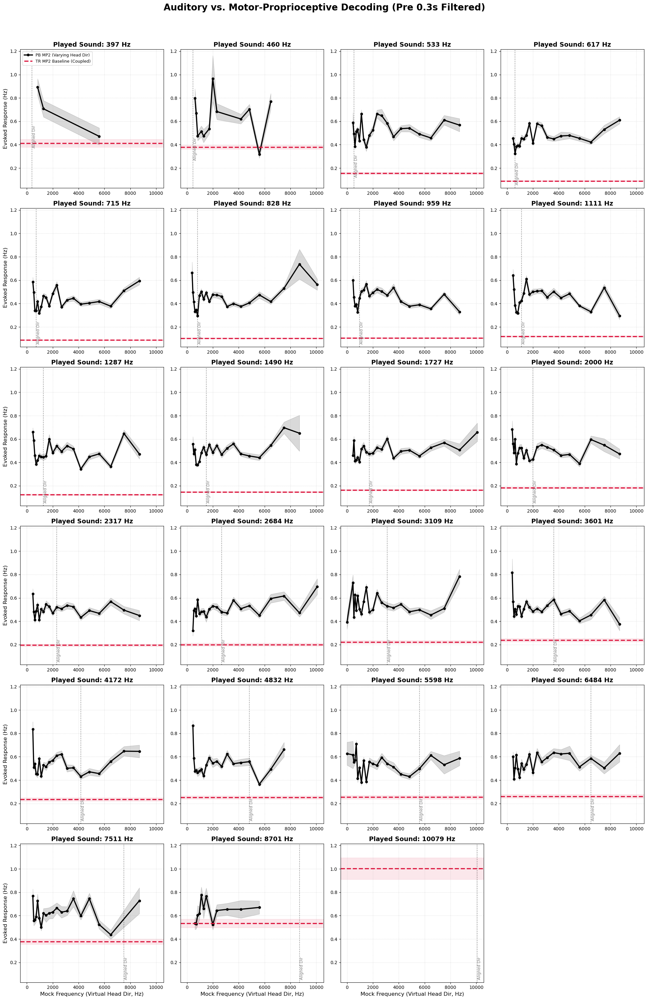


📊 样本数全统计: 每个声音 (Played Freq) 在每个具体的虚拟头部方向 (Mock Freq) 的 Trigger 数量
Mock_Freq    0.0  397.0  460.0  533.0  617.0  715.0  828.0  959.0  1111.0  1287.0  1490.0  1727.0  2000.0  2317.0  2684.0  3109.0  3601.0  4172.0  4832.0  5598.0  6484.0  7511.0  8701.0  10079.0  TR_Coupled_Total
Played_Freq                                                                                                                                                                                                         
397.0          0      0      0      0      0      0      2      0       0       1       0       0       0       0       0       0       0       0       0       1       0       0       0        0                 5
460.0          0      0      0      0      3      5     10      1       2       4       0       3       2       1       0       0       0       3       5       3       1       3       0        0                49
533.0          0      0      1     16     28     29     18     23      15      1

In [35]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

# =========================================================
# 1. 重新提取 Trigger 数据 (安全过滤)
# =========================================================
events_mock = []

idx_trigger = n_bins_pre
idx_bl_start = idx_trigger - int(0.3 / dt)
idx_peak_end = idx_trigger + int(0.3 / dt)
bins_03s = int(0.3 / dt)

for sess_idx, (n_data, f_data) in enumerate(zip(n_data_s, f_data_s)):
    if 'Mapping_Type' not in f_data.columns or 'Mock_frequency' not in f_data.columns:
        continue
    if 1 not in f_data['Mapping_Type'].values:
        continue

    freqs = f_data['Played_frequency'].values
    mock_freqs = f_data['Mock_frequency'].values  
    changes = f_data['Frequency_changes'].values
    conditions = f_data['Condition'].values
    mapping_types = f_data['Mapping_Type'].values
    
    trigger_indices = np.flatnonzero(changes == 1)
    
    for k, i in enumerate(trigger_indices):
        if i == 0: continue
        if k > 0 and (i - trigger_indices[k-1]) <= bins_03s: continue
            
        f_post = freqs[i]
        m_post = mock_freqs[i]
        cond = conditions[i]
        m_type = mapping_types[i]
        
        if cond == 0 and m_type == 1:
            label = 'TR_Inv'  
            m_post = f_post # TR 条件下，声音和头方向强绑定
        elif cond == 1 and m_type == 1:
            label = 'PB_Inv'  
        else:
            continue
            
        start = int(i - n_bins_pre)
        stop = int(i + n_bins_post)
        
        if start >= 0 and stop <= n_data.shape[-1] and n_data[:, start:stop].shape[1] == expected_length:
            segment = n_data[:, start:stop]
            events_mock.append({
                'sess_idx': sess_idx,
                'label': label,
                'Played_Freq': np.round(f_post, 1), # 统一舍入到1位小数，防止浮点误差导致无法正确 Group
                'Mock_Freq': np.round(m_post, 1),   
                'segment': segment
            })

df_mock_events = pd.DataFrame(events_mock)
print(f"✅ 成功提取了 {len(df_mock_events)} 个有效 MP2 Trigger。")

# =========================================================
# 2. 计算 Evoked Response
# =========================================================
metrics_mock = []

# 直接按真实的 played 和 mock 频率进行分组聚合
for (s_idx, label, p_freq, m_freq), df_sub in df_mock_events.groupby(['sess_idx', 'label', 'Played_Freq', 'Mock_Freq']):
    segs = np.stack(df_sub['segment'].values, axis=0)
    neuron_means = np.mean(segs, axis=0) 
    
    for n in range(neuron_means.shape[0]):
        psth = neuron_means[n, :]
        bl = np.mean(psth[idx_bl_start:idx_trigger])
        pk = np.max(psth[idx_trigger:idx_peak_end])
        
        metrics_mock.append({
            'Label': label,
            'Played_Freq': p_freq,
            'Mock_Freq': m_freq,
            'Evoked': pk - bl
        })

df_metrics_mock = pd.DataFrame(metrics_mock)

# =========================================================
# 3. 动态画布绘制：所有有效频率 (按真实 Mock 连线)
# =========================================================

valid_freqs = df_metrics_mock['Played_Freq'].dropna().unique()
selected_freqs = np.sort(valid_freqs)
n_freqs = len(selected_freqs)

print(f"🎯 总共有 {n_freqs} 个有效目标频率 (Played Frequency) 需要绘制。")

n_cols = 4  
n_rows = math.ceil(n_freqs / n_cols) 

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows), sharey=True, sharex=True)

if n_rows * n_cols > 1:
    axes = axes.flatten()
else:
    axes = [axes]

for i, target_freq in enumerate(selected_freqs):
    ax = axes[i]
    
    # --- PB MP2 (按离散 Mock_Freq 计算均值并连线) ---
    pb_data = df_metrics_mock[(df_metrics_mock['Label'] == 'PB_Inv') & (df_metrics_mock['Played_Freq'] == target_freq)]
    if not pb_data.empty:
        # 直接按照真实的 Mock_Freq 聚合并计算 Mean / SEM
        pb_stats = pb_data.groupby('Mock_Freq')['Evoked'].agg(['mean', 'sem']).reset_index()
        pb_stats = pb_stats.sort_values('Mock_Freq')
        
        # 绘制黑线
        ax.plot(pb_stats['Mock_Freq'], pb_stats['mean'], color='black', linewidth=2.5, marker='o', markersize=5, label='PB MP2 (Varying Head Dir)')
        
        # 绘制误差带 (注意：如果某个 Mock_Freq 只有 1 个 trial，SEM 会是 NaN，fill_between 会自动断开该处的阴影)
        ax.fill_between(pb_stats['Mock_Freq'], 
                        pb_stats['mean'] - pb_stats['sem'], 
                        pb_stats['mean'] + pb_stats['sem'], 
                        color='black', alpha=0.15)

    # --- TR MP2 (红虚线基准) ---
    tr_data = df_metrics_mock[(df_metrics_mock['Label'] == 'TR_Inv') & (df_metrics_mock['Played_Freq'] == target_freq)]
    if not tr_data.empty:
        tr_mean = tr_data['Evoked'].mean()
        tr_sem = tr_data['Evoked'].sem()
        
        ax.axhline(tr_mean, color='crimson', linestyle='--', linewidth=2.5, label='TR MP2 Baseline (Coupled)')
        ax.axhspan(tr_mean - tr_sem, tr_mean + tr_sem, color='crimson', alpha=0.1)

    # --- 装饰 ---
    ax.axvline(target_freq, color='gray', linestyle=':', linewidth=1.5, zorder=0)
    y_min, y_max = ax.get_ylim()
    ax.text(target_freq, y_min, '  Aligned Dir', color='gray', fontsize=9, va='bottom', rotation=90)

    ax.tick_params(labelleft=True, labelbottom=True)
    ax.set_title(f"Played Sound: {target_freq:.0f} Hz", fontsize=14, fontweight='bold')
    ax.grid(True, linestyle=':', alpha=0.6)
    
    if i >= n_cols * (n_rows - 1):
        ax.set_xlabel('Mock Frequency (Virtual Head Dir, Hz)', fontsize=12)
    if i % n_cols == 0:
        ax.set_ylabel('Evoked Response (Hz)', fontsize=12)
        
    if i == 0:
        ax.legend(fontsize=9, loc='upper left')

for j in range(n_freqs, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Auditory vs. Motor-Proprioceptive Decoding (Pre 0.3s Filtered)", 
             fontsize=20, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# =========================================================
# 4. 输出样本分布统计表 (高分辨率，保留所有独立的 Mock Freq)
# =========================================================
print("\n" + "=" * 100)
print("📊 样本数全统计: 每个声音 (Played Freq) 在每个具体的虚拟头部方向 (Mock Freq) 的 Trigger 数量")
print("=" * 100)

df_pb_trigs = df_mock_events[df_mock_events['label'] == 'PB_Inv']

if not df_pb_trigs.empty:
    # 行: 播放的声音 | 列: 所有被记录到的具体 Mock 频率
    pivot_pb = pd.pivot_table(
        df_pb_trigs,
        index='Played_Freq',
        columns='Mock_Freq',
        values='sess_idx',
        aggfunc='count',
        fill_value=0
    )
    
    # 附带 TR 的总量作为参考
    df_tr_counts = df_mock_events[df_mock_events['label'] == 'TR_Inv'].groupby('Played_Freq').size()
    
    final_stats = pivot_pb.copy()
    final_stats['TR_Coupled_Total'] = df_tr_counts
    final_stats['TR_Coupled_Total'] = final_stats['TR_Coupled_Total'].fillna(0).astype(int)
    
    # 因为列可能会很多（比如 28 列），这里只格式化打印，如果太长建议后续用 .to_excel() 导出查看
    print(final_stats.to_string())
else:
    print("没有找到 PB MP2 的数据。")
    
print("=" * 100 + "\n")

✅ 成功提取了 94489 个有效 MP2 Trigger。
🎯 总共有 24 个有效目标频率 (Played Frequency) 需要绘制。


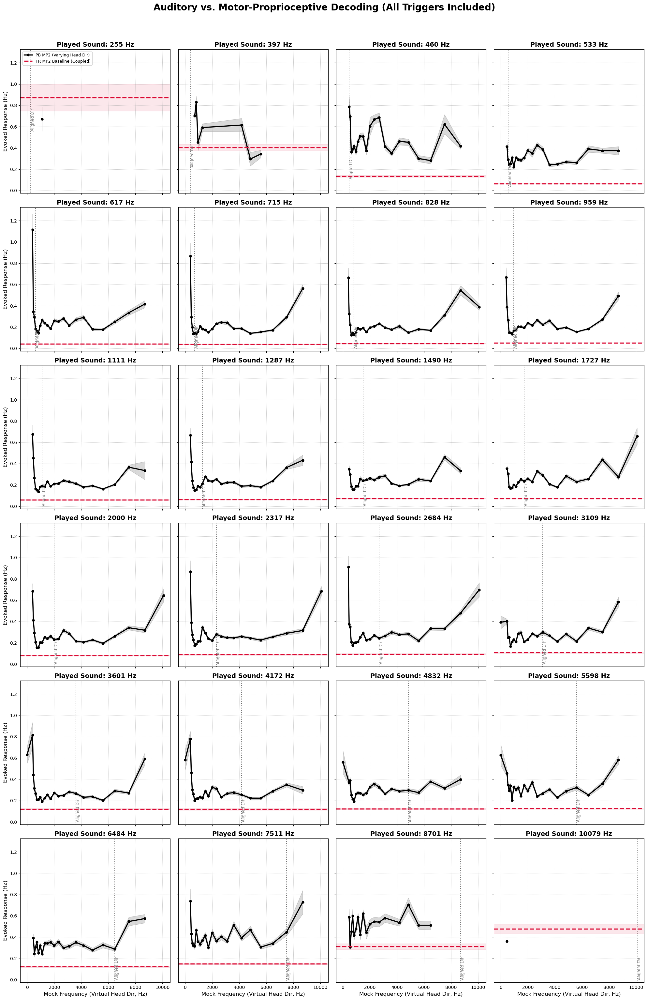


📊 样本数全统计: 每个声音 (Played Freq) 在每个具体的虚拟头部方向 (Mock Freq) 的 Trigger 数量
Mock_Freq    0.0  397.0  460.0  533.0  617.0  715.0  828.0  959.0  1111.0  1287.0  1490.0  1727.0  2000.0  2317.0  2684.0  3109.0  3601.0  4172.0  4832.0  5598.0  6484.0  7511.0  8701.0  10079.0  TR_Coupled_Total
Played_Freq                                                                                                                                                                                                         
255.0          0      0      0      0      0      0      0      0       1       0       0       0       0       0       0       0       0       0       0       0       0       0       0        0                 1
397.0          0      0      0      0      1      2      3      1       0       5       0       1       0       0       0       0       0       1       4       2       0       0       0        0                23
460.0          0      0      1      8     38     30     25     23       7      2

In [36]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

# =========================================================
# 1. 重新提取 Trigger 数据 (已移除 0.3s 密集 Trigger 过滤)
# =========================================================
events_mock = []

idx_trigger = n_bins_pre
idx_bl_start = idx_trigger - int(0.3 / dt)
idx_peak_end = idx_trigger + int(0.3 / dt)

for sess_idx, (n_data, f_data) in enumerate(zip(n_data_s, f_data_s)):
    if 'Mapping_Type' not in f_data.columns or 'Mock_frequency' not in f_data.columns:
        continue
    if 1 not in f_data['Mapping_Type'].values:
        continue

    freqs = f_data['Played_frequency'].values
    mock_freqs = f_data['Mock_frequency'].values  
    changes = f_data['Frequency_changes'].values
    conditions = f_data['Condition'].values
    mapping_types = f_data['Mapping_Type'].values
    
    trigger_indices = np.flatnonzero(changes == 1)
    
    # 恢复为最简单的遍历，不再判断相邻 Trigger 的间距
    for i in trigger_indices:
        if i == 0: continue
            
        f_post = freqs[i]
        m_post = mock_freqs[i]
        cond = conditions[i]
        m_type = mapping_types[i]
        
        if cond == 0 and m_type == 1:
            label = 'TR_Inv'  
            m_post = f_post # TR 条件下，声音和头方向强绑定
        elif cond == 1 and m_type == 1:
            label = 'PB_Inv'  
        else:
            continue
            
        start = int(i - n_bins_pre)
        stop = int(i + n_bins_post)
        
        if start >= 0 and stop <= n_data.shape[-1] and n_data[:, start:stop].shape[1] == expected_length:
            segment = n_data[:, start:stop]
            events_mock.append({
                'sess_idx': sess_idx,
                'label': label,
                'Played_Freq': np.round(f_post, 1), # 统一舍入到1位小数，防止浮点精度误差
                'Mock_Freq': np.round(m_post, 1),   
                'segment': segment
            })

df_mock_events = pd.DataFrame(events_mock)
print(f"✅ 成功提取了 {len(df_mock_events)} 个有效 MP2 Trigger。")

# =========================================================
# 2. 计算 Evoked Response
# =========================================================
metrics_mock = []

# 直接按真实的 played 和 mock 频率进行分组聚合
for (s_idx, label, p_freq, m_freq), df_sub in df_mock_events.groupby(['sess_idx', 'label', 'Played_Freq', 'Mock_Freq']):
    segs = np.stack(df_sub['segment'].values, axis=0)
    neuron_means = np.mean(segs, axis=0) 
    
    for n in range(neuron_means.shape[0]):
        psth = neuron_means[n, :]
        bl = np.mean(psth[idx_bl_start:idx_trigger])
        pk = np.max(psth[idx_trigger:idx_peak_end])
        
        metrics_mock.append({
            'Label': label,
            'Played_Freq': p_freq,
            'Mock_Freq': m_freq,
            'Evoked': pk - bl
        })

df_metrics_mock = pd.DataFrame(metrics_mock)

# =========================================================
# 3. 动态画布绘制：所有有效频率 (按真实 Mock 连线)
# =========================================================

valid_freqs = df_metrics_mock['Played_Freq'].dropna().unique()
selected_freqs = np.sort(valid_freqs)
n_freqs = len(selected_freqs)

print(f"🎯 总共有 {n_freqs} 个有效目标频率 (Played Frequency) 需要绘制。")

n_cols = 4  
n_rows = math.ceil(n_freqs / n_cols) 

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows), sharey=True, sharex=True)

if n_rows * n_cols > 1:
    axes = axes.flatten()
else:
    axes = [axes]

for i, target_freq in enumerate(selected_freqs):
    ax = axes[i]
    
    # --- PB MP2 (按离散 Mock_Freq 计算均值并连线) ---
    pb_data = df_metrics_mock[(df_metrics_mock['Label'] == 'PB_Inv') & (df_metrics_mock['Played_Freq'] == target_freq)]
    if not pb_data.empty:
        pb_stats = pb_data.groupby('Mock_Freq')['Evoked'].agg(['mean', 'sem']).reset_index()
        pb_stats = pb_stats.sort_values('Mock_Freq')
        
        # 绘制黑线
        ax.plot(pb_stats['Mock_Freq'], pb_stats['mean'], color='black', linewidth=2.5, marker='o', markersize=5, label='PB MP2 (Varying Head Dir)')
        
        # 绘制误差带
        ax.fill_between(pb_stats['Mock_Freq'], 
                        pb_stats['mean'] - pb_stats['sem'], 
                        pb_stats['mean'] + pb_stats['sem'], 
                        color='black', alpha=0.15)

    # --- TR MP2 (红虚线基准) ---
    tr_data = df_metrics_mock[(df_metrics_mock['Label'] == 'TR_Inv') & (df_metrics_mock['Played_Freq'] == target_freq)]
    if not tr_data.empty:
        tr_mean = tr_data['Evoked'].mean()
        tr_sem = tr_data['Evoked'].sem()
        
        ax.axhline(tr_mean, color='crimson', linestyle='--', linewidth=2.5, label='TR MP2 Baseline (Coupled)')
        ax.axhspan(tr_mean - tr_sem, tr_mean + tr_sem, color='crimson', alpha=0.1)

    # --- 装饰 ---
    ax.axvline(target_freq, color='gray', linestyle=':', linewidth=1.5, zorder=0)
    y_min, y_max = ax.get_ylim()
    ax.text(target_freq, y_min, '  Aligned Dir', color='gray', fontsize=9, va='bottom', rotation=90)

    ax.set_title(f"Played Sound: {target_freq:.0f} Hz", fontsize=14, fontweight='bold')
    ax.grid(True, linestyle=':', alpha=0.6)
    
    if i >= n_cols * (n_rows - 1):
        ax.set_xlabel('Mock Frequency (Virtual Head Dir, Hz)', fontsize=12)
    if i % n_cols == 0:
        ax.set_ylabel('Evoked Response (Hz)', fontsize=12)
        
    if i == 0:
        ax.legend(fontsize=9, loc='upper left')

for j in range(n_freqs, len(axes)):
    fig.delaxes(axes[j])

plt.suptitle("Auditory vs. Motor-Proprioceptive Decoding (All Triggers Included)", 
             fontsize=20, fontweight='bold', y=1.02)
plt.tight_layout()
plt.show()

# =========================================================
# 4. 输出样本分布统计表 (高分辨率，保留所有独立的 Mock Freq)
# =========================================================
print("\n" + "=" * 100)
print("📊 样本数全统计: 每个声音 (Played Freq) 在每个具体的虚拟头部方向 (Mock Freq) 的 Trigger 数量")
print("=" * 100)

df_pb_trigs = df_mock_events[df_mock_events['label'] == 'PB_Inv']

if not df_pb_trigs.empty:
    pivot_pb = pd.pivot_table(
        df_pb_trigs,
        index='Played_Freq',
        columns='Mock_Freq',
        values='sess_idx',
        aggfunc='count',
        fill_value=0
    )
    
    df_tr_counts = df_mock_events[df_mock_events['label'] == 'TR_Inv'].groupby('Played_Freq').size()
    
    final_stats = pivot_pb.copy()
    final_stats['TR_Coupled_Total'] = df_tr_counts
    final_stats['TR_Coupled_Total'] = final_stats['TR_Coupled_Total'].fillna(0).astype(int)
    
    print(final_stats.to_string())
else:
    print("没有找到 PB MP2 的数据。")
    
print("=" * 100 + "\n")

✅ 成功提取了 94489 个有效 MP2 Trigger。
🎯 按照自定义边界 [..., 958, 1999, 4171, ...] 将频率划分至 4 个组。


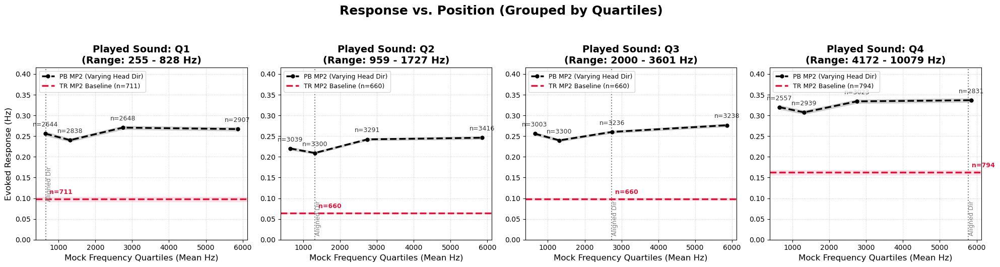


📊 样本数聚合统计: 按照 Quartile 划分的 Trigger 数量
Mock_Freq_Q      Q1    Q2    Q3    Q4  TR_Coupled_Total
Played_Freq_Q                                          
Q1             4282  3254  2379  3480             14042
Q2             4169  3458  2709  3560             15154
Q3             3173  2725  2148  2619             11580
Q4             1992  1990  1843  1695              8237



In [6]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

# =========================================================
# 1. 重新提取 Trigger 数据
# =========================================================
events_mock = []

idx_trigger = n_bins_pre
idx_bl_start = idx_trigger - int(0.3 / dt)
idx_peak_end = idx_trigger + int(0.3 / dt)

for sess_idx, (n_data, f_data) in enumerate(zip(n_data_s, f_data_s)):
    if 'Mapping_Type' not in f_data.columns or 'Mock_frequency' not in f_data.columns:
        continue
    if 1 not in f_data['Mapping_Type'].values:
        continue

    freqs = f_data['Played_frequency'].values
    mock_freqs = f_data['Mock_frequency'].values  
    changes = f_data['Frequency_changes'].values
    conditions = f_data['Condition'].values
    mapping_types = f_data['Mapping_Type'].values
    
    trigger_indices = np.flatnonzero(changes == 1)
    
    for i in trigger_indices:
        if i == 0: continue
            
        f_post = freqs[i]
        m_post = mock_freqs[i]
        cond = conditions[i]
        m_type = mapping_types[i]
        
        if cond == 0 and m_type == 1:
            label = 'TR_Inv'  
            m_post = f_post # TR 条件下，声音和头方向强绑定
        elif cond == 1 and m_type == 1:
            label = 'PB_Inv'  
        else:
            continue
            
        start = int(i - n_bins_pre)
        stop = int(i + n_bins_post)
        
        if start >= 0 and stop <= n_data.shape[-1] and n_data[:, start:stop].shape[1] == expected_length:
            segment = n_data[:, start:stop]
            events_mock.append({
                'sess_idx': sess_idx,
                'label': label,
                'Played_Freq': np.round(f_post, 1), 
                'Mock_Freq': np.round(m_post, 1),   
                'segment': segment
            })

df_mock_events = pd.DataFrame(events_mock)
print(f"✅ 成功提取了 {len(df_mock_events)} 个有效 MP2 Trigger。")

# =========================================================
# 2. 计算 Evoked Response
# =========================================================
metrics_mock = []

for (s_idx, label, p_freq, m_freq), df_sub in df_mock_events.groupby(['sess_idx', 'label', 'Played_Freq', 'Mock_Freq']):
    segs = np.stack(df_sub['segment'].values, axis=0)
    neuron_means = np.mean(segs, axis=0) 
    
    for n in range(neuron_means.shape[0]):
        psth = neuron_means[n, :]
        bl = np.mean(psth[idx_bl_start:idx_trigger])
        pk = np.max(psth[idx_trigger:idx_peak_end])
        
        metrics_mock.append({
            'Label': label,
            'Played_Freq': p_freq,
            'Mock_Freq': m_freq,
            'Evoked': pk - bl
        })

df_metrics_mock = pd.DataFrame(metrics_mock)

# =========================================================
# 2.5. 自定义强制边界划分 Quartiles
# =========================================================
# 提取初始分位数边界并转化为 list
bin_edges = df_metrics_mock['Played_Freq'].quantile([0, 0.25, 0.5, 0.75, 1.0]).tolist()

# 🌟 强制修改边界，确保特定频率落在正确的 Q 中 🌟
bin_edges[1] = 958
bin_edges[2] = 1999 
bin_edges[3] = 4171 

# 将首尾替换为无穷大，确保无论数据如何变动，边缘数据绝不会变成 NaN
bin_edges[0] = -np.inf
bin_edges[-1] = np.inf

played_labels = ["Q1", "Q2", "Q3", "Q4"]
mock_labels = ["Q1", "Q2", "Q3", "Q4"]

# 使用 pd.cut 进行绝对数值切分 (include_lowest=True 保证边界值的包容性)
df_metrics_mock['Played_Freq_Q'] = pd.cut(df_metrics_mock['Played_Freq'], bins=bin_edges, labels=played_labels, include_lowest=True)
df_metrics_mock['Mock_Freq_Q'] = pd.cut(df_metrics_mock['Mock_Freq'], bins=bin_edges, labels=mock_labels, include_lowest=True)

played_q_means = df_metrics_mock.groupby('Played_Freq_Q', observed=False)['Played_Freq'].mean()
mock_q_means = df_metrics_mock.groupby('Mock_Freq_Q', observed=False)['Mock_Freq'].mean()

print(f"🎯 按照自定义边界 [..., 958, 1999, 4171, ...] 将频率划分至 4 个组。")

# 同步将自定义边界映射回 event 级别的 DataFrame
df_mock_events['Played_Freq_Q'] = pd.cut(df_mock_events['Played_Freq'], bins=bin_edges, labels=played_labels, include_lowest=True)
df_mock_events['Mock_Freq_Q'] = pd.cut(df_mock_events['Mock_Freq'], bins=bin_edges, labels=mock_labels, include_lowest=True)

# =========================================================
# 3. 画布绘制：按 4 个 Quartiles 绘图
# =========================================================
n_cols = len(played_labels)
fig, axes = plt.subplots(1, n_cols, figsize=(5 * n_cols, 5), sharey=True)

if n_cols == 1:
    axes = [axes]

for i, q_label in enumerate(played_labels):
    ax = axes[i]
    
    # 获取当前 Quartile 的平均值（仅用于确定 Aligned Dir 虚线的 X 坐标）
    target_mean_freq = played_q_means[q_label]
    
    # 🌟 新增：计算当前 Played Freq Quartile 的最大值和最小值 (Range) 🌟
    current_q_data = df_metrics_mock[df_metrics_mock['Played_Freq_Q'] == q_label]
    q_min = current_q_data['Played_Freq'].min()
    q_max = current_q_data['Played_Freq'].max()
    
    # --- PB MP2 (按 Mock_Freq_Q 计算均值并连线) ---
    pb_data = df_metrics_mock[(df_metrics_mock['Label'] == 'PB_Inv') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
    if not pb_data.empty:
        # 按照 Mock 频率的 quartile 分组聚合
        pb_stats = pb_data.groupby('Mock_Freq_Q')['Evoked'].agg(['mean', 'sem', 'count']).reset_index()
        # 映射回该 Quartile 的真实平均频率用于绘图 (X坐标)
        pb_stats['x_hz'] = pb_stats['Mock_Freq_Q'].map(mock_q_means)
        pb_stats = pb_stats.dropna(subset=['x_hz']).sort_values('x_hz')
        
        ax.plot(pb_stats['x_hz'], pb_stats['mean'], color='black', linewidth=2.5, marker='o', markersize=5, label='PB MP2 (Varying Head Dir)', linestyle='--')
        ax.fill_between(pb_stats['x_hz'], 
                        pb_stats['mean'] - pb_stats['sem'], 
                        pb_stats['mean'] + pb_stats['sem'], 
                        color='black', alpha=0.15)
                        
        # 黑点标注 n 数
        for _, row in pb_stats.iterrows():
            ax.annotate(f"n={int(row['count'])}", 
                        xy=(row['x_hz'], row['mean']), 
                        xytext=(0, 8), 
                        textcoords='offset points',
                        ha='center', va='bottom', 
                        fontsize=9, color='black', alpha=0.8)

    # --- TR MP2 (红虚线基准) ---
    tr_data = df_metrics_mock[(df_metrics_mock['Label'] == 'TR_Inv') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
    if not tr_data.empty:
        tr_mean = tr_data['Evoked'].mean()
        tr_sem = tr_data['Evoked'].sem()
        tr_n = len(tr_data)
        
        ax.axhline(tr_mean, color='crimson', linestyle='--', linewidth=2.5, label=f'TR MP2 Baseline (n={tr_n})')
        ax.axhspan(tr_mean - tr_sem, tr_mean + tr_sem, color='crimson', alpha=0.1)

        # 在红虚线上直接标注 TR 的 n 数
        ax.annotate(f"n={tr_n}", 
                    xy=(target_mean_freq, tr_mean), 
                    xytext=(5, 5), 
                    textcoords='offset points',
                    ha='left', va='bottom', 
                    fontsize=9, color='crimson', fontweight='bold')

    # --- 装饰 ---
    ax.axvline(target_mean_freq, color='gray', linestyle=':', linewidth=1.5, zorder=0)
    
    # 动态 Y 轴调整
    y_min, y_max = ax.get_ylim()
    axes[0].set_ylim(0, y_max * 1.1)
    ax.tick_params(labelleft=True)
    
    ax.text(target_mean_freq, y_min, '  Aligned Dir', color='gray', fontsize=9, va='bottom', rotation=90)

    # 🌟 修改：标题显示 Quartile 及该区间的 Range (最小 - 最大 Hz) 🌟
    ax.set_title(f"Played Sound: {q_label}\n(Range: {q_min:.0f} - {q_max:.0f} Hz)", fontsize=14, fontweight='bold')
    
    ax.grid(True, linestyle=':', alpha=0.6)
    ax.set_xlabel('Mock Frequency Quartiles (Mean Hz)', fontsize=12)
    
    if i == 0:
        ax.set_ylabel('Evoked Response (Hz)', fontsize=12)
        
    ax.legend(fontsize=9, loc='upper left')

plt.suptitle("Response vs. Position (Grouped by Quartiles)", 
             fontsize=18, fontweight='bold', y=1.05)
plt.tight_layout()
plt.show()

# =========================================================
# 4. 输出样本分布统计表 (Quartile 级)
# =========================================================
print("\n" + "=" * 80)
print("📊 样本数聚合统计: 按照 Quartile 划分的 Trigger 数量")
print("=" * 80)

df_pb_trigs = df_mock_events[df_mock_events['label'] == 'PB_Inv']

if not df_pb_trigs.empty:
    pivot_pb = pd.pivot_table(
        df_pb_trigs,
        index='Played_Freq_Q',
        columns='Mock_Freq_Q',
        values='sess_idx',
        aggfunc='count',
        fill_value=0
    )
    
    df_tr_counts = df_mock_events[df_mock_events['label'] == 'TR_Inv'].groupby('Played_Freq_Q').size()
    
    final_stats = pivot_pb.copy()
    final_stats['TR_Coupled_Total'] = df_tr_counts
    final_stats['TR_Coupled_Total'] = final_stats['TR_Coupled_Total'].fillna(0).astype(int)
    
    print(final_stats.to_string())
else:
    print("没有找到 PB MP2 的数据。")
    
print("=" * 80 + "\n")

✅ 成功提取了 208452 个有效 Trigger (包含 MP1 & MP2)。
🎯 按照自定义边界将频率划分至 4 个组。


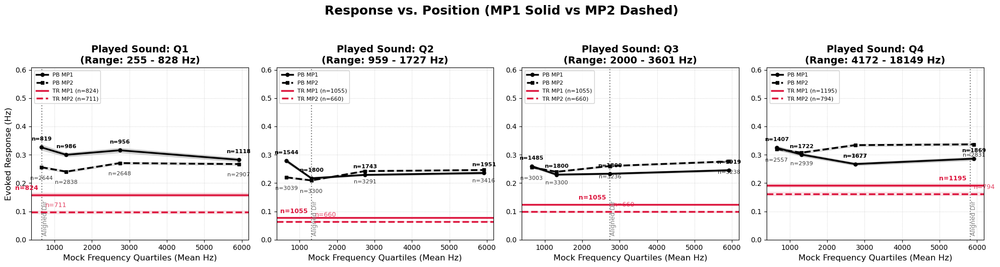


📊 样本数聚合统计: 按照 Quartile 划分的 Trigger 数量

--- PB_Orig & TR_Orig ---
Mock_Freq_Q      Q1    Q2    Q3    Q4  TR_Total
Played_Freq_Q                                  
Q1             1012  1008  1433  1624      8263
Q2             2765  3541  3234  4012     24110
Q3             2412  2995  3504  3423     22000
Q4             1842  2083  2428  2662     19612

--- PB_Inv & TR_Inv ---
Mock_Freq_Q      Q1    Q2    Q3    Q4  TR_Total
Played_Freq_Q                                  
Q1             4282  3254  2379  3480     14042
Q2             4169  3458  2709  3560     15154
Q3             3173  2725  2148  2619     11580
Q4             1992  1990  1843  1695      8237




In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

# =========================================================
# 1. 重新提取 Trigger 数据 (完美适配字符串与数字标签)
# =========================================================
events_mock = []

idx_trigger = n_bins_pre
idx_bl_start = idx_trigger - int(0.3 / dt)
idx_peak_end = idx_trigger + int(0.3 / dt)

for sess_idx, (n_data, f_data) in enumerate(zip(n_data_s, f_data_s)):
    # 兼容性检查
    if 'Mapping_Type' not in f_data.columns or 'Frequency_changes' not in f_data.columns:
        continue
    
    freqs = f_data['Played_frequency'].values
    mock_freqs = f_data['Mock_frequency'].values if 'Mock_frequency' in f_data.columns else freqs
    changes = f_data['Frequency_changes'].values
    conditions = f_data['Condition'].values
    mapping_types = f_data['Mapping_Type'].values
    
    trigger_indices = np.flatnonzero(changes == 1)
    
    for i in trigger_indices:
        if i == 0: continue
            
        f_post = freqs[i]
        m_post = mock_freqs[i]
        
        # 强制转换为标准的数值和字符串，防止 Pandas 类型推断带来的坑
        cond = float(conditions[i]) if pd.notna(conditions[i]) else -1.0
        m_type = str(mapping_types[i]).strip()
        
        # 🌟 核心修改：兼容新的字符串 ('MP1', 'MP2', 'Standalone') 和旧数字 ('0.0', '1.0') 🌟
        is_mp2 = m_type in ['MP2', '1.0', '1']
        is_mp1 = m_type in ['MP1', 'Standalone', '0.0', '0']
        
        if cond == 0.0 and is_mp2:
            label = 'TR_Inv'  # TR MP2
            m_post = f_post 
        elif cond == 1.0 and is_mp2:
            label = 'PB_Inv'  # PB MP2
        elif cond == 0.0 and is_mp1:
            label = 'TR_Orig' # TR MP1
            m_post = f_post
        elif cond == 1.0 and is_mp1:
            label = 'PB_Orig' # PB MP1
        else:
            continue
            
        start = int(i - n_bins_pre)
        stop = int(i + n_bins_post)
        
        if start >= 0 and stop <= n_data.shape[-1] and n_data[:, start:stop].shape[1] == expected_length:
            segment = n_data[:, start:stop]
            events_mock.append({
                'sess_idx': sess_idx,
                'label': label,
                'Played_Freq': np.round(f_post, 1), 
                'Mock_Freq': np.round(m_post, 1),   
                'segment': segment
            })

df_mock_events = pd.DataFrame(events_mock)
print(f"✅ 成功提取了 {len(df_mock_events)} 个有效 Trigger (包含 MP1 & MP2)。")

# =========================================================
# 2. 计算 Evoked Response (带空表保护)
# =========================================================
metrics_mock = []

if not df_mock_events.empty:
    for (s_idx, label, p_freq, m_freq), df_sub in df_mock_events.groupby(['sess_idx', 'label', 'Played_Freq', 'Mock_Freq']):
        segs = np.stack(df_sub['segment'].values, axis=0)
        neuron_means = np.mean(segs, axis=0) 
        
        for n in range(neuron_means.shape[0]):
            psth = neuron_means[n, :]
            bl = np.mean(psth[idx_bl_start:idx_trigger])
            pk = np.max(psth[idx_trigger:idx_peak_end])
            
            metrics_mock.append({
                'Label': label,
                'Played_Freq': p_freq,
                'Mock_Freq': m_freq,
                'Evoked': pk - bl
            })
else:
    print("⚠️ 警告: 没有提取到任何数据，后续绘图可能报错。")

df_metrics_mock = pd.DataFrame(metrics_mock)

# =========================================================
# 2.5. 自定义强制边界划分 Quartiles
# =========================================================
if not df_metrics_mock.empty:
    bin_edges = df_metrics_mock['Played_Freq'].quantile([0, 0.25, 0.5, 0.75, 1.0]).tolist()
    
    bin_edges[1] = 958
    bin_edges[2] = 1999 
    bin_edges[3] = 4171 
    bin_edges[0] = -np.inf
    bin_edges[-1] = np.inf
    
    played_labels = ["Q1", "Q2", "Q3", "Q4"]
    mock_labels = ["Q1", "Q2", "Q3", "Q4"]
    
    df_metrics_mock['Played_Freq_Q'] = pd.cut(df_metrics_mock['Played_Freq'], bins=bin_edges, labels=played_labels, include_lowest=True)
    df_metrics_mock['Mock_Freq_Q'] = pd.cut(df_metrics_mock['Mock_Freq'], bins=bin_edges, labels=mock_labels, include_lowest=True)
    
    played_q_means = df_metrics_mock.groupby('Played_Freq_Q', observed=False)['Played_Freq'].mean()
    mock_q_means = df_metrics_mock.groupby('Mock_Freq_Q', observed=False)['Mock_Freq'].mean()
    
    print(f"🎯 按照自定义边界将频率划分至 4 个组。")
    
    df_mock_events['Played_Freq_Q'] = pd.cut(df_mock_events['Played_Freq'], bins=bin_edges, labels=played_labels, include_lowest=True)
    df_mock_events['Mock_Freq_Q'] = pd.cut(df_mock_events['Mock_Freq'], bins=bin_edges, labels=mock_labels, include_lowest=True)

# =========================================================
# 3. 画布绘制：包含 MP1(实线) 和 MP2(虚线)
# =========================================================
if not df_metrics_mock.empty:
    n_cols = len(played_labels)
    fig, axes = plt.subplots(1, n_cols, figsize=(5 * n_cols, 5), sharey=True)
    
    if n_cols == 1:
        axes = [axes]
    
    for i, q_label in enumerate(played_labels):
        ax = axes[i]
        
        target_mean_freq = played_q_means[q_label]
        current_q_data = df_metrics_mock[df_metrics_mock['Played_Freq_Q'] == q_label]
        q_min = current_q_data['Played_Freq'].min()
        q_max = current_q_data['Played_Freq'].max()
        
        # ---------------------------------------------------------
        # 1. PB MP1 (黑实线)
        # ---------------------------------------------------------
        pb1_data = df_metrics_mock[(df_metrics_mock['Label'] == 'PB_Orig') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
        if not pb1_data.empty:
            pb1_stats = pb1_data.groupby('Mock_Freq_Q', observed=False)['Evoked'].agg(['mean', 'sem', 'count']).reset_index()
            pb1_stats['x_hz'] = pb1_stats['Mock_Freq_Q'].map(mock_q_means)
            pb1_stats = pb1_stats.dropna(subset=['x_hz']).sort_values('x_hz')
            
            ax.plot(pb1_stats['x_hz'], pb1_stats['mean'], color='black', linewidth=2.5, marker='o', markersize=5, label='PB MP1', linestyle='-')
            ax.fill_between(pb1_stats['x_hz'], pb1_stats['mean'] - pb1_stats['sem'], pb1_stats['mean'] + pb1_stats['sem'], color='black', alpha=0.15)
                            
            for _, row in pb1_stats.iterrows():
                ax.annotate(f"n={int(row['count'])}", xy=(row['x_hz'], row['mean']), xytext=(0, 8), 
                            textcoords='offset points', ha='center', va='bottom', fontsize=8, color='black', fontweight='bold')
    
        # ---------------------------------------------------------
        # 2. PB MP2 (黑虚线)
        # ---------------------------------------------------------
        pb2_data = df_metrics_mock[(df_metrics_mock['Label'] == 'PB_Inv') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
        if not pb2_data.empty:
            pb2_stats = pb2_data.groupby('Mock_Freq_Q', observed=False)['Evoked'].agg(['mean', 'sem', 'count']).reset_index()
            pb2_stats['x_hz'] = pb2_stats['Mock_Freq_Q'].map(mock_q_means)
            pb2_stats = pb2_stats.dropna(subset=['x_hz']).sort_values('x_hz')
            
            ax.plot(pb2_stats['x_hz'], pb2_stats['mean'], color='black', linewidth=2.5, marker='s', markersize=5, label='PB MP2', linestyle='--')
            ax.fill_between(pb2_stats['x_hz'], pb2_stats['mean'] - pb2_stats['sem'], pb2_stats['mean'] + pb2_stats['sem'], color='black', alpha=0.1)
                            
            for _, row in pb2_stats.iterrows():
                ax.annotate(f"n={int(row['count'])}", xy=(row['x_hz'], row['mean']), xytext=(0, -12), 
                            textcoords='offset points', ha='center', va='top', fontsize=8, color='black', alpha=0.8)
    
        # ---------------------------------------------------------
        # 3. TR MP1 (红实线)
        # ---------------------------------------------------------
        tr1_data = df_metrics_mock[(df_metrics_mock['Label'] == 'TR_Orig') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
        if not tr1_data.empty:
            tr1_mean = tr1_data['Evoked'].mean()
            tr1_sem = tr1_data['Evoked'].sem()
            tr1_n = len(tr1_data)
            
            ax.axhline(tr1_mean, color='crimson', linestyle='-', linewidth=2.5, label=f'TR MP1 (n={tr1_n})')
            ax.axhspan(tr1_mean - tr1_sem, tr1_mean + tr1_sem, color='crimson', alpha=0.15)
    
            ax.annotate(f"n={tr1_n}", xy=(target_mean_freq, tr1_mean), xytext=(-5, 5), textcoords='offset points',
                        ha='right', va='bottom', fontsize=9, color='crimson', fontweight='bold')
    
        # ---------------------------------------------------------
        # 4. TR MP2 (红虚线)
        # ---------------------------------------------------------
        tr2_data = df_metrics_mock[(df_metrics_mock['Label'] == 'TR_Inv') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
        if not tr2_data.empty:
            tr2_mean = tr2_data['Evoked'].mean()
            tr2_sem = tr2_data['Evoked'].sem()
            tr2_n = len(tr2_data)
            
            ax.axhline(tr2_mean, color='crimson', linestyle='--', linewidth=2.5, label=f'TR MP2 (n={tr2_n})')
            ax.axhspan(tr2_mean - tr2_sem, tr2_mean + tr2_sem, color='crimson', alpha=0.1)
    
            ax.annotate(f"n={tr2_n}", xy=(target_mean_freq, tr2_mean), xytext=(5, 5), textcoords='offset points',
                        ha='left', va='bottom', fontsize=9, color='crimson', alpha=0.8)
    
        # --- 装饰 ---
        ax.axvline(target_mean_freq, color='gray', linestyle=':', linewidth=1.5, zorder=0)
        
        y_min, y_max = ax.get_ylim()
        axes[0].set_ylim(min(0, y_min), y_max * 1.15)
        ax.tick_params(labelleft=True)
        
        ax.text(target_mean_freq, axes[0].get_ylim()[0], '  Aligned Dir', color='gray', fontsize=9, va='bottom', rotation=90)
    
        ax.set_title(f"Played Sound: {q_label}\n(Range: {q_min:.0f} - {q_max:.0f} Hz)", fontsize=14, fontweight='bold')
        ax.grid(True, linestyle=':', alpha=0.6)
        ax.set_xlabel('Mock Frequency Quartiles (Mean Hz)', fontsize=12)
        
        if i == 0:
            ax.set_ylabel('Evoked Response (Hz)', fontsize=12)
            
        ax.legend(fontsize=8, loc='upper left', framealpha=0.9)
    
    plt.suptitle("Response vs. Position (MP1 Solid vs MP2 Dashed)", fontsize=18, fontweight='bold', y=1.05)
    plt.tight_layout()
    plt.show()

# =========================================================
# 4. 输出样本分布统计表 (包含 MP1 和 MP2)
# =========================================================
print("\n" + "=" * 80)
print("📊 样本数聚合统计: 按照 Quartile 划分的 Trigger 数量")
print("=" * 80)

if not df_mock_events.empty:
    for pb_label, tr_label in [('PB_Orig', 'TR_Orig'), ('PB_Inv', 'TR_Inv')]:
        print(f"\n--- {pb_label} & {tr_label} ---")
        df_pb_trigs = df_mock_events[df_mock_events['label'] == pb_label]
        
        if not df_pb_trigs.empty:
            pivot_pb = pd.pivot_table(
                df_pb_trigs, index='Played_Freq_Q', columns='Mock_Freq_Q',
                values='sess_idx', aggfunc='count', fill_value=0, observed=False
            )
            df_tr_counts = df_mock_events[df_mock_events['label'] == tr_label].groupby('Played_Freq_Q', observed=False).size()
            
            final_stats = pivot_pb.copy()
            final_stats['TR_Total'] = df_tr_counts
            final_stats['TR_Total'] = final_stats['TR_Total'].fillna(0).astype(int)
            
            print(final_stats.to_string())
        else:
            print(f"没有找到 {pb_label} 的数据。")
else:
    print("由于提取到的数据为空，无法生成统计表。")
        
print("\n" + "=" * 80 + "\n")

In [ ]:
import scipy.stats as stats
import itertools

# =========================================================
# 5. Statistical Significance Testing (Kruskal-Wallis & Post-hoc)
# =========================================================
print("\n" + "=" * 80)
print("Statistical Significance Test (Kruskal-Wallis H-test & Pairwise Post-hoc)")
print("=" * 80)

# --- Test 1: TR Baseline (保持不变) ---
print("[1] TR_MP2 (Baseline): Comparing Evoked Responses across 4 Played_Freq Quartiles")
tr_data = df_metrics_mock[df_metrics_mock['Label'] == 'TR_Inv']

if not tr_data.empty:
    tr_groups = [group['Evoked'].values for name, group in tr_data.groupby('Played_Freq_Q', observed=False)]
    tr_groups = [g for g in tr_groups if len(g) > 0]
    
    if len(tr_groups) > 1:
        stat, p_val = stats.kruskal(*tr_groups) 
        print(f" -> Kruskal-Wallis Stat: {stat:.4f}, p-value: {p_val:.4e}")
        if p_val < 0.05:
            print(" -> Conclusion: Significant [*]. Neuronal baseline responses differ across Played Freq quartiles.")
        else:
            print(" -> Conclusion: Not Significant [ns]. No statistical difference in baseline responses.")
else:
    print(" -> TR_Inv data not found.")

print("-" * 80)

# --- Test 2: PB Condition (增加了两两比较 Post-hoc 分析) ---
print("[2] PB_MP2: Comparison of Mock_Freq Quartiles within each Played_Freq")
pb_data = df_metrics_mock[df_metrics_mock['Label'] == 'PB_Inv']

if not pb_data.empty:
    for q_label in played_labels:
        sub_df = pb_data[pb_data['Played_Freq_Q'] == q_label]
        
        # 使用字典提取数据，以便在两两比较时知道具体是哪两个 Quartile
        pb_groups_dict = {name: group['Evoked'].values for name, group in sub_df.groupby('Mock_Freq_Q', observed=False) if len(group) > 0}
        group_names = list(pb_groups_dict.keys())
        pb_groups_list = list(pb_groups_dict.values())
        
        if len(pb_groups_list) > 1:
            # 1. 整体的 Kruskal-Wallis 检验 (Omnibus test)
            stat, p_val = stats.kruskal(*pb_groups_list)
            
            if p_val < 0.001: sig_star = "***"
            elif p_val < 0.01: sig_star = "**"
            elif p_val < 0.05: sig_star = "*"
            else: sig_star = "ns"
                
            print(f"\n 🎯 Played Freq [{q_label}] Overall: p-value = {p_val:.4e} ({sig_star})")
            
            # 2. 如果整体存在显著差异，则进行两两比较 (Post-hoc Mann-Whitney U test)
            if p_val < 0.05:
                print("      ↳ Post-hoc Pairwise Comparisons (Mann-Whitney U with Bonferroni correction):")
                # 生成所有可能的两两组合 (例如: Q1-Q2, Q1-Q3...)
                pairs = list(itertools.combinations(group_names, 2))
                num_comparisons = len(pairs)
                
                for name1, name2 in pairs:
                    data1 = pb_groups_dict[name1]
                    data2 = pb_groups_dict[name2]
                    
                    # 计算 Mann-Whitney U 
                    u_stat, p_pair = stats.mannwhitneyu(data1, data2, alternative='two-sided')
                    
                    # Bonferroni 校正: 将 p 值乘以比较的次数 (最高不超过 1.0)
                    p_adj = min(p_pair * num_comparisons, 1.0)
                    
                    if p_adj < 0.001: pair_star = "***"
                    elif p_adj < 0.01: pair_star = "**"
                    elif p_adj < 0.05: pair_star = "*"
                    else: pair_star = "ns"
                        
                    # 只打印出存在显著差异的组合，或者你可以去掉 if 打印所有结果
                    if p_adj < 0.05:
                        print(f"        • {name1} vs {name2}: p_adj = {p_adj:.4f} ({pair_star})")
                    # else:
                    #     print(f"        • {name1} vs {name2}: ns")
            else:
                 print("      ↳ No significant difference overall, skipping pairwise post-hoc.")

        else:
            print(f"\n 🎯 Played Freq [{q_label}]: Insufficient data in Mock Quartiles for testing.")
else:
    print(" -> PB_Inv data not found.")
    
print("=" * 80 + "\n")


Statistical Significance Test (Kruskal-Wallis H-test & Pairwise Post-hoc)
[1] TR_MP2 (Baseline): Comparing Evoked Responses across 4 Played_Freq Quartiles
 -> Kruskal-Wallis Stat: 521.2881, p-value: 1.1616e-112
 -> Conclusion: Significant [*]. Neuronal baseline responses differ across Played Freq quartiles.
--------------------------------------------------------------------------------
[2] PB_MP2: Comparison of Mock_Freq Quartiles within each Played_Freq

 🎯 Played Freq [Q1] Overall: p-value = 1.8217e-19 (***)
      ↳ Post-hoc Pairwise Comparisons (Mann-Whitney U with Bonferroni correction):
        • Q1 vs Q2: p_adj = 0.0103 (*)
        • Q1 vs Q3: p_adj = 0.0000 (***)
        • Q1 vs Q4: p_adj = 0.0000 (***)
        • Q2 vs Q3: p_adj = 0.0000 (***)
        • Q2 vs Q4: p_adj = 0.0153 (*)
        • Q3 vs Q4: p_adj = 0.0059 (**)

 🎯 Played Freq [Q2] Overall: p-value = 6.3313e-47 (***)
      ↳ Post-hoc Pairwise Comparisons (Mann-Whitney U with Bonferroni correction):
        • Q1 vs Q2

✅ 成功提取了 94489 个有效 MP2 Trigger。
🎯 按照自定义边界 [..., 958, 1999, 4171, ...] 将频率划分至 4 个组。


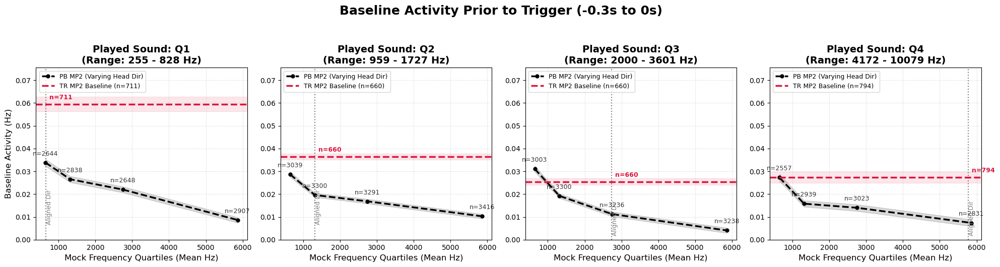


📊 样本数聚合统计: 按照 Quartile 划分的 Trigger 数量
Mock_Freq_Q      Q1    Q2    Q3    Q4  TR_Coupled_Total
Played_Freq_Q                                          
Q1             4282  3254  2379  3480             14042
Q2             4169  3458  2709  3560             15154
Q3             3173  2725  2148  2619             11580
Q4             1992  1990  1843  1695              8237


🔬 统计显著性检验 (Kruskal-Wallis H-test & Pairwise Post-hoc)
【1】TR_Inv: 比较 4 个 Played_Freq Quartiles 的 Baseline Activity
 -> Kruskal-Wallis Stat: 79.7440, p-value: 3.4829e-17
 -> 结论: 显著 [*]。神经元对不同真实声音频率的基线放电率 (Baseline) 存在显著差异。
--------------------------------------------------------------------------------
【2】PB_Inv: 在每个 Played_Freq 内，比较 4 个 Mock_Freq Quartiles (基线是否受头部方向调制)

 🎯 Played Freq [Q1] Overall: p-value = 2.9024e-40 (***)
      ↳ Post-hoc Pairwise Comparisons (Mann-Whitney U with Bonferroni correction):
        • Q1 vs Q2: p_adj = 0.0006 (***)
        • Q1 vs Q3: p_adj = 0.0000 (***)
        • Q1 vs Q4: p_adj = 0

In [7]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

# =========================================================
# 1. 重新提取 Trigger 数据
# =========================================================
events_mock = []

idx_trigger = n_bins_pre
idx_bl_start = idx_trigger - int(0.3 / dt)
idx_peak_end = idx_trigger + int(0.3 / dt)

for sess_idx, (n_data, f_data) in enumerate(zip(n_data_s, f_data_s)):
    if 'Mapping_Type' not in f_data.columns or 'Mock_frequency' not in f_data.columns:
        continue
    if 1 not in f_data['Mapping_Type'].values:
        continue

    freqs = f_data['Played_frequency'].values
    mock_freqs = f_data['Mock_frequency'].values  
    changes = f_data['Frequency_changes'].values
    conditions = f_data['Condition'].values
    mapping_types = f_data['Mapping_Type'].values
    
    trigger_indices = np.flatnonzero(changes == 1)
    
    for i in trigger_indices:
        if i == 0: continue
            
        f_post = freqs[i]
        m_post = mock_freqs[i]
        cond = conditions[i]
        m_type = mapping_types[i]
        
        if cond == 0 and m_type == 1:
            label = 'TR_Inv'  
            m_post = f_post # TR 条件下，声音和头方向强绑定
        elif cond == 1 and m_type == 1:
            label = 'PB_Inv'  
        else:
            continue
            
        start = int(i - n_bins_pre)
        stop = int(i + n_bins_post)
        
        if start >= 0 and stop <= n_data.shape[-1] and n_data[:, start:stop].shape[1] == expected_length:
            segment = n_data[:, start:stop]
            events_mock.append({
                'sess_idx': sess_idx,
                'label': label,
                'Played_Freq': np.round(f_post, 1), 
                'Mock_Freq': np.round(m_post, 1),   
                'segment': segment
            })

df_mock_events = pd.DataFrame(events_mock)
print(f"✅ 成功提取了 {len(df_mock_events)} 个有效 MP2 Trigger。")

# =========================================================
# 2. 计算 Baseline Activity
# =========================================================
metrics_mock = []

for (s_idx, label, p_freq, m_freq), df_sub in df_mock_events.groupby(['sess_idx', 'label', 'Played_Freq', 'Mock_Freq']):
    segs = np.stack(df_sub['segment'].values, axis=0)
    neuron_means = np.mean(segs, axis=0) 
    
    for n in range(neuron_means.shape[0]):
        psth = neuron_means[n, :]
        
        # 只提取 Baseline 阶段的放电率
        bl = np.mean(psth[idx_bl_start:idx_trigger])
        
        metrics_mock.append({
            'Label': label,
            'Played_Freq': p_freq,
            'Mock_Freq': m_freq,
            'Baseline': bl  # 存储为 Baseline
        })

df_metrics_mock = pd.DataFrame(metrics_mock)

# =========================================================
# 2.5. 自定义强制边界划分 Quartiles
# =========================================================
# 提取初始分位数边界并转化为 list
bin_edges = df_metrics_mock['Played_Freq'].quantile([0, 0.25, 0.5, 0.75, 1.0]).tolist()

# 🌟 强制修改边界，确保特定频率落在正确的 Q 中 🌟
bin_edges[1] = 958
bin_edges[2] = 1999 
bin_edges[3] = 4171 

# 将首尾替换为无穷大，确保无论数据如何变动，边缘数据绝不会变成 NaN
bin_edges[0] = -np.inf
bin_edges[-1] = np.inf

played_labels = ["Q1", "Q2", "Q3", "Q4"]
mock_labels = ["Q1", "Q2", "Q3", "Q4"]

# 使用 pd.cut 进行绝对数值切分 (include_lowest=True 保证边界值的包容性)
df_metrics_mock['Played_Freq_Q'] = pd.cut(df_metrics_mock['Played_Freq'], bins=bin_edges, labels=played_labels, include_lowest=True)
df_metrics_mock['Mock_Freq_Q'] = pd.cut(df_metrics_mock['Mock_Freq'], bins=bin_edges, labels=mock_labels, include_lowest=True)

played_q_means = df_metrics_mock.groupby('Played_Freq_Q', observed=False)['Played_Freq'].mean()
mock_q_means = df_metrics_mock.groupby('Mock_Freq_Q', observed=False)['Mock_Freq'].mean()

print(f"🎯 按照自定义边界 [..., 958, 1999, 4171, ...] 将频率划分至 4 个组。")

# 同步将自定义边界映射回 event 级别的 DataFrame
df_mock_events['Played_Freq_Q'] = pd.cut(df_mock_events['Played_Freq'], bins=bin_edges, labels=played_labels, include_lowest=True)
df_mock_events['Mock_Freq_Q'] = pd.cut(df_mock_events['Mock_Freq'], bins=bin_edges, labels=mock_labels, include_lowest=True)


# =========================================================
# 3. 画布绘制：按 4 个 Quartiles 绘图 (Baseline)
# =========================================================
n_cols = len(played_labels)
fig, axes = plt.subplots(1, n_cols, figsize=(5 * n_cols, 5), sharey=True)

if n_cols == 1:
    axes = [axes]

for i, q_label in enumerate(played_labels):
    ax = axes[i]
    
    target_mean_freq = played_q_means[q_label]
    current_q_data = df_metrics_mock[df_metrics_mock['Played_Freq_Q'] == q_label]
    q_min = current_q_data['Played_Freq'].min()
    q_max = current_q_data['Played_Freq'].max()
    
    # --- PB MP2 (提取 Baseline) ---
    pb_data = df_metrics_mock[(df_metrics_mock['Label'] == 'PB_Inv') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
    if not pb_data.empty:
        pb_stats = pb_data.groupby('Mock_Freq_Q', observed=False)['Baseline'].agg(['mean', 'sem', 'count']).reset_index()
        pb_stats['x_hz'] = pb_stats['Mock_Freq_Q'].map(mock_q_means)
        pb_stats = pb_stats.dropna(subset=['x_hz']).sort_values('x_hz')
        
        ax.plot(pb_stats['x_hz'], pb_stats['mean'], color='black', linewidth=2.5, marker='o', markersize=5, label='PB MP2 (Varying Head Dir)', linestyle='--')
        ax.fill_between(pb_stats['x_hz'], pb_stats['mean'] - pb_stats['sem'], pb_stats['mean'] + pb_stats['sem'], color='black', alpha=0.15)
                        
        for _, row in pb_stats.iterrows():
            ax.annotate(f"n={int(row['count'])}", xy=(row['x_hz'], row['mean']), xytext=(0, 8), 
                        textcoords='offset points', ha='center', va='bottom', fontsize=9, color='black', alpha=0.8)

    # --- TR MP2 (提取 Baseline 基准) ---
    tr_data = df_metrics_mock[(df_metrics_mock['Label'] == 'TR_Inv') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
    if not tr_data.empty:
        tr_mean = tr_data['Baseline'].mean()
        tr_sem = tr_data['Baseline'].sem()
        tr_n = len(tr_data)
        
        ax.axhline(tr_mean, color='crimson', linestyle='--', linewidth=2.5, label=f'TR MP2 Baseline (n={tr_n})')
        ax.axhspan(tr_mean - tr_sem, tr_mean + tr_sem, color='crimson', alpha=0.1)

        ax.annotate(f"n={tr_n}", xy=(target_mean_freq, tr_mean), xytext=(5, 5), textcoords='offset points',
                    ha='left', va='bottom', fontsize=9, color='crimson', fontweight='bold')

    # --- 装饰 ---
    ax.axvline(target_mean_freq, color='gray', linestyle=':', linewidth=1.5, zorder=0)
    ax.tick_params(labelleft=True)
    
    y_min, y_max = ax.get_ylim()
    ax.text(target_mean_freq, y_min, '  Aligned Dir', color='gray', fontsize=9, va='bottom', rotation=90)
    
    ax.set_title(f"Played Sound: {q_label}\n(Range: {q_min:.0f} - {q_max:.0f} Hz)", fontsize=14, fontweight='bold')
    ax.grid(True, linestyle=':', alpha=0.6)
    ax.set_xlabel('Mock Frequency Quartiles (Mean Hz)', fontsize=12)
    
    if i == 0:
        ax.set_ylabel('Baseline Activity (Hz)', fontsize=12)
        
    ax.legend(fontsize=9, loc='upper left')

# 🌟 全局 Y 轴优化 (移出循环，防止 sharey=True 导致冲突) 🌟
y_min, y_max = axes[0].get_ylim()
axes[0].set_ylim(0, y_max * 1.15) 

plt.suptitle("Baseline Activity Prior to Trigger (-0.3s to 0s)", fontsize=18, fontweight='bold', y=1.05)
plt.tight_layout()
plt.show()

# =========================================================
# 4. 输出样本分布统计表 (Quartile 级)
# =========================================================
print("\n" + "=" * 80)
print("📊 样本数聚合统计: 按照 Quartile 划分的 Trigger 数量")
print("=" * 80)

df_pb_trigs = df_mock_events[df_mock_events['label'] == 'PB_Inv']

if not df_pb_trigs.empty:
    pivot_pb = pd.pivot_table(df_pb_trigs, index='Played_Freq_Q', columns='Mock_Freq_Q', values='sess_idx', aggfunc='count', fill_value=0, observed=False)
    df_tr_counts = df_mock_events[df_mock_events['label'] == 'TR_Inv'].groupby('Played_Freq_Q', observed=False).size()
    
    final_stats = pivot_pb.copy()
    final_stats['TR_Coupled_Total'] = df_tr_counts
    final_stats['TR_Coupled_Total'] = final_stats['TR_Coupled_Total'].fillna(0).astype(int)
    
    print(final_stats.to_string())
else:
    print("没有找到 PB MP2 的数据。")
    
print("=" * 80 + "\n")

import scipy.stats as stats
import itertools

# =========================================================
# 5. 统计显著性检验 (Baseline: Kruskal-Wallis & Post-hoc)
# =========================================================
print("\n" + "=" * 80)
print("🔬 统计显著性检验 (Kruskal-Wallis H-test & Pairwise Post-hoc)")
print("=" * 80)

# --- 检验 1: TR Baseline 条件下，不同的 Played_Freq_Q 之间是否有差异？ ---
print("【1】TR_Inv: 比较 4 个 Played_Freq Quartiles 的 Baseline Activity")
tr_data = df_metrics_mock[df_metrics_mock['Label'] == 'TR_Inv']

if not tr_data.empty:
    # 🌟 注意这里提取的是 'Baseline' 🌟
    tr_groups = [group['Baseline'].values for name, group in tr_data.groupby('Played_Freq_Q', observed=False)]
    tr_groups = [g for g in tr_groups if len(g) > 0]
    
    if len(tr_groups) > 1:
        stat, p_val = stats.kruskal(*tr_groups) 
        print(f" -> Kruskal-Wallis Stat: {stat:.4f}, p-value: {p_val:.4e}")
        if p_val < 0.05:
            print(" -> 结论: 显著 [*]。神经元对不同真实声音频率的基线放电率 (Baseline) 存在显著差异。")
        else:
            print(" -> 结论: 不显著 [ns]。不同声音频率的基线放电率无统计学差异。")
else:
    print(" -> 缺少 TR_Inv 数据。")

print("-" * 80)

# --- 检验 2: PB 条件下，固定 Played_Freq，不同的 Mock_Freq_Q 之间是否有差异？ ---
print("【2】PB_Inv: 在每个 Played_Freq 内，比较 4 个 Mock_Freq Quartiles (基线是否受头部方向调制)")
pb_data = df_metrics_mock[df_metrics_mock['Label'] == 'PB_Inv']

if not pb_data.empty:
    for q_label in played_labels:
        sub_df = pb_data[pb_data['Played_Freq_Q'] == q_label]
        
        # 🌟 注意这里提取的是 'Baseline' 🌟
        pb_groups_dict = {name: group['Baseline'].values for name, group in sub_df.groupby('Mock_Freq_Q', observed=False) if len(group) > 0}
        group_names = list(pb_groups_dict.keys())
        pb_groups_list = list(pb_groups_dict.values())
        
        if len(pb_groups_list) > 1:
            # 1. 整体的 Kruskal-Wallis 检验 (Omnibus test)
            stat, p_val = stats.kruskal(*pb_groups_list)
            
            if p_val < 0.001: sig_star = "***"
            elif p_val < 0.01: sig_star = "**"
            elif p_val < 0.05: sig_star = "*"
            else: sig_star = "ns"
                
            print(f"\n 🎯 Played Freq [{q_label}] Overall: p-value = {p_val:.4e} ({sig_star})")
            
            # 2. 如果整体存在显著差异，则进行两两比较 (Post-hoc Mann-Whitney U test)
            if p_val < 0.05:
                print("      ↳ Post-hoc Pairwise Comparisons (Mann-Whitney U with Bonferroni correction):")
                # 生成所有可能的两两组合 (例如: Q1-Q2, Q1-Q3...)
                pairs = list(itertools.combinations(group_names, 2))
                num_comparisons = len(pairs)
                
                for name1, name2 in pairs:
                    data1 = pb_groups_dict[name1]
                    data2 = pb_groups_dict[name2]
                    
                    # 计算 Mann-Whitney U 
                    u_stat, p_pair = stats.mannwhitneyu(data1, data2, alternative='two-sided')
                    
                    # Bonferroni 校正: 将 p 值乘以比较的次数 (最高不超过 1.0)
                    p_adj = min(p_pair * num_comparisons, 1.0)
                    
                    if p_adj < 0.001: pair_star = "***"
                    elif p_adj < 0.01: pair_star = "**"
                    elif p_adj < 0.05: pair_star = "*"
                    else: pair_star = "ns"
                        
                    # 只打印出存在显著差异的组合，保持终端清爽
                    if p_adj < 0.05:
                        print(f"        • {name1} vs {name2}: p_adj = {p_adj:.4f} ({pair_star})")
            else:
                 print("      ↳ No significant difference overall, skipping pairwise post-hoc.")

        else:
            print(f"\n 🎯 Played Freq [{q_label}]: Insufficient data in Mock Quartiles for testing.")
else:
    print(" -> PB_Inv 数据不足。")
    
print("=" * 80 + "\n")

✅ 成功提取了 208452 个有效 Trigger (包含 MP1 & MP2)。
🎯 按照自定义边界 [..., 958, 1999, 4171, ...] 将频率划分至 4 个组。


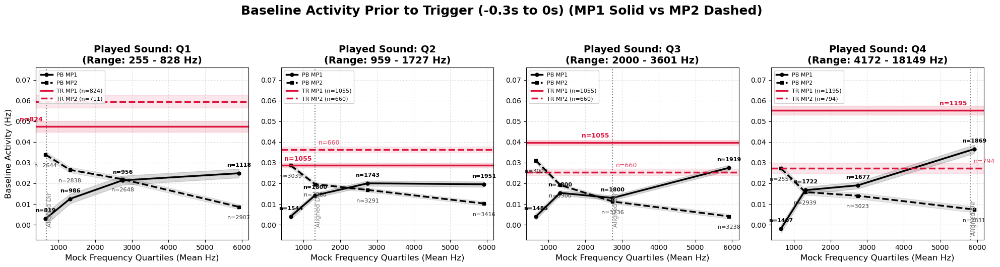


📊 样本数聚合统计: 按照 Quartile 划分的 Trigger 数量

--- PB_Orig & TR_Orig ---
Mock_Freq_Q      Q1    Q2    Q3    Q4  TR_Total
Played_Freq_Q                                  
Q1             1012  1008  1433  1624      8263
Q2             2765  3541  3234  4012     24110
Q3             2412  2995  3504  3423     22000
Q4             1842  2083  2428  2662     19612

--- PB_Inv & TR_Inv ---
Mock_Freq_Q      Q1    Q2    Q3    Q4  TR_Total
Played_Freq_Q                                  
Q1             4282  3254  2379  3480     14042
Q2             4169  3458  2709  3560     15154
Q3             3173  2725  2148  2619     11580
Q4             1992  1990  1843  1695      8237


🔬 统计显著性检验 (Baseline: Kruskal-Wallis H-test & Pairwise Post-hoc)

>>>>>>>>>>>>>>> 针对 MP1 数据的检验 <<<<<<<<<<<<<<<

【1】TR_Orig: 比较 4 个 Played_Freq Quartiles 的 Baseline Activity
 -> Kruskal-Wallis Stat: 71.2849, p-value: 2.2651e-15
 -> 结论: 显著 [*]。神经元对不同真实声音频率的 MP1 基线放电率存在显著差异。
-----------------------------------------------------------

In [14]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import scipy.stats as stats
import itertools

# =========================================================
# 1. 重新提取 Trigger 数据 (兼容 MP1 和 MP2 字符串标记)
# =========================================================
events_mock = []

idx_trigger = n_bins_pre
idx_bl_start = idx_trigger - int(0.3 / dt)
idx_peak_end = idx_trigger + int(0.3 / dt)

for sess_idx, (n_data, f_data) in enumerate(zip(n_data_s, f_data_s)):
    if 'Mapping_Type' not in f_data.columns or 'Frequency_changes' not in f_data.columns:
        continue

    freqs = f_data['Played_frequency'].values
    mock_freqs = f_data['Mock_frequency'].values if 'Mock_frequency' in f_data.columns else freqs
    changes = f_data['Frequency_changes'].values
    conditions = f_data['Condition'].values
    mapping_types = f_data['Mapping_Type'].values
    
    trigger_indices = np.flatnonzero(changes == 1)
    
    for i in trigger_indices:
        if i == 0: continue
            
        f_post = freqs[i]
        m_post = mock_freqs[i]
        
        # 兼容新字符串和旧数字标签
        cond = float(conditions[i]) if pd.notna(conditions[i]) else -1.0
        m_type = str(mapping_types[i]).strip()
        
        is_mp2 = m_type in ['MP2', '1.0', '1']
        is_mp1 = m_type in ['MP1', 'Standalone', '0.0', '0']
        
        if cond == 0.0 and is_mp2:
            label = 'TR_Inv'  # TR MP2
            m_post = f_post 
        elif cond == 1.0 and is_mp2:
            label = 'PB_Inv'  # PB MP2
        elif cond == 0.0 and is_mp1:
            label = 'TR_Orig' # TR MP1
            m_post = f_post
        elif cond == 1.0 and is_mp1:
            label = 'PB_Orig' # PB MP1
        else:
            continue
            
        start = int(i - n_bins_pre)
        stop = int(i + n_bins_post)
        
        if start >= 0 and stop <= n_data.shape[-1] and n_data[:, start:stop].shape[1] == expected_length:
            segment = n_data[:, start:stop]
            events_mock.append({
                'sess_idx': sess_idx,
                'label': label,
                'Played_Freq': np.round(f_post, 1), 
                'Mock_Freq': np.round(m_post, 1),   
                'segment': segment
            })

df_mock_events = pd.DataFrame(events_mock)
print(f"✅ 成功提取了 {len(df_mock_events)} 个有效 Trigger (包含 MP1 & MP2)。")

# =========================================================
# 2. 计算 Baseline Activity
# =========================================================
metrics_mock = []

if not df_mock_events.empty:
    for (s_idx, label, p_freq, m_freq), df_sub in df_mock_events.groupby(['sess_idx', 'label', 'Played_Freq', 'Mock_Freq']):
        segs = np.stack(df_sub['segment'].values, axis=0)
        neuron_means = np.mean(segs, axis=0) 
        
        for n in range(neuron_means.shape[0]):
            psth = neuron_means[n, :]
            
            # 🌟 只提取 Baseline 阶段的放电率 🌟
            bl = np.mean(psth[idx_bl_start:idx_trigger])
            
            metrics_mock.append({
                'Label': label,
                'Played_Freq': p_freq,
                'Mock_Freq': m_freq,
                'Baseline': bl  # 存储为 Baseline
            })
else:
    print("⚠️ 警告: df_mock_events 为空。")

df_metrics_mock = pd.DataFrame(metrics_mock)

# =========================================================
# 2.5. 自定义强制边界划分 Quartiles
# =========================================================
if not df_metrics_mock.empty:
    bin_edges = df_metrics_mock['Played_Freq'].quantile([0, 0.25, 0.5, 0.75, 1.0]).tolist()

    bin_edges[1] = 958
    bin_edges[2] = 1999 
    bin_edges[3] = 4171 
    bin_edges[0] = -np.inf
    bin_edges[-1] = np.inf

    played_labels = ["Q1", "Q2", "Q3", "Q4"]
    mock_labels = ["Q1", "Q2", "Q3", "Q4"]

    df_metrics_mock['Played_Freq_Q'] = pd.cut(df_metrics_mock['Played_Freq'], bins=bin_edges, labels=played_labels, include_lowest=True)
    df_metrics_mock['Mock_Freq_Q'] = pd.cut(df_metrics_mock['Mock_Freq'], bins=bin_edges, labels=mock_labels, include_lowest=True)

    played_q_means = df_metrics_mock.groupby('Played_Freq_Q', observed=False)['Played_Freq'].mean()
    mock_q_means = df_metrics_mock.groupby('Mock_Freq_Q', observed=False)['Mock_Freq'].mean()

    print(f"🎯 按照自定义边界 [..., 958, 1999, 4171, ...] 将频率划分至 4 个组。")

    df_mock_events['Played_Freq_Q'] = pd.cut(df_mock_events['Played_Freq'], bins=bin_edges, labels=played_labels, include_lowest=True)
    df_mock_events['Mock_Freq_Q'] = pd.cut(df_mock_events['Mock_Freq'], bins=bin_edges, labels=mock_labels, include_lowest=True)

# =========================================================
# 3. 画布绘制：Baseline 包含 MP1(实线) 和 MP2(虚线)
# =========================================================
if not df_metrics_mock.empty:
    n_cols = len(played_labels)
    fig, axes = plt.subplots(1, n_cols, figsize=(5 * n_cols, 5), sharey=True)

    if n_cols == 1:
        axes = [axes]

    for i, q_label in enumerate(played_labels):
        ax = axes[i]
        
        target_mean_freq = played_q_means[q_label]
        current_q_data = df_metrics_mock[df_metrics_mock['Played_Freq_Q'] == q_label]
        q_min = current_q_data['Played_Freq'].min()
        q_max = current_q_data['Played_Freq'].max()
        
        # ---------------------------------------------------------
        # 1. PB MP1 (黑实线)
        # ---------------------------------------------------------
        pb1_data = df_metrics_mock[(df_metrics_mock['Label'] == 'PB_Orig') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
        if not pb1_data.empty:
            pb1_stats = pb1_data.groupby('Mock_Freq_Q', observed=False)['Baseline'].agg(['mean', 'sem', 'count']).reset_index()
            pb1_stats['x_hz'] = pb1_stats['Mock_Freq_Q'].map(mock_q_means)
            pb1_stats = pb1_stats.dropna(subset=['x_hz']).sort_values('x_hz')
            
            ax.plot(pb1_stats['x_hz'], pb1_stats['mean'], color='black', linewidth=2.5, marker='o', markersize=5, label='PB MP1', linestyle='-')
            ax.fill_between(pb1_stats['x_hz'], pb1_stats['mean'] - pb1_stats['sem'], pb1_stats['mean'] + pb1_stats['sem'], color='black', alpha=0.15)
                            
            for _, row in pb1_stats.iterrows():
                ax.annotate(f"n={int(row['count'])}", xy=(row['x_hz'], row['mean']), xytext=(0, 8), 
                            textcoords='offset points', ha='center', va='bottom', fontsize=8, color='black', fontweight='bold')

        # ---------------------------------------------------------
        # 2. PB MP2 (黑虚线)
        # ---------------------------------------------------------
        pb2_data = df_metrics_mock[(df_metrics_mock['Label'] == 'PB_Inv') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
        if not pb2_data.empty:
            pb2_stats = pb2_data.groupby('Mock_Freq_Q', observed=False)['Baseline'].agg(['mean', 'sem', 'count']).reset_index()
            pb2_stats['x_hz'] = pb2_stats['Mock_Freq_Q'].map(mock_q_means)
            pb2_stats = pb2_stats.dropna(subset=['x_hz']).sort_values('x_hz')
            
            ax.plot(pb2_stats['x_hz'], pb2_stats['mean'], color='black', linewidth=2.5, marker='s', markersize=5, label='PB MP2', linestyle='--')
            ax.fill_between(pb2_stats['x_hz'], pb2_stats['mean'] - pb2_stats['sem'], pb2_stats['mean'] + pb2_stats['sem'], color='black', alpha=0.1)
                            
            for _, row in pb2_stats.iterrows():
                ax.annotate(f"n={int(row['count'])}", xy=(row['x_hz'], row['mean']), xytext=(0, -12), 
                            textcoords='offset points', ha='center', va='top', fontsize=8, color='black', alpha=0.8)

        # ---------------------------------------------------------
        # 3. TR MP1 (红实线)
        # ---------------------------------------------------------
        tr1_data = df_metrics_mock[(df_metrics_mock['Label'] == 'TR_Orig') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
        if not tr1_data.empty:
            tr1_mean = tr1_data['Baseline'].mean()
            tr1_sem = tr1_data['Baseline'].sem()
            tr1_n = len(tr1_data)
            
            ax.axhline(tr1_mean, color='crimson', linestyle='-', linewidth=2.5, label=f'TR MP1 (n={tr1_n})')
            ax.axhspan(tr1_mean - tr1_sem, tr1_mean + tr1_sem, color='crimson', alpha=0.15)

            ax.annotate(f"n={tr1_n}", xy=(target_mean_freq, tr1_mean), xytext=(-5, 5), textcoords='offset points',
                        ha='right', va='bottom', fontsize=9, color='crimson', fontweight='bold')

        # ---------------------------------------------------------
        # 4. TR MP2 (红虚线)
        # ---------------------------------------------------------
        tr2_data = df_metrics_mock[(df_metrics_mock['Label'] == 'TR_Inv') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
        if not tr2_data.empty:
            tr2_mean = tr2_data['Baseline'].mean()
            tr2_sem = tr2_data['Baseline'].sem()
            tr2_n = len(tr2_data)
            
            ax.axhline(tr2_mean, color='crimson', linestyle='--', linewidth=2.5, label=f'TR MP2 (n={tr2_n})')
            ax.axhspan(tr2_mean - tr2_sem, tr2_mean + tr2_sem, color='crimson', alpha=0.1)

            ax.annotate(f"n={tr2_n}", xy=(target_mean_freq, tr2_mean), xytext=(5, 5), textcoords='offset points',
                        ha='left', va='bottom', fontsize=9, color='crimson', alpha=0.8)

        # --- 装饰 ---
        ax.axvline(target_mean_freq, color='gray', linestyle=':', linewidth=1.5, zorder=0)
        ax.tick_params(labelleft=True)
        
        y_min, y_max = ax.get_ylim()
        ax.text(target_mean_freq, y_min, '  Aligned Dir', color='gray', fontsize=9, va='bottom', rotation=90)
        
        ax.set_title(f"Played Sound: {q_label}\n(Range: {q_min:.0f} - {q_max:.0f} Hz)", fontsize=14, fontweight='bold')
        ax.grid(True, linestyle=':', alpha=0.6)
        ax.set_xlabel('Mock Frequency Quartiles (Mean Hz)', fontsize=12)
        
        if i == 0:
            ax.set_ylabel('Baseline Activity (Hz)', fontsize=12)
            
        ax.legend(fontsize=8, loc='upper left', framealpha=0.9)

    # 🌟 全局 Y 轴优化 🌟
    y_min, y_max = axes[0].get_ylim()
    axes[0].set_ylim(min(0, y_min), y_max * 1.15) 

    plt.suptitle("Baseline Activity Prior to Trigger (-0.3s to 0s) (MP1 Solid vs MP2 Dashed)", fontsize=18, fontweight='bold', y=1.05)
    plt.tight_layout()
    plt.show()

# =========================================================
# 4. 输出样本分布统计表 (包含 MP1 和 MP2)
# =========================================================
print("\n" + "=" * 80)
print("📊 样本数聚合统计: 按照 Quartile 划分的 Trigger 数量")
print("=" * 80)

if not df_mock_events.empty:
    for pb_label, tr_label in [('PB_Orig', 'TR_Orig'), ('PB_Inv', 'TR_Inv')]:
        print(f"\n--- {pb_label} & {tr_label} ---")
        df_pb_trigs = df_mock_events[df_mock_events['label'] == pb_label]
        
        if not df_pb_trigs.empty:
            pivot_pb = pd.pivot_table(
                df_pb_trigs, index='Played_Freq_Q', columns='Mock_Freq_Q',
                values='sess_idx', aggfunc='count', fill_value=0, observed=False
            )
            df_tr_counts = df_mock_events[df_mock_events['label'] == tr_label].groupby('Played_Freq_Q', observed=False).size()
            
            final_stats = pivot_pb.copy()
            final_stats['TR_Total'] = df_tr_counts
            final_stats['TR_Total'] = final_stats['TR_Total'].fillna(0).astype(int)
            
            print(final_stats.to_string())
        else:
            print(f"没有找到 {pb_label} 的数据。")
else:
    print("由于提取到的数据为空，无法生成统计表。")
        
print("\n" + "=" * 80)


# =========================================================
# 5. 统计显著性检验 (Baseline: Kruskal-Wallis & Post-hoc)
# =========================================================
print("\n" + "=" * 80)
print("🔬 统计显著性检验 (Baseline: Kruskal-Wallis H-test & Pairwise Post-hoc)")
print("=" * 80)

if not df_metrics_mock.empty:
    for protocol, tr_label, pb_label in [("MP1", "TR_Orig", "PB_Orig"), ("MP2", "TR_Inv", "PB_Inv")]:
        print(f"\n>>>>>>>>>>>>>>> 针对 {protocol} 数据的检验 <<<<<<<<<<<<<<<")
        
        # --- 检验 1: TR Baseline ---
        print(f"\n【1】{tr_label}: 比较 4 个 Played_Freq Quartiles 的 Baseline Activity")
        tr_data = df_metrics_mock[df_metrics_mock['Label'] == tr_label]

        if not tr_data.empty:
            tr_groups = [group['Baseline'].values for name, group in tr_data.groupby('Played_Freq_Q', observed=False)]
            tr_groups = [g for g in tr_groups if len(g) > 0]
            
            if len(tr_groups) > 1:
                stat, p_val = stats.kruskal(*tr_groups) 
                print(f" -> Kruskal-Wallis Stat: {stat:.4f}, p-value: {p_val:.4e}")
                if p_val < 0.05:
                    print(f" -> 结论: 显著 [*]。神经元对不同真实声音频率的 {protocol} 基线放电率存在显著差异。")
                else:
                    print(f" -> 结论: 不显著 [ns]。不同声音频率的 {protocol} 基线放电率无统计学差异。")
        else:
            print(f" -> 缺少 {tr_label} 数据。")

        print("-" * 60)

        # --- 检验 2: PB Baseline ---
        print(f"【2】{pb_label}: 在每个 Played_Freq 内，比较 4 个 Mock_Freq Quartiles (基线是否受头部方向调制)")
        pb_data = df_metrics_mock[df_metrics_mock['Label'] == pb_label]

        if not pb_data.empty:
            for q_label in played_labels:
                sub_df = pb_data[pb_data['Played_Freq_Q'] == q_label]
                
                pb_groups_dict = {name: group['Baseline'].values for name, group in sub_df.groupby('Mock_Freq_Q', observed=False) if len(group) > 0}
                group_names = list(pb_groups_dict.keys())
                pb_groups_list = list(pb_groups_dict.values())
                
                if len(pb_groups_list) > 1:
                    stat, p_val = stats.kruskal(*pb_groups_list)
                    
                    if p_val < 0.001: sig_star = "***"
                    elif p_val < 0.01: sig_star = "**"
                    elif p_val < 0.05: sig_star = "*"
                    else: sig_star = "ns"
                        
                    print(f"\n 🎯 Played Freq [{q_label}] Overall: p-value = {p_val:.4e} ({sig_star})")
                    
                    if p_val < 0.05:
                        print("      ↳ Post-hoc Pairwise (Mann-Whitney U with Bonferroni correction):")
                        pairs = list(itertools.combinations(group_names, 2))
                        num_comparisons = len(pairs)
                        
                        for name1, name2 in pairs:
                            data1 = pb_groups_dict[name1]
                            data2 = pb_groups_dict[name2]
                            u_stat, p_pair = stats.mannwhitneyu(data1, data2, alternative='two-sided')
                            p_adj = min(p_pair * num_comparisons, 1.0)
                            
                            if p_adj < 0.001: pair_star = "***"
                            elif p_adj < 0.01: pair_star = "**"
                            elif p_adj < 0.05: pair_star = "*"
                            else: pair_star = "ns"
                                
                            if p_adj < 0.05:
                                print(f"        • {name1} vs {name2}: p_adj = {p_adj:.4f} ({pair_star})")
                    else:
                         print("      ↳ No significant difference overall, skipping pairwise post-hoc.")
                else:
                    print(f"\n 🎯 Played Freq [{q_label}]: Insufficient data in Mock Quartiles.")
        else:
            print(f" -> {pb_label} 数据不足。")
            
print("\n" + "=" * 80 + "\n")


📊 Triggers per Minute
    Condition  Mean_Density  Std_Dev  Min_Density  Max_Density  Num_Sessions
 PB MP2 (Inv)        183.98    37.61       110.72       237.76            13
TR MP1 (Orig)        156.16    28.58       102.97       193.32            14
 TR MP2 (Inv)        182.05    43.83        76.14       237.53            13
--------------------------------------------------------------------------------
🔬 Kruskal-Wallis Test:
 -> p-value = 5.0775e-02 (Not Significant ns)



C:\Users\PenPen\AppData\Local\Temp\ipykernel_52312\405050719.py:87: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='Condition', y='Density_per_Min', data=df_density,


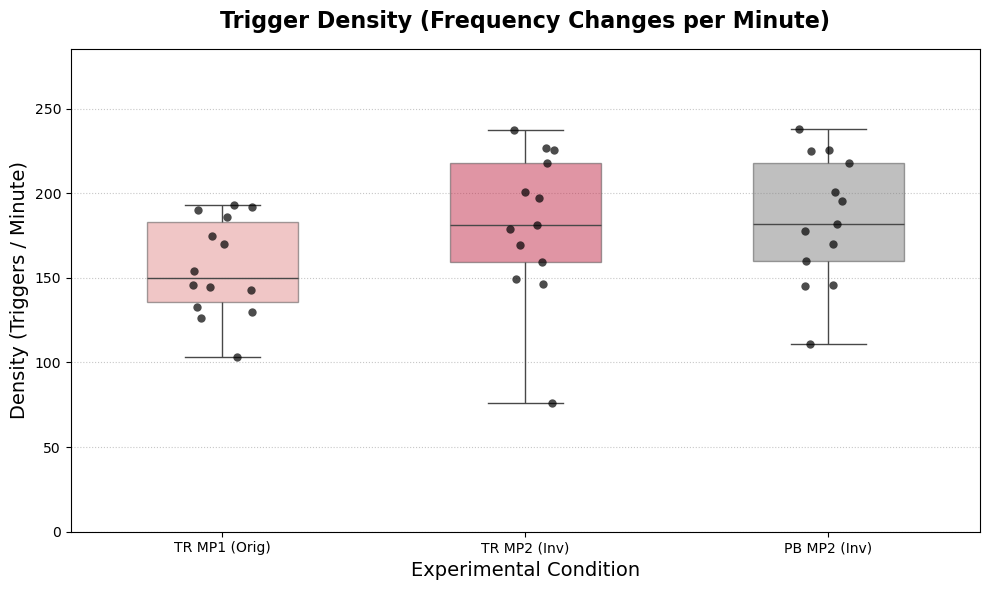

In [66]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as stats

# =========================================================
# 1. 计算 Trigger 密度 (Triggers per Minute)
# =========================================================
# ⚠️ 注意: 请确保你的环境中已经定义了 dt (例如 dt = 0.02)
# 如果没有定义，请取消下一行的注释并填入你的实际 bin size (秒)
# dt = 0.02 

density_data = []

for sess_idx, f_data in enumerate(f_data_s):
    if 'Condition' not in f_data.columns or 'Mapping_Type' not in f_data.columns or 'Frequency_changes' not in f_data.columns:
        continue
        
    changes = f_data['Frequency_changes'].values
    conditions = f_data['Condition'].values
    mapping_types = f_data['Mapping_Type'].values
    
    # 定义这三种核心条件的 Mask
    masks = {
        'TR MP1 (Orig)': (conditions == 0) & (mapping_types == 0),
        'TR MP2 (Inv)':  (conditions == 0) & (mapping_types == 1),
        'PB MP2 (Inv)':  (conditions == 1) & (mapping_types == 1)
    }
    
    for label, mask in masks.items():
        # 计算该 Condition 持续的总时间 (分钟)
        time_spent_mins = np.sum(mask) * dt / 60.0
        
        # 只有当该 Session 真正包含这个 Condition 时，才进行计算
        if time_spent_mins > 0: 
            # 该 Condition 下发生的 Trigger 总数
            trigger_count = np.sum((changes == 1) & mask)
            
            # 计算密度: 每分钟发生多少次 Trigger
            density = trigger_count / time_spent_mins
            
            density_data.append({
                'sess_idx': sess_idx,
                'Condition': label,
                'Time_Spent_Mins': time_spent_mins,
                'Trigger_Count': trigger_count,
                'Density_per_Min': density
            })

df_density = pd.DataFrame(density_data)

# =========================================================
# 2. 打印统计表格
# =========================================================
print("\n" + "=" * 80)
print("📊 Triggers per Minute")
print("=" * 80)

summary = df_density.groupby('Condition')['Density_per_Min'].agg(
    Mean_Density='mean', 
    Std_Dev='std', 
    Min_Density='min', 
    Max_Density='max', 
    Num_Sessions='count'
).reset_index()

print(summary.to_string(index=False, float_format="%.2f"))
print("-" * 80)

# 简单统计检验 (Kruskal-Wallis) 看看三种条件密度是否有差异
if len(df_density['Condition'].unique()) > 1:
    groups = [group['Density_per_Min'].values for name, group in df_density.groupby('Condition')]
    stat, p_val = stats.kruskal(*groups)
    print(f"🔬 Kruskal-Wallis Test:")
    print(f" -> p-value = {p_val:.4e} {'(Significant ***)' if p_val < 0.05 else '(Not Significant ns)'}")
print("=" * 80 + "\n")

# =========================================================
# 3. 数据可视化 (Boxplot + Scatter)
# =========================================================
plt.figure(figsize=(10, 6))

# 使用箱线图展示分布，并把每个 session 的实际点 (stripplot) 叠加在上面
palette_colors = {'TR MP1 (Orig)': 'lightcoral', 'TR MP2 (Inv)': 'crimson', 'PB MP2 (Inv)': 'gray'}

sns.boxplot(x='Condition', y='Density_per_Min', data=df_density, 
            palette=palette_colors, showfliers=False, width=0.5, boxprops=dict(alpha=0.5))

sns.stripplot(x='Condition', y='Density_per_Min', data=df_density, 
              color='black', alpha=0.7, size=6, jitter=True)

plt.title('Trigger Density (Frequency Changes per Minute)', fontsize=16, fontweight='bold', pad=15)
plt.ylabel('Density (Triggers / Minute)', fontsize=14)
plt.xlabel('Experimental Condition', fontsize=14)

# Y 轴美化：从 0 开始，顶部留出 20% 空间
y_max = df_density['Density_per_Min'].max()
plt.ylim(0, y_max * 1.2)

plt.grid(axis='y', linestyle=':', alpha=0.7)
plt.tight_layout()
plt.show()

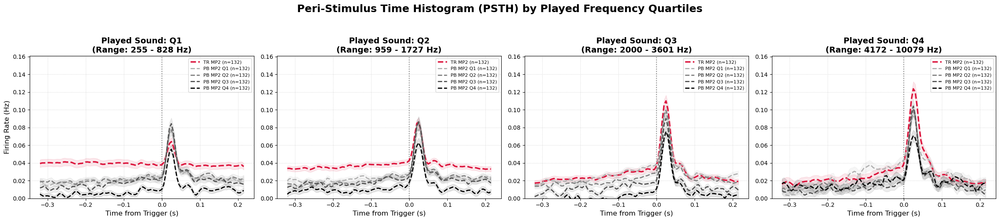

In [8]:
# =========================================================
# 3. 画布绘制：按 4 个 Quartiles 绘制 PSTH (动态放电率)
# =========================================================
n_cols = len(played_labels)
fig, axes = plt.subplots(1, n_cols, figsize=(6 * n_cols, 5), sharey=True)

if n_cols == 1:
    axes = [axes]

# 定义 PSTH 的时间轴 (基于提取时的 expected_length 和 pre-trigger 长度)
t_axis = (np.arange(expected_length) - n_bins_pre) * dt

# 定义 PB MP2 不同 Mock Freq Quartile 的深浅灰度映射 (从浅灰到纯黑)
mock_shades = {
    'Q1': '#B0B0B0', # 浅灰
    'Q2': '#808080', # 中灰
    'Q3': '#505050', # 深灰
    'Q4': '#000000'  # 纯黑
}

for i, q_label in enumerate(played_labels):
    ax = axes[i]
    
    current_q_data = df_metrics_mock[df_metrics_mock['Played_Freq_Q'] == q_label]
    q_min = current_q_data['Played_Freq'].min()
    q_max = current_q_data['Played_Freq'].max()
    
    # --- TR MP2 (红虚线基准 PSTH) ---
    tr_df = df_mock_events[(df_mock_events['label'] == 'TR_Inv') & (df_mock_events['Played_Freq_Q'] == q_label)]
    if not tr_df.empty:
        # 聚合该条件下所有 Session 的神经元波形
        tr_sess_psth = []
        for s_idx, df_sub in tr_df.groupby('sess_idx'):
            segs = np.stack(df_sub['segment'].values, axis=0) # shape: (trials, neurons, time)
            tr_sess_psth.append(np.mean(segs, axis=0))        # average trials -> (neurons, time)
            
        if tr_sess_psth:
            tr_all_neurons = np.concatenate(tr_sess_psth, axis=0) # shape: (total_neurons, time)
            tr_mean = np.mean(tr_all_neurons, axis=0)
            tr_sem = np.std(tr_all_neurons, axis=0) / np.sqrt(tr_all_neurons.shape[0])
            tr_n = tr_all_neurons.shape[0]
            
            ax.plot(t_axis, tr_mean, color='crimson', linestyle='--', linewidth=2.5, label=f'TR MP2 (n={tr_n})')
            ax.fill_between(t_axis, tr_mean - tr_sem, tr_mean + tr_sem, color='crimson', alpha=0.1)

    # --- PB MP2 (按 Mock_Freq_Q 分组，不同灰度虚线 PSTH) ---
    for m_label in mock_labels:
        pb_df = df_mock_events[(df_mock_events['label'] == 'PB_Inv') & 
                               (df_mock_events['Played_Freq_Q'] == q_label) & 
                               (df_mock_events['Mock_Freq_Q'] == m_label)]
        if not pb_df.empty:
            pb_sess_psth = []
            for s_idx, df_sub in pb_df.groupby('sess_idx'):
                segs = np.stack(df_sub['segment'].values, axis=0)
                pb_sess_psth.append(np.mean(segs, axis=0))
                
            if pb_sess_psth:
                pb_all_neurons = np.concatenate(pb_sess_psth, axis=0)
                pb_mean = np.mean(pb_all_neurons, axis=0)
                pb_sem = np.std(pb_all_neurons, axis=0) / np.sqrt(pb_all_neurons.shape[0])
                pb_n = pb_all_neurons.shape[0]
                
                shade = mock_shades.get(m_label, '#000000')
                
                ax.plot(t_axis, pb_mean, color=shade, linestyle='--', linewidth=2.0, label=f'PB MP2 {m_label} (n={pb_n})')
                ax.fill_between(t_axis, pb_mean - pb_sem, pb_mean + pb_sem, color=shade, alpha=0.1)

    # --- 装饰 ---
    ax.axvline(0, color='gray', linestyle=':', linewidth=1.5, zorder=0) # Trigger 时刻对齐线
    ax.tick_params(labelleft=True)
    
    # 动态 Y 轴调整
    y_min, y_max = ax.get_ylim()
    axes[0].set_ylim(0, y_max * 1.1)
    
    # 标题与坐标轴标记
    ax.set_title(f"Played Sound: {q_label}\n(Range: {q_min:.0f} - {q_max:.0f} Hz)", fontsize=14, fontweight='bold')
    ax.grid(True, linestyle=':', alpha=0.6)
    ax.set_xlabel('Time from Trigger (s)', fontsize=12)
    
    if i == 0:
        ax.set_ylabel('Firing Rate (Hz)', fontsize=12)
        
    ax.legend(fontsize=8, loc='upper right', framealpha=0.8)

# 🌟 全局 Y 轴优化 🌟
y_min, y_max = axes[0].get_ylim()
axes[0].set_ylim(0, y_max * 1.15) 

plt.suptitle("Peri-Stimulus Time Histogram (PSTH) by Played Frequency Quartiles", fontsize=18, fontweight='bold', y=1.05)
plt.tight_layout()
plt.show()

In [4]:
# =========================================================
# 3. 画布绘制：4x2 PSTH (左列: MP2 虚线 | 右列: MP1 实线)
# =========================================================
if not df_metrics_mock.empty:
    n_rows = len(played_labels)
    n_cols = 2 # 左侧 MP2，右侧 MP1
    
    # 创建 4x2 网格，共享 X 轴和 Y 轴比例尺以便于直接比较
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 3.5 * n_rows), sharey=True, sharex=True)
    
    if n_rows == 1:
        axes = np.expand_dims(axes, axis=0)

    # 定义 PSTH 的时间轴
    t_axis = (np.arange(expected_length) - n_bins_pre) * dt

    # 定义 PB 不同 Mock Freq Quartile 的深浅灰度映射 (从浅灰到纯黑)
    mock_shades = {
        'Q1': '#B0B0B0', # 浅灰
        'Q2': '#808080', # 中灰
        'Q3': '#505050', # 深灰
        'Q4': '#000000'  # 纯黑
    }

    for i, q_label in enumerate(played_labels):
        current_q_data = df_metrics_mock[df_metrics_mock['Played_Freq_Q'] == q_label]
        q_min = current_q_data['Played_Freq'].min()
        q_max = current_q_data['Played_Freq'].max()
        
        ax_mp2 = axes[i, 0] # 左侧画 MP2
        ax_mp1 = axes[i, 1] # 右侧画 MP1
        
        # ---------------------------------------------------------
        # 左列: MP2 (TR_Inv, PB_Inv) - 虚线
        # ---------------------------------------------------------
        # 1. TR MP2
        tr2_df = df_mock_events[(df_mock_events['label'] == 'TR_Inv') & (df_mock_events['Played_Freq_Q'] == q_label)]
        if not tr2_df.empty:
            tr_sess_psth = [np.mean(np.stack(df_sub['segment'].values, axis=0), axis=0) for _, df_sub in tr2_df.groupby('sess_idx')]
            if tr_sess_psth:
                tr_all_neurons = np.concatenate(tr_sess_psth, axis=0)
                tr_mean, tr_sem = np.mean(tr_all_neurons, axis=0), np.std(tr_all_neurons, axis=0) / np.sqrt(tr_all_neurons.shape[0])
                
                ax_mp2.plot(t_axis, tr_mean, color='crimson', linestyle='--', linewidth=2.5, label=f'TR MP2 (n={tr_all_neurons.shape[0]})')
                ax_mp2.fill_between(t_axis, tr_mean - tr_sem, tr_mean + tr_sem, color='crimson', alpha=0.1)
                
        # 2. PB MP2
        for m_label in mock_labels:
            pb2_df = df_mock_events[(df_mock_events['label'] == 'PB_Inv') & (df_mock_events['Played_Freq_Q'] == q_label) & (df_mock_events['Mock_Freq_Q'] == m_label)]
            if not pb2_df.empty:
                pb_sess_psth = [np.mean(np.stack(df_sub['segment'].values, axis=0), axis=0) for _, df_sub in pb2_df.groupby('sess_idx')]
                if pb_sess_psth:
                    pb_all_neurons = np.concatenate(pb_sess_psth, axis=0)
                    pb_mean, pb_sem = np.mean(pb_all_neurons, axis=0), np.std(pb_all_neurons, axis=0) / np.sqrt(pb_all_neurons.shape[0])
                    shade = mock_shades.get(m_label, '#000000')
                    
                    ax_mp2.plot(t_axis, pb_mean, color=shade, linestyle='--', linewidth=2.0, label=f'PB MP2 {m_label} (n={pb_all_neurons.shape[0]})')
                    ax_mp2.fill_between(t_axis, pb_mean - pb_sem, pb_mean + pb_sem, color=shade, alpha=0.1)

        # ---------------------------------------------------------
        # 右列: MP1 (TR_Orig, PB_Orig) - 实线
        # ---------------------------------------------------------
        # 1. TR MP1
        tr1_df = df_mock_events[(df_mock_events['label'] == 'TR_Orig') & (df_mock_events['Played_Freq_Q'] == q_label)]
        if not tr1_df.empty:
            tr_sess_psth = [np.mean(np.stack(df_sub['segment'].values, axis=0), axis=0) for _, df_sub in tr1_df.groupby('sess_idx')]
            if tr_sess_psth:
                tr_all_neurons = np.concatenate(tr_sess_psth, axis=0)
                tr_mean, tr_sem = np.mean(tr_all_neurons, axis=0), np.std(tr_all_neurons, axis=0) / np.sqrt(tr_all_neurons.shape[0])
                
                ax_mp1.plot(t_axis, tr_mean, color='crimson', linestyle='-', linewidth=2.5, label=f'TR MP1 (n={tr_all_neurons.shape[0]})')
                ax_mp1.fill_between(t_axis, tr_mean - tr_sem, tr_mean + tr_sem, color='crimson', alpha=0.1)
                
        # 2. PB MP1
        for m_label in mock_labels:
            pb1_df = df_mock_events[(df_mock_events['label'] == 'PB_Orig') & (df_mock_events['Played_Freq_Q'] == q_label) & (df_mock_events['Mock_Freq_Q'] == m_label)]
            if not pb1_df.empty:
                pb_sess_psth = [np.mean(np.stack(df_sub['segment'].values, axis=0), axis=0) for _, df_sub in pb1_df.groupby('sess_idx')]
                if pb_sess_psth:
                    pb_all_neurons = np.concatenate(pb_sess_psth, axis=0)
                    pb_mean, pb_sem = np.mean(pb_all_neurons, axis=0), np.std(pb_all_neurons, axis=0) / np.sqrt(pb_all_neurons.shape[0])
                    shade = mock_shades.get(m_label, '#000000')
                    
                    ax_mp1.plot(t_axis, pb_mean, color=shade, linestyle='-', linewidth=2.0, label=f'PB MP1 {m_label} (n={pb_all_neurons.shape[0]})')
                    ax_mp1.fill_between(t_axis, pb_mean - pb_sem, pb_mean + pb_sem, color=shade, alpha=0.1)

        # ---------------------------------------------------------
        # 装饰 (循环应用给当前行的 MP2 和 MP1 两个轴)
        # ---------------------------------------------------------
        for col_idx, ax in enumerate([ax_mp2, ax_mp1]):
            ax.axvline(0, color='gray', linestyle=':', linewidth=1.5, zorder=0) # Trigger 线
            ax.tick_params(labelleft=(col_idx == 0)) # 只在最左侧显示 Y 轴数值，保证整洁
            
            title_prefix = "MP2 (Inverse Map)" if col_idx == 0 else "MP1 (Original Map)"
            ax.set_title(f"[{title_prefix}]\nPlayed: {q_label} ({q_min:.0f}-{q_max:.0f} Hz)", fontsize=13, fontweight='bold')
            ax.grid(True, linestyle=':', alpha=0.6)
            
            # X 轴标签只放在最底下那一行
            if i == n_rows - 1:
                ax.set_xlabel('Time from Trigger (s)', fontsize=12)
            
            # Y 轴标签只放在最左侧的一列
            if col_idx == 0:
                ax.set_ylabel('Firing Rate (Hz)', fontsize=12)
                
            ax.legend(fontsize=8, loc='upper right', framealpha=0.8, ncol=2)

    # 🌟 全局 Y 轴优化：遍历所有的 subplot，把上下限统一调成最适合的值 🌟
    y_min, y_max = axes[0, 0].get_ylim()
    for ax in axes.flatten():
        ax.set_ylim(min(0, y_min), y_max * 1.15) 

    plt.suptitle("Peri-Stimulus Time Histogram (PSTH): MP2 vs MP1", fontsize=18, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()

NameError: name 'df_metrics_mock' is not defined

## Triggers Spaced in Time MP1 vs MP2 (head position)

✅ 成功提取了 42476 个有效 Trigger (已过滤 0.3s 密集 Trigger，包含 MP1 & MP2)。
🎯 按照自定义边界 [..., 958, 1999, 4171, ...] 将频率划分至 4 个组。


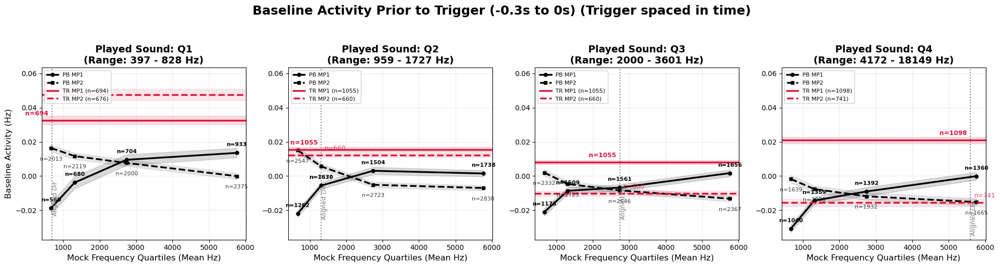


📊 样本数聚合统计: 按照 Quartile 划分的 Trigger 数量

--- PB_Orig & TR_Orig ---
Mock_Freq_Q     Q1   Q2   Q3   Q4  TR_Total
Played_Freq_Q                              
Q1             186  218  242  350      1450
Q2             629  835  722  993      5116
Q3             523  689  774  775      4897
Q4             407  430  550  526      4305

--- PB_Inv & TR_Inv ---
Mock_Freq_Q     Q1   Q2   Q3   Q4  TR_Total
Played_Freq_Q                              
Q1             774  566  447  630      2674
Q2             756  654  539  730      2862
Q3             553  558  457  532      2197
Q4             348  390  331  333      1528


🔬 统计显著性检验 (Baseline: Kruskal-Wallis H-test & Pairwise Post-hoc)

>>>>>>>>>>>>>>> 针对 MP1 数据的检验 <<<<<<<<<<<<<<<

【1】TR_Orig: 比较 4 个 Played_Freq Quartiles 的 Baseline Activity
 -> Kruskal-Wallis Stat: 44.7376, p-value: 1.0521e-09
 -> 结论: 显著 [*]。神经元对不同真实声音频率的 MP1 基线放电率存在显著差异。
------------------------------------------------------------
【2】PB_Orig: 在每个 Played_Freq 内，比较 4 个 Mock_Freq

In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math
import scipy.stats as stats
import itertools

# =========================================================
# 1. 重新提取 Trigger 数据 (结合 0.3s 过滤机制 & 兼容 MP1/MP2)
# =========================================================
events_mock = []

# 新增：计算 0.3 秒对应的 bin 数量，用于密集 Trigger 过滤
bins_03s = int(0.3 / dt) 

idx_trigger = n_bins_pre
idx_bl_start = idx_trigger - int(0.3 / dt)
idx_peak_end = idx_trigger + int(0.3 / dt)

for sess_idx, (n_data, f_data) in enumerate(zip(n_data_s, f_data_s)):
    if 'Mapping_Type' not in f_data.columns or 'Frequency_changes' not in f_data.columns:
        continue

    freqs = f_data['Played_frequency'].values
    mock_freqs = f_data['Mock_frequency'].values if 'Mock_frequency' in f_data.columns else freqs
    changes = f_data['Frequency_changes'].values
    conditions = f_data['Condition'].values
    mapping_types = f_data['Mapping_Type'].values
    
    trigger_indices = np.flatnonzero(changes == 1)
    
    # 🌟 融合点：使用 enumerate 获取前后索引进行 0.3s 过滤 🌟
    for k, i in enumerate(trigger_indices):
        if i == 0: continue
            
        # ==========================================
        # 核心过滤逻辑：如果当前 trigger 与上一个间隔小于等于 bins_03s，则跳过
        # ==========================================
        if k > 0:
            prev_i = trigger_indices[k-1]
            if (i - prev_i) <= bins_03s:
                continue
                
        f_post = freqs[i]
        m_post = mock_freqs[i]
        
        # 兼容新字符串和旧数字标签
        cond = float(conditions[i]) if pd.notna(conditions[i]) else -1.0
        m_type = str(mapping_types[i]).strip()
        
        is_mp2 = m_type in ['MP2', '1.0', '1']
        is_mp1 = m_type in ['MP1', 'Standalone', '0.0', '0']
        
        if cond == 0.0 and is_mp2:
            label = 'TR_Inv'  # TR MP2
            m_post = f_post 
        elif cond == 1.0 and is_mp2:
            label = 'PB_Inv'  # PB MP2
        elif cond == 0.0 and is_mp1:
            label = 'TR_Orig' # TR MP1
            m_post = f_post
        elif cond == 1.0 and is_mp1:
            label = 'PB_Orig' # PB MP1
        else:
            continue
            
        start = int(i - n_bins_pre)
        stop = int(i + n_bins_post)
        
        if start >= 0 and stop <= n_data.shape[-1] and n_data[:, start:stop].shape[1] == expected_length:
            segment = n_data[:, start:stop]
            events_mock.append({
                'sess_idx': sess_idx,
                'label': label,
                'Played_Freq': np.round(f_post, 1), 
                'Mock_Freq': np.round(m_post, 1),   
                'segment': segment
            })

df_mock_events = pd.DataFrame(events_mock)
print(f"✅ 成功提取了 {len(df_mock_events)} 个有效 Trigger (已过滤 0.3s 密集 Trigger，包含 MP1 & MP2)。")

# =========================================================
# 2. 计算 Baseline Activity
# =========================================================
metrics_mock = []

if not df_mock_events.empty:
    for (s_idx, label, p_freq, m_freq), df_sub in df_mock_events.groupby(['sess_idx', 'label', 'Played_Freq', 'Mock_Freq']):
        segs = np.stack(df_sub['segment'].values, axis=0)
        neuron_means = np.mean(segs, axis=0) 
        
        for n in range(neuron_means.shape[0]):
            psth = neuron_means[n, :]
            
            # 🌟 只提取 Baseline 阶段的放电率 🌟
            bl = np.mean(psth[idx_bl_start:idx_trigger])
            
            metrics_mock.append({
                'Label': label,
                'Played_Freq': p_freq,
                'Mock_Freq': m_freq,
                'Baseline': bl  # 存储为 Baseline
            })
else:
    print("⚠️ 警告: df_mock_events 为空。")

df_metrics_mock = pd.DataFrame(metrics_mock)

# =========================================================
# 2.5. 自定义强制边界划分 Quartiles
# =========================================================
if not df_metrics_mock.empty:
    bin_edges = df_metrics_mock['Played_Freq'].quantile([0, 0.25, 0.5, 0.75, 1.0]).tolist()

    bin_edges[1] = 958
    bin_edges[2] = 1999 
    bin_edges[3] = 4171 
    bin_edges[0] = -np.inf
    bin_edges[-1] = np.inf

    played_labels = ["Q1", "Q2", "Q3", "Q4"]
    mock_labels = ["Q1", "Q2", "Q3", "Q4"]

    df_metrics_mock['Played_Freq_Q'] = pd.cut(df_metrics_mock['Played_Freq'], bins=bin_edges, labels=played_labels, include_lowest=True)
    df_metrics_mock['Mock_Freq_Q'] = pd.cut(df_metrics_mock['Mock_Freq'], bins=bin_edges, labels=mock_labels, include_lowest=True)

    played_q_means = df_metrics_mock.groupby('Played_Freq_Q', observed=False)['Played_Freq'].mean()
    mock_q_means = df_metrics_mock.groupby('Mock_Freq_Q', observed=False)['Mock_Freq'].mean()

    print(f"🎯 按照自定义边界 [..., 958, 1999, 4171, ...] 将频率划分至 4 个组。")

    df_mock_events['Played_Freq_Q'] = pd.cut(df_mock_events['Played_Freq'], bins=bin_edges, labels=played_labels, include_lowest=True)
    df_mock_events['Mock_Freq_Q'] = pd.cut(df_mock_events['Mock_Freq'], bins=bin_edges, labels=mock_labels, include_lowest=True)

# =========================================================
# 3. 画布绘制：Baseline 包含 MP1(实线) 和 MP2(虚线)
# =========================================================
if not df_metrics_mock.empty:
    n_cols = len(played_labels)
    fig, axes = plt.subplots(1, n_cols, figsize=(5 * n_cols, 5), sharey=True)

    if n_cols == 1:
        axes = [axes]

    for i, q_label in enumerate(played_labels):
        ax = axes[i]
        
        target_mean_freq = played_q_means[q_label]
        current_q_data = df_metrics_mock[df_metrics_mock['Played_Freq_Q'] == q_label]
        q_min = current_q_data['Played_Freq'].min()
        q_max = current_q_data['Played_Freq'].max()
        
        # ---------------------------------------------------------
        # 1. PB MP1 (黑实线)
        # ---------------------------------------------------------
        pb1_data = df_metrics_mock[(df_metrics_mock['Label'] == 'PB_Orig') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
        if not pb1_data.empty:
            pb1_stats = pb1_data.groupby('Mock_Freq_Q', observed=False)['Baseline'].agg(['mean', 'sem', 'count']).reset_index()
            pb1_stats['x_hz'] = pb1_stats['Mock_Freq_Q'].map(mock_q_means)
            pb1_stats = pb1_stats.dropna(subset=['x_hz']).sort_values('x_hz')
            
            ax.plot(pb1_stats['x_hz'], pb1_stats['mean'], color='black', linewidth=2.5, marker='o', markersize=5, label='PB MP1', linestyle='-')
            ax.fill_between(pb1_stats['x_hz'], pb1_stats['mean'] - pb1_stats['sem'], pb1_stats['mean'] + pb1_stats['sem'], color='black', alpha=0.15)
                            
            for _, row in pb1_stats.iterrows():
                ax.annotate(f"n={int(row['count'])}", xy=(row['x_hz'], row['mean']), xytext=(0, 8), 
                            textcoords='offset points', ha='center', va='bottom', fontsize=8, color='black', fontweight='bold')

        # ---------------------------------------------------------
        # 2. PB MP2 (黑虚线)
        # ---------------------------------------------------------
        pb2_data = df_metrics_mock[(df_metrics_mock['Label'] == 'PB_Inv') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
        if not pb2_data.empty:
            pb2_stats = pb2_data.groupby('Mock_Freq_Q', observed=False)['Baseline'].agg(['mean', 'sem', 'count']).reset_index()
            pb2_stats['x_hz'] = pb2_stats['Mock_Freq_Q'].map(mock_q_means)
            pb2_stats = pb2_stats.dropna(subset=['x_hz']).sort_values('x_hz')
            
            ax.plot(pb2_stats['x_hz'], pb2_stats['mean'], color='black', linewidth=2.5, marker='s', markersize=5, label='PB MP2', linestyle='--')
            ax.fill_between(pb2_stats['x_hz'], pb2_stats['mean'] - pb2_stats['sem'], pb2_stats['mean'] + pb2_stats['sem'], color='black', alpha=0.1)
                            
            for _, row in pb2_stats.iterrows():
                ax.annotate(f"n={int(row['count'])}", xy=(row['x_hz'], row['mean']), xytext=(0, -12), 
                            textcoords='offset points', ha='center', va='top', fontsize=8, color='black', alpha=0.8)

        # ---------------------------------------------------------
        # 3. TR MP1 (红实线)
        # ---------------------------------------------------------
        tr1_data = df_metrics_mock[(df_metrics_mock['Label'] == 'TR_Orig') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
        if not tr1_data.empty:
            tr1_mean = tr1_data['Baseline'].mean()
            tr1_sem = tr1_data['Baseline'].sem()
            tr1_n = len(tr1_data)
            
            ax.axhline(tr1_mean, color='crimson', linestyle='-', linewidth=2.5, label=f'TR MP1 (n={tr1_n})')
            ax.axhspan(tr1_mean - tr1_sem, tr1_mean + tr1_sem, color='crimson', alpha=0.15)

            ax.annotate(f"n={tr1_n}", xy=(target_mean_freq, tr1_mean), xytext=(-5, 5), textcoords='offset points',
                        ha='right', va='bottom', fontsize=9, color='crimson', fontweight='bold')

        # ---------------------------------------------------------
        # 4. TR MP2 (红虚线)
        # ---------------------------------------------------------
        tr2_data = df_metrics_mock[(df_metrics_mock['Label'] == 'TR_Inv') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
        if not tr2_data.empty:
            tr2_mean = tr2_data['Baseline'].mean()
            tr2_sem = tr2_data['Baseline'].sem()
            tr2_n = len(tr2_data)
            
            ax.axhline(tr2_mean, color='crimson', linestyle='--', linewidth=2.5, label=f'TR MP2 (n={tr2_n})')
            ax.axhspan(tr2_mean - tr2_sem, tr2_mean + tr2_sem, color='crimson', alpha=0.1)

            ax.annotate(f"n={tr2_n}", xy=(target_mean_freq, tr2_mean), xytext=(5, 5), textcoords='offset points',
                        ha='left', va='bottom', fontsize=9, color='crimson', alpha=0.8)

        # --- 装饰 ---
        ax.axvline(target_mean_freq, color='gray', linestyle=':', linewidth=1.5, zorder=0)
        ax.tick_params(labelleft=True)
        
        y_min, y_max = ax.get_ylim()
        ax.text(target_mean_freq, y_min, '  Aligned Dir', color='gray', fontsize=9, va='bottom', rotation=90)
        
        ax.set_title(f"Played Sound: {q_label}\n(Range: {q_min:.0f} - {q_max:.0f} Hz)", fontsize=14, fontweight='bold')
        ax.grid(True, linestyle=':', alpha=0.6)
        ax.set_xlabel('Mock Frequency Quartiles (Mean Hz)', fontsize=12)
        
        if i == 0:
            ax.set_ylabel('Baseline Activity (Hz)', fontsize=12)
            
        ax.legend(fontsize=8, loc='upper left', framealpha=0.9)

    # 🌟 全局 Y 轴优化 🌟
    y_min, y_max = axes[0].get_ylim()
    axes[0].set_ylim(min(0, y_min), y_max * 1.15) 

    plt.suptitle("Baseline Activity Prior to Trigger (-0.3s to 0s) (Trigger spaced in time)", fontsize=18, fontweight='bold', y=1.05)
    plt.tight_layout()
    plt.show()

# =========================================================
# 4. 输出样本分布统计表 (包含 MP1 和 MP2)
# =========================================================
print("\n" + "=" * 80)
print("📊 样本数聚合统计: 按照 Quartile 划分的 Trigger 数量")
print("=" * 80)

if not df_mock_events.empty:
    for pb_label, tr_label in [('PB_Orig', 'TR_Orig'), ('PB_Inv', 'TR_Inv')]:
        print(f"\n--- {pb_label} & {tr_label} ---")
        df_pb_trigs = df_mock_events[df_mock_events['label'] == pb_label]
        
        if not df_pb_trigs.empty:
            pivot_pb = pd.pivot_table(
                df_pb_trigs, index='Played_Freq_Q', columns='Mock_Freq_Q',
                values='sess_idx', aggfunc='count', fill_value=0, observed=False
            )
            df_tr_counts = df_mock_events[df_mock_events['label'] == tr_label].groupby('Played_Freq_Q', observed=False).size()
            
            final_stats = pivot_pb.copy()
            final_stats['TR_Total'] = df_tr_counts
            final_stats['TR_Total'] = final_stats['TR_Total'].fillna(0).astype(int)
            
            print(final_stats.to_string())
        else:
            print(f"没有找到 {pb_label} 的数据。")
else:
    print("由于提取到的数据为空，无法生成统计表。")
        
print("\n" + "=" * 80)


# =========================================================
# 5. 统计显著性检验 (Baseline: Kruskal-Wallis & Post-hoc)
# =========================================================
print("\n" + "=" * 80)
print("🔬 统计显著性检验 (Baseline: Kruskal-Wallis H-test & Pairwise Post-hoc)")
print("=" * 80)

if not df_metrics_mock.empty:
    for protocol, tr_label, pb_label in [("MP1", "TR_Orig", "PB_Orig"), ("MP2", "TR_Inv", "PB_Inv")]:
        print(f"\n>>>>>>>>>>>>>>> 针对 {protocol} 数据的检验 <<<<<<<<<<<<<<<")
        
        # --- 检验 1: TR Baseline ---
        print(f"\n【1】{tr_label}: 比较 4 个 Played_Freq Quartiles 的 Baseline Activity")
        tr_data = df_metrics_mock[df_metrics_mock['Label'] == tr_label]

        if not tr_data.empty:
            tr_groups = [group['Baseline'].values for name, group in tr_data.groupby('Played_Freq_Q', observed=False)]
            tr_groups = [g for g in tr_groups if len(g) > 0]
            
            if len(tr_groups) > 1:
                stat, p_val = stats.kruskal(*tr_groups) 
                print(f" -> Kruskal-Wallis Stat: {stat:.4f}, p-value: {p_val:.4e}")
                if p_val < 0.05:
                    print(f" -> 结论: 显著 [*]。神经元对不同真实声音频率的 {protocol} 基线放电率存在显著差异。")
                else:
                    print(f" -> 结论: 不显著 [ns]。不同声音频率的 {protocol} 基线放电率无统计学差异。")
        else:
            print(f" -> 缺少 {tr_label} 数据。")

        print("-" * 60)

        # --- 检验 2: PB Baseline ---
        print(f"【2】{pb_label}: 在每个 Played_Freq 内，比较 4 个 Mock_Freq Quartiles (基线是否受头部方向调制)")
        pb_data = df_metrics_mock[df_metrics_mock['Label'] == pb_label]

        if not pb_data.empty:
            for q_label in played_labels:
                sub_df = pb_data[pb_data['Played_Freq_Q'] == q_label]
                
                pb_groups_dict = {name: group['Baseline'].values for name, group in sub_df.groupby('Mock_Freq_Q', observed=False) if len(group) > 0}
                group_names = list(pb_groups_dict.keys())
                pb_groups_list = list(pb_groups_dict.values())
                
                if len(pb_groups_list) > 1:
                    stat, p_val = stats.kruskal(*pb_groups_list)
                    
                    if p_val < 0.001: sig_star = "***"
                    elif p_val < 0.01: sig_star = "**"
                    elif p_val < 0.05: sig_star = "*"
                    else: sig_star = "ns"
                        
                    print(f"\n 🎯 Played Freq [{q_label}] Overall: p-value = {p_val:.4e} ({sig_star})")
                    
                    if p_val < 0.05:
                        print("      ↳ Post-hoc Pairwise (Mann-Whitney U with Bonferroni correction):")
                        pairs = list(itertools.combinations(group_names, 2))
                        num_comparisons = len(pairs)
                        
                        for name1, name2 in pairs:
                            data1 = pb_groups_dict[name1]
                            data2 = pb_groups_dict[name2]
                            u_stat, p_pair = stats.mannwhitneyu(data1, data2, alternative='two-sided')
                            p_adj = min(p_pair * num_comparisons, 1.0)
                            
                            if p_adj < 0.001: pair_star = "***"
                            elif p_adj < 0.01: pair_star = "**"
                            elif p_adj < 0.05: pair_star = "*"
                            else: pair_star = "ns"
                                
                            if p_adj < 0.05:
                                print(f"        • {name1} vs {name2}: p_adj = {p_adj:.4f} ({pair_star})")
                    else:
                         print("      ↳ No significant difference overall, skipping pairwise post-hoc.")
                else:
                    print(f"\n 🎯 Played Freq [{q_label}]: Insufficient data in Mock Quartiles.")
        else:
            print(f" -> {pb_label} 数据不足。")
            
print("\n" + "=" * 80 + "\n")

✅ 成功提取了 42476 个有效 Trigger (已过滤 0.3s 密集 Trigger，包含 MP1 & MP2)。
🎯 按照自定义边界将频率划分至 4 个组。


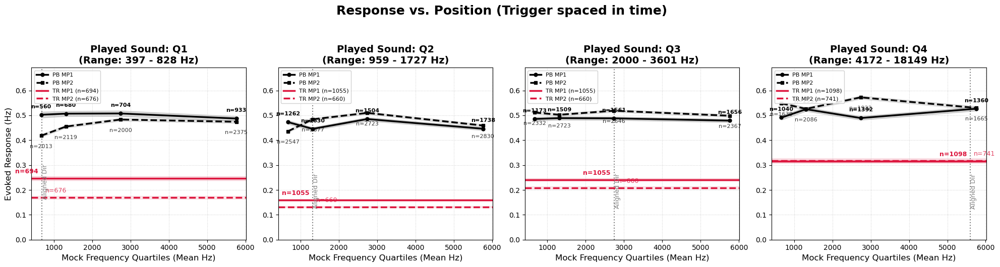


📊 样本数聚合统计: 按照 Quartile 划分的 Trigger 数量

--- PB_Orig & TR_Orig ---
Mock_Freq_Q     Q1   Q2   Q3   Q4  TR_Total
Played_Freq_Q                              
Q1             186  218  242  350      1450
Q2             629  835  722  993      5116
Q3             523  689  774  775      4897
Q4             407  430  550  526      4305

--- PB_Inv & TR_Inv ---
Mock_Freq_Q     Q1   Q2   Q3   Q4  TR_Total
Played_Freq_Q                              
Q1             774  566  447  630      2674
Q2             756  654  539  730      2862
Q3             553  558  457  532      2197
Q4             348  390  331  333      1528




In [10]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

# =========================================================
# 1. 重新提取 Trigger 数据 (增加 0.3s 过滤 & 适配字符串与数字标签)
# =========================================================
events_mock = []

# 新增：计算 0.3 秒对应的 bin 数量，用于密集 Trigger 过滤
bins_03s = int(0.3 / dt) 

idx_trigger = n_bins_pre
idx_bl_start = idx_trigger - int(0.3 / dt)
idx_peak_end = idx_trigger + int(0.3 / dt)

for sess_idx, (n_data, f_data) in enumerate(zip(n_data_s, f_data_s)):
    # 兼容性检查
    if 'Mapping_Type' not in f_data.columns or 'Frequency_changes' not in f_data.columns:
        continue
    
    freqs = f_data['Played_frequency'].values
    mock_freqs = f_data['Mock_frequency'].values if 'Mock_frequency' in f_data.columns else freqs
    changes = f_data['Frequency_changes'].values
    conditions = f_data['Condition'].values
    mapping_types = f_data['Mapping_Type'].values
    
    trigger_indices = np.flatnonzero(changes == 1)
    
    # 🌟 修改点：使用 enumerate 获取前后索引进行 0.3s 过滤 🌟
    for k, i in enumerate(trigger_indices):
        if i == 0: continue
            
        # ==========================================
        # 核心过滤逻辑：如果当前 trigger 与上一个间隔小于等于 0.3s (bins_03s)，则跳过
        # ==========================================
        if k > 0:
            prev_i = trigger_indices[k-1]
            if (i - prev_i) <= bins_03s:
                continue
                
        f_post = freqs[i]
        m_post = mock_freqs[i]
        
        # 强制转换为标准的数值和字符串，防止 Pandas 类型推断带来的坑
        cond = float(conditions[i]) if pd.notna(conditions[i]) else -1.0
        m_type = str(mapping_types[i]).strip()
        
        # 兼容新的字符串 ('MP1', 'MP2', 'Standalone') 和旧数字 ('0.0', '1.0')
        is_mp2 = m_type in ['MP2', '1.0', '1']
        is_mp1 = m_type in ['MP1', 'Standalone', '0.0', '0']
        
        if cond == 0.0 and is_mp2:
            label = 'TR_Inv'  # TR MP2
            m_post = f_post 
        elif cond == 1.0 and is_mp2:
            label = 'PB_Inv'  # PB MP2
        elif cond == 0.0 and is_mp1:
            label = 'TR_Orig' # TR MP1
            m_post = f_post
        elif cond == 1.0 and is_mp1:
            label = 'PB_Orig' # PB MP1
        else:
            continue
            
        start = int(i - n_bins_pre)
        stop = int(i + n_bins_post)
        
        if start >= 0 and stop <= n_data.shape[-1] and n_data[:, start:stop].shape[1] == expected_length:
            segment = n_data[:, start:stop]
            events_mock.append({
                'sess_idx': sess_idx,
                'label': label,
                'Played_Freq': np.round(f_post, 1), 
                'Mock_Freq': np.round(m_post, 1),   
                'segment': segment
            })

df_mock_events = pd.DataFrame(events_mock)
print(f"✅ 成功提取了 {len(df_mock_events)} 个有效 Trigger (已过滤 0.3s 密集 Trigger，包含 MP1 & MP2)。")

# =========================================================
# 2. 计算 Evoked Response (带空表保护)
# =========================================================
metrics_mock = []

if not df_mock_events.empty:
    for (s_idx, label, p_freq, m_freq), df_sub in df_mock_events.groupby(['sess_idx', 'label', 'Played_Freq', 'Mock_Freq']):
        segs = np.stack(df_sub['segment'].values, axis=0)
        neuron_means = np.mean(segs, axis=0) 
        
        for n in range(neuron_means.shape[0]):
            psth = neuron_means[n, :]
            bl = np.mean(psth[idx_bl_start:idx_trigger])
            pk = np.max(psth[idx_trigger:idx_peak_end])
            
            metrics_mock.append({
                'Label': label,
                'Played_Freq': p_freq,
                'Mock_Freq': m_freq,
                'Evoked': pk - bl
            })
else:
    print("⚠️ 警告: 没有提取到任何数据，后续绘图可能报错。")

df_metrics_mock = pd.DataFrame(metrics_mock)

# =========================================================
# 2.5. 自定义强制边界划分 Quartiles
# =========================================================
if not df_metrics_mock.empty:
    bin_edges = df_metrics_mock['Played_Freq'].quantile([0, 0.25, 0.5, 0.75, 1.0]).tolist()
    
    bin_edges[1] = 958
    bin_edges[2] = 1999 
    bin_edges[3] = 4171 
    bin_edges[0] = -np.inf
    bin_edges[-1] = np.inf
    
    played_labels = ["Q1", "Q2", "Q3", "Q4"]
    mock_labels = ["Q1", "Q2", "Q3", "Q4"]
    
    df_metrics_mock['Played_Freq_Q'] = pd.cut(df_metrics_mock['Played_Freq'], bins=bin_edges, labels=played_labels, include_lowest=True)
    df_metrics_mock['Mock_Freq_Q'] = pd.cut(df_metrics_mock['Mock_Freq'], bins=bin_edges, labels=mock_labels, include_lowest=True)
    
    played_q_means = df_metrics_mock.groupby('Played_Freq_Q', observed=False)['Played_Freq'].mean()
    mock_q_means = df_metrics_mock.groupby('Mock_Freq_Q', observed=False)['Mock_Freq'].mean()
    
    print(f"🎯 按照自定义边界将频率划分至 4 个组。")
    
    df_mock_events['Played_Freq_Q'] = pd.cut(df_mock_events['Played_Freq'], bins=bin_edges, labels=played_labels, include_lowest=True)
    df_mock_events['Mock_Freq_Q'] = pd.cut(df_mock_events['Mock_Freq'], bins=bin_edges, labels=mock_labels, include_lowest=True)

# =========================================================
# 3. 画布绘制：包含 MP1(实线) 和 MP2(虚线)
# =========================================================
if not df_metrics_mock.empty:
    n_cols = len(played_labels)
    fig, axes = plt.subplots(1, n_cols, figsize=(5 * n_cols, 5), sharey=True)
    
    if n_cols == 1:
        axes = [axes]
    
    for i, q_label in enumerate(played_labels):
        ax = axes[i]
        
        target_mean_freq = played_q_means[q_label]
        current_q_data = df_metrics_mock[df_metrics_mock['Played_Freq_Q'] == q_label]
        q_min = current_q_data['Played_Freq'].min()
        q_max = current_q_data['Played_Freq'].max()
        
        # ---------------------------------------------------------
        # 1. PB MP1 (黑实线)
        # ---------------------------------------------------------
        pb1_data = df_metrics_mock[(df_metrics_mock['Label'] == 'PB_Orig') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
        if not pb1_data.empty:
            pb1_stats = pb1_data.groupby('Mock_Freq_Q', observed=False)['Evoked'].agg(['mean', 'sem', 'count']).reset_index()
            pb1_stats['x_hz'] = pb1_stats['Mock_Freq_Q'].map(mock_q_means)
            pb1_stats = pb1_stats.dropna(subset=['x_hz']).sort_values('x_hz')
            
            ax.plot(pb1_stats['x_hz'], pb1_stats['mean'], color='black', linewidth=2.5, marker='o', markersize=5, label='PB MP1', linestyle='-')
            ax.fill_between(pb1_stats['x_hz'], pb1_stats['mean'] - pb1_stats['sem'], pb1_stats['mean'] + pb1_stats['sem'], color='black', alpha=0.15)
                            
            for _, row in pb1_stats.iterrows():
                ax.annotate(f"n={int(row['count'])}", xy=(row['x_hz'], row['mean']), xytext=(0, 8), 
                            textcoords='offset points', ha='center', va='bottom', fontsize=8, color='black', fontweight='bold')
    
        # ---------------------------------------------------------
        # 2. PB MP2 (黑虚线)
        # ---------------------------------------------------------
        pb2_data = df_metrics_mock[(df_metrics_mock['Label'] == 'PB_Inv') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
        if not pb2_data.empty:
            pb2_stats = pb2_data.groupby('Mock_Freq_Q', observed=False)['Evoked'].agg(['mean', 'sem', 'count']).reset_index()
            pb2_stats['x_hz'] = pb2_stats['Mock_Freq_Q'].map(mock_q_means)
            pb2_stats = pb2_stats.dropna(subset=['x_hz']).sort_values('x_hz')
            
            ax.plot(pb2_stats['x_hz'], pb2_stats['mean'], color='black', linewidth=2.5, marker='s', markersize=5, label='PB MP2', linestyle='--')
            ax.fill_between(pb2_stats['x_hz'], pb2_stats['mean'] - pb2_stats['sem'], pb2_stats['mean'] + pb2_stats['sem'], color='black', alpha=0.1)
                            
            for _, row in pb2_stats.iterrows():
                ax.annotate(f"n={int(row['count'])}", xy=(row['x_hz'], row['mean']), xytext=(0, -12), 
                            textcoords='offset points', ha='center', va='top', fontsize=8, color='black', alpha=0.8)
    
        # ---------------------------------------------------------
        # 3. TR MP1 (红实线)
        # ---------------------------------------------------------
        tr1_data = df_metrics_mock[(df_metrics_mock['Label'] == 'TR_Orig') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
        if not tr1_data.empty:
            tr1_mean = tr1_data['Evoked'].mean()
            tr1_sem = tr1_data['Evoked'].sem()
            tr1_n = len(tr1_data)
            
            ax.axhline(tr1_mean, color='crimson', linestyle='-', linewidth=2.5, label=f'TR MP1 (n={tr1_n})')
            ax.axhspan(tr1_mean - tr1_sem, tr1_mean + tr1_sem, color='crimson', alpha=0.15)
    
            ax.annotate(f"n={tr1_n}", xy=(target_mean_freq, tr1_mean), xytext=(-5, 5), textcoords='offset points',
                        ha='right', va='bottom', fontsize=9, color='crimson', fontweight='bold')
    
        # ---------------------------------------------------------
        # 4. TR MP2 (红虚线)
        # ---------------------------------------------------------
        tr2_data = df_metrics_mock[(df_metrics_mock['Label'] == 'TR_Inv') & (df_metrics_mock['Played_Freq_Q'] == q_label)]
        if not tr2_data.empty:
            tr2_mean = tr2_data['Evoked'].mean()
            tr2_sem = tr2_data['Evoked'].sem()
            tr2_n = len(tr2_data)
            
            ax.axhline(tr2_mean, color='crimson', linestyle='--', linewidth=2.5, label=f'TR MP2 (n={tr2_n})')
            ax.axhspan(tr2_mean - tr2_sem, tr2_mean + tr2_sem, color='crimson', alpha=0.1)
    
            ax.annotate(f"n={tr2_n}", xy=(target_mean_freq, tr2_mean), xytext=(5, 5), textcoords='offset points',
                        ha='left', va='bottom', fontsize=9, color='crimson', alpha=0.8)
    
        # --- 装饰 ---
        ax.axvline(target_mean_freq, color='gray', linestyle=':', linewidth=1.5, zorder=0)
        ax.tick_params(labelleft=True)
        
        # (已将 y 轴限制同步代码移出循环以提高稳定性)
        ax.text(target_mean_freq, ax.get_ylim()[0], '  Aligned Dir', color='gray', fontsize=9, va='bottom', rotation=90)
    
        ax.set_title(f"Played Sound: {q_label}\n(Range: {q_min:.0f} - {q_max:.0f} Hz)", fontsize=14, fontweight='bold')
        ax.grid(True, linestyle=':', alpha=0.6)
        ax.set_xlabel('Mock Frequency Quartiles (Mean Hz)', fontsize=12)
        
        if i == 0:
            ax.set_ylabel('Evoked Response (Hz)', fontsize=12)
            
        ax.legend(fontsize=8, loc='upper left', framealpha=0.9)
    
    # 🌟 全局 Y 轴优化：在循环外统一调整一次，避免每次画子图时被错误拉伸 🌟
    y_min, y_max = axes[0].get_ylim()
    axes[0].set_ylim(min(0, y_min), y_max * 1.15)
    
    plt.suptitle("Response vs. Position (Trigger spaced in time)", fontsize=18, fontweight='bold', y=1.05)
    plt.tight_layout()
    plt.show()

# =========================================================
# 4. 输出样本分布统计表 (包含 MP1 和 MP2)
# =========================================================
print("\n" + "=" * 80)
print("📊 样本数聚合统计: 按照 Quartile 划分的 Trigger 数量")
print("=" * 80)

if not df_mock_events.empty:
    for pb_label, tr_label in [('PB_Orig', 'TR_Orig'), ('PB_Inv', 'TR_Inv')]:
        print(f"\n--- {pb_label} & {tr_label} ---")
        df_pb_trigs = df_mock_events[df_mock_events['label'] == pb_label]
        
        if not df_pb_trigs.empty:
            pivot_pb = pd.pivot_table(
                df_pb_trigs, index='Played_Freq_Q', columns='Mock_Freq_Q',
                values='sess_idx', aggfunc='count', fill_value=0, observed=False
            )
            df_tr_counts = df_mock_events[df_mock_events['label'] == tr_label].groupby('Played_Freq_Q', observed=False).size()
            
            final_stats = pivot_pb.copy()
            final_stats['TR_Total'] = df_tr_counts
            final_stats['TR_Total'] = final_stats['TR_Total'].fillna(0).astype(int)
            
            print(final_stats.to_string())
        else:
            print(f"没有找到 {pb_label} 的数据。")
else:
    print("由于提取到的数据为空，无法生成统计表。")
        
print("\n" + "=" * 80 + "\n")

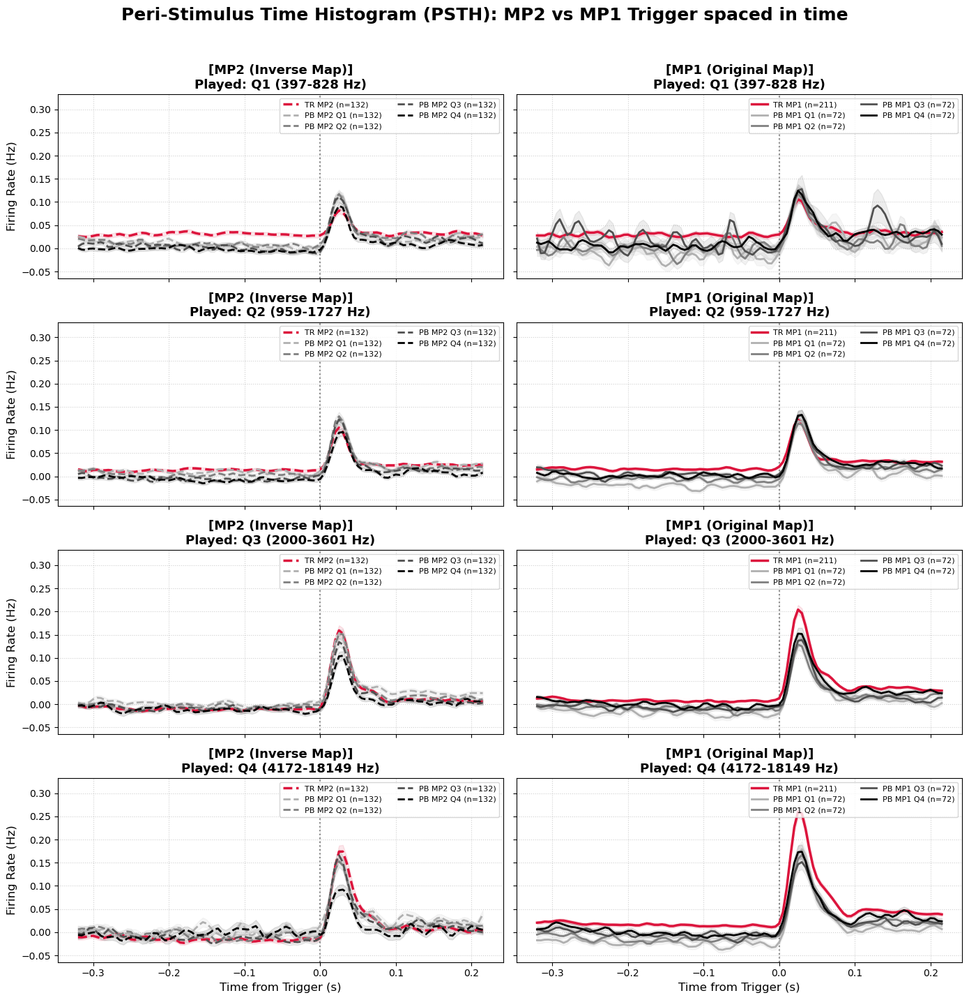

In [7]:
# =========================================================
# 6. 画布绘制：4x2 PSTH (左列: MP2 虚线 | 右列: MP1 实线)
# =========================================================
if not df_metrics_mock.empty and not df_mock_events.empty:
    n_rows = len(played_labels)
    n_cols = 2 # 左侧 MP2，右侧 MP1
    
    # 创建 4x2 网格，共享 X 轴和 Y 轴比例尺以便于直接比较
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(14, 3.5 * n_rows), sharey=True, sharex=True)
    
    if n_rows == 1:
        axes = np.expand_dims(axes, axis=0)

    # 定义 PSTH 的时间轴
    t_axis = (np.arange(expected_length) - n_bins_pre) * dt

    # 定义 PB 不同 Mock Freq Quartile 的深浅灰度映射 (从浅灰到纯黑)
    mock_shades = {
        'Q1': '#B0B0B0', # 浅灰
        'Q2': '#808080', # 中灰
        'Q3': '#505050', # 深灰
        'Q4': '#000000'  # 纯黑
    }

    for i, q_label in enumerate(played_labels):
        current_q_data = df_metrics_mock[df_metrics_mock['Played_Freq_Q'] == q_label]
        
        # 增加防空报错保护
        if current_q_data.empty:
            continue
            
        q_min = current_q_data['Played_Freq'].min()
        q_max = current_q_data['Played_Freq'].max()
        
        ax_mp2 = axes[i, 0] # 左侧画 MP2
        ax_mp1 = axes[i, 1] # 右侧画 MP1
        
        # ---------------------------------------------------------
        # 左列: MP2 (TR_Inv, PB_Inv) - 虚线
        # ---------------------------------------------------------
        # 1. TR MP2
        tr2_df = df_mock_events[(df_mock_events['label'] == 'TR_Inv') & (df_mock_events['Played_Freq_Q'] == q_label)]
        if not tr2_df.empty:
            tr_sess_psth = [np.mean(np.stack(df_sub['segment'].values, axis=0), axis=0) for _, df_sub in tr2_df.groupby('sess_idx')]
            if tr_sess_psth:
                tr_all_neurons = np.concatenate(tr_sess_psth, axis=0)
                tr_mean, tr_sem = np.mean(tr_all_neurons, axis=0), np.std(tr_all_neurons, axis=0) / np.sqrt(tr_all_neurons.shape[0])
                
                ax_mp2.plot(t_axis, tr_mean, color='crimson', linestyle='--', linewidth=2.5, label=f'TR MP2 (n={tr_all_neurons.shape[0]})')
                ax_mp2.fill_between(t_axis, tr_mean - tr_sem, tr_mean + tr_sem, color='crimson', alpha=0.1)
                
        # 2. PB MP2
        for m_label in mock_labels:
            pb2_df = df_mock_events[(df_mock_events['label'] == 'PB_Inv') & (df_mock_events['Played_Freq_Q'] == q_label) & (df_mock_events['Mock_Freq_Q'] == m_label)]
            if not pb2_df.empty:
                pb_sess_psth = [np.mean(np.stack(df_sub['segment'].values, axis=0), axis=0) for _, df_sub in pb2_df.groupby('sess_idx')]
                if pb_sess_psth:
                    pb_all_neurons = np.concatenate(pb_sess_psth, axis=0)
                    pb_mean, pb_sem = np.mean(pb_all_neurons, axis=0), np.std(pb_all_neurons, axis=0) / np.sqrt(pb_all_neurons.shape[0])
                    shade = mock_shades.get(m_label, '#000000')
                    
                    ax_mp2.plot(t_axis, pb_mean, color=shade, linestyle='--', linewidth=2.0, label=f'PB MP2 {m_label} (n={pb_all_neurons.shape[0]})')
                    ax_mp2.fill_between(t_axis, pb_mean - pb_sem, pb_mean + pb_sem, color=shade, alpha=0.1)

        # ---------------------------------------------------------
        # 右列: MP1 (TR_Orig, PB_Orig) - 实线
        # ---------------------------------------------------------
        # 1. TR MP1
        tr1_df = df_mock_events[(df_mock_events['label'] == 'TR_Orig') & (df_mock_events['Played_Freq_Q'] == q_label)]
        if not tr1_df.empty:
            tr_sess_psth = [np.mean(np.stack(df_sub['segment'].values, axis=0), axis=0) for _, df_sub in tr1_df.groupby('sess_idx')]
            if tr_sess_psth:
                tr_all_neurons = np.concatenate(tr_sess_psth, axis=0)
                tr_mean, tr_sem = np.mean(tr_all_neurons, axis=0), np.std(tr_all_neurons, axis=0) / np.sqrt(tr_all_neurons.shape[0])
                
                ax_mp1.plot(t_axis, tr_mean, color='crimson', linestyle='-', linewidth=2.5, label=f'TR MP1 (n={tr_all_neurons.shape[0]})')
                ax_mp1.fill_between(t_axis, tr_mean - tr_sem, tr_mean + tr_sem, color='crimson', alpha=0.1)
                
        # 2. PB MP1
        for m_label in mock_labels:
            pb1_df = df_mock_events[(df_mock_events['label'] == 'PB_Orig') & (df_mock_events['Played_Freq_Q'] == q_label) & (df_mock_events['Mock_Freq_Q'] == m_label)]
            if not pb1_df.empty:
                pb_sess_psth = [np.mean(np.stack(df_sub['segment'].values, axis=0), axis=0) for _, df_sub in pb1_df.groupby('sess_idx')]
                if pb_sess_psth:
                    pb_all_neurons = np.concatenate(pb_sess_psth, axis=0)
                    pb_mean, pb_sem = np.mean(pb_all_neurons, axis=0), np.std(pb_all_neurons, axis=0) / np.sqrt(pb_all_neurons.shape[0])
                    shade = mock_shades.get(m_label, '#000000')
                    
                    ax_mp1.plot(t_axis, pb_mean, color=shade, linestyle='-', linewidth=2.0, label=f'PB MP1 {m_label} (n={pb_all_neurons.shape[0]})')
                    ax_mp1.fill_between(t_axis, pb_mean - pb_sem, pb_mean + pb_sem, color=shade, alpha=0.1)

        # ---------------------------------------------------------
        # 装饰 (循环应用给当前行的 MP2 和 MP1 两个轴)
        # ---------------------------------------------------------
        for col_idx, ax in enumerate([ax_mp2, ax_mp1]):
            ax.axvline(0, color='gray', linestyle=':', linewidth=1.5, zorder=0) # Trigger 线
            ax.tick_params(labelleft=(col_idx == 0)) # 只在最左侧显示 Y 轴数值，保证整洁
            
            title_prefix = "MP2 (Inverse Map)" if col_idx == 0 else "MP1 (Original Map)"
            ax.set_title(f"[{title_prefix}]\nPlayed: {q_label} ({q_min:.0f}-{q_max:.0f} Hz)", fontsize=13, fontweight='bold')
            ax.grid(True, linestyle=':', alpha=0.6)
            
            # X 轴标签只放在最底下那一行
            if i == n_rows - 1:
                ax.set_xlabel('Time from Trigger (s)', fontsize=12)
            
            # Y 轴标签只放在最左侧的一列
            if col_idx == 0:
                ax.set_ylabel('Firing Rate (Hz)', fontsize=12)
                
            ax.legend(fontsize=8, loc='upper right', framealpha=0.8, ncol=2)

    # 🌟 全局 Y 轴优化：因为已经设置了 sharey=True，只需要对 axes[0, 0] 进行调整即可同步所有子图 🌟
    y_min, y_max = axes[0, 0].get_ylim()
    axes[0, 0].set_ylim(min(0, y_min), y_max * 1.15) 

    plt.suptitle("Peri-Stimulus Time Histogram (PSTH): MP2 vs MP1 Trigger spaced in time", fontsize=18, fontweight='bold', y=1.02)
    plt.tight_layout()
    plt.show()
else:
    print("⚠️ 缺少绘制 PSTH 所需的事件或指标数据。")

In [ ]:
f_data

,Played_frequency,Condition,Block,Frequency_changes,Mapping_Type,Mock_frequency,Mock_change,Position,Speed_x,Sound_speed,Freq_position,Speed_bin,Acc_x
0,0.0,-1.0,0.0,False,0,NaN,NaN,0.00,0.0,0.0,0.00,0,0.0
1,0.0,-1.0,0.0,False,0,NaN,NaN,0.00,0.0,0.0,0.00,0,0.0
2,0.0,-1.0,0.0,False,0,NaN,NaN,0.00,0.0,0.0,0.00,0,0.0
3,0.0,-1.0,0.0,False,0,NaN,NaN,0.00,0.0,0.0,0.00,0,0.0
4,0.0,-1.0,0.0,False,0,NaN,NaN,0.00,0.0,0.0,0.00,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
668815,3601.0,1.0,0.0,False,1,2684.0,False,15.68,0.0,0.0,17.92,0,0.0
668816,3601.0,1.0,0.0,False,1,2684.0,False,15.68,0.0,0.0,17.92,0,0.0
668817,3601.0,1.0,0.0,False,1,2684.0,False,15.68,0.0,0.0,17.92,0,0.0
668818,3601.0,1.0,0.0,False,1,2684.0,False,15.68,0.0,0.0,17.92,0,0.0


## Average of Tracking vs. Playback 


             数据合并与事件统计
✅ [Inverse Playback  ]: 合并 132 个神经元 | 包含 45476 个有效 Triggers
✅ [Original Tracking ]: 合并 144 个神经元 | 包含 34181 个有效 Triggers
✅ [Inverse Tracking  ]: 合并 132 个神经元 | 包含 49013 个有效 Triggers



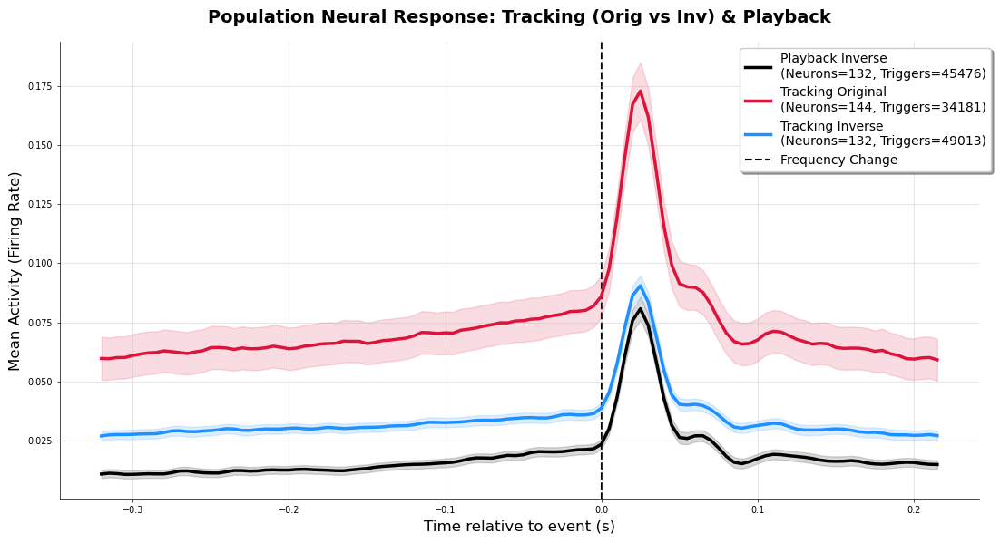

In [ ]:
import matplotlib.pyplot as plt
# =========================================================================
# 替换原有的 Cell 14 和 Cell 16
# 分离 Original Tracking, Inverse Tracking 与 Inverse Playback 的 PSTH
# 并统计每个类别的有效 Triggers 数量 (使用 Mapping_Type: 0=Original, 1=Inverse)
# =========================================================================

# 1. 初始化空列表以收集各个神经元的平均活动
all_means_playback_inv = []
all_means_tracking_inv = []
all_means_tracking_orig = []

# 初始化 Triggers 计数器
total_triggers_pb_inv = 0
total_triggers_tr_inv = 0
total_triggers_tr_orig = 0

# 2. 遍历所有加载的 Session
for n_data, f_data in zip(n_data_s, f_data_s):
    
    # 防呆检查：确保数据包含 Mapping_Type 列
    if 'Mapping_Type' not in f_data.columns:
        print("⚠️ 警告: 未找到 'Mapping_Type' 列，请确保已运行最新版的 get_data 函数！")
        continue
        
    # --- 设定筛选掩码 (Masks) 使用 0 和 1 ---
    # Playback Inverse: Condition == 1, Mapping_Type == 1
    idx_pb_inv = (f_data['Frequency_changes'] == 1) & (f_data['Condition'] == 1) & (f_data['Mapping_Type'] == 1)
    
    # Tracking Inverse: Condition == 0, Mapping_Type == 1
    idx_tr_inv = (f_data['Frequency_changes'] == 1) & (f_data['Condition'] == 0) & (f_data['Mapping_Type'] == 1)
    
    # Tracking Original: Condition == 0, Mapping_Type == 0
    idx_tr_orig = (f_data['Frequency_changes'] == 1) & (f_data['Condition'] == 0) & (f_data['Mapping_Type'] == 0)
    
    event_pb_inv = np.flatnonzero(idx_pb_inv)
    event_tr_inv = np.flatnonzero(idx_tr_inv)
    event_tr_orig = np.flatnonzero(idx_tr_orig)
    
    # --- 辅助函数：提取并对齐片段，同时返回有效 Trigger 数量 ---
    def get_session_channel_means(event_indices):
        session_events = []
        for i in event_indices:
            start = int(i - n_bins_pre)
            stop = int(i + n_bins_post)
            if start >= 0 and stop <= n_data.shape[-1]:
                segment = n_data[:, start:stop]
                if segment.shape[1] == expected_length:
                    session_events.append(segment)
        
        valid_triggers = len(session_events)
        if valid_triggers > 0:
            session_stack = np.stack(session_events, axis=0)
            return np.mean(session_stack, axis=0), valid_triggers 
        return None, 0
    # -------------------------------------------------------------
    
    # 提取并累计
    pb_inv_means, counts = get_session_channel_means(event_pb_inv)
    if pb_inv_means is not None: 
        all_means_playback_inv.append(pb_inv_means)
        total_triggers_pb_inv += counts

    tr_inv_means, counts = get_session_channel_means(event_tr_inv)
    if tr_inv_means is not None: 
        all_means_tracking_inv.append(tr_inv_means)
        total_triggers_tr_inv += counts

    tr_orig_means, counts = get_session_channel_means(event_tr_orig)
    if tr_orig_means is not None: 
        all_means_tracking_orig.append(tr_orig_means)
        total_triggers_tr_orig += counts

# 3. 合并所有 Session 并计算 Population Grand Average & SEM
def calc_stats(mean_list, name, total_triggers):
    if len(mean_list) > 0:
        pool = np.concatenate(mean_list, axis=0)
        mean = np.mean(pool, axis=0)
        sem = np.std(pool, axis=0) / np.sqrt(pool.shape[0])
        print(f"✅ [{name.ljust(18)}]: 合并 {str(pool.shape[0]).rjust(3)} 个神经元 | 包含 {str(total_triggers).rjust(4)} 个有效 Triggers")
        return mean, sem, pool.shape[0], total_triggers
    print(f"⚠️ [{name.ljust(18)}]: 未找到有效数据。")
    return None, None, 0, 0

print("\n" + "="*50)
print("             数据合并与事件统计")
print("="*50)
mean_pb_inv, sem_pb_inv, n_pb_inv, trig_pb_inv = calc_stats(all_means_playback_inv, "Inverse Playback", total_triggers_pb_inv)
mean_tr_orig, sem_tr_orig, n_tr_orig, trig_tr_orig = calc_stats(all_means_tracking_orig, "Original Tracking", total_triggers_tr_orig)
mean_tr_inv, sem_tr_inv, n_tr_inv, trig_tr_inv = calc_stats(all_means_tracking_inv, "Inverse Tracking", total_triggers_tr_inv)
print("="*50 + "\n")

# ==========================================
# 4. 可视化 (Plotting)
# ==========================================
time = np.arange(-n_bins_pre, n_bins_post) * dt

plt.figure(figsize=(11, 6))

# A. 画 Inverse Playback (黑灰线)
if mean_pb_inv is not None:
    lbl_pb = f'Playback Inverse\n(Neurons={n_pb_inv}, Triggers={trig_pb_inv})'
    plt.plot(time, mean_pb_inv, color='black', linewidth=2.5, label=lbl_pb)
    plt.fill_between(time, mean_pb_inv - sem_pb_inv, mean_pb_inv + sem_pb_inv, color='black', alpha=0.15)

# B. 画 Original Tracking (红色线)
if mean_tr_orig is not None:
    lbl_tr_o = f'Tracking Original\n(Neurons={n_tr_orig}, Triggers={trig_tr_orig})'
    plt.plot(time, mean_tr_orig, color='crimson', linewidth=2.5, label=lbl_tr_o)
    plt.fill_between(time, mean_tr_orig - sem_tr_orig, mean_tr_orig + sem_tr_orig, color='crimson', alpha=0.15)

# C. 画 Inverse Tracking (蓝色线)
if mean_tr_inv is not None:
    lbl_tr_i = f'Tracking Inverse\n(Neurons={n_tr_inv}, Triggers={trig_tr_inv})'
    plt.plot(time, mean_tr_inv, color='dodgerblue', linewidth=2.5, label=lbl_tr_i)
    plt.fill_between(time, mean_tr_inv - sem_tr_inv, mean_tr_inv + sem_tr_inv, color='dodgerblue', alpha=0.15)

plt.axvline(0, color='black', linestyle='--', label='Frequency Change', zorder=0)
plt.title(f'Population Neural Response: Tracking (Orig vs Inv) & Playback', fontsize=14, fontweight='bold', pad=15)
plt.xlabel('Time relative to event (s)', fontsize=12)
plt.ylabel('Mean Activity (Firing Rate)', fontsize=12)
plt.grid(True, alpha=0.3)

plt.legend(loc='upper right', fontsize=10, frameon=True, shadow=True, bbox_to_anchor=(1.02, 1))
plt.tight_layout()

plt.show()

In [ ]:
# Lists to collect means for each neuron/channel from all sessions
all_neuron_means_playback = []
all_neuron_means_tracking = []

# 2. Loop through all sessions 
for n_data, f_data in zip(n_data_s, f_data_s):
    
    # Get event indices for both conditions
    event_playback = np.flatnonzero((f_data['Frequency_changes'] == 1) & (f_data['Condition'] == 1))
    event_tracking = np.flatnonzero((f_data['Frequency_changes'] == 1) & (f_data['Condition'] == 0))
    
    # --- Helper function: extract average response for current session ---
    def get_session_channel_means(event_indices):
        session_events = []
        for i in event_indices:
            start = int(i - n_bins_pre)
            stop = int(i + n_bins_post)
            if start >= 0 and stop <= n_data.shape[-1]:
                segment = n_data[:, start:stop]
                if segment.shape[1] == expected_length:
                    session_events.append(segment)
        if len(session_events) > 0:
            session_stack = np.stack(session_events, axis=0)
            return np.mean(session_stack, axis=0) # shape: (n_channels, expected_length)
        return None
    # -------------------------------------------------------------
    
    # Extract Playback and append to list
    pb_means = get_session_channel_means(event_playback)
    if pb_means is not None:
        all_neuron_means_playback.append(pb_means)
        
    # Extract Tracking and append to list
    tr_means = get_session_channel_means(event_tracking)
    if tr_means is not None:
        all_neuron_means_tracking.append(tr_means)

# 3. Combine and Calculate Grand Averages for BOTH conditions
# Playback
if len(all_neuron_means_playback) > 0:
    final_pool_pb = np.concatenate(all_neuron_means_playback, axis=0)
    mean_playback = np.mean(final_pool_pb, axis=0)
    sem_playback = np.std(final_pool_pb, axis=0) / np.sqrt(final_pool_pb.shape[0])
    print(f"Playback: {final_pool_pb.shape[0]} neurons pooled.")

# Tracking
if len(all_neuron_means_tracking) > 0:
    final_pool_tr = np.concatenate(all_neuron_means_tracking, axis=0)
    mean_tracking = np.mean(final_pool_tr, axis=0)
    sem_tracking = np.std(final_pool_tr, axis=0) / np.sqrt(final_pool_tr.shape[0])
    print(f"Tracking: {final_pool_tr.shape[0]} neurons pooled.")

Playback: 132 neurons pooled.
Tracking: 144 neurons pooled.


In [ ]:
mean_playback

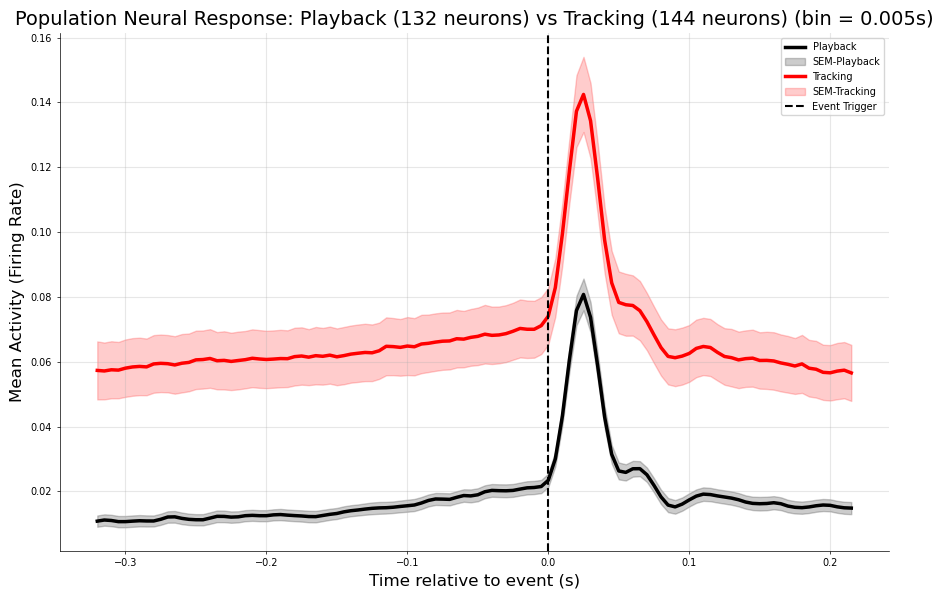

In [ ]:
# Create time axis
time = np.arange(-n_bins_pre, n_bins_post) * dt

plt.figure(figsize=(9, 6))

# Plot Playback curve and shaded error
plt.plot(time, mean_playback, color='black', linewidth=2.5, label='Playback')
plt.fill_between(time, 
                 mean_playback - sem_playback, 
                 mean_playback + sem_playback, 
                 color='black', alpha=0.2, label='SEM-Playback')

# Plot Tracking curve and shaded error
plt.plot(time, mean_tracking, color='red', linewidth=2.5, label='Tracking')
plt.fill_between(time, 
                 mean_tracking - sem_tracking, 
                 mean_tracking + sem_tracking, 
                 color='red', alpha=0.2, label='SEM-Tracking')

# Figure decorations
plt.axvline(0, color='black', linestyle='--', label='Event Trigger')
plt.title(f'Population Neural Response: Playback ({final_pool_pb.shape[0]} neurons) vs Tracking ({final_pool_tr.shape[0]} neurons) (bin = {dt}s)', fontsize=14)
plt.xlabel('Time relative to event (s)', fontsize=12)
plt.ylabel('Mean Activity (Firing Rate)', fontsize=12)
plt.grid(True, alpha=0.3)
plt.legend()
plt.tight_layout()

plt.show()

In [ ]:
# Iterate through the list of DataFrames (f_data_s)
for i, f_data in enumerate(f_data_s):
    # Get the session folder name from the path list if available
    session_name = os.path.basename(all_sessions_path[i])
    
    print(f"--- Session {i}: {session_name} ---")
    
    # Check if 'Block' column exists
    if 'Block' in f_data.columns:
        # Sort by block index (e.g., Block 1, 2, 3...)
        block_counts = f_data['Block'].value_counts().sort_index()
        print(block_counts)
    else:
        print("Column 'Block' not found in this session.")
    print("\n")

## Z-scored Metrics of Groups of Triggers 

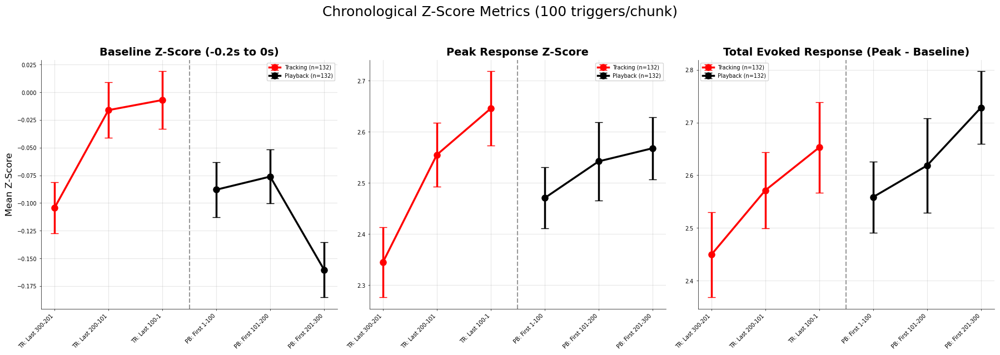

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# --- CUSTOMIZABLE VARIABLES ---
n_per_group = 100    # Number of triggers per group
n_groups = 3        # Number of chronological groups per condition
# ==========================================

total_needed = n_groups * n_per_group

# Define indices for calculating metrics
baseline_bins = int(0.2 / dt)
idx_base_start = n_bins_pre - baseline_bins
idx_base_end = n_bins_pre  # Sound onset (time 0)
idx_peak_start = n_bins_pre
idx_peak_end = expected_length

# Generate x-axis labels for the chunks
# Tracking: Last chunks (15-11, 10-6, 5-1) chronological
# Playback: First chunks (1-5, 6-10, 11-15) chronological
x_labels_tr = [f"TR: Last {i*n_per_group}-{(i-1)*n_per_group+1}" for i in range(n_groups, 0, -1)]
x_labels_pb = [f"PB: First {i*n_per_group+1}-{(i+1)*n_per_group}" for i in range(n_groups)]
all_x_labels = x_labels_tr + x_labels_pb

# Containers for the chunks
tr_data_chunks = [[] for _ in range(n_groups)]
pb_data_chunks = [[] for _ in range(n_groups)]

# Helper function
def get_subset_channel_means(n_data, event_indices):
    segments = []
    for i in event_indices:
        start, stop = int(i - n_bins_pre), int(i + n_bins_post)
        if 0 <= start and stop <= n_data.shape[-1]:
            seg = n_data[:, start:stop]
            if seg.shape[1] == expected_length:
                segments.append(seg)
    if len(segments) > 0:
        return np.mean(np.stack(segments, axis=0), axis=0)
    return None

# 1. Main Processing Loop
for n_data, f_data in zip(n_data_s, f_data_s):
    events_pb = np.flatnonzero((f_data['Frequency_changes'] == 1) & (f_data['Condition'] == 1))
    events_tr = np.flatnonzero((f_data['Frequency_changes'] == 1) & (f_data['Condition'] == 0))
    
    # STRICT INCLUSION: Only process if the session has enough events for BOTH conditions
    if len(events_tr) >= total_needed and len(events_pb) >= total_needed:
        
        # --- Tracking Chunks (Chronological from the end) ---
        for chunk_idx, i in enumerate(range(n_groups, 0, -1)):
            start = -i * n_per_group
            end = -(i - 1) * n_per_group if i > 1 else None
            evs = events_tr[start:end]
            mean_trace = get_subset_channel_means(n_data, evs)
            if mean_trace is not None:
                tr_data_chunks[chunk_idx].append(mean_trace)

        # --- Playback Chunks (Chronological from the start) ---
        for chunk_idx, i in enumerate(range(n_groups)):
            start = i * n_per_group
            end = (i + 1) * n_per_group
            evs = events_pb[start:end]
            mean_trace = get_subset_channel_means(n_data, evs)
            if mean_trace is not None:
                pb_data_chunks[chunk_idx].append(mean_trace)

# 2. Compute Z-Scores and Metrics
def process_metrics(data_chunks):
    means = {'base': [], 'peak': [], 'evoked': []}
    sems = {'base': [], 'peak': [], 'evoked': []}
    n_neurons = 0
    
    for chunk in data_chunks:
        if len(chunk) > 0:
            final_dat = np.concatenate(chunk, axis=0)
            n_neurons = final_dat.shape[0]
            
            # Z-Score per neuron
            mean_time = np.mean(final_dat, axis=1, keepdims=True)
            std_time = np.std(final_dat, axis=1, keepdims=True) + 1e-8
            z_dat = (final_dat - mean_time) / std_time
            
            # Extract Metrics
            base = np.mean(z_dat[:, idx_base_start:idx_base_end], axis=1)
            peak = np.max(z_dat[:, idx_peak_start:idx_peak_end], axis=1)
            evoked = peak - base
            
            # Store Means and SEMs
            means['base'].append(np.mean(base))
            sems['base'].append(np.std(base) / np.sqrt(n_neurons))
            
            means['peak'].append(np.mean(peak))
            sems['peak'].append(np.std(peak) / np.sqrt(n_neurons))
            
            means['evoked'].append(np.mean(evoked))
            sems['evoked'].append(np.std(evoked) / np.sqrt(n_neurons))
        else:
            for k in means:
                means[k].append(np.nan)
                sems[k].append(np.nan)
                
    return means, sems, n_neurons

tr_means, tr_sems, n_tr_neurons = process_metrics(tr_data_chunks)
pb_means, pb_sems, n_pb_neurons = process_metrics(pb_data_chunks)

# 3. Plotting
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# Define sequential x-coordinates for Tracking (left) and Playback (right)
x_tr = np.arange(n_groups)
x_pb = np.arange(n_groups) + n_groups
all_x_vals = list(x_tr) + list(x_pb)
divider_x = n_groups - 0.5  # The midpoint between Tracking and Playback

metrics = ['base', 'peak', 'evoked']
titles = ['Baseline Z-Score (-0.2s to 0s)', 'Peak Response Z-Score', 'Total Evoked Response (Peak - Baseline)']

for i, metric in enumerate(metrics):
    ax = axes[i]
    
    # Plot Tracking (Red, Left side)
    tr_m = np.array(tr_means[metric])
    tr_s = np.array(tr_sems[metric])
    ax.errorbar(x_tr, tr_m, yerr=tr_s, color='red', marker='o', markersize=8, 
                linewidth=2.5, label=f'Tracking (n={n_tr_neurons})', capsize=5)
    
    # Plot Playback (Black, Right side)
    pb_m = np.array(pb_means[metric])
    pb_s = np.array(pb_sems[metric])
    ax.errorbar(x_pb, pb_m, yerr=pb_s, color='black', marker='o', markersize=8, 
                linewidth=2.5, label=f'Playback (n={n_pb_neurons})', capsize=5)
    
    # Formatting
    ax.axvline(x=divider_x, color='gray', linestyle='--', alpha=0.8, zorder=1) # Visual separator
    ax.set_title(titles[i], fontsize=14, fontweight='bold')
    ax.set_xticks(all_x_vals)
    ax.set_xticklabels(all_x_labels, rotation=45, ha='right') # Rotated for readability
    ax.grid(True, alpha=0.3)
    
    if i == 0:
        ax.set_ylabel('Mean Z-Score', fontsize=12)
    ax.legend(loc='best')

plt.suptitle(f'Chronological Z-Score Metrics ({n_per_group} triggers/chunk)', fontsize=18, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ==========================================
# --- CUSTOMIZABLE VARIABLES ---
n_per_group = 100    # Number of triggers per group
n_groups = 3       # Number of chronological groups per condition
# ==========================================

total_needed = n_groups * n_per_group

# Define indices for calculating metrics
baseline_bins = int(0.2 / dt)
idx_base_start = n_bins_pre - baseline_bins
idx_base_end = n_bins_pre  # Sound onset (time 0)
idx_peak_start = n_bins_pre
idx_peak_end = expected_length

# Generate x-axis labels
x_labels_tr = [f"TR: Last {i*n_per_group}-{(i-1)*n_per_group+1}" for i in range(n_groups, 0, -1)]
x_labels_pb = [f"PB: First {i*n_per_group+1}-{(i+1)*n_per_group}" for i in range(n_groups)]
all_x_labels = x_labels_tr + x_labels_pb

# Containers for the chunks
tr_data_chunks = [[] for _ in range(n_groups)]
pb_data_chunks = [[] for _ in range(n_groups)]

# Helper function
def get_subset_channel_means(n_data, event_indices):
    segments = []
    for i in event_indices:
        start, stop = int(i - n_bins_pre), int(i + n_bins_post)
        if 0 <= start and stop <= n_data.shape[-1]:
            seg = n_data[:, start:stop]
            if seg.shape[1] == expected_length:
                segments.append(seg)
    if len(segments) > 0:
        return np.mean(np.stack(segments, axis=0), axis=0) # Average over the 5 events, keep channels
    return None

# 1. Main Processing Loop (Transition-Based)
for n_data, f_data in zip(n_data_s, f_data_s):
    # Get all valid frequency change events and their conditions
    events_all = np.flatnonzero(f_data['Frequency_changes'] == 1)
    if len(events_all) == 0:
        continue
        
    conds_all = f_data['Condition'].values[events_all]
    
    # Find exact indices where condition changes from 0 (Tracking) to 1 (Playback)
    transition_indices = np.where((conds_all[:-1] == 0) & (conds_all[1:] == 1))[0]
    
    for idx in transition_indices:
        # Extract contiguous tracking events BEFORE the transition
        tr_evs = []
        for j in range(idx, -1, -1):
            if conds_all[j] == 0:
                tr_evs.append(events_all[j])
            else:
                break
        tr_evs = tr_evs[::-1] # Reverse to chronological order
        
        # Extract contiguous playback events AFTER the transition
        pb_evs = []
        for j in range(idx + 1, len(conds_all)):
            if conds_all[j] == 1:
                pb_evs.append(events_all[j])
            else:
                break
                
        # Only process THIS transition if it has enough events on both sides
        if len(tr_evs) >= total_needed and len(pb_evs) >= total_needed:
            
            # --- Tracking Chunks (Chronological from the end of the tracking block) ---
            for chunk_idx, i in enumerate(range(n_groups, 0, -1)):
                start = -i * n_per_group
                end = -(i - 1) * n_per_group if i > 1 else None
                evs = tr_evs[start:end]
                mean_trace = get_subset_channel_means(n_data, evs)
                if mean_trace is not None:
                    tr_data_chunks[chunk_idx].append(mean_trace)

            # --- Playback Chunks (Chronological from the start of the playback block) ---
            for chunk_idx, i in enumerate(range(n_groups)):
                start = i * n_per_group
                end = (i + 1) * n_per_group
                evs = pb_evs[start:end]
                mean_trace = get_subset_channel_means(n_data, evs)
                if mean_trace is not None:
                    pb_data_chunks[chunk_idx].append(mean_trace)

# 2. Compute Z-Scores and Metrics
def process_metrics(data_chunks):
    means = {'base': [], 'peak': [], 'evoked': []}
    sems = {'base': [], 'peak': [], 'evoked': []}
    n_samples = 0
    
    for chunk in data_chunks:
        if len(chunk) > 0:
            # Concatenate along axis=0. Shape = (n_channels * valid_transitions, expected_length)
            final_dat = np.concatenate(chunk, axis=0)
            n_samples = final_dat.shape[0] # N = Transitions * Channels
            
            # Z-Score independently per sample
            mean_time = np.mean(final_dat, axis=1, keepdims=True)
            std_time = np.std(final_dat, axis=1, keepdims=True) + 1e-8
            z_dat = (final_dat - mean_time) / std_time
            
            # Extract Metrics
            base = np.mean(z_dat[:, idx_base_start:idx_base_end], axis=1)
            peak = np.max(z_dat[:, idx_peak_start:idx_peak_end], axis=1)
            evoked = peak - base
            
            # Store Means and SEMs
            means['base'].append(np.mean(base))
            sems['base'].append(np.std(base) / np.sqrt(n_samples))
            
            means['peak'].append(np.mean(peak))
            sems['peak'].append(np.std(peak) / np.sqrt(n_samples))
            
            means['evoked'].append(np.mean(evoked))
            sems['evoked'].append(np.std(evoked) / np.sqrt(n_samples))
        else:
            for k in means:
                means[k].append(np.nan)
                sems[k].append(np.nan)
                
    return means, sems, n_samples

tr_means, tr_sems, n_tr_samples = process_metrics(tr_data_chunks)
pb_means, pb_sems, n_pb_samples = process_metrics(pb_data_chunks)

# 3. Plotting
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

x_tr = np.arange(n_groups)
x_pb = np.arange(n_groups) + n_groups
all_x_vals = list(x_tr) + list(x_pb)
divider_x = n_groups - 0.5 

metrics = ['base', 'peak', 'evoked']
titles = ['Baseline Z-Score (-0.2s to 0s)', 'Peak Response Z-Score', 'Total Evoked Response (Peak - Baseline)']

for i, metric in enumerate(metrics):
    ax = axes[i]
    
    # Plot Tracking (Red, Left side)
    tr_m = np.array(tr_means[metric])
    tr_s = np.array(tr_sems[metric])
    ax.errorbar(x_tr, tr_m, yerr=tr_s, color='red', marker='o', markersize=8, 
                linewidth=2.5, label=f'Tracking', capsize=5)
    
    # Plot Playback (Black, Right side)
    pb_m = np.array(pb_means[metric])
    pb_s = np.array(pb_sems[metric])
    ax.errorbar(x_pb, pb_m, yerr=pb_s, color='black', marker='o', markersize=8, 
                linewidth=2.5, label=f'Playback', capsize=5)
    
    # Formatting
    ax.axvline(x=divider_x, color='gray', linestyle='--', alpha=0.8, zorder=1) 
    ax.set_title(titles[i], fontsize=14, fontweight='bold')
    ax.set_xticks(all_x_vals)
    ax.set_xticklabels(all_x_labels, rotation=45, ha='right') 
    ax.grid(True, alpha=0.3)
    
    # Add N annotation dynamically inside each plot
    ax.text(0.05, 0.95, f'N = {n_pb_samples}\n(Channels × Transitions)', 
            transform=ax.transAxes, fontsize=11, verticalalignment='top', 
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='gray'))
    
    if i == 0:
        ax.set_ylabel('Mean Z-Score', fontsize=12)
    ax.legend(loc='lower left')

plt.suptitle(f'Chronological Z-Score Metrics Anchored to Local Block Transitions', fontsize=18, y=1.05)
plt.tight_layout()
plt.show()

## PSTH of triggers in Last n Tracking and First n Playback

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

## Paramètres ##
t_pre = 0.3   # temps avant trigger (s)
t_post = 0.3  # temps après trigger (s)
n_first = 25  # Nombre de triggers à utiliser (first/last)

# Remarque : assurez-vous que 'dt' est bien défini dans votre environnement (ex: dt = 0.005)

def get_psth_last_n_triggers_tracking(data, f_data, t_pre, t_post, dt, n_last=10):
    """
    Calcule le PSTH moyen autour des n derniers triggers pour CHAQUE block,
    uniquement pour les trials Tracking (condition == 0).

    Returns:
        block_psths : dict {block_id: array(neurones x bins)}
        time_axis : temps relatif au trigger
    """
    frequency_changes = f_data['Frequency_changes'].values
    condition = f_data['Condition'].values
    block = f_data['Block'].values
    n_neurons, n_bins = data.shape

    n_bins_pre = int(t_pre / dt)
    n_bins_post = int(t_post / dt)

    # --- Indices des triggers de Tracking ---
    trigger_idx = np.where((frequency_changes == 1) & (condition == 0))[0]

    unique_blocks = np.unique(block[trigger_idx])
    block_psths = {}

    for b in unique_blocks:
        b_triggers = trigger_idx[block[trigger_idx] == b]
        if len(b_triggers) > 0:
            last_triggers = b_triggers[-n_last:]
            
            psth_all = np.zeros((n_neurons, n_bins_pre + n_bins_post))
            n_segments = 0
            
            for idx in last_triggers:
                start = int(idx - n_bins_pre)
                end = int(idx + n_bins_post)
                if start >= 0 and end <= n_bins:
                    psth_all += data[:, start:end]
                    n_segments += 1
            
            # --- Moyenne par neurone POUR CE BLOCK ---
            if n_segments > 0:
                block_psths[b] = psth_all / n_segments

    time_axis = np.arange(-n_bins_pre, n_bins_post) * dt
    return block_psths, time_axis


def get_psth_first_n_triggers_playback(data, f_data, t_pre, t_post, dt, n_first=10):
    """
    Calcule le PSTH moyen autour des n premiers triggers pour CHAQUE block,
    uniquement pour les trials Playback (condition == 1).

    Returns:
        block_psths : dict {block_id: array(neurones x bins)}
        time_axis : temps relatif au trigger
    """
    frequency_changes = f_data['Frequency_changes'].values
    condition = f_data['Condition'].values
    block = f_data['Block'].values
    n_neurons, n_bins = data.shape

    n_bins_pre = int(t_pre / dt)
    n_bins_post = int(t_post / dt)

    # --- Indices des triggers de Playback ---
    trigger_idx = np.where((frequency_changes == 1) & (condition == 1))[0]

    unique_blocks = np.unique(block[trigger_idx])
    block_psths = {}

    for b in unique_blocks:
        b_triggers = trigger_idx[block[trigger_idx] == b]
        if len(b_triggers) > 0:
            first_triggers = b_triggers[:n_first]
            
            psth_all = np.zeros((n_neurons, n_bins_pre + n_bins_post))
            n_segments = 0
            
            for idx in first_triggers:
                start = int(idx - n_bins_pre)
                end = int(idx + n_bins_post)
                if start >= 0 and end <= n_bins:
                    psth_all += data[:, start:end]
                    n_segments += 1
            
            # --- Moyenne par neurone POUR CE BLOCK ---
            if n_segments > 0:
                block_psths[b] = psth_all / n_segments

    time_axis = np.arange(-n_bins_pre, n_bins_post) * dt
    return block_psths, time_axis


# ==========================================================
# Exécution Principale
# ==========================================================

all_playback, all_tracking = [], []

# --- Collecte des PSTHs par transition Tracking -> Playback ---
for n_data, f_data in zip(n_data_s, f_data_s):
    # Dictionnaires contenant les PSTHs calculés par block
    dict_tr, psth_bins = get_psth_last_n_triggers_tracking(n_data, f_data, t_pre, t_post, dt, n_last=n_first)
    dict_pb, _ = get_psth_first_n_triggers_playback(n_data, f_data, t_pre, t_post, dt, n_first=n_first)

    # Identifier les transitions en regardant l'ordre chronologique des blocks
    blocks_in_order = f_data['Block'].unique()
    
    for i in range(len(blocks_in_order) - 1):
        b_curr = blocks_in_order[i]
        b_next = blocks_in_order[i+1]
        
        # Si le block courant est dans notre dictionnaire Tracking 
        # ET que le block suivant est dans notre dictionnaire Playback : c'est une transition !
        if b_curr in dict_tr and b_next in dict_pb:
            all_tracking.append(dict_tr[b_curr])
            all_playback.append(dict_pb[b_next])

if len(all_tracking) > 0 and len(all_playback) > 0:
    # --- Convertir en array et empiler ---
    # np.vstack empile les tableaux de taille (n_canaux, bins). 
    # Le résultat est de taille (n_canaux * transitions, bins)
    tracking_arr = np.vstack(all_tracking)  
    playback_arr = np.vstack(all_playback)

    # N = Nombre total de canaux multiplié par le nombre de transitions identifiées
    n_total_samples = tracking_arr.shape[0]

    # --- Moyenne et SEM (en calculant sur l'axe 0 = échantillons totaux) ---
    tracking_mean = np.nanmean(tracking_arr, axis=0)
    tracking_sem  = np.nanstd(tracking_arr, axis=0) / np.sqrt(n_total_samples)

    playback_mean = np.nanmean(playback_arr, axis=0)
    playback_sem  = np.nanstd(playback_arr, axis=0) / np.sqrt(n_total_samples)

    # --- Plot ---
    plt.figure(figsize=(8, 6))
    
    # Tracking
    plt.plot(psth_bins, tracking_mean, c='red', linewidth=2, label=f'Tracking (last {n_first} triggers)')
    plt.fill_between(psth_bins, tracking_mean - tracking_sem, tracking_mean + tracking_sem, color='red', alpha=0.2)

    # Playback
    plt.plot(psth_bins, playback_mean, c='black', linewidth=2, label=f'Playback (first {n_first} triggers)')
    plt.fill_between(psth_bins, playback_mean - playback_sem, playback_mean + playback_sem, color='black', alpha=0.2)

    # Esthétique
    plt.axvline(0, color='gray', linestyle='--', alpha=0.8)
    plt.xlabel('Time relative to event (s)', fontsize=12)
    plt.ylabel('Firing Rate (spk/s)', fontsize=12)
    plt.legend(frameon=False)
    plt.title('PSTH Tracking vs Playback\nAnchored to Block Transitions', fontsize=14)

    # Retirer les axes du haut et de droite
    ax = plt.gca()
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    
    # Ajouter explicitement le 'N' calculé dans un encadré
    ax.text(0.05, 0.95, f'N = {n_total_samples}\n(Channels × Transitions)', 
            transform=ax.transAxes, fontsize=11, verticalalignment='top', 
            bbox=dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='gray'))

    plt.tight_layout()
    plt.show()
else:
    print("Aucune transition Tracking -> Playback trouvée avec ces critères.")

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

## Paramètres ##
t_pre = 0.3   # temps avant trigger (s)
t_post = 0.3  # temps après trigger (s)

# Liste des puissances de 2 : [1, 2, 4, 8, 16, 32, 64, 128, 256]
n_values = [2**i for i in range(10)]

def get_psth_last_n_triggers_tracking(data, f_data, t_pre, t_post, dt, n_last=10):
    frequency_changes = f_data['Frequency_changes'].values
    condition = f_data['Condition'].values
    block = f_data['Block'].values
    n_neurons, n_bins = data.shape

    n_bins_pre = int(t_pre / dt)
    n_bins_post = int(t_post / dt)

    trigger_idx = np.where((frequency_changes == 1) & (condition == 0))[0]
    unique_blocks = np.unique(block[trigger_idx])
    block_psths = {}

    for b in unique_blocks:
        b_triggers = trigger_idx[block[trigger_idx] == b]
        if len(b_triggers) > 0:
            last_triggers = b_triggers[-n_last:]
            
            psth_all = np.zeros((n_neurons, n_bins_pre + n_bins_post))
            n_segments = 0
            
            for idx in last_triggers:
                start = int(idx - n_bins_pre)
                end = int(idx + n_bins_post)
                if start >= 0 and end <= n_bins:
                    psth_all += data[:, start:end]
                    n_segments += 1
            
            if n_segments > 0:
                block_psths[b] = psth_all / n_segments

    time_axis = np.arange(-n_bins_pre, n_bins_post) * dt
    return block_psths, time_axis


def get_psth_first_n_triggers_playback(data, f_data, t_pre, t_post, dt, n_first=10):
    frequency_changes = f_data['Frequency_changes'].values
    condition = f_data['Condition'].values
    block = f_data['Block'].values
    n_neurons, n_bins = data.shape

    n_bins_pre = int(t_pre / dt)
    n_bins_post = int(t_post / dt)

    trigger_idx = np.where((frequency_changes == 1) & (condition == 1))[0]
    unique_blocks = np.unique(block[trigger_idx])
    block_psths = {}

    for b in unique_blocks:
        b_triggers = trigger_idx[block[trigger_idx] == b]
        if len(b_triggers) > 0:
            first_triggers = b_triggers[:n_first]
            
            psth_all = np.zeros((n_neurons, n_bins_pre + n_bins_post))
            n_segments = 0
            
            for idx in first_triggers:
                start = int(idx - n_bins_pre)
                end = int(idx + n_bins_post)
                if start >= 0 and end <= n_bins:
                    psth_all += data[:, start:end]
                    n_segments += 1
            
            if n_segments > 0:
                block_psths[b] = psth_all / n_segments

    time_axis = np.arange(-n_bins_pre, n_bins_post) * dt
    return block_psths, time_axis


# ==========================================================
# Exécution Principale - Grille de Subplots
# ==========================================================

# Création de la figure avec une rangée et autant de colonnes que de valeurs de n
fig, axes = plt.subplots(1, len(n_values), figsize=(4 * len(n_values), 5), sharey=True)

# S'assurer que axes est itérable si on n'a qu'une seule valeur (au cas où)
if len(n_values) == 1:
    axes = [axes]

for ax_idx, n_first in enumerate(n_values):
    all_playback, all_tracking = [], []
    ax = axes[ax_idx]

    # Collecte des PSTHs par transition pour le n_first courant
    for n_data, f_data in zip(n_data_s, f_data_s):
        dict_tr, psth_bins = get_psth_last_n_triggers_tracking(n_data, f_data, t_pre, t_post, dt, n_last=n_first)
        dict_pb, _ = get_psth_first_n_triggers_playback(n_data, f_data, t_pre, t_post, dt, n_first=n_first)

        blocks_in_order = f_data['Block'].unique()
        
        for i in range(len(blocks_in_order) - 1):
            b_curr = blocks_in_order[i]
            b_next = blocks_in_order[i+1]
            
            if b_curr in dict_tr and b_next in dict_pb:
                all_tracking.append(dict_tr[b_curr])
                all_playback.append(dict_pb[b_next])

    if len(all_tracking) > 0 and len(all_playback) > 0:
        # Conversion et moyenne
        tracking_arr = np.vstack(all_tracking)  
        playback_arr = np.vstack(all_playback)
        n_total_samples = tracking_arr.shape[0]

        tracking_mean = np.nanmean(tracking_arr, axis=0)
        tracking_sem  = np.nanstd(tracking_arr, axis=0) / np.sqrt(n_total_samples)

        playback_mean = np.nanmean(playback_arr, axis=0)
        playback_sem  = np.nanstd(playback_arr, axis=0) / np.sqrt(n_total_samples)

        # Plot Tracking (Rouge)
        ax.plot(psth_bins, tracking_mean, c='red', linewidth=2, label='Tracking')
        ax.fill_between(psth_bins, tracking_mean - tracking_sem, tracking_mean + tracking_sem, color='red', alpha=0.2)

        # Plot Playback (Noir)
        ax.plot(psth_bins, playback_mean, c='black', linewidth=2, label='Playback')
        ax.fill_between(psth_bins, playback_mean - playback_sem, playback_mean + playback_sem, color='black', alpha=0.2)

        # Esthétique locale du subplot
        ax.axvline(0, color='gray', linestyle='--', alpha=0.8)
        ax.set_title(f'n = {n_first}', fontsize=14, fontweight='bold')
        ax.set_xlabel('Time (s)', fontsize=12)
        
        # Le label 'Y' uniquement sur le graphique le plus à gauche
        if ax_idx == 0:
            ax.set_ylabel('Firing Rate (spk/s)', fontsize=12)
        
        # Ajouter N dans le subplot
        ax.text(0.05, 0.95, f'N = {n_total_samples}', 
                transform=ax.transAxes, fontsize=10, verticalalignment='top', 
                bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='gray'))
        
    else:
        ax.set_title(f'n = {n_first}\n(No data)', fontsize=12)

    # Retirer les cadres superflus
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

# On place la légende sur le dernier graphique pour ne pas surcharger
axes[-1].legend(frameon=False, loc='upper right')

plt.suptitle('PSTH Last Trackings vs First Playbacks across n Triggers', fontsize=18, y=1.05)
plt.tight_layout()
plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

## Paramètres ##
t_pre = 0.3   # temps avant trigger (s)
t_post = 0.3  # temps après trigger (s)

# Liste des puissances de 2 : [1, 2, 4, 8, 16, 32, 64, 128, 256]
n_values = [2**i for i in range(10)]

# ==========================================================
# 0. DATA SANITIZATION (Safe Removal of Condition -1.0)
# ==========================================================
# We neutralize Condition -1.0 instead of dropping rows to preserve 
# the 1-to-1 index alignment with the n_data timebins.
for f_data in f_data_s:
    mask = (f_data['Condition'] == -1.0)
    f_data.loc[mask, 'Frequency_changes'] = False  # Changed from 0 to False
        # Remove the condition label entirely
# ==========================================================

def get_psth_last_n_triggers_tracking(data, f_data, t_pre, t_post, dt, n_last=10):
    frequency_changes = f_data['Frequency_changes'].values
    condition = f_data['Condition'].values
    block = f_data['Block'].values
    n_neurons, n_bins = data.shape

    n_bins_pre = int(t_pre / dt)
    n_bins_post = int(t_post / dt)

    # La condition -1.0 étant neutralisée, ceci ne trouvera que les vrais 0
    trigger_idx = np.where((frequency_changes == 1) & (condition == 0))[0]
    unique_blocks = np.unique(block[trigger_idx])
    block_psths = {}

    for b in unique_blocks:
        b_triggers = trigger_idx[block[trigger_idx] == b]
        if len(b_triggers) > 0:
            last_triggers = b_triggers[-n_last:]
            
            psth_all = np.zeros((n_neurons, n_bins_pre + n_bins_post))
            n_segments = 0
            
            for idx in last_triggers:
                start = int(idx - n_bins_pre)
                end = int(idx + n_bins_post)
                if start >= 0 and end <= n_bins:
                    psth_all += data[:, start:end]
                    n_segments += 1
            
            if n_segments > 0:
                block_psths[b] = psth_all / n_segments

    time_axis = np.arange(-n_bins_pre, n_bins_post) * dt
    return block_psths, time_axis


def get_psth_first_n_triggers_playback(data, f_data, t_pre, t_post, dt, n_first=10):
    frequency_changes = f_data['Frequency_changes'].values
    condition = f_data['Condition'].values
    block = f_data['Block'].values
    n_neurons, n_bins = data.shape

    n_bins_pre = int(t_pre / dt)
    n_bins_post = int(t_post / dt)

    trigger_idx = np.where((frequency_changes == 1) & (condition == 1))[0]
    unique_blocks = np.unique(block[trigger_idx])
    block_psths = {}

    for b in unique_blocks:
        b_triggers = trigger_idx[block[trigger_idx] == b]
        if len(b_triggers) > 0:
            first_triggers = b_triggers[:n_first]
            
            psth_all = np.zeros((n_neurons, n_bins_pre + n_bins_post))
            n_segments = 0
            
            for idx in first_triggers:
                start = int(idx - n_bins_pre)
                end = int(idx + n_bins_post)
                if start >= 0 and end <= n_bins:
                    psth_all += data[:, start:end]
                    n_segments += 1
            
            if n_segments > 0:
                block_psths[b] = psth_all / n_segments

    time_axis = np.arange(-n_bins_pre, n_bins_post) * dt
    return block_psths, time_axis


# ==========================================================
# Exécution Principale - Grille de Subplots
# ==========================================================

# 1. Structure pour stocker les données
data_collection = {}

# 2. Collecte des données
for n_val in n_values:
    for n_data, f_data in zip(n_data_s, f_data_s):
        dict_tr, psth_bins = get_psth_last_n_triggers_tracking(n_data, f_data, t_pre, t_post, dt, n_last=n_val)
        dict_pb, _ = get_psth_first_n_triggers_playback(n_data, f_data, t_pre, t_post, dt, n_first=n_val)

        # Chercher tous les blocs réels de cette session qui ont À LA FOIS Tracking et Playback
        valid_blocks = sorted([b for b in f_data['Block'].unique() if b in dict_tr and b in dict_pb])
        
        for actual_b in valid_blocks:
            if actual_b not in data_collection:
                data_collection[actual_b] = {n: {'tr': [], 'pb': []} for n in n_values}
            
            data_collection[actual_b][n_val]['tr'].append(dict_tr[actual_b])
            data_collection[actual_b][n_val]['pb'].append(dict_pb[actual_b])

# 3. Création de la figure
unique_blocks = sorted(data_collection.keys())
n_rows = len(unique_blocks)
n_cols = len(n_values)

if n_rows == 0:
    print("Aucun bloc mixte (contenant Tracking ET Playback) n'a été trouvé.")
else:
    fig, axes = plt.subplots(n_rows, n_cols, 
                             figsize=(3.5 * n_cols, 3 * n_rows), 
                             sharey='row', sharex=True)
    
    if n_rows == 1: axes = np.expand_dims(axes, axis=0)
    if n_cols == 1: axes = np.expand_dims(axes, axis=1)

    for row_idx, actual_b in enumerate(unique_blocks):
        for col_idx, n_val in enumerate(n_values):
            ax = axes[row_idx, col_idx]
            
            tr_list = data_collection[actual_b][n_val]['tr']
            pb_list = data_collection[actual_b][n_val]['pb']
            
            if len(tr_list) > 0 and len(pb_list) > 0:
                tracking_arr = np.vstack(tr_list)
                playback_arr = np.vstack(pb_list)
                n_total_samples = tracking_arr.shape[0]

                tracking_mean = np.nanmean(tracking_arr, axis=0)
                tracking_sem  = np.nanstd(tracking_arr, axis=0) / np.sqrt(n_total_samples)

                playback_mean = np.nanmean(playback_arr, axis=0)
                playback_sem  = np.nanstd(playback_arr, axis=0) / np.sqrt(n_total_samples)

                # Trace les courbes
                ax.plot(psth_bins, tracking_mean, c='red', linewidth=2)
                ax.fill_between(psth_bins, tracking_mean - tracking_sem, tracking_mean + tracking_sem, color='red', alpha=0.2)

                ax.plot(psth_bins, playback_mean, c='black', linewidth=2)
                ax.fill_between(psth_bins, playback_mean - playback_sem, playback_mean + playback_sem, color='black', alpha=0.2)

                ax.text(0.05, 0.95, f'N = {n_total_samples}', 
                        transform=ax.transAxes, fontsize=10, verticalalignment='top', 
                        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='none'))
            else:
                ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes, color='gray')

            # Esthétique de base
            ax.axvline(0, color='gray', linestyle='--', alpha=0.8)
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)

            # --- Formatting de la grille ---
            if row_idx == 0:
                ax.set_title(f'n = {n_val}', fontsize=14, fontweight='bold')
            
            if row_idx == n_rows - 1:
                ax.set_xlabel('Time (s)', fontsize=12)

            if col_idx == 0:
                ax.set_ylabel(f'Block {actual_b}\nFR (spk/s)', fontsize=12, fontweight='bold')

    # Ajout d'une légende globale
    from matplotlib.lines import Line2D
    custom_lines = [Line2D([0], [0], color='red', lw=2),
                    Line2D([0], [0], color='black', lw=2)]
    fig.legend(custom_lines, ['Tracking (Last n)', 'Playback (First n)'], 
               loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=2, frameon=False, fontsize=14)

    plt.suptitle('PSTH Evolution Across Blocks (Rows) and Trigger Quantity (Columns)', fontsize=18, y=1.08)
    plt.tight_layout()
    plt.show()

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

## Paramètres ##
t_pre = 0.3   # temps avant trigger (s)
t_post = 0.3  # temps après trigger (s)

# Only n = 32
n_values = [32]

# ==========================================================
# 0. DATA SANITIZATION (Safe Removal of Condition -1.0)
# ==========================================================
for f_data in f_data_s:
    mask = (f_data['Condition'] == -1.0)
    f_data.loc[mask, 'Frequency_changes'] = False
# ==========================================================

def get_psth_last_n_triggers_tracking(data, f_data, t_pre, t_post, dt, n_last=10):
    frequency_changes = f_data['Frequency_changes'].values
    condition = f_data['Condition'].values
    block = f_data['Block'].values
    n_neurons, n_bins = data.shape

    n_bins_pre = int(t_pre / dt)
    n_bins_post = int(t_post / dt)

    trigger_idx = np.where((frequency_changes == 1) & (condition == 0))[0]
    unique_blocks = np.unique(block[trigger_idx])
    block_psths = {}

    for b in unique_blocks:
        b_triggers = trigger_idx[block[trigger_idx] == b]
        if len(b_triggers) > 0:
            last_triggers = b_triggers[-n_last:]
            
            psth_all = np.zeros((n_neurons, n_bins_pre + n_bins_post))
            n_segments = 0
            
            for idx in last_triggers:
                start = int(idx - n_bins_pre)
                end = int(idx + n_bins_post)
                if start >= 0 and end <= n_bins:
                    psth_all += data[:, start:end]
                    n_segments += 1
            
            if n_segments > 0:
                block_psths[b] = psth_all / n_segments

    time_axis = np.arange(-n_bins_pre, n_bins_post) * dt
    return block_psths, time_axis


def get_psth_first_n_triggers_playback(data, f_data, t_pre, t_post, dt, n_first=10):
    frequency_changes = f_data['Frequency_changes'].values
    condition = f_data['Condition'].values
    block = f_data['Block'].values
    n_neurons, n_bins = data.shape

    n_bins_pre = int(t_pre / dt)
    n_bins_post = int(t_post / dt)

    trigger_idx = np.where((frequency_changes == 1) & (condition == 1))[0]
    unique_blocks = np.unique(block[trigger_idx])
    block_psths = {}

    for b in unique_blocks:
        b_triggers = trigger_idx[block[trigger_idx] == b]
        if len(b_triggers) > 0:
            first_triggers = b_triggers[:n_first]
            
            psth_all = np.zeros((n_neurons, n_bins_pre + n_bins_post))
            n_segments = 0
            
            for idx in first_triggers:
                start = int(idx - n_bins_pre)
                end = int(idx + n_bins_post)
                if start >= 0 and end <= n_bins:
                    psth_all += data[:, start:end]
                    n_segments += 1
            
            if n_segments > 0:
                block_psths[b] = psth_all / n_segments

    time_axis = np.arange(-n_bins_pre, n_bins_post) * dt
    return block_psths, time_axis


# ==========================================================
# Exécution Principale - Grille Horizontale (sans bloc 0)
# ==========================================================

data_collection = {}

# Collecte des données (uniquement pour n = 32)
for n_val in n_values:
    for n_data, f_data in zip(n_data_s, f_data_s):
        dict_tr, psth_bins = get_psth_last_n_triggers_tracking(n_data, f_data, t_pre, t_post, dt, n_last=n_val)
        dict_pb, _ = get_psth_first_n_triggers_playback(n_data, f_data, t_pre, t_post, dt, n_first=n_val)

        valid_blocks = sorted([b for b in f_data['Block'].unique() if b in dict_tr and b in dict_pb])
        
        for actual_b in valid_blocks:
            if actual_b not in data_collection:
                data_collection[actual_b] = {n_val: {'tr': [], 'pb': []}}
            
            data_collection[actual_b][n_val]['tr'].append(dict_tr[actual_b])
            data_collection[actual_b][n_val]['pb'].append(dict_pb[actual_b])

# === EXCLUSION DU BLOC 0 ===
unique_blocks = sorted(data_collection.keys())
unique_blocks = [b for b in unique_blocks if b != 0]   # on retire le bloc 0

n_blocks = len(unique_blocks)

if n_blocks == 0:
    print("Aucun bloc (autre que 0) contenant Tracking ET Playback n'a été trouvé.")
else:
    # Création de la figure horizontale : 1 ligne, n_blocks colonnes
    fig, axes = plt.subplots(1, n_blocks, 
                             figsize=(4 * n_blocks, 4), 
                             sharey='row', sharex=True,
                             squeeze=False)

    for col_idx, actual_b in enumerate(unique_blocks):
        ax = axes[0, col_idx]
        
        tr_list = data_collection[actual_b][32]['tr']
        pb_list = data_collection[actual_b][32]['pb']
        
        if len(tr_list) > 0 and len(pb_list) > 0:
            tracking_arr = np.vstack(tr_list)
            playback_arr = np.vstack(pb_list)
            n_total_samples = tracking_arr.shape[0]

            tracking_mean = np.nanmean(tracking_arr, axis=0)
            tracking_sem  = np.nanstd(tracking_arr, axis=0) / np.sqrt(n_total_samples)

            playback_mean = np.nanmean(playback_arr, axis=0)
            playback_sem  = np.nanstd(playback_arr, axis=0) / np.sqrt(n_total_samples)

            ax.plot(psth_bins, tracking_mean, c='red', linewidth=2)
            ax.fill_between(psth_bins, tracking_mean - tracking_sem, tracking_mean + tracking_sem, color='red', alpha=0.2)

            ax.plot(psth_bins, playback_mean, c='black', linewidth=2)
            ax.fill_between(psth_bins, playback_mean - playback_sem, playback_mean + playback_sem, color='black', alpha=0.2)

            ax.text(0.05, 0.95, f'N = {n_total_samples}', 
                    transform=ax.transAxes, fontsize=10, verticalalignment='top', 
                    bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='none'))
        else:
            ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes, color='gray')

        # Esthétique de base
        ax.axvline(0, color='gray', linestyle='--', alpha=0.8)
        ax.spines['top'].set_visible(False)
        ax.spines['right'].set_visible(False)

        # --- Étiquetage ---
        ax.set_title(f'Block {actual_b}', fontsize=14, fontweight='bold')
        ax.set_xlabel('Time (s)', fontsize=12)
        
        if col_idx == 0:
            ax.set_ylabel('FR (spk/s)', fontsize=12, fontweight='bold')

    # Légende globale
    from matplotlib.lines import Line2D
    custom_lines = [Line2D([0], [0], color='red', lw=2),
                    Line2D([0], [0], color='black', lw=2)]
    fig.legend(custom_lines, ['Tracking (last 32)', 'Playback (first 32)'], 
               loc='upper center', bbox_to_anchor=(0.5, 1.05), ncol=2, frameon=False, fontsize=14)

    plt.suptitle('PSTH for n = 32 triggers (excluding block 0)', fontsize=18, y=1.08)
    plt.tight_layout()
    plt.show()

### Z-scored (n_triggers defined here)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

## Paramètres ##
t_pre = 0.3   # temps avant trigger (s)
t_post = 0.3  # temps après trigger (s)

# Seulement n = 32
n_values = [16]

# ==========================================================
# 0. DATA SANITIZATION (Safe Removal of Condition -1.0)
# ==========================================================
# We neutralize Condition -1.0 instead of dropping rows to preserve 
# the 1-to-1 index alignment with the n_data timebins.
for f_data in f_data_s:
    mask = (f_data['Condition'] == -1.0)
    f_data.loc[mask, 'Frequency_changes'] = False  # Changed from 0 to False
        # Remove the condition label entirely
# ==========================================================

def get_psth_last_n_triggers_tracking(data, f_data, t_pre, t_post, dt, n_last=10):
    frequency_changes = f_data['Frequency_changes'].values
    condition = f_data['Condition'].values
    block = f_data['Block'].values
    n_neurons, n_bins = data.shape

    n_bins_pre = int(t_pre / dt)
    n_bins_post = int(t_post / dt)

    # La condition -1.0 étant neutralisée, ceci ne trouvera que les vrais 0
    trigger_idx = np.where((frequency_changes == 1) & (condition == 0))[0]
    unique_blocks = np.unique(block[trigger_idx])
    block_psths = {}

    for b in unique_blocks:
        b_triggers = trigger_idx[block[trigger_idx] == b]
        if len(b_triggers) > 0:
            last_triggers = b_triggers[-n_last:]
            
            psth_all = np.zeros((n_neurons, n_bins_pre + n_bins_post))
            n_segments = 0
            
            for idx in last_triggers:
                start = int(idx - n_bins_pre)
                end = int(idx + n_bins_post)
                if start >= 0 and end <= n_bins:
                    psth_all += data[:, start:end]
                    n_segments += 1
            
            if n_segments > 0:
                block_psths[b] = psth_all / n_segments

    time_axis = np.arange(-n_bins_pre, n_bins_post) * dt
    return block_psths, time_axis


def get_psth_first_n_triggers_playback(data, f_data, t_pre, t_post, dt, n_first=10):
    frequency_changes = f_data['Frequency_changes'].values
    condition = f_data['Condition'].values
    block = f_data['Block'].values
    n_neurons, n_bins = data.shape

    n_bins_pre = int(t_pre / dt)
    n_bins_post = int(t_post / dt)

    trigger_idx = np.where((frequency_changes == 1) & (condition == 1))[0]
    unique_blocks = np.unique(block[trigger_idx])
    block_psths = {}

    for b in unique_blocks:
        b_triggers = trigger_idx[block[trigger_idx] == b]
        if len(b_triggers) > 0:
            first_triggers = b_triggers[:n_first]
            
            psth_all = np.zeros((n_neurons, n_bins_pre + n_bins_post))
            n_segments = 0
            
            for idx in first_triggers:
                start = int(idx - n_bins_pre)
                end = int(idx + n_bins_post)
                if start >= 0 and end <= n_bins:
                    psth_all += data[:, start:end]
                    n_segments += 1
            
            if n_segments > 0:
                block_psths[b] = psth_all / n_segments

    time_axis = np.arange(-n_bins_pre, n_bins_post) * dt
    return block_psths, time_axis


# ==========================================================
# Exécution Principale - Grille de Subplots
# ==========================================================

# 1. Structure pour stocker les données
data_collection = {}

# 2. Collecte des données
for n_val in n_values:
    for n_data, f_data in zip(n_data_s, f_data_s):
        dict_tr, psth_bins = get_psth_last_n_triggers_tracking(n_data, f_data, t_pre, t_post, dt, n_last=n_val)
        dict_pb, _ = get_psth_first_n_triggers_playback(n_data, f_data, t_pre, t_post, dt, n_first=n_val)

        # Chercher tous les blocs réels (SAUF LE BLOC 0) qui ont À LA FOIS Tracking et Playback
        valid_blocks = sorted([b for b in f_data['Block'].unique() if b in dict_tr and b in dict_pb and b != 0])
        
        for actual_b in valid_blocks:
            if actual_b not in data_collection:
                data_collection[actual_b] = {n: {'tr': [], 'pb': []} for n in n_values}
            
            data_collection[actual_b][n_val]['tr'].append(dict_tr[actual_b])
            data_collection[actual_b][n_val]['pb'].append(dict_pb[actual_b])

# 3. Création de la figure
unique_blocks = sorted(data_collection.keys())

# --- Changement d'orientation de la grille ---
n_rows = len(n_values)  # Sera de 1 car n_values = [32]
n_cols = len(unique_blocks) # Les blocs sont maintenant en colonnes

if n_cols == 0:
    print("Aucun bloc mixte (contenant Tracking ET Playback et différent de 0) n'a été trouvé.")
else:
    fig, axes = plt.subplots(n_rows, n_cols, 
                             figsize=(3.5 * n_cols, 4), # Hauteur fixée, largeur adaptative
                             sharey=True, sharex=True)
    
    # Sécuriser le formatage du tableau d'axes (2D array)
    if n_rows == 1 and n_cols == 1:
        axes = np.array([[axes]])
    elif n_rows == 1:
        axes = axes[np.newaxis, :]
    elif n_cols == 1:
        axes = axes[:, np.newaxis]

    # Inversion de la boucle pour s'adapter à la nouvelle orientation
    for col_idx, actual_b in enumerate(unique_blocks):
        for row_idx, n_val in enumerate(n_values):
            ax = axes[row_idx, col_idx]
            
            tr_list = data_collection[actual_b][n_val]['tr']
            pb_list = data_collection[actual_b][n_val]['pb']
            
            if len(tr_list) > 0 and len(pb_list) > 0:
                tracking_arr = np.vstack(tr_list)
                playback_arr = np.vstack(pb_list)
                n_total_samples = tracking_arr.shape[0]

                tracking_mean = np.nanmean(tracking_arr, axis=0)
                tracking_sem  = np.nanstd(tracking_arr, axis=0) / np.sqrt(n_total_samples)

                playback_mean = np.nanmean(playback_arr, axis=0)
                playback_sem  = np.nanstd(playback_arr, axis=0) / np.sqrt(n_total_samples)

                # Trace les courbes
                ax.plot(psth_bins, tracking_mean, c='red', linewidth=2)
                ax.fill_between(psth_bins, tracking_mean - tracking_sem, tracking_mean + tracking_sem, color='red', alpha=0.2)

                ax.plot(psth_bins, playback_mean, c='black', linewidth=2)
                ax.fill_between(psth_bins, playback_mean - playback_sem, playback_mean + playback_sem, color='black', alpha=0.2)

                ax.text(0.05, 0.95, f'N = {n_total_samples}', 
                        transform=ax.transAxes, fontsize=10, verticalalignment='top', 
                        bbox=dict(boxstyle='round', facecolor='white', alpha=0.8, edgecolor='none'))
            else:
                ax.text(0.5, 0.5, 'No data', ha='center', va='center', transform=ax.transAxes, color='gray')

            # Esthétique de base
            ax.axvline(0, color='gray', linestyle='--', alpha=0.8)
            ax.spines['top'].set_visible(False)
            ax.spines['right'].set_visible(False)

            # --- Formatting de la grille ---
            # Le titre devient le numéro de bloc
            if row_idx == 0:
                ax.set_title(f'Block {actual_b}', fontsize=14, fontweight='bold')
            
            # L'axe X s'applique à tous (car une seule ligne)
            if row_idx == n_rows - 1:
                ax.set_xlabel('Time (s)', fontsize=12)

            # L'axe Y s'applique uniquement à la première colonne
            if col_idx == 0:
                ax.set_ylabel('FR (spk/s)', fontsize=12, fontweight='bold')

    # Ajout d'une légende globale
    from matplotlib.lines import Line2D
    custom_lines = [Line2D([0], [0], color='red', lw=2),
                    Line2D([0], [0], color='black', lw=2)]
    fig.legend(custom_lines, ['Tracking (Last 32)', 'Playback (First 32)'], 
               loc='upper center', bbox_to_anchor=(0.5, 1.10), ncol=2, frameon=False, fontsize=14)

    plt.suptitle('PSTH Comparison: Tracking vs Playback Across Blocks (n=32)', fontsize=16, y=1.18)
    plt.tight_layout()
    plt.show()

### Quantifying Block groupped Tracking-Playback

#### Firing Rate

In [ ]:
import pandas as pd
import numpy as np

# Define time windows based on your dt
baseline_bins = int(0.2 / dt)
idx_base_start = n_bins_pre - baseline_bins
idx_base_end = n_bins_pre  # Event trigger (time 0)
idx_peak_start = n_bins_pre
idx_peak_end = n_bins_pre + int(t_post / dt)

quantified_results = []

# Loop through the data_collection
for block_id, nt_dict in sorted(data_collection.items()):
    
    # SAFER ITERATION: Loop directly through the keys inside the dictionary
    for n_val, trials_data in nt_dict.items():
        tr_list = trials_data['tr']
        pb_list = trials_data['pb']
        
        # Only process if both conditions have data for this 'n_val'
        if len(tr_list) > 0 and len(pb_list) > 0:
            # Stack the trial averages
            tracking_arr = np.vstack(tr_list)
            playback_arr = np.vstack(pb_list)
            
            n_samples = tracking_arr.shape[0]
            
            # --- Calculate Tracking Metrics (Raw Firing Rate) ---
            # If your arrays are in "spikes per bin", you can divide by dt here to get spk/s 
            # e.g., tr_base = np.mean(tracking_arr[:, idx_base_start:idx_base_end], axis=1) / dt
            tr_base = np.mean(tracking_arr[:, idx_base_start:idx_base_end], axis=1)
            tr_peak = np.max(tracking_arr[:, idx_peak_start:idx_peak_end], axis=1)
            tr_evoked = tr_peak - tr_base
            
            # --- Calculate Playback Metrics (Raw Firing Rate) ---
            pb_base = np.mean(playback_arr[:, idx_base_start:idx_base_end], axis=1)
            pb_peak = np.max(playback_arr[:, idx_peak_start:idx_peak_end], axis=1)
            pb_evoked = pb_peak - pb_base
            
            # Append to our list
            quantified_results.append({
                'Block': block_id,
                'n_triggers': n_val,
                'N_samples': n_samples,
                
                'TR_Base_Mean': np.mean(tr_base),
                'TR_Base_SEM': np.std(tr_base) / np.sqrt(n_samples),
                'TR_Peak_Mean': np.mean(tr_peak),
                'TR_Peak_SEM': np.std(tr_peak) / np.sqrt(n_samples),
                'TR_Evoked_Mean': np.mean(tr_evoked),
                'TR_Evoked_SEM': np.std(tr_evoked) / np.sqrt(n_samples),
                
                'PB_Base_Mean': np.mean(pb_base),
                'PB_Base_SEM': np.std(pb_base) / np.sqrt(n_samples),
                'PB_Peak_Mean': np.mean(pb_peak),
                'PB_Peak_SEM': np.std(pb_peak) / np.sqrt(n_samples),
                'PB_Evoked_Mean': np.mean(pb_evoked),
                'PB_Evoked_SEM': np.std(pb_evoked) / np.sqrt(n_samples)
            })

# Convert to DataFrame
df_quantified = pd.DataFrame(quantified_results)

# Display the top rows
display(df_quantified.head(10))

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Get unique blocks and sort them to ensure chronological order
unique_blocks = sorted(df_quantified['Block'].unique())
n_blocks = len(unique_blocks)

# Updated Titles for Z-Scored Metrics
metrics_to_plot = [
    ('Base', 'Baseline FR\n(-0.2s to 0s)'),
    ('Peak', 'Peak Response\nFR'),
    ('Evoked', 'Evoked FR\n(Peak - Base)')
]

# Create a figure: rows = 3 metrics, cols = n_blocks
fig, axes = plt.subplots(3, n_blocks, figsize=(4 * n_blocks, 10), sharex=0, sharey='row')

# Safety check: ensure axes is a 2D array even if there is only 1 block
if n_blocks == 1:
    axes = np.expand_dims(axes, axis=1)

for col_idx, block in enumerate(unique_blocks):
    # Filter data for the current block and sort by trigger quantity
    df_block = df_quantified[df_quantified['Block'] == block].sort_values('n_triggers')
    x_vals = df_block['n_triggers'].values
    
    for row_idx, (metric_prefix, metric_title) in enumerate(metrics_to_plot):
        ax = axes[row_idx, col_idx]
        
        # Extract Tracking data
        tr_mean = df_block[f'TR_{metric_prefix}_Mean'].values
        tr_sem = df_block[f'TR_{metric_prefix}_SEM'].values
        
        # Extract Playback data
        pb_mean = df_block[f'PB_{metric_prefix}_Mean'].values
        pb_sem = df_block[f'PB_{metric_prefix}_SEM'].values
        
        # Plot Tracking (Red)
        ax.errorbar(x_vals, tr_mean, yerr=tr_sem, color='red', marker='o', 
                    linewidth=2.5, markersize=6, label='Tracking', capsize=4)
        
        # Plot Playback (Black)
        ax.errorbar(x_vals, pb_mean, yerr=pb_sem, color='black', marker='o', 
                    linewidth=2.5, markersize=6, label='Playback', capsize=4)
        
        # Formatting
        ax.set_xscale('log', base=2)
        ax.set_xticks(x_vals)
        ax.set_xticklabels(x_vals, rotation=45)
        ax.grid(True, alpha=0.3)
        
        # Setup titles and labels dynamically based on grid position
        if row_idx == 0:
            # Top row gets the Block titles
            ax.set_title(f'Block {block}', fontsize=14, fontweight='bold')
            
        if col_idx == 0:
            # First column gets the Metric Y-axis labels
            ax.set_ylabel(metric_title, fontsize=12, fontweight='bold')
            
        if row_idx == 2:
            # Bottom row gets the X-axis labels
            ax.set_xlabel('Number of Triggers (Log Scale)', fontsize=12)
            
        # Add legend only to the top right plot to avoid clutter
        if row_idx == 0 and col_idx == n_blocks - 1:
            ax.legend(loc='upper left', bbox_to_anchor=(1.05, 1), frameon=False, fontsize=12)

# Updated Main Title
plt.suptitle('#Metrics Evolution: Blocks (Columns) vs Metrics (Rows)', fontsize=18, y=1.05)
plt.tight_layout()
plt.show()

#### Z-Scored

In [ ]:
import pandas as pd
import numpy as np

# Define time windows based on your dt
baseline_bins = int(0.2 / dt)
idx_base_start = n_bins_pre - baseline_bins
idx_base_end = n_bins_pre  # Event trigger (time 0)
idx_peak_start = n_bins_pre
idx_peak_end = n_bins_pre + int(t_post / dt)

raw_results = []

# Loop through the data_collection
for block_id, nt_dict in sorted(data_collection.items()):
    
    for n_val, trials_data in nt_dict.items():
        tr_list = trials_data['tr']
        pb_list = trials_data['pb']
        
        # Only process if both conditions have data for this 'n_val'
        if len(tr_list) > 0 and len(pb_list) > 0:
            tracking_arr = np.vstack(tr_list)
            playback_arr = np.vstack(pb_list)
            
            # ==========================================
            # --- Z-SCORE TRANSFORMATION PER SAMPLE ---
            # ==========================================
            tr_mean_time = np.mean(tracking_arr, axis=1, keepdims=True)
            tr_std_time = np.std(tracking_arr, axis=1, keepdims=True) + 1e-8
            tracking_z = (tracking_arr - tr_mean_time) / tr_std_time
            
            pb_mean_time = np.mean(playback_arr, axis=1, keepdims=True)
            pb_std_time = np.std(playback_arr, axis=1, keepdims=True) + 1e-8
            playback_z = (playback_arr - pb_mean_time) / pb_std_time
            
            # ==========================================
            # --- CALCULATE METRICS PER SAMPLE ---
            # ==========================================
            # Notice we are NO LONGER taking np.mean() over axis=0.
            # These are now arrays of shape (n_samples,)
            tr_base = np.mean(tracking_z[:, idx_base_start:idx_base_end], axis=1)
            tr_peak = np.max(tracking_z[:, idx_peak_start:idx_peak_end], axis=1)
            tr_evoked = tr_peak - tr_base
            
            pb_base = np.mean(playback_z[:, idx_base_start:idx_base_end], axis=1)
            pb_peak = np.max(playback_z[:, idx_peak_start:idx_peak_end], axis=1)
            pb_evoked = pb_peak - pb_base
            
            # --- Store individual samples for Tracking ---
            df_tr = pd.DataFrame({
                'Block': block_id,
                'n_triggers': n_val,
                'Condition': 'Tracking',
                'Base_Z': tr_base,
                'Peak_Z': tr_peak,
                'Evoked_Z': tr_evoked
            })
            
            # --- Store individual samples for Playback ---
            df_pb = pd.DataFrame({
                'Block': block_id,
                'n_triggers': n_val,
                'Condition': 'Playback',
                'Base_Z': pb_base,
                'Peak_Z': pb_peak,
                'Evoked_Z': pb_evoked
            })
            
            # Add to master list
            raw_results.extend([df_tr, df_pb])

# Combine into a single long-format DataFrame!
df_raw = pd.concat(raw_results, ignore_index=True)

# Display a preview
display(df_raw.head())

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Setup Data for Plotting
# Exclude Block 0 and pick the max_triggers for a clean block-to-block comparison
df_plot = df_raw[df_raw['Block'] != 0.0].copy()
max_trig = df_plot['n_triggers'].max()
df_plot = df_plot[df_plot['n_triggers'] == max_trig]

metrics = [
    ('Base_Z', 'Baseline Z-Score\n(-0.2s to 0s)'),
    ('Peak_Z', 'Peak Response\nZ-Score'),
    ('Evoked_Z', 'Evoked Z-Score\n(Peak - Base)')
]

# 2. Create Plot
fig, axes = plt.subplots(3, 1, figsize=(10, 14), sharex=0)

# Get sorted unique blocks so our x-indices match Seaborn's internal plotting order
unique_blocks = sorted(df_plot['Block'].unique())

for i, (col_name, title) in enumerate(metrics):
    ax = axes[i]
    
    # A. Draw the Box Plot (IQR, medians, and outliers)
    sns.boxplot(
        data=df_plot, x='Block', y=col_name, hue='Condition',
        palette={'Tracking': '#ff9999', 'Playback': '#b3b3b3'}, 
        ax=ax, width=0.6, fliersize=4,
        boxprops=dict(alpha=0.7)
    )
    
    # B. Add Sample Size (N) Text above each box
    # Grab current y-limits and expand the top by 10% to fit the text
    y_min, y_max = ax.get_ylim()
    y_range = y_max - y_min
    ax.set_ylim(y_min, y_max + y_range * 0.1)
    
    for x_idx, block in enumerate(unique_blocks):
        # -- Tracking Text --
        tr_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Tracking')]
        if not tr_data.empty:
            n_tr = len(tr_data)
            # Find the max value (outlier or top whisker) to place text right above it
            y_pos_tr = tr_data[col_name].max() + (y_range * 0.02)
            # -0.2 x-offset aligns with Seaborn's left-shifted 'hue' box
            ax.text(x_idx - 0.2, y_pos_tr, f'n={n_tr}', ha='center', va='bottom', 
                    fontsize=9, color='darkred', fontweight='bold')
            
        # -- Playback Text --
        pb_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Playback')]
        if not pb_data.empty:
            n_pb = len(pb_data)
            y_pos_pb = pb_data[col_name].max() + (y_range * 0.02)
            # +0.2 x-offset aligns with Seaborn's right-shifted 'hue' box
            ax.text(x_idx + 0.2, y_pos_pb, f'n={n_pb}', ha='center', va='bottom', 
                    fontsize=9, color='black', fontweight='bold')

    # C. Formatting
    ax.set_ylabel(title, fontsize=12, fontweight='bold')
    ax.grid(True, axis='y', linestyle=':', alpha=0.7)
    
    # Manage legends
    if i == 0:
        ax.set_title(f'Tracking-Playback Transition Across Blocks (n_triggers={max_trig})', 
                     fontsize=15, fontweight='bold', pad=20)
        ax.legend(loc='upper right', frameon=True, fontsize=11)
    else:
        # Remove legends from subsequent plots to keep it clean
        ax.legend().set_visible(False)

axes[-1].set_xlabel('Block Number', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

#### Statistical Tests

In [ ]:
import statsmodels.api as sm
from statsmodels.formula.api import ols

# 1. Prepare the data (Filter for specific trigger count and exclude Block 0)
max_trig = df_raw['n_triggers'].max()
df_stats = df_raw[(df_raw['Block'] != 0.0) & (df_raw['n_triggers'] == max_trig)].copy()

# 2. Define the model formula
# Peak_Z is predicted by Condition, Block, and their interaction (Condition:Block)
# C() tells statsmodels to treat the variable as categorical
formula = 'Peak_Z ~ C(Condition) + C(Block) + C(Condition):C(Block)'

# 3. Fit the model and calculate the ANOVA table
model = ols(formula, data=df_stats).fit()
anova_table = sm.stats.anova_lm(model, typ=2)

# Display the results
display(anova_table)

In [ ]:
import pandas as pd
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests

# We will store the results here
posthoc_results = []
p_values = []

# Get the unique blocks from your statistics dataframe
blocks = sorted(df_stats['Block'].unique())

for block in blocks:
    # Isolate data for this specific block
    tr_data = df_stats[(df_stats['Block'] == block) & (df_stats['Condition'] == 'Tracking')]['Peak_Z']
    pb_data = df_stats[(df_stats['Block'] == block) & (df_stats['Condition'] == 'Playback')]['Peak_Z']
    
    # Run Welch's t-test (equal_var=False is generally safer for neuroscience data)
    stat, p_val = ttest_ind(tr_data, pb_data, equal_var=False, nan_policy='omit')
    
    p_values.append(p_val)
    posthoc_results.append({
        'Block': block,
        'Tracking_N': len(tr_data),
        'Playback_N': len(pb_data),
        't_stat': stat,
        'raw_p_value': p_val
    })

# Apply FDR (False Discovery Rate) correction to the p-values
_, p_adjusted, _, _ = multipletests(p_values, alpha=0.05, method='fdr_bh')

# Add the adjusted p-values and significance markers to our results
for i, res in enumerate(posthoc_results):
    res['adj_p_value'] = p_adjusted[i]
    
    # Determine the star rating for the plot later
    if res['adj_p_value'] < 0.001:
        res['Significance'] = '***'
    elif res['adj_p_value'] < 0.01:
        res['Significance'] = '**'
    elif res['adj_p_value'] < 0.05:
        res['Significance'] = '*'
    else:
        res['Significance'] = 'ns'

df_posthoc = pd.DataFrame(posthoc_results)
display(df_posthoc)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# 1. Setup Data
df_plot = df_raw[(df_raw['Block'] != 0.0) & (df_raw['n_triggers'] == df_raw['n_triggers'].max())].copy()
unique_blocks = sorted(df_plot['Block'].unique())

# 2. Create Figure for Peak_Z
fig, ax = plt.subplots(figsize=(10, 6))

# A. Draw the Box Plot
sns.boxplot(
    data=df_plot, x='Block', y='Peak_Z', hue='Condition',
    palette={'Tracking': '#ff9999', 'Playback': '#b3b3b3'}, 
    ax=ax, width=0.6, fliersize=4, boxprops=dict(alpha=0.7)
)

# B. Add Sample Sizes (N) and Statistical Brackets
y_min, y_max = ax.get_ylim()
y_range = y_max - y_min
ax.set_ylim(y_min, y_max + y_range * 0.15) # Add 15% headroom for brackets and text

for x_idx, block in enumerate(unique_blocks):
    
    # -- 1. Calculate heights for N labels --
    tr_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Tracking')]['Peak_Z']
    pb_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Playback')]['Peak_Z']
    
    y_pos_tr = tr_data.max() + (y_range * 0.02)
    y_pos_pb = pb_data.max() + (y_range * 0.02)
    
    # Add N text
    ax.text(x_idx - 0.2, y_pos_tr, f'n={len(tr_data)}', ha='center', va='bottom', fontsize=9, color='darkred')
    ax.text(x_idx + 0.2, y_pos_pb, f'n={len(pb_data)}', ha='center', va='bottom', fontsize=9, color='black')

    # -- 2. Draw Statistical Brackets --
    # Get the significance marker from your df_posthoc dataframe
    sig = df_posthoc.loc[df_posthoc['Block'] == block, 'Significance'].values[0]
    
    if sig != 'ns':
        # Find the highest point between both boxes to place the bracket above them
        bracket_y = max(y_pos_tr, y_pos_pb) + (y_range * 0.06)
        bracket_tip = y_range * 0.02
        
        x1, x2 = x_idx - 0.2, x_idx + 0.2 # Centers of the two boxes
        
        # Draw the horizontal line and vertical downward tips
        ax.plot([x1, x1, x2, x2], [bracket_y - bracket_tip, bracket_y, bracket_y, bracket_y - bracket_tip], lw=1.5, c='k')
        
        # Add the stars (* or ***) precisely in the middle of the bracket
        ax.text((x1 + x2) * 0.5, bracket_y, sig, ha='center', va='bottom', color='k', fontsize=14, fontweight='bold')

# C. Formatting
ax.set_ylabel('Peak Response\nZ-Score', fontsize=12, fontweight='bold')
ax.set_xlabel('Block Number', fontsize=14, fontweight='bold')
ax.set_title('Peak_Z: Tracking vs Playback within Blocks', fontsize=15, fontweight='bold', pad=20)
ax.grid(True, axis='y', linestyle=':', alpha=0.7)
ax.legend(loc='upper left', frameon=True, fontsize=11)

plt.tight_layout()
plt.show()

#### Automation Peak

##### Automated Data Extraction and Z-Scoring

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests

# ==========================================================
# 1. PARAMETERS & INITIALIZATION
# ==========================================================
t_pre = 0.3   
t_post = 0.3  

# Generate n values: 2^0 to 2^8 [1, 2, 4, 8, 16, 32, 64, 128, 256]
n_values = [2**i for i in range(9)]

# Clean Condition -1.0
for f_data in f_data_s:
    mask = (f_data['Condition'] == -1.0)
    f_data.loc[mask, 'Frequency_changes'] = False

data_collection = {}

# ==========================================================
# 2. DATA EXTRACTION
# ==========================================================
for n_val in n_values:
    for n_data, f_data in zip(n_data_s, f_data_s):
        # Using your existing functions (ensure they are defined above in your notebook)
        dict_tr, psth_bins = get_psth_last_n_triggers_tracking(n_data, f_data, t_pre, t_post, dt, n_last=n_val)
        dict_pb, _ = get_psth_first_n_triggers_playback(n_data, f_data, t_pre, t_post, dt, n_first=n_val)

        # Blocks with BOTH Tracking and Playback, excluding Block 0
        valid_blocks = sorted([b for b in f_data['Block'].unique() if b in dict_tr and b in dict_pb and b != 0])
        
        for actual_b in valid_blocks:
            if actual_b not in data_collection:
                data_collection[actual_b] = {n: {'tr': [], 'pb': []} for n in n_values}
            
            data_collection[actual_b][n_val]['tr'].append(dict_tr[actual_b])
            data_collection[actual_b][n_val]['pb'].append(dict_pb[actual_b])

# ==========================================================
# 3. Z-SCORING & METRICS COMPUTATION
# ==========================================================
baseline_bins = int(0.2 / dt)
n_bins_pre = int(t_pre / dt)
idx_base_start = n_bins_pre - baseline_bins
idx_base_end = n_bins_pre
idx_peak_start = n_bins_pre
idx_peak_end = n_bins_pre + int(t_post / dt)

raw_results = []

for block_id, nt_dict in sorted(data_collection.items()):
    for n_val, trials_data in nt_dict.items():
        tr_list = trials_data['tr']
        pb_list = trials_data['pb']
        
        if len(tr_list) > 0 and len(pb_list) > 0:
            tracking_arr = np.vstack(tr_list)
            playback_arr = np.vstack(pb_list)
            
            # Z-Score Tracking
            tr_mean_time = np.mean(tracking_arr, axis=1, keepdims=True)
            tr_std_time = np.std(tracking_arr, axis=1, keepdims=True) + 1e-8
            tracking_z = (tracking_arr - tr_mean_time) / tr_std_time
            
            # Z-Score Playback
            pb_mean_time = np.mean(playback_arr, axis=1, keepdims=True)
            pb_std_time = np.std(playback_arr, axis=1, keepdims=True) + 1e-8
            playback_z = (playback_arr - pb_mean_time) / pb_std_time
            
            # Extract Metrics
            tr_base = np.mean(tracking_z[:, idx_base_start:idx_base_end], axis=1)
            tr_peak = np.max(tracking_z[:, idx_peak_start:idx_peak_end], axis=1)
            tr_evoked = tr_peak - tr_base
            
            pb_base = np.mean(playback_z[:, idx_base_start:idx_base_end], axis=1)
            pb_peak = np.max(playback_z[:, idx_peak_start:idx_peak_end], axis=1)
            pb_evoked = pb_peak - pb_base
            
            df_tr = pd.DataFrame({'Block': block_id, 'n_triggers': n_val, 'Condition': 'Tracking', 
                                  'Base_Z': tr_base, 'Peak_Z': tr_peak, 'Evoked_Z': tr_evoked})
            df_pb = pd.DataFrame({'Block': block_id, 'n_triggers': n_val, 'Condition': 'Playback', 
                                  'Base_Z': pb_base, 'Peak_Z': pb_peak, 'Evoked_Z': pb_evoked})
            
            raw_results.extend([df_tr, df_pb])

df_raw = pd.concat(raw_results, ignore_index=True)
print("Data extraction and Z-scoring complete!")

##### Automated Statistics and Boxplot Generation

In [ ]:
# ==========================================================
# AUTOMATED PLOTTING & STATISTICS LOOP
# ==========================================================

for n_val in n_values:
    # 1. Filter data for the current n_val
    df_plot = df_raw[df_raw['n_triggers'] == n_val].copy()
    
    # Skip if there's no data for this n_val
    if df_plot.empty:
        continue
        
    unique_blocks = sorted(df_plot['Block'].unique())
    
    # 2. Run Statistics (T-test per block)
    posthoc_results = []
    p_values = []
    
    for block in unique_blocks:
        tr_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Tracking')]['Peak_Z']
        pb_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Playback')]['Peak_Z']
        
        # Only run test if there is enough data
        if len(tr_data) > 1 and len(pb_data) > 1:
            stat, p_val = ttest_ind(tr_data, pb_data, equal_var=False, nan_policy='omit')
        else:
            p_val = np.nan
            
        p_values.append(p_val)
        posthoc_results.append({'Block': block, 'p_val': p_val})
        
    # 3. Apply FDR Correction
    valid_p = [p for p in p_values if not np.isnan(p)]
    if valid_p:
        _, p_adj_valid, _, _ = multipletests(valid_p, alpha=0.05, method='fdr_bh')
    else:
        p_adj_valid = []
        
    # Re-map adjusted p-values and determine star ratings
    adj_idx = 0
    sig_markers = {}
    for res in posthoc_results:
        if np.isnan(res['p_val']):
            sig_markers[res['Block']] = 'ns'
        else:
            adj_p = p_adj_valid[adj_idx]
            adj_idx += 1
            if adj_p < 0.001: sig_markers[res['Block']] = '***'
            elif adj_p < 0.01: sig_markers[res['Block']] = '**'
            elif adj_p < 0.05: sig_markers[res['Block']] = '*'
            else: sig_markers[res['Block']] = 'ns'

    # 4. Generate Plot
    fig, ax = plt.subplots(figsize=(10, 5))
    
    sns.boxplot(
        data=df_plot, x='Block', y='Peak_Z', hue='Condition',
        palette={'Tracking': '#ff9999', 'Playback': '#b3b3b3'}, 
        ax=ax, width=0.6, fliersize=4, boxprops=dict(alpha=0.7)
    )
    
    # Scale Y-axis to fit annotations
    y_min, y_max = ax.get_ylim()
    y_range = y_max - y_min
    ax.set_ylim(y_min, y_max + y_range * 0.20) # 20% headroom
    
    # 5. Add N-counts and Stat Brackets
    for x_idx, block in enumerate(unique_blocks):
        tr_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Tracking')]['Peak_Z']
        pb_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Playback')]['Peak_Z']
        
        # Heights for 'n' text
        y_pos_tr = tr_data.max() + (y_range * 0.02) if not tr_data.empty else y_min
        y_pos_pb = pb_data.max() + (y_range * 0.02) if not pb_data.empty else y_min
        
        ax.text(x_idx - 0.2, y_pos_tr, f'n={len(tr_data)}', ha='center', va='bottom', fontsize=9, color='darkred')
        ax.text(x_idx + 0.2, y_pos_pb, f'n={len(pb_data)}', ha='center', va='bottom', fontsize=9, color='black')

        # Bracket placement
        sig = sig_markers.get(block, 'ns')
        if sig != 'ns' and not tr_data.empty and not pb_data.empty:
            bracket_y = max(y_pos_tr, y_pos_pb) + (y_range * 0.08)
            bracket_tip = y_range * 0.02
            x1, x2 = x_idx - 0.2, x_idx + 0.2 
            
            ax.plot([x1, x1, x2, x2], [bracket_y - bracket_tip, bracket_y, bracket_y, bracket_y - bracket_tip], lw=1.5, c='k')
            ax.text((x1 + x2) * 0.5, bracket_y, sig, ha='center', va='bottom', color='k', fontsize=14, fontweight='bold')

    # 6. Formatting
    ax.set_ylabel('Peak Response Z-Score', fontsize=12, fontweight='bold')
    ax.set_xlabel('Block Number', fontsize=14, fontweight='bold')
    ax.set_title(f'Peak_Z: Tracking vs Playback (n_triggers = {n_val})', fontsize=15, fontweight='bold', pad=15)
    ax.grid(True, axis='y', linestyle=':', alpha=0.7)
    
    # Adjust legend
    ax.legend(loc='upper left', frameon=True, fontsize=11)
    
    plt.tight_layout()
    plt.show()

##### Improved Stats

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_rel
from statsmodels.stats.multitest import multipletests
from IPython.display import display

# ==========================================================
# 1. PARAMETERS & DATA SANITIZATION
# ==========================================================
t_pre = 0.3   
t_post = 0.3  

# Generate n values: 1, 2, 4, 8, 16, 32, 64, 128, 256
n_values = [2**i for i in range(9)]

# Safely sanitize Condition -1.0
for f_data in f_data_s:
    mask = (f_data['Condition'] == -1.0)
    f_data.loc[mask, 'Frequency_changes'] = False

# ==========================================================
# 2. DATA EXTRACTION & PAIRED Z-SCORING
# ==========================================================
data_collection = {}

for n_val in n_values:
    for n_data, f_data in zip(n_data_s, f_data_s):
        dict_tr, psth_bins = get_psth_last_n_triggers_tracking(n_data, f_data, t_pre, t_post, dt, n_last=n_val)
        dict_pb, _ = get_psth_first_n_triggers_playback(n_data, f_data, t_pre, t_post, dt, n_first=n_val)

        # Blocks with BOTH Tracking and Playback, excluding Block 0
        valid_blocks = sorted([b for b in f_data['Block'].unique() if b in dict_tr and b in dict_pb and b != 0])
        
        for actual_b in valid_blocks:
            if actual_b not in data_collection:
                data_collection[actual_b] = {n: {'tr': [], 'pb': []} for n in n_values}
            
            data_collection[actual_b][n_val]['tr'].append(dict_tr[actual_b])
            data_collection[actual_b][n_val]['pb'].append(dict_pb[actual_b])

baseline_bins = int(0.2 / dt)
n_bins_pre = int(t_pre / dt)
idx_base_start = n_bins_pre - baseline_bins
idx_base_end = n_bins_pre
idx_peak_start = n_bins_pre
idx_peak_end = n_bins_pre + int(t_post / dt)

raw_results = []

for block_id, nt_dict in sorted(data_collection.items()):
    for n_val, trials_data in nt_dict.items():
        tr_list = trials_data['tr']
        pb_list = trials_data['pb']
        
        if len(tr_list) > 0 and len(pb_list) > 0:
            tracking_arr = np.vstack(tr_list)
            playback_arr = np.vstack(pb_list)
            n_samples = tracking_arr.shape[0]
            
            # Create a shared unique ID
            neuron_uids = np.arange(n_samples)
            
            # Z-Score Tracking
            tr_mean_time = np.mean(tracking_arr, axis=1, keepdims=True)
            tr_std_time = np.std(tracking_arr, axis=1, keepdims=True) + 1e-8
            tracking_z = (tracking_arr - tr_mean_time) / tr_std_time
            
            # Z-Score Playback
            pb_mean_time = np.mean(playback_arr, axis=1, keepdims=True)
            pb_std_time = np.std(playback_arr, axis=1, keepdims=True) + 1e-8
            playback_z = (playback_arr - pb_mean_time) / pb_std_time
            
            # Extract Peak Metrics
            tr_peak = np.max(tracking_z[:, idx_peak_start:idx_peak_end], axis=1)
            pb_peak = np.max(playback_z[:, idx_peak_start:idx_peak_end], axis=1)
            
            # Store Tracking
            df_tr = pd.DataFrame({'Neuron_UID': neuron_uids, 'Block': block_id, 'n_triggers': n_val, 
                                  'Condition': 'Tracking', 'Peak_Z': tr_peak})
            
            # Store Playback
            df_pb = pd.DataFrame({'Neuron_UID': neuron_uids, 'Block': block_id, 'n_triggers': n_val, 
                                  'Condition': 'Playback', 'Peak_Z': pb_peak})
            
            raw_results.extend([df_tr, df_pb])

df_raw = pd.concat(raw_results, ignore_index=True)
print("Paired Data Extraction Complete!")


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_rel
from statsmodels.stats.multitest import multipletests
from IPython.display import display

# ==========================================================
# 0. SETUP OUTPUT DIRECTORY
# ==========================================================
output_dir = r"C:\Users\PenPen\Desktop\Ferret\Code\Results"
os.makedirs(output_dir, exist_ok=True)
print(f"Outputs will be saved to: {output_dir}")

# ==========================================================
# 1. PARAMETERS & DATA SANITIZATION
# ==========================================================
t_pre = 0.3   
t_post = 0.3  

# Generate n values: 1, 2, 4, 8, 16, 32, 64, 128, 256
n_values = [2**i for i in range(9)]

# Safely sanitize Condition -1.0
for f_data in f_data_s:
    mask = (f_data['Condition'] == -1.0)
    f_data.loc[mask, 'Frequency_changes'] = False


# ==========================================================
# 3. PAIRED STATS, PLOTTING & TABLE GENERATION
# ==========================================================
master_stats_list = [] # We will store ALL statistical results here

for n_val in n_values:
    df_plot = df_raw[df_raw['n_triggers'] == n_val].copy()
    if df_plot.empty:
        continue
        
    unique_blocks = sorted(df_plot['Block'].unique())
    current_n_stats = []
    p_values = []
    
    # Run Paired Stats per Block for this n_val
    for block in unique_blocks:
        tr_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Tracking')].sort_values('Neuron_UID')['Peak_Z']
        pb_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Playback')].sort_values('Neuron_UID')['Peak_Z']
        
        paired_n = len(tr_data)
        
        if paired_n > 1 and len(pb_data) > 1:
            stat, p_val = ttest_rel(tr_data, pb_data, nan_policy='omit')
        else:
            stat, p_val = np.nan, np.nan
            
        p_values.append(p_val)
        
        current_n_stats.append({
            'n_triggers': n_val,
            'Block': block,
            'N_Pairs': paired_n,
            't_stat': stat,
            'raw_p_value': p_val
        })
        
    # Apply FDR Correction across the blocks for this specific n_val
    valid_p = [p for p in p_values if not np.isnan(p)]
    if valid_p:
        _, p_adj_valid, _, _ = multipletests(valid_p, alpha=0.05, method='fdr_bh')
    else:
        p_adj_valid = []
        
    adj_idx = 0
    sig_markers = {}
    
    # Map back the adjusted p-values and assign stars
    for res in current_n_stats:
        if np.isnan(res['raw_p_value']):
            res['adj_p_value'] = np.nan
            res['Significance'] = 'ns'
            sig_markers[res['Block']] = 'ns'
        else:
            adj_p = p_adj_valid[adj_idx]
            res['adj_p_value'] = adj_p
            adj_idx += 1
            
            if adj_p < 0.001: res['Significance'] = '***'
            elif adj_p < 0.01: res['Significance'] = '**'
            elif adj_p < 0.05: res['Significance'] = '*'
            else: res['Significance'] = 'ns'
                
            sig_markers[res['Block']] = res['Significance']
            
    master_stats_list.extend(current_n_stats)

    # Generate the Figure
    fig, ax = plt.subplots(figsize=(10, 5))
    
    sns.boxplot(
        data=df_plot, x='Block', y='Peak_Z', hue='Condition',
        palette={'Tracking': '#ff9999', 'Playback': '#b3b3b3'}, 
        ax=ax, width=0.6, fliersize=4, boxprops=dict(alpha=0.7)
    )
    
    y_min, y_max = ax.get_ylim()
    y_range = y_max - y_min
    ax.set_ylim(y_min, y_max + y_range * 0.20) 
    
    # Annotate N and Significance
    for x_idx, block in enumerate(unique_blocks):
        tr_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Tracking')]['Peak_Z']
        pb_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Playback')]['Peak_Z']
        
        y_pos_tr = tr_data.max() + (y_range * 0.02) if not tr_data.empty else y_min
        y_pos_pb = pb_data.max() + (y_range * 0.02) if not pb_data.empty else y_min
        
        paired_n = len(tr_data)
        ax.text(x_idx, min(y_pos_tr, y_pos_pb) - (y_range * 0.08), f'n={paired_n}', 
                ha='center', va='top', fontsize=9, color='gray')

        sig = sig_markers.get(block, 'ns')
        if sig != 'ns' and not tr_data.empty and not pb_data.empty:
            bracket_y = max(y_pos_tr, y_pos_pb) + (y_range * 0.08)
            bracket_tip = y_range * 0.02
            x1, x2 = x_idx - 0.2, x_idx + 0.2 
            
            ax.plot([x1, x1, x2, x2], [bracket_y - bracket_tip, bracket_y, bracket_y, bracket_y - bracket_tip], lw=1.5, c='k')
            ax.text((x1 + x2) * 0.5, bracket_y, sig, ha='center', va='bottom', color='k', fontsize=14, fontweight='bold')

    ax.set_ylabel('Peak Response Z-Score', fontsize=12, fontweight='bold')
    ax.set_xlabel('Block Number', fontsize=14, fontweight='bold')
    ax.set_title(f'Paired Peak_Z: Tracking vs Playback (n_triggers = {n_val})', fontsize=15, fontweight='bold', pad=15)
    ax.grid(True, axis='y', linestyle=':', alpha=0.7)
    
    ax.legend(loc='upper left', frameon=True, fontsize=11)
    
    plt.tight_layout()
    
    # --- SAVE PLOT ---
    fig_filename = os.path.join(output_dir, f'paired_peak_z_n_{n_val}.png')
    plt.savefig(fig_filename, dpi=300, bbox_inches='tight')
    plt.show()


In [ ]:
# ==========================================================
# 4. SAVE STATS TABLE
# ==========================================================
df_all_stats = pd.DataFrame(master_stats_list)

print("\n--- Summary of Paired Statistical Tests (FDR Corrected per n_triggers) ---")
display(df_all_stats)

# --- SAVE CSV ---
csv_filename = os.path.join(output_dir, 'paired_stats_summary_n_triggers.csv')
df_all_stats.to_csv(csv_filename, index=False)
print(f"\nAll plots and the statistics CSV have been successfully saved to:\n{output_dir}")

#### Automation Baseline

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_rel
from statsmodels.stats.multitest import multipletests
from IPython.display import display

# ==========================================================
# 0. SETUP OUTPUT DIRECTORY
# ==========================================================
output_dir = r"C:\Users\PenPen\Desktop\Ferret\Code\Results"
os.makedirs(output_dir, exist_ok=True)
print(f"Outputs will be saved to: {output_dir}")

# ==========================================================
# 1. PARAMETERS & DATA SANITIZATION
# ==========================================================
t_pre = 0.3   
t_post = 0.3  

# Generate n values: 1, 2, 4, 8, 16, 32, 64, 128, 256
n_values = [2**i for i in range(9)]

# Safely sanitize Condition -1.0
for f_data in f_data_s:
    mask = (f_data['Condition'] == -1.0)
    f_data.loc[mask, 'Frequency_changes'] = False

# ==========================================================
# 2. DATA EXTRACTION & PAIRED Z-SCORING (FOCUS ON BASELINE)
# ==========================================================
data_collection = {}

for n_val in n_values:
    for n_data, f_data in zip(n_data_s, f_data_s):
        dict_tr, psth_bins = get_psth_last_n_triggers_tracking(n_data, f_data, t_pre, t_post, dt, n_last=n_val)
        dict_pb, _ = get_psth_first_n_triggers_playback(n_data, f_data, t_pre, t_post, dt, n_first=n_val)

        # Blocks with BOTH Tracking and Playback, excluding Block 0
        valid_blocks = sorted([b for b in f_data['Block'].unique() if b in dict_tr and b in dict_pb and b != 0])
        
        for actual_b in valid_blocks:
            if actual_b not in data_collection:
                data_collection[actual_b] = {n: {'tr': [], 'pb': []} for n in n_values}
            
            data_collection[actual_b][n_val]['tr'].append(dict_tr[actual_b])
            data_collection[actual_b][n_val]['pb'].append(dict_pb[actual_b])

baseline_bins = int(0.2 / dt)
n_bins_pre = int(t_pre / dt)
idx_base_start = n_bins_pre - baseline_bins
idx_base_end = n_bins_pre  # Time 0

raw_results = []

for block_id, nt_dict in sorted(data_collection.items()):
    for n_val, trials_data in nt_dict.items():
        tr_list = trials_data['tr']
        pb_list = trials_data['pb']
        
        if len(tr_list) > 0 and len(pb_list) > 0:
            tracking_arr = np.vstack(tr_list)
            playback_arr = np.vstack(pb_list)
            n_samples = tracking_arr.shape[0]
            
            # Create a shared unique ID
            neuron_uids = np.arange(n_samples)
            
            # Z-Score Tracking
            tr_mean_time = np.mean(tracking_arr, axis=1, keepdims=True)
            tr_std_time = np.std(tracking_arr, axis=1, keepdims=True) + 1e-8
            tracking_z = (tracking_arr - tr_mean_time) / tr_std_time
            
            # Z-Score Playback
            pb_mean_time = np.mean(playback_arr, axis=1, keepdims=True)
            pb_std_time = np.std(playback_arr, axis=1, keepdims=True) + 1e-8
            playback_z = (playback_arr - pb_mean_time) / pb_std_time
            
            # Extract Baseline Metrics (-0.2s to 0s)
            tr_base = np.mean(tracking_z[:, idx_base_start:idx_base_end], axis=1)
            pb_base = np.mean(playback_z[:, idx_base_start:idx_base_end], axis=1)
            
            # Store Tracking (Base_Z)
            df_tr = pd.DataFrame({'Neuron_UID': neuron_uids, 'Block': block_id, 'n_triggers': n_val, 
                                  'Condition': 'Tracking', 'Base_Z': tr_base})
            
            # Store Playback (Base_Z)
            df_pb = pd.DataFrame({'Neuron_UID': neuron_uids, 'Block': block_id, 'n_triggers': n_val, 
                                  'Condition': 'Playback', 'Base_Z': pb_base})
            
            raw_results.extend([df_tr, df_pb])

df_raw = pd.concat(raw_results, ignore_index=True)
print("Paired Data Extraction (Baseline) Complete!")

# ==========================================================
# 3. PAIRED STATS, PLOTTING & TABLE GENERATION
# ==========================================================
master_stats_list = [] # We will store ALL statistical results here

for n_val in n_values:
    df_plot = df_raw[df_raw['n_triggers'] == n_val].copy()
    if df_plot.empty:
        continue
        
    unique_blocks = sorted(df_plot['Block'].unique())
    current_n_stats = []
    p_values = []
    
    # Run Paired Stats per Block for this n_val using Base_Z
    for block in unique_blocks:
        tr_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Tracking')].sort_values('Neuron_UID')['Base_Z']
        pb_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Playback')].sort_values('Neuron_UID')['Base_Z']
        
        paired_n = len(tr_data)
        
        if paired_n > 1 and len(pb_data) > 1:
            stat, p_val = ttest_rel(tr_data, pb_data, nan_policy='omit')
        else:
            stat, p_val = np.nan, np.nan
            
        p_values.append(p_val)
        
        current_n_stats.append({
            'n_triggers': n_val,
            'Block': block,
            'N_Pairs': paired_n,
            't_stat': stat,
            'raw_p_value': p_val
        })
        
    # Apply FDR Correction across the blocks for this specific n_val
    valid_p = [p for p in p_values if not np.isnan(p)]
    if valid_p:
        _, p_adj_valid, _, _ = multipletests(valid_p, alpha=0.05, method='fdr_bh')
    else:
        p_adj_valid = []
        
    adj_idx = 0
    sig_markers = {}
    
    # Map back the adjusted p-values and assign stars
    for res in current_n_stats:
        if np.isnan(res['raw_p_value']):
            res['adj_p_value'] = np.nan
            res['Significance'] = 'ns'
            sig_markers[res['Block']] = 'ns'
        else:
            adj_p = p_adj_valid[adj_idx]
            res['adj_p_value'] = adj_p
            adj_idx += 1
            
            if adj_p < 0.001: res['Significance'] = '***'
            elif adj_p < 0.01: res['Significance'] = '**'
            elif adj_p < 0.05: res['Significance'] = '*'
            else: res['Significance'] = 'ns'
                
            sig_markers[res['Block']] = res['Significance']
            
    master_stats_list.extend(current_n_stats)

    # Generate the Figure
    fig, ax = plt.subplots(figsize=(10, 5))
    
    sns.boxplot(
        data=df_plot, x='Block', y='Base_Z', hue='Condition',
        palette={'Tracking': '#ff9999', 'Playback': '#b3b3b3'}, 
        ax=ax, width=0.6, fliersize=4, boxprops=dict(alpha=0.7)
    )
    
    y_min, y_max = ax.get_ylim()
    y_range = y_max - y_min
    ax.set_ylim(y_min, y_max + y_range * 0.20) 
    
    # Annotate N and Significance
    for x_idx, block in enumerate(unique_blocks):
        tr_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Tracking')]['Base_Z']
        pb_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Playback')]['Base_Z']
        
        y_pos_tr = tr_data.max() + (y_range * 0.02) if not tr_data.empty else y_min
        y_pos_pb = pb_data.max() + (y_range * 0.02) if not pb_data.empty else y_min
        
        paired_n = len(tr_data)
        ax.text(x_idx, min(y_pos_tr, y_pos_pb) - (y_range * 0.08), f'n={paired_n}', 
                ha='center', va='top', fontsize=9, color='gray')

        sig = sig_markers.get(block, 'ns')
        if sig != 'ns' and not tr_data.empty and not pb_data.empty:
            bracket_y = max(y_pos_tr, y_pos_pb) + (y_range * 0.08)
            bracket_tip = y_range * 0.02
            x1, x2 = x_idx - 0.2, x_idx + 0.2 
            
            ax.plot([x1, x1, x2, x2], [bracket_y - bracket_tip, bracket_y, bracket_y, bracket_y - bracket_tip], lw=1.5, c='k')
            ax.text((x1 + x2) * 0.5, bracket_y, sig, ha='center', va='bottom', color='k', fontsize=14, fontweight='bold')

    ax.set_ylabel('Baseline Z-Score', fontsize=12, fontweight='bold')
    ax.set_xlabel('Block Number', fontsize=14, fontweight='bold')
    ax.set_title(f'Paired Base_Z: Tracking vs Playback (n_triggers = {n_val})', fontsize=15, fontweight='bold', pad=15)
    ax.grid(True, axis='y', linestyle=':', alpha=0.7)
    
    ax.legend(loc='upper left', frameon=True, fontsize=11)
    
    plt.tight_layout()
    
    # --- SAVE PLOT ---
    fig_filename = os.path.join(output_dir, f'paired_base_z_n_{n_val}.png')
    plt.savefig(fig_filename, dpi=300, bbox_inches='tight')
    plt.show()

# ==========================================================
# 4. SAVE STATS TABLE
# ==========================================================
df_all_stats_base = pd.DataFrame(master_stats_list)

print("\n--- Summary of Paired Statistical Tests (BASELINE - FDR Corrected) ---")
display(df_all_stats_base)

# --- SAVE CSV ---
csv_filename = os.path.join(output_dir, 'paired_base_stats_summary_n_triggers.csv')
df_all_stats_base.to_csv(csv_filename, index=False)
print(f"\nAll baseline plots and the statistics CSV have been successfully saved to:\n{output_dir}")

#### Automation Evoked Response

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import ttest_rel
from statsmodels.stats.multitest import multipletests
from IPython.display import display

# ==========================================================
# 0. SETUP OUTPUT DIRECTORY
# ==========================================================
output_dir = r"C:\Users\PenPen\Desktop\Ferret\Code\Results"
os.makedirs(output_dir, exist_ok=True)
print(f"Outputs will be saved to: {output_dir}")

# ==========================================================
# 1. PARAMETERS & DATA SANITIZATION
# ==========================================================
t_pre = 0.3   
t_post = 0.3  

# Generate n values: 1, 2, 4, 8, 16, 32, 64, 128, 256
n_values = [2**i for i in range(9)]

# Safely sanitize Condition -1.0
for f_data in f_data_s:
    mask = (f_data['Condition'] == -1.0)
    f_data.loc[mask, 'Frequency_changes'] = False

# ==========================================================
# 2. DATA EXTRACTION & PAIRED Z-SCORING (EVOKED RESPONSE)
# ==========================================================
data_collection = {}

for n_val in n_values:
    for n_data, f_data in zip(n_data_s, f_data_s):
        dict_tr, psth_bins = get_psth_last_n_triggers_tracking(n_data, f_data, t_pre, t_post, dt, n_last=n_val)
        dict_pb, _ = get_psth_first_n_triggers_playback(n_data, f_data, t_pre, t_post, dt, n_first=n_val)

        # Blocks with BOTH Tracking and Playback, excluding Block 0
        valid_blocks = sorted([b for b in f_data['Block'].unique() if b in dict_tr and b in dict_pb and b != 0])
        
        for actual_b in valid_blocks:
            if actual_b not in data_collection:
                data_collection[actual_b] = {n: {'tr': [], 'pb': []} for n in n_values}
            
            data_collection[actual_b][n_val]['tr'].append(dict_tr[actual_b])
            data_collection[actual_b][n_val]['pb'].append(dict_pb[actual_b])

baseline_bins = int(0.2 / dt)
n_bins_pre = int(t_pre / dt)
idx_base_start = n_bins_pre - baseline_bins
idx_base_end = n_bins_pre  # Time 0
idx_peak_start = n_bins_pre
idx_peak_end = n_bins_pre + int(t_post / dt)

raw_results = []

for block_id, nt_dict in sorted(data_collection.items()):
    for n_val, trials_data in nt_dict.items():
        tr_list = trials_data['tr']
        pb_list = trials_data['pb']
        
        if len(tr_list) > 0 and len(pb_list) > 0:
            tracking_arr = np.vstack(tr_list)
            playback_arr = np.vstack(pb_list)
            n_samples = tracking_arr.shape[0]
            
            # Create a shared unique ID
            neuron_uids = np.arange(n_samples)
            
            # Z-Score Tracking
            tr_mean_time = np.mean(tracking_arr, axis=1, keepdims=True)
            tr_std_time = np.std(tracking_arr, axis=1, keepdims=True) + 1e-8
            tracking_z = (tracking_arr - tr_mean_time) / tr_std_time
            
            # Z-Score Playback
            pb_mean_time = np.mean(playback_arr, axis=1, keepdims=True)
            pb_std_time = np.std(playback_arr, axis=1, keepdims=True) + 1e-8
            playback_z = (playback_arr - pb_mean_time) / pb_std_time
            
            # Extract Metrics
            tr_base = np.mean(tracking_z[:, idx_base_start:idx_base_end], axis=1)
            tr_peak = np.max(tracking_z[:, idx_peak_start:idx_peak_end], axis=1)
            tr_evoked = tr_peak - tr_base
            
            pb_base = np.mean(playback_z[:, idx_base_start:idx_base_end], axis=1)
            pb_peak = np.max(playback_z[:, idx_peak_start:idx_peak_end], axis=1)
            pb_evoked = pb_peak - pb_base
            
            # Store Tracking (Evoked_Z)
            df_tr = pd.DataFrame({'Neuron_UID': neuron_uids, 'Block': block_id, 'n_triggers': n_val, 
                                  'Condition': 'Tracking', 'Evoked_Z': tr_evoked})
            
            # Store Playback (Evoked_Z)
            df_pb = pd.DataFrame({'Neuron_UID': neuron_uids, 'Block': block_id, 'n_triggers': n_val, 
                                  'Condition': 'Playback', 'Evoked_Z': pb_evoked})
            
            raw_results.extend([df_tr, df_pb])

df_raw = pd.concat(raw_results, ignore_index=True)
print("Paired Data Extraction (Evoked Response) Complete!")

# ==========================================================
# 3. PAIRED STATS, PLOTTING & TABLE GENERATION
# ==========================================================
master_stats_list = [] # We will store ALL statistical results here

for n_val in n_values:
    df_plot = df_raw[df_raw['n_triggers'] == n_val].copy()
    if df_plot.empty:
        continue
        
    unique_blocks = sorted(df_plot['Block'].unique())
    current_n_stats = []
    p_values = []
    
    # Run Paired Stats per Block for this n_val using Evoked_Z
    for block in unique_blocks:
        tr_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Tracking')].sort_values('Neuron_UID')['Evoked_Z']
        pb_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Playback')].sort_values('Neuron_UID')['Evoked_Z']
        
        paired_n = len(tr_data)
        
        if paired_n > 1 and len(pb_data) > 1:
            stat, p_val = ttest_rel(tr_data, pb_data, nan_policy='omit')
        else:
            stat, p_val = np.nan, np.nan
            
        p_values.append(p_val)
        
        current_n_stats.append({
            'n_triggers': n_val,
            'Block': block,
            'N_Pairs': paired_n,
            't_stat': stat,
            'raw_p_value': p_val
        })
        
    # Apply FDR Correction across the blocks for this specific n_val
    valid_p = [p for p in p_values if not np.isnan(p)]
    if valid_p:
        _, p_adj_valid, _, _ = multipletests(valid_p, alpha=0.05, method='fdr_bh')
    else:
        p_adj_valid = []
        
    adj_idx = 0
    sig_markers = {}
    
    # Map back the adjusted p-values and assign stars
    for res in current_n_stats:
        if np.isnan(res['raw_p_value']):
            res['adj_p_value'] = np.nan
            res['Significance'] = 'ns'
            sig_markers[res['Block']] = 'ns'
        else:
            adj_p = p_adj_valid[adj_idx]
            res['adj_p_value'] = adj_p
            adj_idx += 1
            
            if adj_p < 0.001: res['Significance'] = '***'
            elif adj_p < 0.01: res['Significance'] = '**'
            elif adj_p < 0.05: res['Significance'] = '*'
            else: res['Significance'] = 'ns'
                
            sig_markers[res['Block']] = res['Significance']
            
    master_stats_list.extend(current_n_stats)

    # Generate the Figure
    fig, ax = plt.subplots(figsize=(10, 5))
    
    sns.boxplot(
        data=df_plot, x='Block', y='Evoked_Z', hue='Condition',
        palette={'Tracking': '#ff9999', 'Playback': '#b3b3b3'}, 
        ax=ax, width=0.6, fliersize=4, boxprops=dict(alpha=0.7)
    )
    
    y_min, y_max = ax.get_ylim()
    y_range = y_max - y_min
    ax.set_ylim(y_min, y_max + y_range * 0.20) 
    
    # Annotate N and Significance
    for x_idx, block in enumerate(unique_blocks):
        tr_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Tracking')]['Evoked_Z']
        pb_data = df_plot[(df_plot['Block'] == block) & (df_plot['Condition'] == 'Playback')]['Evoked_Z']
        
        y_pos_tr = tr_data.max() + (y_range * 0.02) if not tr_data.empty else y_min
        y_pos_pb = pb_data.max() + (y_range * 0.02) if not pb_data.empty else y_min
        
        paired_n = len(tr_data)
        ax.text(x_idx, min(y_pos_tr, y_pos_pb) - (y_range * 0.08), f'n={paired_n}', 
                ha='center', va='top', fontsize=9, color='gray')

        sig = sig_markers.get(block, 'ns')
        if sig != 'ns' and not tr_data.empty and not pb_data.empty:
            bracket_y = max(y_pos_tr, y_pos_pb) + (y_range * 0.08)
            bracket_tip = y_range * 0.02
            x1, x2 = x_idx - 0.2, x_idx + 0.2 
            
            ax.plot([x1, x1, x2, x2], [bracket_y - bracket_tip, bracket_y, bracket_y, bracket_y - bracket_tip], lw=1.5, c='k')
            ax.text((x1 + x2) * 0.5, bracket_y, sig, ha='center', va='bottom', color='k', fontsize=14, fontweight='bold')

    ax.set_ylabel('Evoked Z-Score (Peak - Base)', fontsize=12, fontweight='bold')
    ax.set_xlabel('Block Number', fontsize=14, fontweight='bold')
    ax.set_title(f'Paired Evoked_Z: Tracking vs Playback (n_triggers = {n_val})', fontsize=15, fontweight='bold', pad=15)
    ax.grid(True, axis='y', linestyle=':', alpha=0.7)
    
    ax.legend(loc='upper left', frameon=True, fontsize=11)
    
    plt.tight_layout()
    
    # --- SAVE PLOT ---
    fig_filename = os.path.join(output_dir, f'paired_evoked_z_n_{n_val}.png')
    plt.savefig(fig_filename, dpi=300, bbox_inches='tight')
    plt.show()

# ==========================================================
# 4. SAVE STATS TABLE
# ==========================================================
df_all_stats_evoked = pd.DataFrame(master_stats_list)

print("\n--- Summary of Paired Statistical Tests (EVOKED - FDR Corrected) ---")
display(df_all_stats_evoked)

# --- SAVE CSV ---
csv_filename = os.path.join(output_dir, 'paired_evoked_stats_summary_n_triggers.csv')
df_all_stats_evoked.to_csv(csv_filename, index=False)
print(f"\nAll evoked plots and the statistics CSV have been successfully saved to:\n{output_dir}")

## Chunk of Triggers Tracking - Playback

### Automated Stats Test & Boxplot & Heatmap

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import statsmodels.api as sm
from statsmodels.formula.api import ols
from scipy.stats import ttest_ind
from statsmodels.stats.multitest import multipletests
from IPython.display import display

# ==========================================
# 0. DATA SANITIZATION
# ==========================================
# Safely mask Condition == -1.0 so it doesn't interfere
for f_data in f_data_s:
    mask = (f_data['Condition'] == -1.0)
    f_data.loc[mask, 'Frequency_changes'] = False

# ==========================================
# 1. ADJUSTABLE PARAMETERS & TIME WINDOWS
# ==========================================
dt = 0.005           # Ensure dt is locally defined
t_pre = 0.3          # Time before trigger
t_post = 0.3         # Time after trigger

# CRITICAL FIX: Sync bins and expected_length locally!
n_bins_pre = int(t_pre / dt)
n_bins_post = int(t_post / dt)
expected_length = n_bins_pre + n_bins_post

n_per_group = 5      # Adjust: Number of triggers per chunk
n_groups = 3         # Adjust: Number of chunks per condition
total_needed = n_groups * n_per_group

# Define evaluation windows
baseline_bins = int(0.2 / dt)
idx_base_start = n_bins_pre - baseline_bins
idx_base_end = n_bins_pre
idx_peak_start = n_bins_pre
idx_peak_end = expected_length

# Generate chronological labels
labels_tr = [f"TR: Last {i*n_per_group}-{(i-1)*n_per_group+1}" for i in range(n_groups, 0, -1)]
labels_pb = [f"PB: First {i*n_per_group+1}-{(i+1)*n_per_group}" for i in range(n_groups)]
chunk_labels = labels_tr + labels_pb

# Dynamically generate color palettes
tr_colors = sns.color_palette("Reds", n_colors=n_groups + 2)[2:]
pb_colors = sns.color_palette("Greys", n_colors=n_groups + 2)[2:] 
palette = {}
for i, lbl in enumerate(labels_tr): palette[lbl] = mcolors.to_hex(tr_colors[i])
for i, lbl in enumerate(labels_pb): palette[lbl] = mcolors.to_hex(pb_colors[i])

# ==========================================
# 2. ROBUST DATA EXTRACTION HELPER
# ==========================================
def get_subset_channel_means(n_data, event_indices):
    segments = []
    for i in event_indices:
        start, stop = int(i - n_bins_pre), int(i + n_bins_post)
        
        # Completely inside bounds
        if start >= 0 and stop <= n_data.shape[-1]:
            seg = n_data[:, start:stop]
            if seg.shape[1] == expected_length:
                segments.append(seg)
                
        # Handle recordings ending slightly early by zero-padding the missing tail
        elif start >= 0 and start < n_data.shape[-1]:
            raw_seg = n_data[:, start:]
            pad_width = expected_length - raw_seg.shape[1]
            seg = np.pad(raw_seg, ((0, 0), (0, pad_width)), mode='constant')
            segments.append(seg)
            
    if len(segments) > 0:
        return np.mean(np.stack(segments, axis=0), axis=0) 
    return None

# ==========================================
# 3. EXTRACT DATA REGARDLESS OF BLOCKS
# ==========================================
tr_data_chunks = [[] for _ in range(n_groups)]
pb_data_chunks = [[] for _ in range(n_groups)]

for n_data, f_data in zip(n_data_s, f_data_s):
    events_pb = np.flatnonzero((f_data['Frequency_changes'] == 1) & (f_data['Condition'] == 1))
    events_tr = np.flatnonzero((f_data['Frequency_changes'] == 1) & (f_data['Condition'] == 0))
    
    if len(events_tr) >= total_needed and len(events_pb) >= total_needed:
        # Tracking Chunks (Chronological from the end)
        for chunk_idx, i in enumerate(range(n_groups, 0, -1)):
            start = -i * n_per_group
            end = -(i - 1) * n_per_group if i > 1 else None
            mean_trace = get_subset_channel_means(n_data, events_tr[start:end])
            if mean_trace is not None:
                tr_data_chunks[chunk_idx].append(mean_trace)

        # Playback Chunks (Chronological from the start)
        for chunk_idx, i in enumerate(range(n_groups)):
            start = i * n_per_group
            end = (i + 1) * n_per_group
            mean_trace = get_subset_channel_means(n_data, events_pb[start:end])
            if mean_trace is not None:
                pb_data_chunks[chunk_idx].append(mean_trace)

# ==========================================
# 4. COMPUTE Z-SCORES & FORMAT DATAFRAME
# ==========================================
master_data = []

# Process Tracking
for chunk_idx, chunk in enumerate(tr_data_chunks):
    if len(chunk) > 0:
        final_dat = np.concatenate(chunk, axis=0)
        mean_time = np.mean(final_dat, axis=1, keepdims=True)
        std_time = np.std(final_dat, axis=1, keepdims=True) + 1e-8
        z_dat = (final_dat - mean_time) / std_time
        
        master_data.append(pd.DataFrame({
            'Chunk': labels_tr[chunk_idx], 'Condition': 'Tracking', 'Order': chunk_idx,
            'Base_Z': np.mean(z_dat[:, idx_base_start:idx_base_end], axis=1),
            'Peak_Z': np.max(z_dat[:, idx_peak_start:idx_peak_end], axis=1),
            'Evoked_Z': np.max(z_dat[:, idx_peak_start:idx_peak_end], axis=1) - np.mean(z_dat[:, idx_base_start:idx_base_end], axis=1)
        }))

# Process Playback
for chunk_idx, chunk in enumerate(pb_data_chunks):
    if len(chunk) > 0:
        final_dat = np.concatenate(chunk, axis=0)
        mean_time = np.mean(final_dat, axis=1, keepdims=True)
        std_time = np.std(final_dat, axis=1, keepdims=True) + 1e-8
        z_dat = (final_dat - mean_time) / std_time
        
        master_data.append(pd.DataFrame({
            'Chunk': labels_pb[chunk_idx], 'Condition': 'Playback', 'Order': chunk_idx + n_groups,
            'Base_Z': np.mean(z_dat[:, idx_base_start:idx_base_end], axis=1),
            'Peak_Z': np.max(z_dat[:, idx_peak_start:idx_peak_end], axis=1),
            'Evoked_Z': np.max(z_dat[:, idx_peak_start:idx_peak_end], axis=1) - np.mean(z_dat[:, idx_base_start:idx_base_end], axis=1)
        }))

if len(master_data) == 0:
    print('No data to plot: master_data is empty.')
else:
    df_plot = pd.concat(master_data, ignore_index=True)
    new_palette = {}
    new_chunk_labels = []
    for cl in chunk_labels:
        n_count = len(df_plot[df_plot['Chunk'] == cl])
        if n_count > 0:
            new_label = f"{cl}\n(n={n_count})"
            df_plot.loc[df_plot['Chunk'] == cl, 'Chunk'] = new_label
            new_palette[new_label] = palette[cl]
            new_chunk_labels.append(new_label)
    palette = new_palette
    chunk_labels = new_chunk_labels
    ordered_chunks = df_plot.sort_values('Order')['Chunk'].unique()

    # ==========================================
    # 5. PLOTTING THE OVERVIEW HORIZONTAL GRID
    # ==========================================
    metrics_to_plot = [
        ('Base_Z', 'Baseline Z-Score\n(-0.2s to 0s)'),
        ('Peak_Z', 'Peak Response\nZ-Score'),
        ('Evoked_Z', 'Total Evoked Z-Score\n(Peak - Base)')
    ]

    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True)

    for i, (col_name, title) in enumerate(metrics_to_plot):
        ax = axes[i]
        sns.boxplot(
            data=df_plot.sort_values('Order'), x='Chunk', y=col_name, hue='Chunk',
            palette=palette, ax=ax, width=0.6, fliersize=3, dodge=False
        )
    
        ax.axvline(n_groups - 0.5, color='black', linestyle='--', alpha=0.5, zorder=0) 
        ax.set_title(title, fontsize=14, fontweight='bold')
        ax.set_ylabel('Z-Score', fontsize=12) if i == 0 else ax.set_ylabel('')
        ax.set_xlabel('')
        ax.tick_params(axis='x', rotation=45)
        ax.grid(True, axis='y', alpha=0.3)
    
        y_min, y_max = ax.get_ylim()
        y_range = y_max - y_min
        ax.set_ylim(y_min, y_max + y_range * 0.15)
    
        for idx, chunk_label in enumerate(chunk_labels):
            n_count = len(df_plot[df_plot['Chunk'] == chunk_label])
            if n_count > 0:
                ax.text(idx, y_max + y_range * 0.05, f'n={n_count}', 
                        ha='center', va='bottom', fontsize=10, color='black')

    plt.suptitle(f'Global Chronological Progression: Tracking -> Playback\n({n_per_group} triggers/chunk, block-agnostic)', fontsize=16, y=1.05)
    plt.tight_layout()
    plt.show()

    # ==========================================
    # 6. AUTOMATED STATS, ANNOTATED BOXPLOTS & HEATMAPS
    # ==========================================
    for metric, title in metrics_to_plot:
        print(f"\n" + "="*80)
        print(f"  STATISTICAL ANALYSIS: {metric}")
        print("="*80)
    
        # Global ANOVA
        try:
            model = ols(f'{metric} ~ C(Chunk)', data=df_plot).fit()
            anova_table = sm.stats.anova_lm(model, typ=2)
            print(f"\n[1] Global ANOVA for {metric}:")
            display(anova_table)
        except Exception as e:
            print(f"\n[1] Could not perform ANOVA for {metric}: {e}")
    
        # Pairwise Stats (Adjacent Pairs specifically for the Boxplot)
        adjacent_pairs = [(ordered_chunks[i], ordered_chunks[i+1]) for i in range(len(ordered_chunks)-1)]
        adj_p_vals = []
    
        for c1, c2 in adjacent_pairs:
            d1 = df_plot[df_plot['Chunk'] == c1][metric]
            d2 = df_plot[df_plot['Chunk'] == c2][metric]
            p = ttest_ind(d1, d2, equal_var=False, nan_policy='omit')[1] if len(d1) > 1 and len(d2) > 1 else 1.0
            adj_p_vals.append(p)
        
        _, p_adj, _, _ = multipletests(adj_p_vals, alpha=0.05, method='fdr_bh')
    
        # --- Plot Annotated Boxplot ---
        fig, ax = plt.subplots(figsize=(10, 6))
        sns.boxplot(
            data=df_plot.sort_values('Order'), x='Chunk', y=metric, hue='Chunk',
            palette=palette, ax=ax, width=0.6, fliersize=3, dodge=False
        )
    
        ax.axvline(n_groups - 0.5, color='black', linestyle='--', alpha=0.5, zorder=0)
        ax.set_title(f"{title} - Adjacent Transitions", fontsize=15, fontweight='bold', pad=20)
        ax.set_ylabel('Z-Score', fontsize=12)
        ax.set_xlabel('')
        ax.tick_params(axis='x', rotation=45)
        ax.grid(True, axis='y', alpha=0.3)
    
        y_min, y_max = ax.get_ylim()
        y_range = y_max - y_min
        ax.set_ylim(y_min, y_max + y_range * 0.25)
    
        h_base = y_max + y_range * 0.05
        step = y_range * 0.08
    
        for i, p_val in enumerate(p_adj):
            if p_val < 0.001: sig = '***'
            elif p_val < 0.01: sig = '**'
            elif p_val < 0.05: sig = '*'
            else: sig = 'ns'
            
            if sig != 'ns':
                x1, x2 = i, i + 1
                h = h_base + (i % 2) * step
                ax.plot([x1, x1, x2, x2], [h - step*0.2, h, h, h - step*0.2], lw=1.5, c='k')
                ax.text((x1 + x2) * 0.5, h, sig, ha='center', va='bottom', color='k', fontsize=12, fontweight='bold')

        plt.tight_layout()
        plt.show()

        # --- Plot Complete Significance Heatmap ---
        matrix_p = pd.DataFrame(index=ordered_chunks, columns=ordered_chunks, dtype=float)
        matrix_sig = pd.DataFrame(index=ordered_chunks, columns=ordered_chunks, dtype=str)
    
        for c1 in ordered_chunks:
            for c2 in ordered_chunks:
                if c1 == c2:
                    matrix_p.loc[c1, c2] = 1.0
                    matrix_sig.loc[c1, c2] = '-'
                else:
                    d1 = df_plot[df_plot['Chunk'] == c1][metric]
                    d2 = df_plot[df_plot['Chunk'] == c2][metric]
                    p = ttest_ind(d1, d2, equal_var=False, nan_policy='omit')[1] if len(d1) > 1 and len(d2) > 1 else 1.0
                    matrix_p.loc[c1, c2] = p
                
                    if p < 0.001: matrix_sig.loc[c1, c2] = '***'
                    elif p < 0.01: matrix_sig.loc[c1, c2] = '**'
                    elif p < 0.05: matrix_sig.loc[c1, c2] = '*'
                    else: matrix_sig.loc[c1, c2] = ''

        fig, ax = plt.subplots(figsize=(8, 6))
        sns.heatmap(
            matrix_p.astype(float), annot=matrix_sig, fmt="", cmap='coolwarm_r', 
            vmin=0, vmax=0.05, cbar_kws={'label': 'Uncorrected P-Value'}, ax=ax, linewidths=1, linecolor='white'
        )
    
        ax.set_title(f"{title} - All Pairwise Comparisons Heatmap", fontsize=14, fontweight='bold', pad=15)
        ax.tick_params(axis='x', rotation=45)
        plt.tight_layout()
        plt.show()